# **DATA PREPARATION**

In [ ]:
import pandas as pd
import numpy as np
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

def preprocess_data(file_path, year):
    try:
        # Read Excel file
        xls = pd.ExcelFile(file_path)

        # Identify CO2 sheet (case-insensitive)
        co2_sheet_name = None
        for sheet in xls.sheet_names:
            if 'CO2' in sheet.upper():
                co2_sheet_name = sheet
                break

        if co2_sheet_name is None:
            print(f"CO2 sheet not found in {file_path}")
            return None

        # Load CO2 sheet
        df = pd.read_excel(xls, sheet_name=co2_sheet_name, header=None)

        # Locate the header row (row containing "Plant Code")
        header_row = None
        for i, row in df.iterrows():
            if 'PLANT_CODE' in str(row.values).upper() or 'PLANT CODE' in str(row.values).upper():
                header_row = i
                break

        if header_row is None:
            print(f"Header row not found in {file_path}. Using default row index.")
            header_row = 2  # Default assumption

        # Set column names and drop rows above the header
        df.columns = df.iloc[header_row].str.strip().str.replace(' ', '_').str.upper()
        df = df.iloc[header_row + 1:].reset_index(drop=True)

        # Define critical columns
        critical_columns = [
            'PLANT_NAME',
            'STATE',
            'SECTOR_GROUP',
            'PRIME_MOVER',
            'FUEL_CODE',
            'AGGREGATED_FUEL_GROUP',
            'GENERATION_(KWH)',
            'FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION_(MMBTU)',
            'METRIC_TONNES_OF_CO2_EMISSIONS'  # Updated to use metric tons
        ]

        # Check for missing critical columns
        missing_columns = [col for col in critical_columns if col not in df.columns]
        if missing_columns:
            print(f"Missing columns in {file_path}: {missing_columns}")
            return None

        # Drop rows with missing critical values
        df = df.dropna(subset=critical_columns)

        # Rename METRIC_TONS_OF_CO2_EMISSIONS to TONS_OF_CO2_EMISSIONS
        df.rename(columns={'METRIC_TONS_OF_CO2_EMISSIONS': 'TONS_OF_CO2_EMISSIONS'}, inplace=True)

        # Convert numeric columns (handle commas, non-numeric values, and blanks)
        numeric_columns = [
            'GENERATION_(KWH)',
            'FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION_(MMBTU)',
            'TONS_OF_CO2_EMISSIONS'
        ]
        for col in numeric_columns:
            try:
                # Replace blank spaces, commas, and other invalid values with NaN
                df[col] = df[col].astype(str).str.strip().replace('', np.nan).str.replace(',', '').astype(float)
            except Exception as e:
                print(f"Error converting column '{col}' to float: {str(e)}")
                # Print problematic rows for the column
                problematic_rows = df[df[col].astype(str).str.strip() == '']
                print(f"Problematic rows in column '{col}':")
                print(problematic_rows)

        # Remove rows with negative or zero values for GENERATION_(KWH) and TONS_OF_CO2_EMISSIONS
        df = df[(df['GENERATION_(KWH)'] > 0) & (df['TONS_OF_CO2_EMISSIONS'] > 0) & (df['FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION_(MMBTU)'] > 0)]

        # Map PRIME_MOVER (static mapping remains unchanged)
        PRIME_MOVER_MAP = {
            'CA': 'Combined Cycle',
            'CT': 'Combustion Turbine',
            'GT': 'Gas Turbine',
            'ST': 'Steam Turbine',
            'IC': 'Internal Combustion',
            'OT': 'Other'
        }
        df['PRIME_MOVER'] = df['PRIME_MOVER'].astype(str).str.upper().map(PRIME_MOVER_MAP).fillna('Other')

        # Dynamically create columns for each AGGREGATED_FUEL_GROUP value
        def map_fuel_consumption(row):
            fuel_group = row['AGGREGATED_FUEL_GROUP'].upper()
            quantity = row['FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION_(MMBTU)']

            # Initialize a dictionary for dynamic fuel consumption columns
            fuel_columns = {f"{group}_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)": 0.0
                            for group in df['AGGREGATED_FUEL_GROUP'].unique()}

            # Assign the fuel consumption value to the relevant column
            fuel_columns[f"{fuel_group}_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)"] = quantity

            # Return the updated row as a pandas Series
            return pd.Series({**row.to_dict(), **fuel_columns})

        # Apply the mapping function
        df = df.apply(map_fuel_consumption, axis=1)

        # Add Year column and bin years
        df['YEAR'] = year
        df['YEAR'] = df['YEAR'].apply(lambda x: '2010s' if x < 2020 else '2020s')

        # Calculate Carbon Intensity and Fuel Efficiency
        df['CARBON_INTENSITY'] = df['TONS_OF_CO2_EMISSIONS'] / df['GENERATION_(KWH)']
        df['FUEL_EFFICIENCY'] = df['GENERATION_(KWH)'] / df['FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION_(MMBTU)']

        # Handle potential division-by-zero issues
        df['CARBON_INTENSITY'] = df['CARBON_INTENSITY'].replace([np.inf, -np.inf], np.nan)
        df['FUEL_EFFICIENCY'] = df['FUEL_EFFICIENCY'].replace([np.inf, -np.inf], np.nan)

        # Keep only relevant columns
        dynamic_columns = [f"{group}_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)"
                           for group in df['AGGREGATED_FUEL_GROUP'].unique()]
        relevant_columns = [
            'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
            'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
            'CARBON_INTENSITY', 'FUEL_EFFICIENCY'
        ] + dynamic_columns

        # Retain only the relevant columns
        df = df[relevant_columns]

        print(f"Final rows after preprocessing: {len(df)}")
        return df

    except Exception as e:
        print(f"Error processing {file_path}: {str(e)}")
        return None

def process_all_files(input_folder, output_file):
    all_data = []

    # Process each file in the input folder
    for file_name in os.listdir(input_folder):
        if file_name.endswith(".xlsx"):
            try:
                # Extract year from filename
                year = int(file_name.split('emissions')[1].split('.')[0])
                file_path = os.path.join(input_folder, file_name)

                # Preprocess the file
                df = preprocess_data(file_path, year)
                if df is not None and not df.empty:
                    all_data.append(df)

            except Exception as e:
                print(f"Error processing {file_path}: {str(e)}")

    # Combine all processed data
    if all_data:
        combined_data = pd.concat(all_data, ignore_index=True)
        combined_data.to_csv(output_file, index=False)
        print(f"Saved {len(combined_data)} rows to {output_file}")
    else:
        print("No valid data processed. Check input files.")

# Paths
input_folder = "/content/drive/MyDrive/initial_data"
output_file = "/content/drive/MyDrive/cleaned_emissions_data.csv"

# Run the pipeline
process_all_files(input_folder, output_file)

Mounted at /content/drive
Final rows after preprocessing: 5045
Final rows after preprocessing: 5048
Final rows after preprocessing: 4901
Final rows after preprocessing: 4866
Final rows after preprocessing: 4777
Final rows after preprocessing: 4806
Final rows after preprocessing: 4745
Final rows after preprocessing: 4603
Final rows after preprocessing: 4728
Final rows after preprocessing: 4727
Final rows after preprocessing: 4455
Saved 52701 rows to /content/drive/MyDrive/cleaned_emissions_data.csv


# **BASELINE**

In [ ]:
!pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 17.9 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import shap
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load dataset
file_path = "/content/drive/My Drive/combined_emissions_data.csv"  # Use the correct path in your Colab drive
data = pd.read_csv(file_path)

# Drop useless columns
data = data.drop(columns=['Useful Thermal Output (MMBtu)', 'Quantity of Fuel Consumed', 'Total Fuel Consumption (MMBtu)', 'State'])

# Group Sector Code into broader categories
sector_mapping = {
    1.0: 'Industrial',
    2.0: 'Residential',
    3.0: 'Commercial',
    4.0: 'Industrial',
    5.0: 'Residential',
    6.0: 'Commercial',
    7.0: 'Other'
}
data['Sector Code'] = data['Sector Code'].map(sector_mapping)

# Convert Year into decade grouping
data['Year'] = data['Year'].apply(lambda x: '2010s' if x < 2020 else '2020s')

# Handle missing values
data = data.dropna()

# Log transform Tons of CO2 Emissions to reduce variability
data['log_Tons of CO2 Emissions'] = np.log1p(data['Tons of CO2 Emissions'])
data = data.drop(columns=['Tons of CO2 Emissions'])

# One-hot encode categorical variables
data = pd.get_dummies(data, columns=['Sector Code', 'Prime Mover', 'Fuel Code', 'Year'], drop_first=True)

# Define features and target
X = data.drop(columns=['log_Tons of CO2 Emissions'])
y = data['log_Tons of CO2 Emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ensure all columns are numeric
X_train = X_train.apply(pd.to_numeric, errors='coerce').fillna(0)
X_test = X_test.apply(pd.to_numeric, errors='coerce').fillna(0)

# Train a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")
print(f"Mean Absolute Error: {mae}")

# Reduce dataset size for SHAP computation
X_train_small = X_train.sample(frac=0.1, random_state=42)  # Use 10% of the training data
X_test_small = X_test.sample(frac=0.1, random_state=42)   # Use 10% of the testing data

# Ensure reduced datasets are numeric
X_train_small = X_train_small.apply(pd.to_numeric, errors='coerce').fillna(0)
X_test_small = X_test_small.apply(pd.to_numeric, errors='coerce').fillna(0)

# Align feature sets between reduced datasets
common_columns = X_train_small.columns.intersection(X_test_small.columns)
X_train_small = X_train_small[common_columns]
X_test_small = X_test_small[common_columns]

# Explain the model using SHAP with reduced datasets
explainer = shap.TreeExplainer(rf_model)  # Use TreeExplainer for Random Forest
shap_values = explainer.shap_values(X_test_small)  # Use the smaller test dataset

# Plot SHAP summary plot
shap.summary_plot(shap_values, X_test_small, show=False)
plt.savefig("shap_summary_plot.png")
plt.close()

# Plot SHAP dependence plots for key features
for feature in ['Generation (kWh)', 'Fuel Consumption for Electric Generation (MMBtu)', 'Plant Code']:
    shap.dependence_plot(feature, shap_values, X_test_small, interaction_index=None, show=False)
    plt.savefig(f"shap_dependence_{feature}.png")
    plt.close()

Mounted at /content/drive
Mean Squared Error: 0.018555246678591715
R-squared Score: 0.9988927870907972
Mean Absolute Error: 0.02034955006038664


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=8ed0caa53440faed41064524fec7d80cf90a33dc66ed86b9da7b23aadd8838e9
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Mean Squared Error: 0.018555246678591715
R-squared Score: 0.9988927870907972
Mean Absolute Error: 0.02034955006038664


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


LIME Explanation:
[('Fuel Consumption for Useful Thermal Output (MMBtu) <= 0.00', -3.4892078648242433), ('Fuel Code_GEO <= 0.00', 2.986321134880056), ('8357.42 < Fuel Consumption for Electric Generation (MMBtu) <= 118752.55', 1.837598532784471), ('Fuel Code_SGP <= 0.00', -0.9477636332886664), ('Fuel Code_WO <= 0.00', 0.6202332354591584), ('Fuel Code_KER <= 0.00', -0.6104575864144683), ('Fuel Code_MSW <= 0.00', 0.5349922870500152), ('Fuel Code_LIG <= 0.00', -0.5193609965904395), ('Fuel Code_PG <= 0.00', -0.5150839992987739), ('Fuel Code_RC <= 0.00', 0.3645359005756283), ('Fuel Code_NG <= 0.00', -0.35946283727724415), ('Prime Mover_OT <= 0.00', -0.33200760581282585), ('Fuel Code_SGC <= 0.00', 0.31696291195666904), ('Prime Mover_CS <= 0.00', -0.2973538212223102), ('Fuel Code_WC <= 0.00', 0.2867439391495192), ('Fuel Code_PC <= 0.00', 0.2776529327831256), ('Fuel Code_JF <= 0.00', 0.24495316035553924), ('560027.00 < Generation (kWh) <= 15618806.50', -0.20796006257048494), ('Prime Mover_GT <=

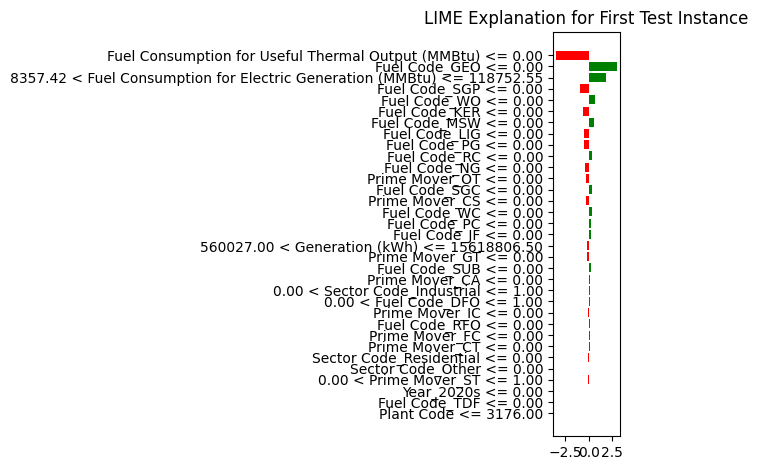

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import lime
from lime import lime_tabular
import matplotlib.pyplot as plt
from google.colab import drive
# Mount Google Drive if needed
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/combined_emissions_data.csv"  # Update with your file path
data = pd.read_csv(file_path)

# Drop useless columns
data = data.drop(columns=['Useful Thermal Output (MMBtu)', 'Quantity of Fuel Consumed', 'Total Fuel Consumption (MMBtu)', 'State'])

# Group Sector Code into broader categories
sector_mapping = {
    1.0: 'Industrial',
    2.0: 'Residential',
    3.0: 'Commercial',
    4.0: 'Industrial',
    5.0: 'Residential',
    6.0: 'Commercial',
    7.0: 'Other'
}
data['Sector Code'] = data['Sector Code'].map(sector_mapping)

# Convert Year into decade grouping
data['Year'] = data['Year'].apply(lambda x: '2010s' if x < 2020 else '2020s')

# Handle missing values
data = data.dropna()

# Log transform Tons of CO2 Emissions to reduce variability
data['log_Tons of CO2 Emissions'] = np.log1p(data['Tons of CO2 Emissions'])
data = data.drop(columns=['Tons of CO2 Emissions'])

# One-hot encode categorical variables
data = pd.get_dummies(data, columns=['Sector Code', 'Prime Mover', 'Fuel Code', 'Year'], drop_first=True)

# Define features and target
X = data.drop(columns=['log_Tons of CO2 Emissions'])
y = data['log_Tons of CO2 Emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ensure all columns are numeric
X_train = X_train.apply(pd.to_numeric, errors='coerce').fillna(0)
X_test = X_test.apply(pd.to_numeric, errors='coerce').fillna(0)

# Train a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")
print(f"Mean Absolute Error: {mae}")

# Use LIME for explanations
explainer = lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=['log_Tons of CO2 Emissions'],
    mode='regression'  # Set mode to 'regression' since this is a regression problem
)

# Explain a single instance in the test set
instance_to_explain = X_test.iloc[0].values  # Choose the first instance for explanation
exp = explainer.explain_instance(instance_to_explain, rf_model.predict, num_features=len(X_train.columns))

# Print the LIME explanation
print("LIME Explanation:")
print(exp.as_list())

# Plot the LIME explanation
exp.as_pyplot_figure()
plt.title("LIME Explanation for First Test Instance")
plt.tight_layout()
plt.show()

# Save the plot
exp.save_to_file('lime_explanation.html')

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import shap
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"  # Use the correct path in your Colab drive
data = pd.read_csv(file_path)

# Drop useless columns
data = data.drop(columns=['Useful Thermal Output (MMBtu)', 'Quantity of Fuel Consumed', 'Total Fuel Consumption (MMBtu)', 'State'])

# Group Sector Code into broader categories
sector_mapping = {
    1.0: 'Industrial',
    2.0: 'Residential',
    3.0: 'Commercial',
    4.0: 'Industrial',
    5.0: 'Residential',
    6.0: 'Commercial',
    7.0: 'Other'
}
data['Sector Code'] = data['Sector Code'].map(sector_mapping)

# Convert Year into decade grouping
data['Year'] = data['Year'].apply(lambda x: '2010s' if x < 2020 else '2020s')

# Handle missing values
data = data.dropna()

# Log transform Tons of CO2 Emissions to reduce variability
data['log_Tons of CO2 Emissions'] = np.log1p(data['Tons of CO2 Emissions'])
data = data.drop(columns=['Tons of CO2 Emissions'])

# One-hot encode categorical variables
data = pd.get_dummies(data, columns=['Sector Code', 'Prime Mover', 'Fuel Code', 'Year'], drop_first=True)

# Define features and target
X = data.drop(columns=['log_Tons of CO2 Emissions'])
y = data['log_Tons of CO2 Emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ensure all columns are numeric
X_train = X_train.apply(pd.to_numeric, errors='coerce').fillna(0)
X_test = X_test.apply(pd.to_numeric, errors='coerce').fillna(0)

# Train a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")
print(f"Mean Absolute Error: {mae}")

# Reduce dataset size for SHAP computation
X_train_small = X_train.sample(frac=0.1, random_state=42)  # Use 10% of the training data
X_test_small = X_test.sample(frac=0.1, random_state=42)   # Use 10% of the testing data

# Ensure reduced datasets are numeric
X_train_small = X_train_small.apply(pd.to_numeric, errors='coerce').fillna(0)
X_test_small = X_test_small.apply(pd.to_numeric, errors='coerce').fillna(0)

# Align feature sets between reduced datasets
common_columns = X_train_small.columns.intersection(X_test_small.columns)
X_train_small = X_train_small[common_columns]
X_test_small = X_test_small[common_columns]

# Explain the model using SHAP with reduced datasets
explainer = shap.TreeExplainer(rf_model)  # Use TreeExplainer for Random Forest
shap_values = explainer.shap_values(X_test_small)  # Use the smaller test dataset

# Plot SHAP summary plot
shap.summary_plot(shap_values, X_test_small, show=False)
plt.savefig("shap_summary_plot.png")
plt.close()

# Plot SHAP dependence plots for key features
for feature in ['Generation (kWh)', 'Fuel Consumption for Electric Generation (MMBtu)', 'Plant Code']:
    shap.dependence_plot(feature, shap_values, X_test_small, interaction_index=None, show=False)
    plt.savefig(f"shap_dependence_{feature}.png")
    plt.close()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Mean Squared Error: 0.018555246678591715
R-squared Score: 0.9988927870907972
Mean Absolute Error: 0.02034955006038664


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
ADF Statistic: -0.526533943818338
p-value: 0.8867337451732045
Critical Value (1%): -3.441277537487585
Critical Value (5%): -2.8663610578661083
Critical Value (10%): -2.5693375106104357
Data is non-stationary. Applying differencing...


<ipython-input-8-f87b4975ffeb>:47: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  coal_data.fillna(method='bfill', inplace=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Determining optimal ARIMA parameters...
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=3370.908, Time=3.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=4341.642, Time=0.05 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3591.607, Time=0.63 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=4010.876, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4339.645, Time=0.04 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=3707.232, Time=3.01 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=3539.429, Time=6.84 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=3372.893, Time=8.58 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(1,0,2)[12] intercept   : AIC=3374.135, Time=11.64 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=3895.332, Time=1.17 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=10.49 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(2,0,0)[12] intercept   : AIC=3471.695, Time=12.20 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(2,0,2)[12] intercept   : AIC=inf, Time=9.40 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=3356.562, Time=6.79 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=3882.823, Time=1.22 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=3538.267, Time=1.97 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(2,0,1)[12] intercept   : AIC=3358.386, Time=11.84 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(1,0,2)[12] intercept   : AIC=3356.838, Time=10.25 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=4179.090, Time=0.98 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(0,0,2)[12] intercept   : AIC=3766.867, Time=3.55 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(2,0,0)[12] intercept   : AIC=3467.052, Time=6.43 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(2,0,2)[12] intercept   : AIC=inf, Time=12.40 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=3359.884, Time=2.50 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=3359.668, Time=6.58 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(1,0,1)[12] intercept   : AIC=3354.508, Time=4.09 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,1)[12] intercept   : AIC=3864.707, Time=1.62 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(1,0,0)[12] intercept   : AIC=3535.666, Time=2.48 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(2,0,1)[12] intercept   : AIC=3355.631, Time=10.72 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(1,0,2)[12] intercept   : AIC=3385.946, Time=13.82 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,0)[12] intercept   : AIC=4131.980, Time=0.56 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,2)[12] intercept   : AIC=3762.390, Time=4.48 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(2,0,0)[12] intercept   : AIC=3465.375, Time=10.63 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(2,0,2)[12] intercept   : AIC=inf, Time=14.58 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,3)(1,0,1)[12] intercept   : AIC=3358.054, Time=2.95 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,3)(1,0,1)[12] intercept   : AIC=3361.645, Time=7.96 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,4)(1,0,1)[12] intercept   : AIC=3358.979, Time=5.12 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,4)(1,0,1)[12] intercept   : AIC=3359.067, Time=4.05 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,4)(1,0,1)[12] intercept   : AIC=3360.638, Time=8.08 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(1,0,1)[12]             : AIC=3351.962, Time=3.22 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,1)[12]             : AIC=3862.876, Time=0.98 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(1,0,0)[12]             : AIC=3533.668, Time=1.10 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(2,0,1)[12]             : AIC=3352.958, Time=7.69 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(1,0,2)[12]             : AIC=3352.546, Time=8.70 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,0)[12]             : AIC=4130.259, Time=0.29 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,2)[12]             : AIC=3760.429, Time=5.65 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(2,0,0)[12]             : AIC=3463.414, Time=2.94 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(2,0,2)[12]             : AIC=inf, Time=8.74 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,3)(1,0,1)[12]             : AIC=3356.076, Time=3.01 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(1,0,1)[12]             : AIC=3353.729, Time=1.54 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,3)(1,0,1)[12]             : AIC=inf, Time=4.14 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,4)(1,0,1)[12]             : AIC=3353.790, Time=3.53 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,2)(1,0,1)[12]             : AIC=3357.902, Time=2.33 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,4)(1,0,1)[12]             : AIC=3357.090, Time=4.16 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12]             : AIC=3368.916, Time=2.85 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,4)(1,0,1)[12]             : AIC=3355.647, Time=3.14 sec

Best model:  ARIMA(1,1,3)(1,0,1)[12]          
Total fit time: 288.342 seconds
Optimal ARIMA parameters: Order=(1, 1, 3), Seasonal Order=(1, 0, 1, 12)
Training ARIMA model...
RMSE: 8.568922408749717
MAE: 6.736371689361244
R2 Score: 0.7121469097728093


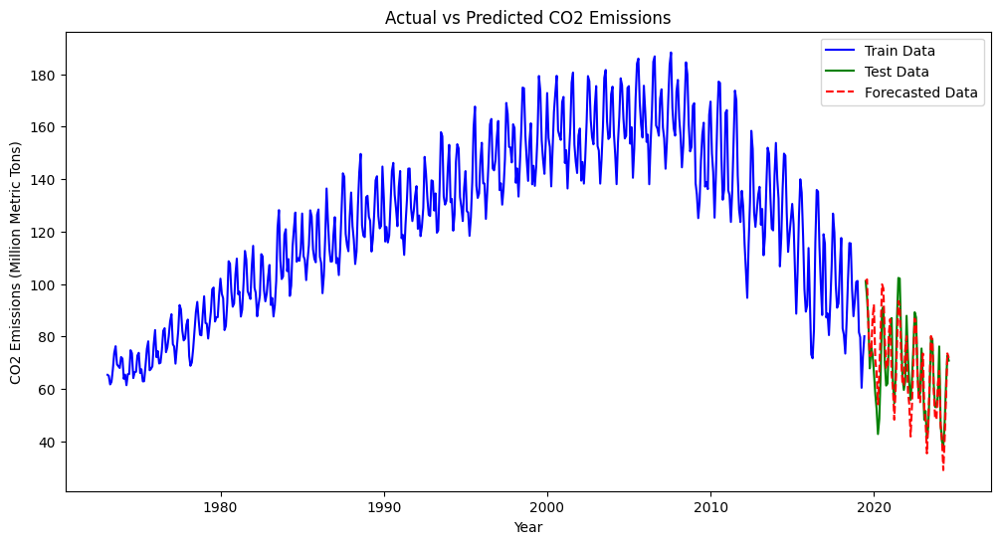

['arima_co2_model.pkl']

In [ ]:
# Import required libraries
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from google.colab import drive
# Mount Google Drive if needed
drive.mount('/content/drive')

# Load the dataset
file_path = '/content/drive/My Drive/MER_T11_06 (1).csv'
data = pd.read_csv(file_path)

# Step 2: Filter relevant data (coal electric power sector emissions)
coal_data = data[data['MSN'] == 'CLEIEUS'].copy()

# Step 3: Clean the data
# Ensure 'YYYYMM' is properly formatted as datetime
coal_data['Date'] = pd.to_datetime(coal_data['YYYYMM'], format='%Y%m', errors='coerce')

# Drop rows with invalid dates
coal_data.dropna(subset=['Date'], inplace=True)

# Remove unnecessary columns
coal_data = coal_data[['Date', 'Value']]

# Set 'Date' as index
coal_data.set_index('Date', inplace=True)

# Sort by date
coal_data.sort_index(inplace=True)

# Convert 'Value' column to numeric, coercing errors to NaN
coal_data['Value'] = pd.to_numeric(coal_data['Value'], errors='coerce')

# Drop rows with NaN values in the 'Value' column
coal_data.dropna(subset=['Value'], inplace=True)

# Resample to monthly start frequency ('MS') and calculate the mean for each month
coal_data = coal_data.resample('MS').mean()

# Handle missing values using backward fill
coal_data.fillna(method='bfill', inplace=True)

# Step 4: Check stationarity (Dickey-Fuller test)
def check_stationarity(series):
    result = adfuller(series.dropna())
    print("ADF Statistic:", result[0])
    print("p-value:", result[1])
    for key, value in result[4].items():
        print(f"Critical Value ({key}): {value}")
    return result[1] < 0.05  # Return True if stationary

is_stationary = check_stationarity(coal_data['Value'])
if not is_stationary:
    print("Data is non-stationary. Applying differencing...")
    coal_data['Value_diff'] = coal_data['Value'].diff().dropna()
    coal_data = coal_data.dropna()  # Remove NaN rows after differencing

# Step 5: Train-test split (90% train, 10% test)
train_size = int(len(coal_data) * 0.9)
train, test = coal_data.iloc[:train_size], coal_data.iloc[train_size:]

# Step 6: Determine ARIMA parameters using auto_arima
print("Determining optimal ARIMA parameters...")
model_auto_arima = auto_arima(
    train['Value'],
    seasonal=True,
    m=12,  # Seasonal period (12 months)
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True
)

order = model_auto_arima.order
seasonal_order = model_auto_arima.seasonal_order
print(f"Optimal ARIMA parameters: Order={order}, Seasonal Order={seasonal_order}")

# Step 7: Train the ARIMA model
print("Training ARIMA model...")
model = ARIMA(train['Value'], order=order, seasonal_order=seasonal_order)
model_fit = model.fit()

# Step 8: Make predictions
forecast = model_fit.forecast(steps=len(test))

# Step 9: Evaluate the model
rmse = np.sqrt(mean_squared_error(test['Value'], forecast))
mae = mean_absolute_error(test['Value'], forecast)
r2 = r2_score(test['Value'], forecast)

print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R2 Score: {r2}")

# Step 10: Plot actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['Value'], label='Train Data', color='blue')
plt.plot(test.index, test['Value'], label='Test Data', color='green')
plt.plot(test.index, forecast, label='Forecasted Data', color='red', linestyle='--')
plt.title('Actual vs Predicted CO2 Emissions')
plt.xlabel('Year')
plt.ylabel('CO2 Emissions (Million Metric Tons)')
plt.legend()
plt.show()

# Save the trained model
import joblib
joblib.dump(model_fit, 'arima_co2_model.pkl')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
MSE: 0.1925389057021891
R²: 0.988910742422585


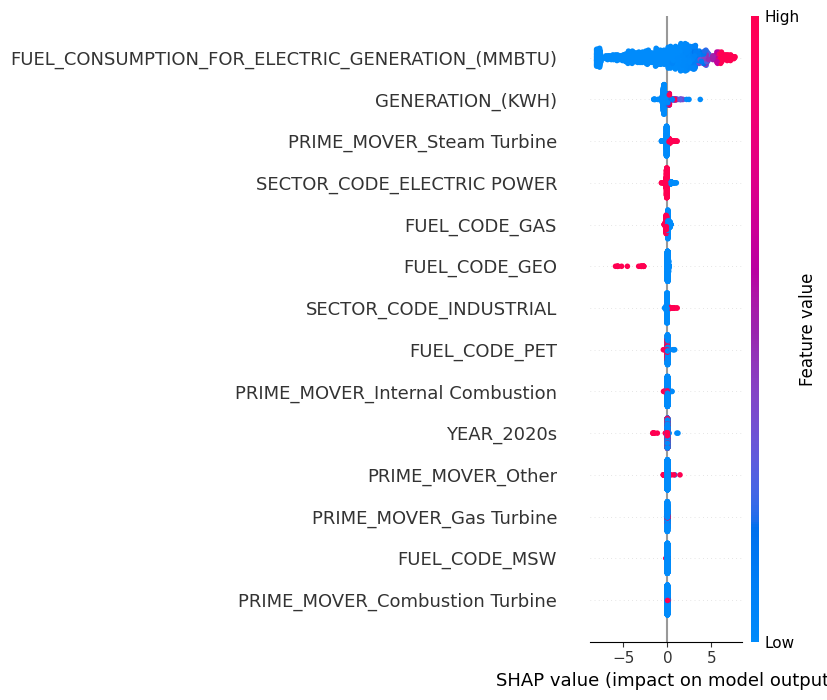

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

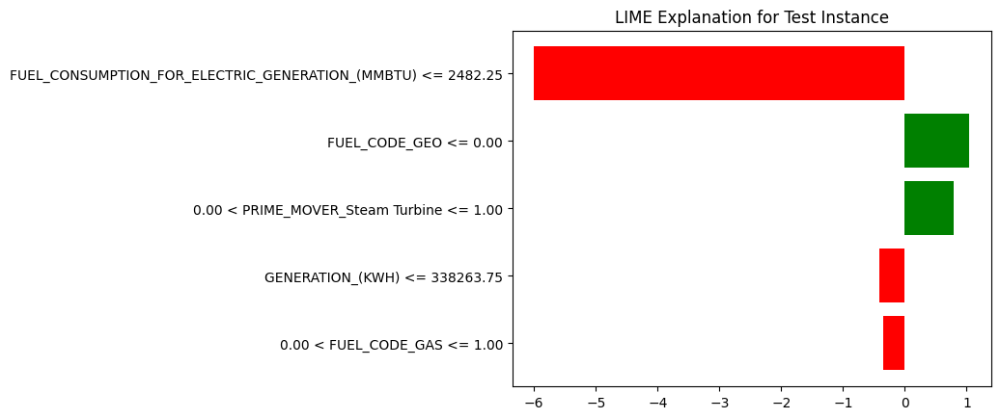

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import shap
import lime
from lime import lime_tabular
import matplotlib.pyplot as plt
from google.colab import drive
# Mount Google Drive if needed
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"  # Update with your file path
data = pd.read_csv(file_path)

# Define features and target
X = data.drop(columns=['TONS_OF_CO2_EMISSIONS'])
y = data['TONS_OF_CO2_EMISSIONS']

# Encode categorical features
categorical_cols = ['SECTOR_CODE', 'PRIME_MOVER', 'FUEL_CODE', 'YEAR']
X_encoded = pd.get_dummies(X, columns=categorical_cols, drop_first=True)

# Log transform target to reduce skewness
y_log = np.log1p(y)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y_log, test_size=0.2, random_state=42)

# Train Random Forest
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)
print(f"MSE: {mean_squared_error(y_test, y_pred)}")
print(f"R²: {r2_score(y_test, y_pred)}")

# Use 10% of the test data for SHAP computations
shap_sample_size = int(len(X_test) * 0.1)  # 10% of the test data
shap_data = X_test.sample(n=shap_sample_size, random_state=42)

# Initialize SHAP explainer with the subset
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(shap_data)

# Global feature importance
shap.summary_plot(shap_values, shap_data)

# Local explanation for a single prediction
sample_index = 0  # Change this index to analyze a different sample
shap.force_plot(explainer.expected_value, shap_values[sample_index], shap_data.iloc[sample_index])

# LIME Analysis
explainer_lime = lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns,
    class_names=['log_CO2'],
    mode='regression'
)
exp = explainer_lime.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=model.predict,
    num_features=5
)
exp.save_to_file('lime_explanation.html')
exp.as_pyplot_figure()
plt.title("LIME Explanation for Test Instance")
plt.savefig("lime_explanation.png")

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=1d8e841a3fe0b972af68030fd3f73e879eeec082b702aeccec83835041598436
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


# **MODEL SELECTION**

In [ ]:
!pip install -U pymoo

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 8.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 47.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.1/249.1 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 8.0 MB/s eta 0:00:00
  Created wheel for grapheme: filename=grapheme-0.6.0-py3-none-any.whl size=210082 sha256=c9e9938121fd29d710b34a6678ddf1c90f5c0012067406e3a4d86244e8efd7f3
  Stored in directory: /root/.cache/pip/wheels/ee/3b/0b/1b865800e916d671a24028d884698674138632a83fdfad4926
Successfully built grapheme


Debug: Assigned bounds - xl: [0 0], xu: [2.08729126e+10 2.26778710e+07]
Lower bounds (xl): [0 0]
Upper bounds (xu): [2.08729126e+10 2.26778710e+07]
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      8 |             - |             -
     2 |      200 |      9 |  0.0475685993 |             f
     3 |      300 |      3 |  0.3097146385 |         ideal
     4 |      400 |      3 |  0.4355512456 |         ideal
     5 |      500 |      7 |  0.0062709024 |         ideal
     6 |      600 |      6 |  0.3272871151 |         nadir
     7 |      700 |      9 |  0.0032235309 |         ideal
     8 |      800 |      8 |  6.3734832898 |         nadir
     9 |      900 |      7 |  0.9436716633 |         nadir
    10 |     1000 |      8 |  5.6008977956 |         nadir
    11 |     1100 |      7 |  0.8485054562 |         nadir
    12 |     1200 |      7 |  1.673084E+01 |         nadir
    13 |     1300 |      8 |  0.9026682520 |         nadir
    14 |     1400 |      5

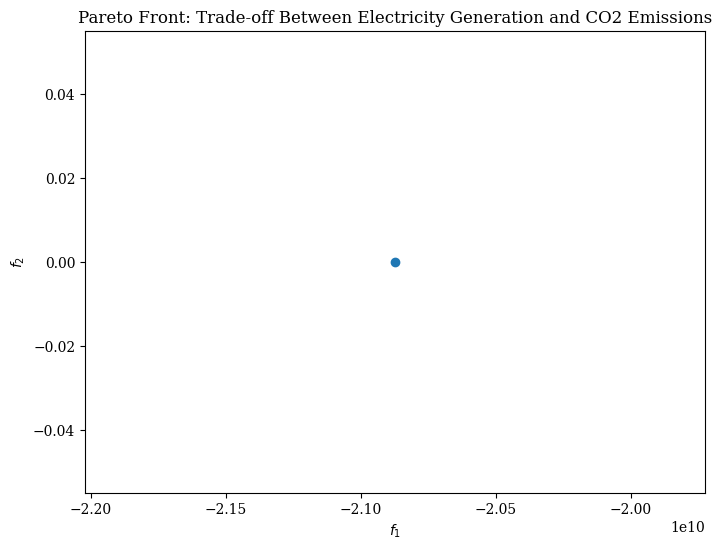

In [ ]:
import pandas as pd
import numpy as np
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.core.problem import Problem
from pymoo.optimize import minimize
from pymoo.visualization.scatter import Scatter

class EmissionsProblem(Problem):
    def __init__(self, data):
        super().__init__(n_var=2, n_obj=2, n_constr=0)
        self.data = data

        # Calculate and assign bounds explicitly
        try:
            self.xl = np.array([0, 0])  # Lower bounds: [0, 0]
            self.xu = np.array([
                max(self.data['GENERATION_(KWH)'].max(), 1),
                max(self.data['TONS_OF_CO2_EMISSIONS'].max(), 1)
            ])  # Upper bounds: [max(GENERATION), max(CO2)]
            print(f"Debug: Assigned bounds - xl: {self.xl}, xu: {self.xu}")
        except Exception as e:
            print(f"Error calculating bounds: {e}")
            self.xl = np.array([0, 0])  # Default lower bounds
            self.xu = np.array([1e12, 1e12])  # Default upper bounds

    def _evaluate(self, x, out, *args, **kwargs):
        obj1 = -x[:, 0]  # Maximize electricity generation
        obj2 = x[:, 1]   # Minimize CO2 emissions
        out["F"] = np.column_stack([obj1, obj2])

    def has_bounds(self):
        """
        Return True if the problem has variable bounds.
        """
        return True

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"
data = pd.read_csv(file_path)

# Validate the dataset
if 'GENERATION_(KWH)' not in data.columns or 'TONS_OF_CO2_EMISSIONS' not in data.columns:
    raise ValueError("Dataset must contain 'GENERATION_(KWH)' and 'TONS_OF_CO2_EMISSIONS' columns.")

data = data.dropna(subset=['GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS'])
data = data[(data['GENERATION_(KWH)'] > 0) & (data['TONS_OF_CO2_EMISSIONS'] > 0)]

if data.empty:
    raise ValueError("Dataset is empty after filtering. Ensure there are valid positive values.")

# Initialize the problem
problem = EmissionsProblem(data)

# Define the NSGA-II algorithm
algorithm = NSGA2(
    pop_size=100,
    eliminate_duplicates=True
)

# Print the bounds before running the optimization
print("Lower bounds (xl):", problem.xl)
print("Upper bounds (xu):", problem.xu)

# Run the optimization
res = minimize(
    problem,
    algorithm,
    ('n_gen', 100),  # Number of generations
    verbose=True
)

# Extract and visualize the Pareto front
pareto_front = res.F
plot = Scatter(title="Pareto Front: Trade-off Between Electricity Generation and CO2 Emissions")
plot.add(pareto_front, label="Pareto Front")
plot.show()

# Print the Pareto-optimal solutions
pareto_optimal_solutions = res.X
print("Pareto-Optimal Solutions:")
print(pareto_optimal_solutions)

Sensitivity Analysis Results:
Weights: w1=0.9, w2=0.1, MSE: 4406282.2335, R2: 0.9474
Weights: w1=0.8, w2=0.2, MSE: 34704890.2600, R2: 0.8965
Weights: w1=0.7, w2=0.3, MSE: 39122223.3481, R2: 0.9481
Weights: w1=0.6, w2=0.4, MSE: 71959589.9706, R2: 0.9463


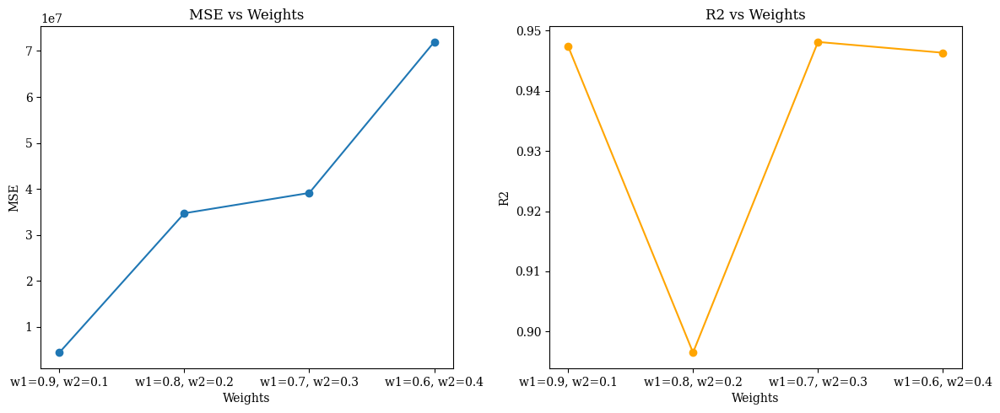

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Drop non-numeric columns
    non_numeric_columns = ['PLANT_NAME', 'STATE', 'SECTOR_GROUP', 'PRIME_MOVER', 'FUEL_CODE', 'AGGREGATED_FUEL_GROUP']
    df = df.drop(columns=non_numeric_columns, errors='ignore')

    # Aggregate fuel-specific consumption columns
    fuel_columns = [
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]
    df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'] = df[fuel_columns].sum(axis=1)

    # Normalize Carbon Intensity
    df['Normalized_Carbon_Intensity'] = (
        df['TONS_OF_CO2_EMISSIONS'] / df['GENERATION_(KWH)']
    )

    # Normalize Fuel Efficiency
    df['Normalized_Fuel_Efficiency'] = (
        df['GENERATION_(KWH)'] / df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    )

    return df

# Load the dataset (replace 'cleaned_emissions_data.csv' with your actual file path)
file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
df = pd.read_csv(file_path)

# Preprocess the data
df = preprocess_data(df)

# Step 2: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    return df

# Step 3: Train the Random Forest Model
def train_random_forest(X_train, X_test, y_train, y_test):
    # Initialize and train the model
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = rf_model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return rf_model, mse, r2

# Step 4: Sensitivity Analysis
def sensitivity_analysis(df, weight_combinations):
    results = []
    for w1, w2 in weight_combinations:
        # Compute Objective Function Score
        df = compute_objective_function(df, w1, w2)

        # Features (X) and Target (y)
        numeric_features = [
            'GENERATION_(KWH)',
            'TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'TONS_OF_CO2_EMISSIONS',
            'Normalized_Carbon_Intensity',
            'Normalized_Fuel_Efficiency'
        ]
        X = df[numeric_features]
        y = df['Objective_Function_Score']

        # Train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        # Train the model
        _, mse, r2 = train_random_forest(X_train, X_test, y_train, y_test)
        results.append((w1, w2, mse, r2))

    return results

# Main Pipeline
if __name__ == "__main__":
    # Weight combinations for sensitivity analysis
    weight_combinations = [
        (0.9, 0.1),  # Strong emphasis on carbon intensity
        (0.8, 0.2),  # Moderate emphasis on carbon intensity
        (0.7, 0.3),  # Balanced emphasis
        (0.6, 0.4),  # Slightly less emphasis on carbon intensity
    ]

    # Perform sensitivity analysis
    results = sensitivity_analysis(df, weight_combinations)

    # Display sensitivity analysis results
    print("Sensitivity Analysis Results:")
    for w1, w2, mse, r2 in results:
        print(f"Weights: w1={w1}, w2={w2}, MSE: {mse:.4f}, R2: {r2:.4f}")

    # Visualize sensitivity analysis
    weights = [f"w1={w1}, w2={w2}" for w1, w2, _, _ in results]
    mse_values = [mse for _, _, mse, _ in results]
    r2_values = [r2 for _, _, _, r2 in results]

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(weights, mse_values, marker='o')
    plt.title("MSE vs Weights")
    plt.xlabel("Weights")
    plt.ylabel("MSE")

    plt.subplot(1, 2, 2)
    plt.plot(weights, r2_values, marker='o', color='orange')
    plt.title("R2 vs Weights")
    plt.xlabel("Weights")
    plt.ylabel("R2")

    plt.tight_layout()
    plt.show()

Sensitivity Analysis Results:
Weights: w1=0.9, w2=0.1, MSE: 0.0000, R2: 0.8941
Weights: w1=0.8, w2=0.2, MSE: 0.0000, R2: 0.8817
Weights: w1=0.7, w2=0.3, MSE: 0.0000, R2: 0.9036
Weights: w1=0.6, w2=0.4, MSE: 0.0000, R2: 0.8877


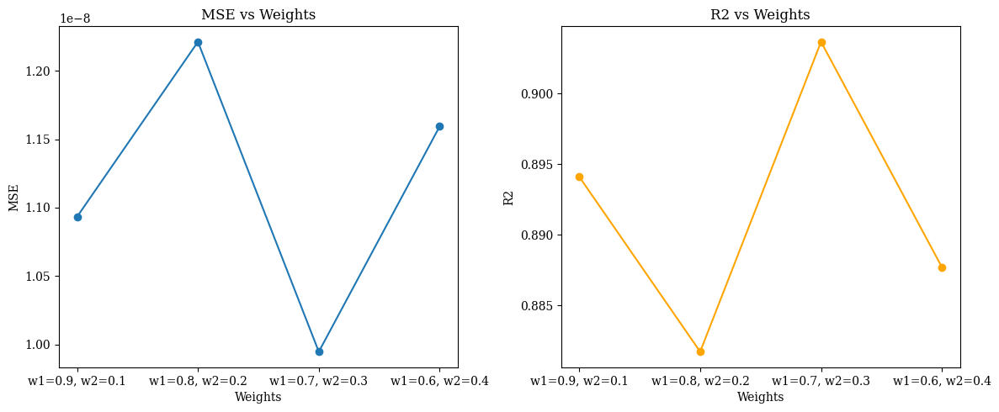

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Drop non-numeric columns
    non_numeric_columns = [
        'PLANT_NAME', 'STATE', 'SECTOR_GROUP', 'PRIME_MOVER', 'FUEL_CODE', 'AGGREGATED_FUEL_GROUP'
    ]
    df = df.drop(columns=non_numeric_columns, errors='ignore')

    # Aggregate fuel-specific consumption columns
    fuel_columns = [
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]
    df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'] = df[fuel_columns].sum(axis=1)

    # Normalize Carbon Intensity
    df['Normalized_Carbon_Intensity'] = (
        df['TONS_OF_CO2_EMISSIONS'] / df['GENERATION_(KWH)']
    )

    # Normalize Fuel Efficiency
    df['Normalized_Fuel_Efficiency'] = (
        df['GENERATION_(KWH)'] / df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    )

    return df

# Step 2: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    # Normalize Objective Function Score
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 3: Train the Random Forest Model
def train_random_forest(X_train, X_test, y_train, y_test):
    # Initialize and train the model
    rf_model = RandomForestRegressor(
        n_estimators=200, max_depth=10, min_samples_split=5, random_state=42
    )
    rf_model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = rf_model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return rf_model, mse, r2

# Step 4: Sensitivity Analysis
def sensitivity_analysis(df, weight_combinations):
    results = []
    for w1, w2 in weight_combinations:
        # Compute Objective Function Score
        df = compute_objective_function(df, w1, w2)

        # Features (X) and Target (y)
        numeric_features = [
            'GENERATION_(KWH)',
            'TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'TONS_OF_CO2_EMISSIONS',
            'Normalized_Carbon_Intensity',
            'Normalized_Fuel_Efficiency'
        ]
        X = df[numeric_features]
        y = df['Normalized_Objective_Function_Score']

        # Scale Features
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        # Train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42
        )

        # Train the model
        _, mse, r2 = train_random_forest(X_train, X_test, y_train, y_test)
        results.append((w1, w2, mse, r2))

    return results

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset (replace 'cleaned_emissions_data.csv' with your actual file path)
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Weight combinations for sensitivity analysis
    weight_combinations = [
        (0.9, 0.1),  # Strong emphasis on carbon intensity
        (0.8, 0.2),  # Moderate emphasis on carbon intensity
        (0.7, 0.3),  # Balanced emphasis
        (0.6, 0.4),  # Slightly less emphasis on carbon intensity
    ]

    # Perform sensitivity analysis
    results = sensitivity_analysis(df, weight_combinations)

    # Display sensitivity analysis results
    print("Sensitivity Analysis Results:")
    for w1, w2, mse, r2 in results:
        print(f"Weights: w1={w1}, w2={w2}, MSE: {mse:.4f}, R2: {r2:.4f}")

    # Visualize sensitivity analysis
    weights = [f"w1={w1}, w2={w2}" for w1, w2, _, _ in results]
    mse_values = [mse for _, _, mse, _ in results]
    r2_values = [r2 for _, _, _, r2 in results]

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(weights, mse_values, marker='o')
    plt.title("MSE vs Weights")
    plt.xlabel("Weights")
    plt.ylabel("MSE")

    plt.subplot(1, 2, 2)
    plt.plot(weights, r2_values, marker='o', color='orange')
    plt.title("R2 vs Weights")
    plt.xlabel("Weights")
    plt.ylabel("R2")

    plt.tight_layout()
    plt.show()

Sensitivity Analysis Results:
Weights: w1=0.9, w2=0.1, MSE: 0.00000001, R2: 0.8939
Weights: w1=0.8, w2=0.2, MSE: 0.00000001, R2: 0.8854
Weights: w1=0.7, w2=0.3, MSE: 0.00000001, R2: 0.8812
Weights: w1=0.6, w2=0.4, MSE: 0.00000001, R2: 0.8927


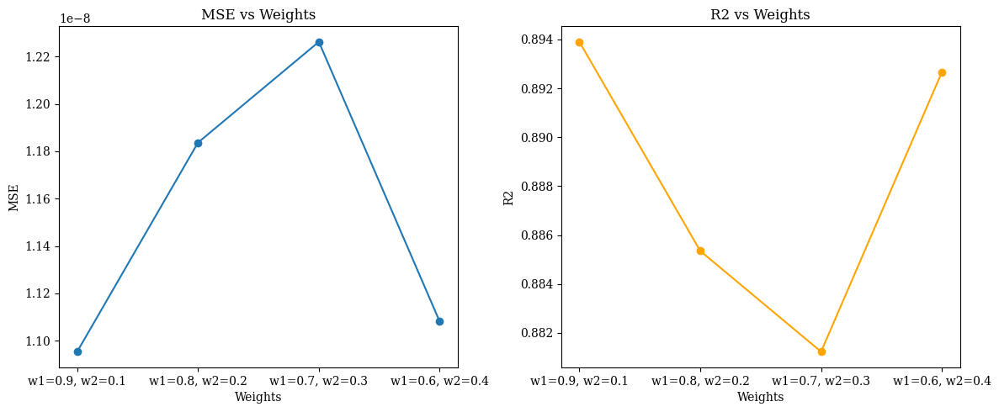

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Drop non-numeric columns
    non_numeric_columns = ['PLANT_NAME', 'STATE', 'SECTOR_GROUP', 'PRIME_MOVER', 'FUEL_CODE', 'AGGREGATED_FUEL_GROUP']
    df = df.drop(columns=non_numeric_columns, errors='ignore')

    # Aggregate fuel-specific consumption columns
    fuel_columns = [
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]
    df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'] = df[fuel_columns].sum(axis=1)

    # Normalize Carbon Intensity
    df['Normalized_Carbon_Intensity'] = (
        df['TONS_OF_CO2_EMISSIONS'] / df['GENERATION_(KWH)']
    )

    # Normalize Fuel Efficiency
    df['Normalized_Fuel_Efficiency'] = (
        df['GENERATION_(KWH)'] / df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    )

    return df

# Step 2: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    # Normalize Objective Function Score
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 3: Train the Random Forest Model
def train_random_forest(X_train, X_test, y_train, y_test):
    # Initialize and train the model
    rf_model = RandomForestRegressor(
        n_estimators=100, max_depth=10, min_samples_split=5, random_state=42
    )
    rf_model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = rf_model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return rf_model, mse, r2

# Step 4: Sensitivity Analysis
def sensitivity_analysis(df, weight_combinations):
    results = []
    for w1, w2 in weight_combinations:
        # Compute Objective Function Score
        df = compute_objective_function(df, w1, w2)

        # Features (X) and Target (y)
        numeric_features = [
            'GENERATION_(KWH)',
            'TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'TONS_OF_CO2_EMISSIONS',
            'Normalized_Carbon_Intensity',
            'Normalized_Fuel_Efficiency'
        ]
        X = df[numeric_features]
        y = df['Normalized_Objective_Function_Score']

        # Train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        # Train the model
        _, mse, r2 = train_random_forest(X_train, X_test, y_train, y_test)
        results.append((w1, w2, mse, r2))

    return results

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Weight combinations for sensitivity analysis
    weight_combinations = [
        (0.9, 0.1),  # Strong emphasis on carbon intensity
        (0.8, 0.2),  # Moderate emphasis on carbon intensity
        (0.7, 0.3),  # Balanced emphasis
        (0.6, 0.4),  # Slightly less emphasis on carbon intensity
    ]

    # Perform sensitivity analysis
    results = sensitivity_analysis(df, weight_combinations)

    # Display sensitivity analysis results
    print("Sensitivity Analysis Results:")
    for w1, w2, mse, r2 in results:
        print(f"Weights: w1={w1}, w2={w2}, MSE: {mse:.8f}, R2: {r2:.4f}")

    # Visualize sensitivity analysis
    weights = [f"w1={w1}, w2={w2}" for w1, w2, _, _ in results]
    mse_values = [mse for _, _, mse, _ in results]
    r2_values = [r2 for _, _, _, r2 in results]

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(weights, mse_values, marker='o')
    plt.title("MSE vs Weights")
    plt.xlabel("Weights")
    plt.ylabel("MSE")

    plt.subplot(1, 2, 2)
    plt.plot(weights, r2_values, marker='o', color='orange')
    plt.title("R2 vs Weights")
    plt.xlabel("Weights")
    plt.ylabel("R2")

    plt.tight_layout()
    plt.show()

In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.4 MB/s eta 0:00:00


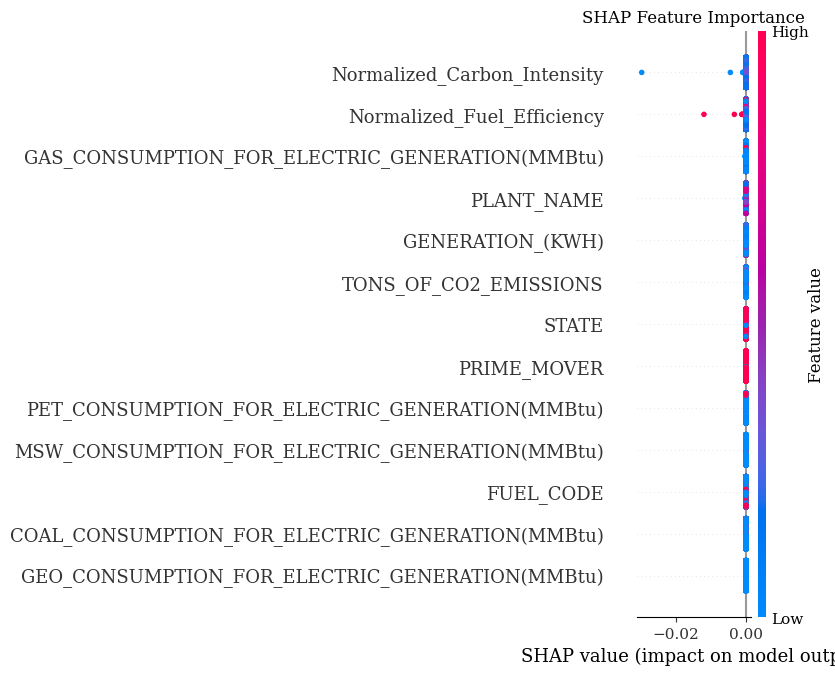

Sensitivity Analysis Results:
Weights: w1=0.9, w2=0.1, MSE: 0.00000001, R2: 0.8991


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from category_encoders import TargetEncoder
import shap
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Aggregate fuel-specific consumption columns
    fuel_columns = [
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]
    df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'] = df[fuel_columns].sum(axis=1)

    # Normalize Carbon Intensity
    df['Normalized_Carbon_Intensity'] = (
        df['TONS_OF_CO2_EMISSIONS'] / df['GENERATION_(KWH)']
    )

    # Normalize Fuel Efficiency
    df['Normalized_Fuel_Efficiency'] = (
        df['GENERATION_(KWH)'] / df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    )

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    # Target encode categorical features
    categorical_features = ['PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE']
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    # Normalize Objective Function Score
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 4: Train the Random Forest Model
def train_random_forest(X_train, X_test, y_train, y_test):
    # Initialize and train the model
    rf_model = RandomForestRegressor(
        n_estimators=200, max_depth=10, min_samples_split=5, random_state=42
    )
    rf_model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = rf_model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return rf_model, mse, r2

# Step 5: Perform SHAP Analysis
def perform_shap_analysis(rf_model, X_test):
    explainer = shap.TreeExplainer(rf_model)
    shap_values = explainer.shap_values(X_test)

    # Summary plot
    shap.summary_plot(shap_values, X_test, show=False)
    plt.title("SHAP Feature Importance")
    plt.show()

# Step 6: Sensitivity Analysis with Encoding and SHAP
def sensitivity_analysis_with_encoding(df, weight_combinations):
    results = []
    for w1, w2 in weight_combinations:
        # Compute Objective Function Score
        df = compute_objective_function(df, w1, w2)

        # Encode categorical features
        df = encode_categorical_features(df)

        # Features (X) and Target (y)
        numeric_features = [
            'GENERATION_(KWH)',
            'TONS_OF_CO2_EMISSIONS',
            'Normalized_Carbon_Intensity',
            'Normalized_Fuel_Efficiency',
            'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE'
        ]
        X = df[numeric_features]
        y = df['Normalized_Objective_Function_Score']

        # Train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        # Train the model
        rf_model, mse, r2 = train_random_forest(X_train, X_test, y_train, y_test)

        # Perform SHAP analysis
        perform_shap_analysis(rf_model, X_test)

        results.append((w1, w2, mse, r2))

    return results

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Weight combinations for sensitivity analysis
    weight_combinations = [
        (0.9, 0.1),  # Strong emphasis on carbon intensity
    ]

    # Perform sensitivity analysis
    results = sensitivity_analysis_with_encoding(df, weight_combinations)

    # Display sensitivity analysis results
    print("Sensitivity Analysis Results:")
    for w1, w2, mse, r2 in results:
        print(f"Weights: w1={w1}, w2={w2}, MSE: {mse:.8f}, R2: {r2:.4f}")

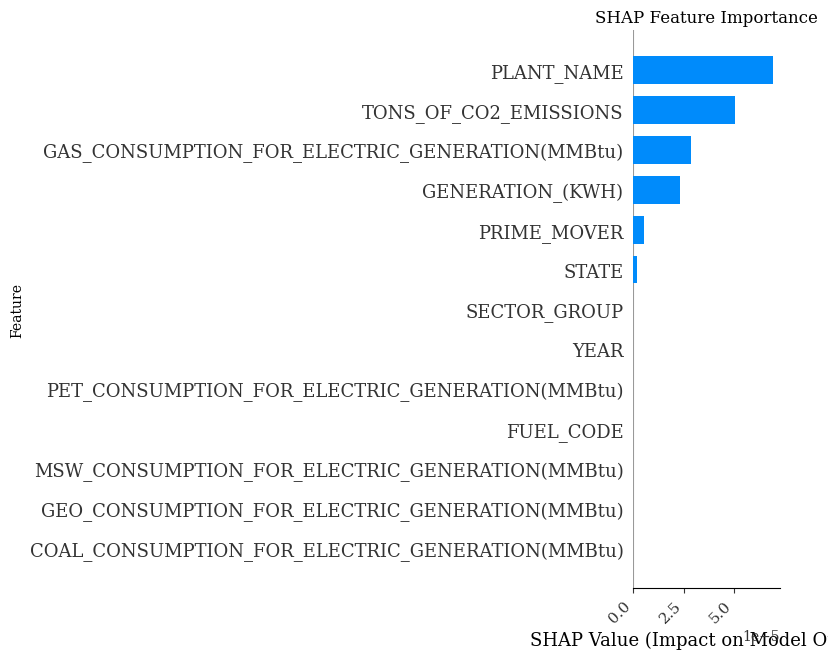

Sensitivity Analysis Results:
Weights: w1=0.9, w2=0.1, MSE: 0.00000098, R2: -8.5003


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from category_encoders import TargetEncoder
import shap
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Aggregate fuel-specific consumption columns
    fuel_columns = [
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]
    df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'] = df[fuel_columns].sum(axis=1)

    # Normalize Carbon Intensity
    df['Normalized_Carbon_Intensity'] = (
        df['TONS_OF_CO2_EMISSIONS'] / df['GENERATION_(KWH)']
    )

    # Normalize Fuel Efficiency
    df['Normalized_Fuel_Efficiency'] = (
        df['GENERATION_(KWH)'] / df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    )

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    # Target encode categorical features
    categorical_features = [
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    # Normalize Objective Function Score
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 4: Train the Random Forest Model
def train_random_forest(X_train, X_test, y_train, y_test):
    # Initialize and train the model
    rf_model = RandomForestRegressor(
        n_estimators=200, max_depth=10, min_samples_split=5, random_state=42
    )
    rf_model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = rf_model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return rf_model, mse, r2

# Step 5: Perform SHAP Analysis
def perform_shap_analysis(rf_model, X_test):
    explainer = shap.TreeExplainer(rf_model)
    shap_values = explainer.shap_values(X_test)

    # Summary plot
    plt.figure(figsize=(10, 8))
    shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
    plt.title("SHAP Feature Importance")
    plt.xlabel("SHAP Value (Impact on Model Output)")
    plt.ylabel("Feature")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Step 6: Sensitivity Analysis with Encoding and SHAP
def sensitivity_analysis_with_encoding(df, weight_combinations):
    results = []
    for w1, w2 in weight_combinations:
        # Compute Objective Function Score
        df = compute_objective_function(df, w1, w2)

        # Encode categorical features
        df = encode_categorical_features(df)

        # Features (X) and Target (y)
        numeric_features = [
            'GENERATION_(KWH)',
            'TONS_OF_CO2_EMISSIONS',
            'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
        ]
        X = df[numeric_features]
        y = df['Normalized_Objective_Function_Score']

        # Train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        # Train the model
        rf_model, mse, r2 = train_random_forest(X_train, X_test, y_train, y_test)

        # Perform SHAP analysis
        perform_shap_analysis(rf_model, X_test)

        results.append((w1, w2, mse, r2))

    return results

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Weight combinations for sensitivity analysis
    weight_combinations = [
        (0.9, 0.1),  # Strong emphasis on carbon intensity
    ]

    # Perform sensitivity analysis
    results = sensitivity_analysis_with_encoding(df, weight_combinations)

    # Display sensitivity analysis results
    print("Sensitivity Analysis Results:")
    for w1, w2, mse, r2 in results:
        print(f"Weights: w1={w1}, w2={w2}, MSE: {mse:.8f}, R2: {r2:.4f}")

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=1c7fbd82a956cc76faea9d9b0a92a60d15edf5f9927751720373f3266bf1afdc
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


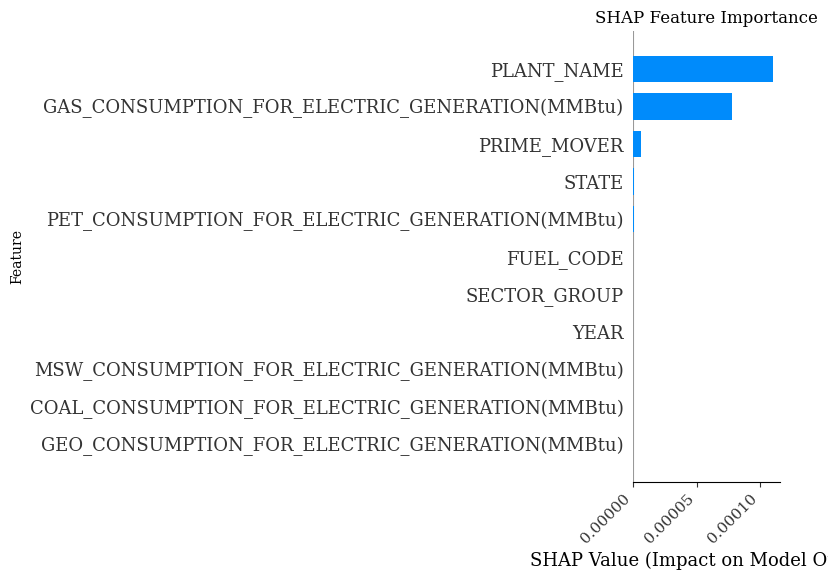

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

Sensitivity Analysis Results:
Weights: w1=0.9, w2=0.1, MSE: 0.00000026, R2: -1.5239


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from category_encoders import TargetEncoder
import shap
import lime
from lime import lime_tabular
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Aggregate fuel-specific consumption columns
    fuel_columns = [
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]
    df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'] = df[fuel_columns].sum(axis=1)

    # Normalize Carbon Intensity
    df['Normalized_Carbon_Intensity'] = (
        df['TONS_OF_CO2_EMISSIONS'] / df['GENERATION_(KWH)']
    )

    # Normalize Fuel Efficiency
    df['Normalized_Fuel_Efficiency'] = (
        df['GENERATION_(KWH)'] / df['TOTAL_FUEL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    )

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    # Target encode categorical features
    categorical_features = [
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    # Normalize Objective Function Score
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 4: Train the Random Forest Model
def train_random_forest(X_train, X_test, y_train, y_test):
    # Initialize and train the model
    rf_model = RandomForestRegressor(
        n_estimators=200, max_depth=10, min_samples_split=5, random_state=42
    )
    rf_model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = rf_model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return rf_model, mse, r2

# Step 5: Perform SHAP Analysis
def perform_shap_analysis(rf_model, X_test):
    explainer = shap.TreeExplainer(rf_model)
    shap_values = explainer.shap_values(X_test)

    # Summary plot
    plt.figure(figsize=(10, 8))
    shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
    plt.title("SHAP Feature Importance")
    plt.xlabel("SHAP Value (Impact on Model Output)")
    plt.ylabel("Feature")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Step 6: Perform LIME Analysis
def perform_lime_analysis(rf_model, X_train, X_test, feature_names):
    # Create a LIME explainer
    explainer = lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=feature_names,
        class_names=['Objective_Function_Score'],
        mode='regression',
        random_state=42
    )

    # Explain the first instance in the test set
    i = 0  # Index of the instance to explain
    exp = explainer.explain_instance(
        data_row=X_test.iloc[i],
        predict_fn=rf_model.predict
    )
    exp.show_in_notebook(show_table=True)

# Step 7: Sensitivity Analysis with Encoding, SHAP, and LIME
def sensitivity_analysis_with_encoding(df, weight_combinations):
    results = []
    for w1, w2 in weight_combinations:
        # Compute Objective Function Score
        df = compute_objective_function(df, w1, w2)

        # Encode categorical features
        df = encode_categorical_features(df)

        # Features (X) and Target (y)
        numeric_features = [
            'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
            'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
        ]
        X = df[numeric_features]
        y = df['Normalized_Objective_Function_Score']

        # Train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        # Train the model
        rf_model, mse, r2 = train_random_forest(X_train, X_test, y_train, y_test)

        # Perform SHAP analysis
        perform_shap_analysis(rf_model, X_test)

        # Perform LIME analysis
        perform_lime_analysis(rf_model, X_train, X_test, numeric_features)

        results.append((w1, w2, mse, r2))

    return results

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Weight combinations for sensitivity analysis
    weight_combinations = [
        (0.9, 0.1),  # Strong emphasis on carbon intensity
    ]

    # Perform sensitivity analysis
    results = sensitivity_analysis_with_encoding(df, weight_combinations)

    # Display sensitivity analysis results
    print("Sensitivity Analysis Results:")
    for w1, w2, mse, r2 in results:
        print(f"Weights: w1={w1}, w2={w2}, MSE: {mse:.8f}, R2: {r2:.4f}")

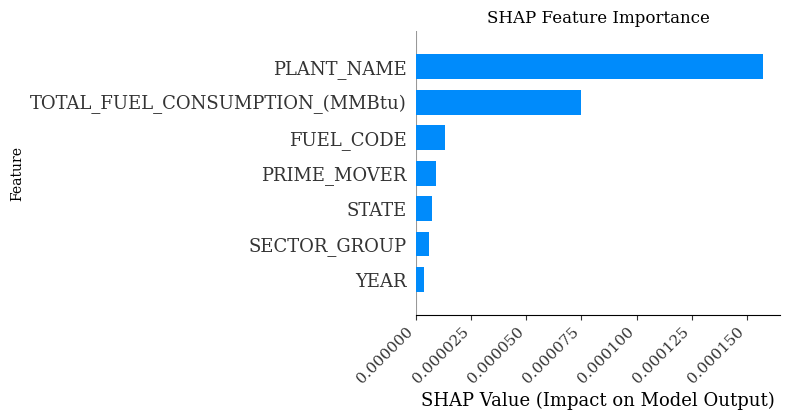

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

Sensitivity Analysis Results:
Weights: w1=0.9, w2=0.1, MSE: 0.00008784, R2: 0.3104


<Figure size 1200x800 with 0 Axes>

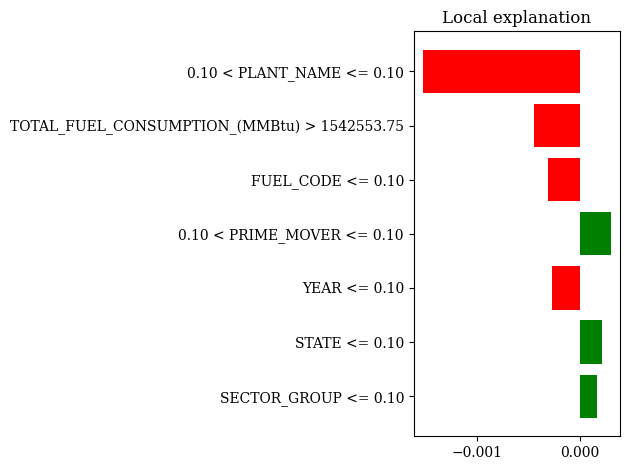

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from category_encoders import TargetEncoder
import shap
import lime
from lime import lime_tabular
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Normalize Carbon Intensity
    df['Normalized_Carbon_Intensity'] = (
        df['CARBON_INTENSITY'] - df['CARBON_INTENSITY'].min()
    ) / (df['CARBON_INTENSITY'].max() - df['CARBON_INTENSITY'].min())

    # Normalize Fuel Efficiency
    df['Normalized_Fuel_Efficiency'] = (
        df['FUEL_EFFICIENCY'] - df['FUEL_EFFICIENCY'].min()
    ) / (df['FUEL_EFFICIENCY'].max() - df['FUEL_EFFICIENCY'].min())

    # Aggregate fuel-specific consumption columns into TOTAL_FUEL_CONSUMPTION_(MMBtu)
    df['TOTAL_FUEL_CONSUMPTION_(MMBtu)'] = df[
        ['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    ].sum(axis=1)

    # Drop separate fuel consumption columns
    df = df.drop(columns=[
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ])

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    categorical_features = [
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 4: Train the Random Forest Model
def train_random_forest(X_train, X_test, y_train, y_test):
    rf_model = RandomForestRegressor(
        n_estimators=200, max_depth=10, min_samples_split=5, random_state=42
    )
    rf_model.fit(X_train, y_train)
    y_pred = rf_model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return rf_model, mse, r2

# Step 5: Perform SHAP Analysis
def perform_shap_analysis(rf_model, X_test):
    explainer = shap.TreeExplainer(rf_model)
    shap_values = explainer.shap_values(X_test)

    # Improved SHAP Summary Plot
    plt.figure(figsize=(12, 10))
    shap.summary_plot(shap_values, X_test, plot_type="bar", max_display=10, show=False)
    plt.title("SHAP Feature Importance")
    plt.xlabel("SHAP Value (Impact on Model Output)")
    plt.ylabel("Feature")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Step 6: Perform LIME Analysis
def perform_lime_analysis(rf_model, X_train, X_test, feature_names):

# Initialize the LIME explainer
    explainer = lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=X_train.columns,
        class_names=['Objective_Function_Score'],
        mode='regression',
        random_state=42
    )

    # Explain a specific instance
    exp = explainer.explain_instance(
        data_row=X_test.iloc[0],
        predict_fn=rf_model.predict,
        num_features=10  # Limit to top 10 features
    )

    # Display the explanation
    exp.show_in_notebook(show_table=True)

    # Save the LIME explanation as an image
    exp.save_to_file("lime_explanation.png")  # Saves the explanation as an image

    # Alternatively, if you want to save it programmatically using Matplotlib
    plt.figure(figsize=(12, 8))
    exp.as_pyplot_figure()
    plt.tight_layout()
    plt.savefig("lime_explanation.png", dpi=300)  # Save the figure with high resolution

# Step 7: Sensitivity Analysis with Encoding, SHAP, and LIME
def sensitivity_analysis_with_encoding(df, weight_combinations):
    results = []
    for w1, w2 in weight_combinations:
        df = compute_objective_function(df, w1, w2)
        df = encode_categorical_features(df)

        # Features (X) and Target (y)
        numeric_features = [
            'TOTAL_FUEL_CONSUMPTION_(MMBtu)',
            'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
        ]
        X = df[numeric_features]
        y = df['Normalized_Objective_Function_Score']

        # Train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        # Train the model
        rf_model, mse, r2 = train_random_forest(X_train, X_test, y_train, y_test)
        perform_shap_analysis(rf_model, X_test)
        perform_lime_analysis(rf_model, X_train, X_test, numeric_features)

        results.append((w1, w2, mse, r2))

    return results

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Weight combinations for sensitivity analysis
    weight_combinations = [
        (0.9, 0.1),  # Strong emphasis on carbon intensity
    ]

    # Perform sensitivity analysis
    results = sensitivity_analysis_with_encoding(df, weight_combinations)

    # Display sensitivity analysis results
    print("Sensitivity Analysis Results:")
    for w1, w2, mse, r2 in results:
        print(f"Weights: w1={w1}, w2={w2}, MSE: {mse:.8f}, R2: {r2:.4f}")

In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.4 MB/s eta 0:00:00


Polynomial Regression Results:
Degree: 2, Alpha: 1.0
MSE: 0.00012039, R2: 0.0550


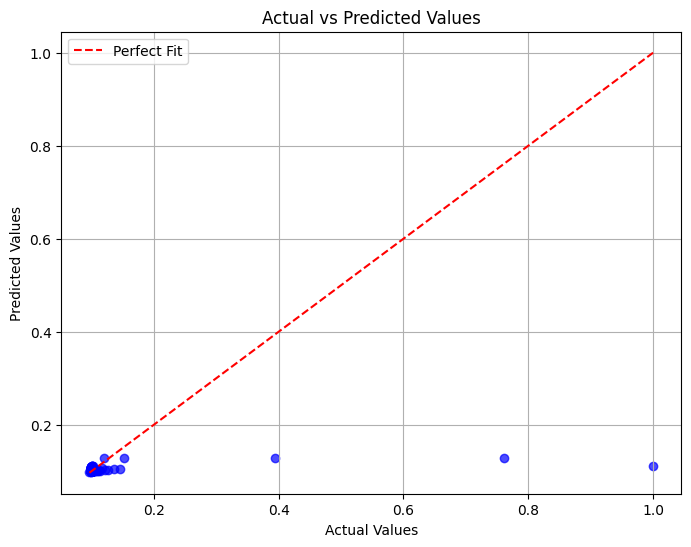

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge  # You can also use Lasso if needed
from sklearn.metrics import mean_squared_error, r2_score
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Aggregate fuel-specific consumption columns into TOTAL_FUEL_CONSUMPTION_(MMBtu)
    df['TOTAL_FUEL_CONSUMPTION_(MMBtu)'] = df[
        ['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    ].sum(axis=1)

    # Drop separate fuel consumption columns
    df = df.drop(columns=[
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ])

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    categorical_features = [
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 4: Train the Polynomial Regression Model with Regularization
def train_polynomial_regression(X_train, X_test, y_train, y_test, degree=2, alpha=1.0):
    # Create a pipeline with PolynomialFeatures, StandardScaler, and Ridge Regression
    pipeline = Pipeline([
        ('poly', PolynomialFeatures(degree=degree)),  # Generate polynomial features
        ('scaler', StandardScaler()),                # Scale features
        ('ridge', Ridge(alpha=alpha))               # Apply Ridge regularization
    ])

    # Train the model
    pipeline.fit(X_train, y_train)

    # Predict on the test set
    y_pred = pipeline.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return pipeline, mse, r2

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Normalize Carbon Intensity and Fuel Efficiency
    df['Normalized_Carbon_Intensity'] = (
        df['CARBON_INTENSITY'] - df['CARBON_INTENSITY'].min()
    ) / (df['CARBON_INTENSITY'].max() - df['CARBON_INTENSITY'].min())

    df['Normalized_Fuel_Efficiency'] = (
        df['FUEL_EFFICIENCY'] - df['FUEL_EFFICIENCY'].min()
    ) / (df['FUEL_EFFICIENCY'].max() - df['FUEL_EFFICIENCY'].min())

    # Compute the objective function
    df = compute_objective_function(df, w1=0.9, w2=0.1)

    # Encode categorical features
    df = encode_categorical_features(df)

    # Features (X) and Target (y)
    numeric_features = [
        'TOTAL_FUEL_CONSUMPTION_(MMBtu)',
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    X = df[numeric_features]
    y = df['Normalized_Objective_Function_Score']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train the Polynomial Regression model with Ridge regularization
    degree = 2  # Degree of polynomial features
    alpha = 1.0  # Regularization strength
    model, mse, r2 = train_polynomial_regression(X_train, X_test, y_train, y_test, degree, alpha)

    # Display results
    print(f"Polynomial Regression Results:")
    print(f"Degree: {degree}, Alpha: {alpha}")
    print(f"MSE: {mse:.8f}, R2: {r2:.4f}")

    # Plot Actual vs Predicted Values
    y_pred = model.predict(X_test)
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, alpha=0.7, color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label="Perfect Fit")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Actual vs Predicted Values")
    plt.legend()
    plt.grid(True)
    plt.show()

Polynomial Regression Results:
Degree: 2, Alpha: 1.0
MSE: 0.00012039, R2: 0.0550


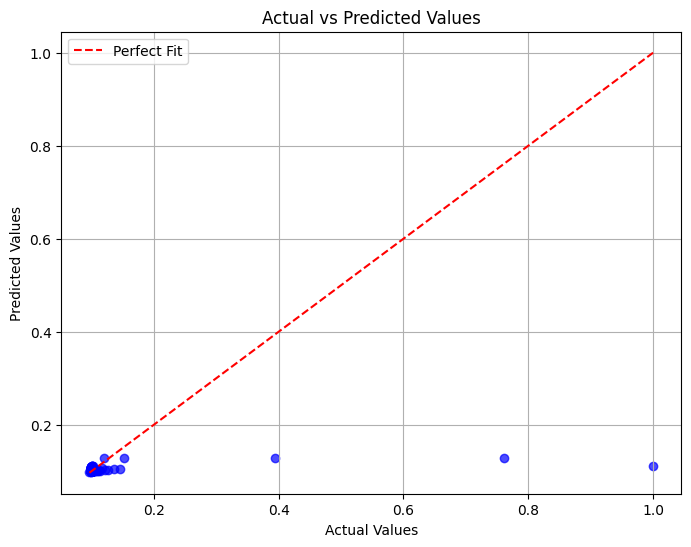

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
from category_encoders import TargetEncoder
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Aggregate fuel-specific consumption columns into TOTAL_FUEL_CONSUMPTION_(MMBtu)
    df['TOTAL_FUEL_CONSUMPTION_(MMBtu)'] = df[
        ['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    ].sum(axis=1)

    # Drop separate fuel consumption columns
    df = df.drop(columns=[
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ])

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    categorical_features = [
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 4: Train the Polynomial Regression Model with Regularization
def train_polynomial_regression(X_train, X_test, y_train, y_test, degree=2, alpha=1.0):
    # Create a pipeline with PolynomialFeatures, StandardScaler, and Ridge Regression
    pipeline = Pipeline([
        ('poly', PolynomialFeatures(degree=degree)),  # Generate polynomial features
        ('scaler', StandardScaler()),                # Scale features
        ('ridge', Ridge(alpha=alpha))               # Apply Ridge regularization
    ])

    # Train the model
    pipeline.fit(X_train, y_train)

    # Predict on the test set
    y_pred = pipeline.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return pipeline, mse, r2

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Normalize Carbon Intensity and Fuel Efficiency
    df['Normalized_Carbon_Intensity'] = (
        df['CARBON_INTENSITY'] - df['CARBON_INTENSITY'].min()
    ) / (df['CARBON_INTENSITY'].max() - df['CARBON_INTENSITY'].min())

    df['Normalized_Fuel_Efficiency'] = (
        df['FUEL_EFFICIENCY'] - df['FUEL_EFFICIENCY'].min()
    ) / (df['FUEL_EFFICIENCY'].max() - df['FUEL_EFFICIENCY'].min())

    # Compute the objective function
    df = compute_objective_function(df, w1=0.9, w2=0.1)

    # Encode categorical features
    df = encode_categorical_features(df)

    # Features (X) and Target (y)
    numeric_features = [
        'TOTAL_FUEL_CONSUMPTION_(MMBtu)',
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    X = df[numeric_features]
    y = df['Normalized_Objective_Function_Score']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train the Polynomial Regression model with Ridge regularization
    degree = 2  # Polynomial degree
    alpha = 1.0  # Regularization strength

    # Train the model
    model, mse, r2 = train_polynomial_regression(X_train, X_test, y_train, y_test, degree, alpha)

    # Display results
    print(f"Polynomial Regression Results:")
    print(f"Degree: {degree}, Alpha: {alpha}")
    print(f"MSE: {mse:.8f}, R2: {r2:.4f}")

    # Plot Actual vs Predicted Values
    y_pred = model.predict(X_test)
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, alpha=0.7, color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label="Perfect Fit")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Actual vs Predicted Values")
    plt.legend()
    plt.grid(True)
    plt.show()

Polynomial Regression Results:
MSE: 0.00012039, R2: 0.0550

Random Forest Results:
MSE: 0.00008910, R2: 0.3005


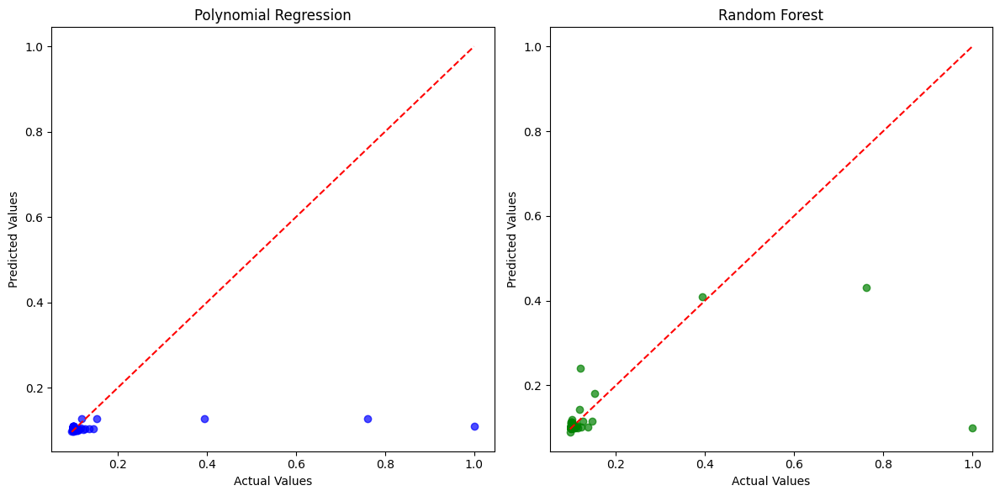

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from category_encoders import TargetEncoder
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Aggregate fuel-specific consumption columns into TOTAL_FUEL_CONSUMPTION_(MMBtu)
    df['TOTAL_FUEL_CONSUMPTION_(MMBtu)'] = df[
        ['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    ].sum(axis=1)

    # Drop separate fuel consumption columns
    df = df.drop(columns=[
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ])

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    categorical_features = [
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 4: Train and Evaluate Models
def train_and_evaluate_models(X_train, X_test, y_train, y_test):
    # Polynomial Regression with Ridge
    poly_pipeline = Pipeline([
        ('poly', PolynomialFeatures(degree=2)),
        ('scaler', StandardScaler()),
        ('ridge', Ridge(alpha=1.0))
    ])
    poly_pipeline.fit(X_train, y_train)
    y_pred_poly = poly_pipeline.predict(X_test)
    mse_poly = mean_squared_error(y_test, y_pred_poly)
    r2_poly = r2_score(y_test, y_pred_poly)

    # Random Forest Regressor
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    y_pred_rf = rf_model.predict(X_test)
    mse_rf = mean_squared_error(y_test, y_pred_rf)
    r2_rf = r2_score(y_test, y_pred_rf)

    # Display Results
    print("Polynomial Regression Results:")
    print(f"MSE: {mse_poly:.8f}, R2: {r2_poly:.4f}")
    print("\nRandom Forest Results:")
    print(f"MSE: {mse_rf:.8f}, R2: {r2_rf:.4f}")

    # Plot Actual vs Predicted Values
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.scatter(y_test, y_pred_poly, alpha=0.7, color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Polynomial Regression")

    plt.subplot(1, 2, 2)
    plt.scatter(y_test, y_pred_rf, alpha=0.7, color='green')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Random Forest")

    plt.tight_layout()
    plt.show()

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Normalize Carbon Intensity and Fuel Efficiency
    df['Normalized_Carbon_Intensity'] = (
        df['CARBON_INTENSITY'] - df['CARBON_INTENSITY'].min()
    ) / (df['CARBON_INTENSITY'].max() - df['CARBON_INTENSITY'].min())

    df['Normalized_Fuel_Efficiency'] = (
        df['FUEL_EFFICIENCY'] - df['FUEL_EFFICIENCY'].min()
    ) / (df['FUEL_EFFICIENCY'].max() - df['FUEL_EFFICIENCY'].min())

    # Compute the objective function
    df = compute_objective_function(df, w1=0.9, w2=0.1)

    # Encode categorical features
    df = encode_categorical_features(df)

    # Features (X) and Target (y)
    numeric_features = [
        'TOTAL_FUEL_CONSUMPTION_(MMBtu)',
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    X = df[numeric_features]
    y = df['Normalized_Objective_Function_Score']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train and evaluate models
    train_and_evaluate_models(X_train, X_test, y_train, y_test)

Polynomial Regression Results:
MSE: 0.00012039, R2: 0.0550

Random Forest Results:
MSE: 0.00008910, R2: 0.3005


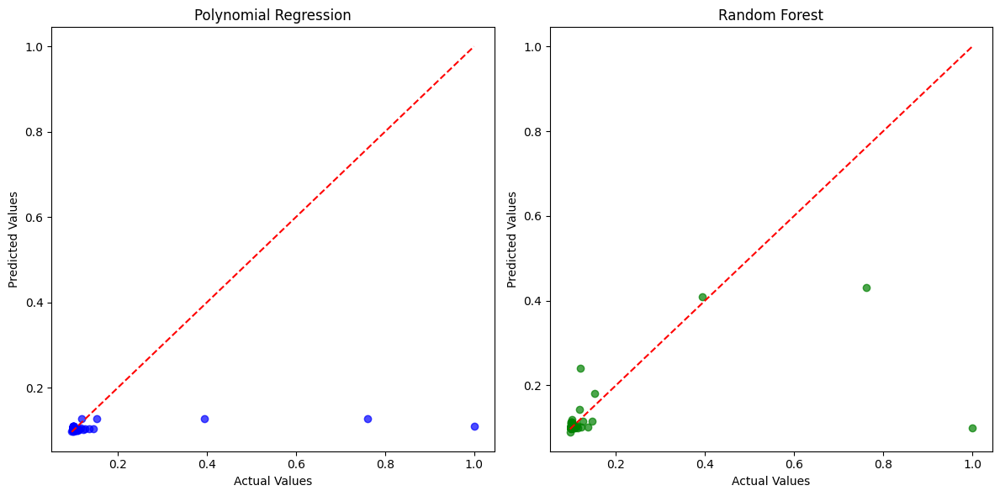

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from category_encoders import TargetEncoder
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Aggregate fuel-specific consumption columns into TOTAL_FUEL_CONSUMPTION_(MMBtu)
    df['TOTAL_FUEL_CONSUMPTION_(MMBtu)'] = df[
        ['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    ].sum(axis=1)

    # Drop separate fuel consumption columns
    df = df.drop(columns=[
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ])

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    categorical_features = [
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 4: Train Models with Hyperparameter Tuning
def train_and_evaluate_models(X_train, X_test, y_train, y_test):
    # Polynomial Regression with Ridge
    poly_pipeline = Pipeline([
        ('poly', PolynomialFeatures(degree=2)),
        ('scaler', StandardScaler()),
        ('ridge', Ridge(alpha=1.0))
    ])
    poly_pipeline.fit(X_train, y_train)
    y_pred_poly = poly_pipeline.predict(X_test)
    mse_poly = mean_squared_error(y_test, y_pred_poly)
    r2_poly = r2_score(y_test, y_pred_poly)

    # Random Forest Regressor
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    y_pred_rf = rf_model.predict(X_test)
    mse_rf = mean_squared_error(y_test, y_pred_rf)
    r2_rf = r2_score(y_test, y_pred_rf)

    # Display Results
    print("Polynomial Regression Results:")
    print(f"MSE: {mse_poly:.8f}, R2: {r2_poly:.4f}")

    print("\nRandom Forest Results:")
    print(f"MSE: {mse_rf:.8f}, R2: {r2_rf:.4f}")

    # Plot Actual vs Predicted Values
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.scatter(y_test, y_pred_poly, alpha=0.7, color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Polynomial Regression")

    plt.subplot(1, 2, 2)
    plt.scatter(y_test, y_pred_rf, alpha=0.7, color='green')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Random Forest")

    plt.tight_layout()
    plt.show()

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Normalize Carbon Intensity and Fuel Efficiency
    df['Normalized_Carbon_Intensity'] = (
        df['CARBON_INTENSITY'] - df['CARBON_INTENSITY'].min()
    ) / (df['CARBON_INTENSITY'].max() - df['CARBON_INTENSITY'].min())

    df['Normalized_Fuel_Efficiency'] = (
        df['FUEL_EFFICIENCY'] - df['FUEL_EFFICIENCY'].min()
    ) / (df['FUEL_EFFICIENCY'].max() - df['FUEL_EFFICIENCY'].min())

    # Compute the objective function
    df = compute_objective_function(df, w1=0.9, w2=0.1)

    # Encode categorical features
    df = encode_categorical_features(df)

    # Features (X) and Target (y)
    numeric_features = [
        'TOTAL_FUEL_CONSUMPTION_(MMBtu)',
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    X = df[numeric_features]
    y = df['Normalized_Objective_Function_Score']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train and evaluate models
    train_and_evaluate_models(X_train, X_test, y_train, y_test)

Polynomial Regression Results:
MSE: 0.00012039, R2: 0.0550

Random Forest Results:
MSE: 0.00008910, R2: 0.3005


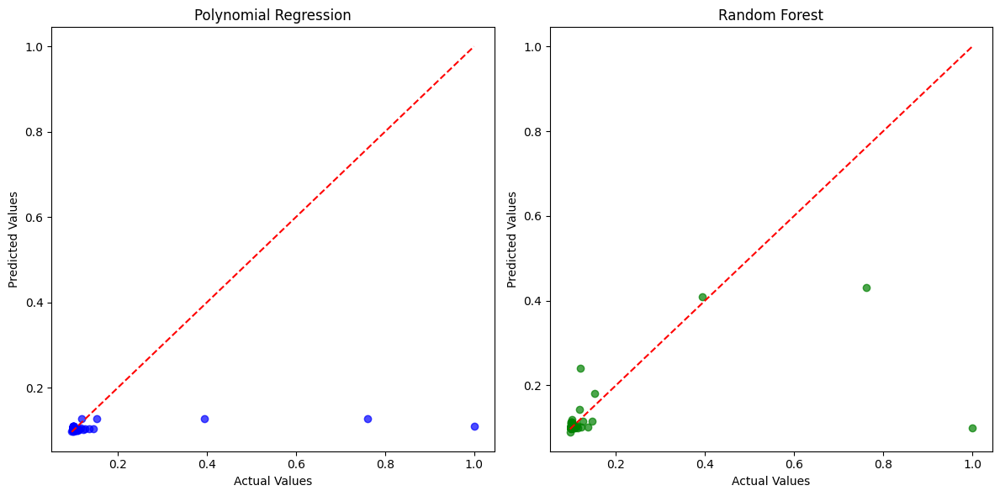

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from category_encoders import TargetEncoder
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Aggregate fuel-specific consumption columns into TOTAL_FUEL_CONSUMPTION_(MMBtu)
    df['TOTAL_FUEL_CONSUMPTION_(MMBtu)'] = df[
        ['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    ].sum(axis=1)

    # Drop separate fuel consumption columns
    df = df.drop(columns=[
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ])

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    categorical_features = [
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 4: Train Models with Hyperparameter Tuning
def train_and_evaluate_models(X_train, X_test, y_train, y_test):
    # Polynomial Regression with Ridge
    poly_pipeline = Pipeline([
        ('poly', PolynomialFeatures(degree=2)),
        ('scaler', StandardScaler()),
        ('ridge', Ridge(alpha=1.0))
    ])
    poly_pipeline.fit(X_train, y_train)
    y_pred_poly = poly_pipeline.predict(X_test)
    mse_poly = mean_squared_error(y_test, y_pred_poly)
    r2_poly = r2_score(y_test, y_pred_poly)

    # Random Forest Regressor
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    y_pred_rf = rf_model.predict(X_test)
    mse_rf = mean_squared_error(y_test, y_pred_rf)
    r2_rf = r2_score(y_test, y_pred_rf)

    # Display Results
    print("Polynomial Regression Results:")
    print(f"MSE: {mse_poly:.8f}, R2: {r2_poly:.4f}")

    print("\nRandom Forest Results:")
    print(f"MSE: {mse_rf:.8f}, R2: {r2_rf:.4f}")

    # Plot Actual vs Predicted Values
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.scatter(y_test, y_pred_poly, alpha=0.7, color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Polynomial Regression")

    plt.subplot(1, 2, 2)
    plt.scatter(y_test, y_pred_rf, alpha=0.7, color='green')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Random Forest")

    plt.tight_layout()
    plt.show()

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Normalize Carbon Intensity and Fuel Efficiency
    df['Normalized_Carbon_Intensity'] = (
        df['CARBON_INTENSITY'] - df['CARBON_INTENSITY'].min()
    ) / (df['CARBON_INTENSITY'].max() - df['CARBON_INTENSITY'].min())

    df['Normalized_Fuel_Efficiency'] = (
        df['FUEL_EFFICIENCY'] - df['FUEL_EFFICIENCY'].min()
    ) / (df['FUEL_EFFICIENCY'].max() - df['FUEL_EFFICIENCY'].min())

    # Compute the objective function
    df = compute_objective_function(df, w1=0.9, w2=0.1)

    # Encode categorical features
    df = encode_categorical_features(df)

    # Features (X) and Target (y)
    numeric_features = [
        'TOTAL_FUEL_CONSUMPTION_(MMBtu)',
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    X = df[numeric_features]
    y = df['Normalized_Objective_Function_Score']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train and evaluate models
    train_and_evaluate_models(X_train, X_test, y_train, y_test)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, MinMaxScaler
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel
from sklearn.metrics import mean_squared_error, r2_score
from category_encoders import TargetEncoder
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Aggregate fuel-specific consumption columns into TOTAL_FUEL_CONSUMPTION_(MMBtu)
    df['TOTAL_FUEL_CONSUMPTION_(MMBtu)'] = df[
        ['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    ].sum(axis=1)

    # Drop separate fuel consumption columns
    df = df.drop(columns=[
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ])

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    categorical_features = [
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Step 4: Train and Evaluate Models
def train_and_evaluate_models(X_train, X_test, y_train, y_test):
    # Polynomial Regression with Ridge Regularization
    poly_pipeline = Pipeline([
        ('poly', PolynomialFeatures(degree=2)),
        ('scaler', StandardScaler()),
        ('ridge', Ridge(alpha=1.0))
    ])
    poly_pipeline.fit(X_train, y_train)
    y_pred_poly = poly_pipeline.predict(X_test)
    mse_poly = mean_squared_error(y_test, y_pred_poly)
    r2_poly = r2_score(y_test, y_pred_poly)

    # Support Vector Regression (SVR)
    svr_param_grid = {
        'C': [0.1, 1, 10],
        'gamma': ['scale', 'auto'],
        'kernel': ['rbf']
    }
    svr = SVR()
    svr_grid = GridSearchCV(svr, svr_param_grid, cv=5, scoring='neg_mean_squared_error')
    svr_grid.fit(X_train, y_train)
    y_pred_svr = svr_grid.predict(X_test)
    mse_svr = mean_squared_error(y_test, y_pred_svr)
    r2_svr = r2_score(y_test, y_pred_svr)

    # Gaussian Process Regression (GPR)
    kernel = ConstantKernel(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-2, 1e2))
    gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, random_state=42)
    gpr.fit(X_train, y_train)
    y_pred_gpr = gpr.predict(X_test)
    mse_gpr = mean_squared_error(y_test, y_pred_gpr)
    r2_gpr = r2_score(y_test, y_pred_gpr)

    # Display Results
    print("Polynomial Regression Results:")
    print(f"MSE: {mse_poly:.8f}, R2: {r2_poly:.4f}")

    print("\nSupport Vector Regression (SVR) Results:")
    print(f"MSE: {mse_svr:.8f}, R2: {r2_svr:.4f}")
    print(f"Best Parameters: {svr_grid.best_params_}")

    print("\nGaussian Process Regression (GPR) Results:")
    print(f"MSE: {mse_gpr:.8f}, R2: {r2_gpr:.4f}")

    # Plot Actual vs Predicted Values
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.scatter(y_test, y_pred_poly, alpha=0.7, color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Polynomial Regression")

    plt.subplot(1, 3, 2)
    plt.scatter(y_test, y_pred_svr, alpha=0.7, color='green')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("SVR")

    plt.subplot(1, 3, 3)
    plt.scatter(y_test, y_pred_gpr, alpha=0.7, color='orange')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("GPR")

    plt.tight_layout()
    plt.show()

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Normalize Carbon Intensity and Fuel Efficiency
    df['Normalized_Carbon_Intensity'] = (
        df['CARBON_INTENSITY'] - df['CARBON_INTENSITY'].min()
    ) / (df['CARBON_INTENSITY'].max() - df['CARBON_INTENSITY'].min())

    df['Normalized_Fuel_Efficiency'] = (
        df['FUEL_EFFICIENCY'] - df['FUEL_EFFICIENCY'].min()
    ) / (df['FUEL_EFFICIENCY'].max() - df['FUEL_EFFICIENCY'].min())

    # Compute the objective function
    df = compute_objective_function(df, w1=0.9, w2=0.1)

    # Encode categorical features
    df = encode_categorical_features(df)

    # Features (X) and Target (y)
    numeric_features = [
        'TOTAL_FUEL_CONSUMPTION_(MMBtu)',
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    X = df[numeric_features]
    y = df['Normalized_Objective_Function_Score']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Train and evaluate models
    train_and_evaluate_models(X_train_scaled, X_test_scaled, y_train, y_test)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from category_encoders import TargetEncoder

# Step 1: Preprocess the Data
def preprocess_data(df):
    # Aggregate fuel-specific consumption columns into TOTAL_FUEL_CONSUMPTION_(MMBtu)
    df['TOTAL_FUEL_CONSUMPTION_(MMBtu)'] = df[
        ['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
         'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']
    ].sum(axis=1)

    # Drop separate fuel consumption columns
    df = df.drop(columns=[
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ])

    return df

# Step 2: Encode Categorical Features
def encode_categorical_features(df):
    categorical_features = [
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    encoder = TargetEncoder()
    for col in categorical_features:
        df[col] = encoder.fit_transform(df[col], df['Objective_Function_Score'])
    return df

# Step 3: Define the Objective Function
def compute_objective_function(df, w1, w2):
    df['Objective_Function_Score'] = (
        w1 * df['Normalized_Carbon_Intensity'] +
        w2 * (1 - df['Normalized_Fuel_Efficiency'])
    )
    df['Normalized_Objective_Function_Score'] = (
        df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
    ) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())
    return df

# Main Pipeline
if __name__ == "__main__":
    # Load the dataset
    file_path = "/content/drive/MyDrive/cleaned_emissions_data.csv"
    df = pd.read_csv(file_path)

    # Preprocess the data
    df = preprocess_data(df)

    # Normalize Carbon Intensity and Fuel Efficiency
    df['Normalized_Carbon_Intensity'] = (
        df['CARBON_INTENSITY'] - df['CARBON_INTENSITY'].min()
    ) / (df['CARBON_INTENSITY'].max() - df['CARBON_INTENSITY'].min())

    df['Normalized_Fuel_Efficiency'] = (
        df['FUEL_EFFICIENCY'] - df['FUEL_EFFICIENCY'].min()
    ) / (df['FUEL_EFFICIENCY'].max() - df['FUEL_EFFICIENCY'].min())

    # Compute the objective function
    df = compute_objective_function(df, w1=0.9, w2=0.1)

    # Encode categorical features
    df = encode_categorical_features(df)

    # Features (X) and Target (y)
    numeric_features = [
        'TOTAL_FUEL_CONSUMPTION_(MMBtu)',
        'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR'
    ]
    X = df[numeric_features]
    y = df['Normalized_Objective_Function_Score']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Save preprocessed data for use in other cells
    import joblib
    joblib.dump((X_train_scaled, X_test_scaled, y_train, y_test), "preprocessed_data.joblib")

Polynomial Regression Results:
MSE: 0.00012432, R2: 0.0241


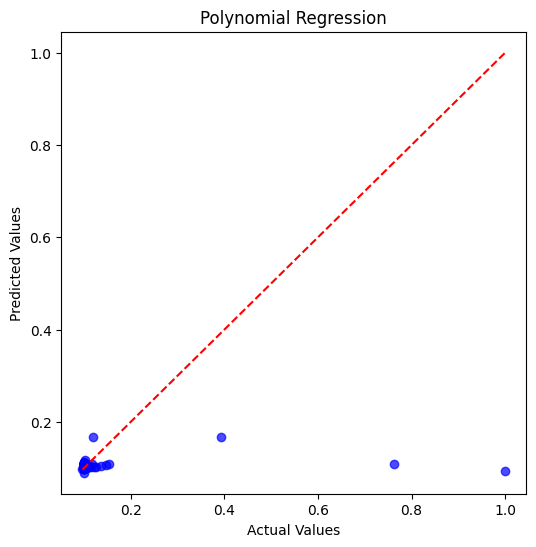

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import joblib

# Load preprocessed data
X_train_scaled, X_test_scaled, y_train, y_test = joblib.load("preprocessed_data.joblib")

# Polynomial Regression with Ridge Regularization
poly_pipeline = Pipeline([
    ('poly', PolynomialFeatures(degree=2)),
    ('ridge', Ridge(alpha=1.0))
])
poly_pipeline.fit(X_train_scaled, y_train)
y_pred_poly = poly_pipeline.predict(X_test_scaled)

# Evaluate Polynomial Regression
mse_poly = mean_squared_error(y_test, y_pred_poly)
r2_poly = r2_score(y_test, y_pred_poly)

# Display Results
print("Polynomial Regression Results:")
print(f"MSE: {mse_poly:.8f}, R2: {r2_poly:.4f}")

# Plot Actual vs Predicted Values
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred_poly, alpha=0.7, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Polynomial Regression")
plt.show()

Support Vector Regression (SVR) Results:
MSE: 0.00320687, R2: -24.1734


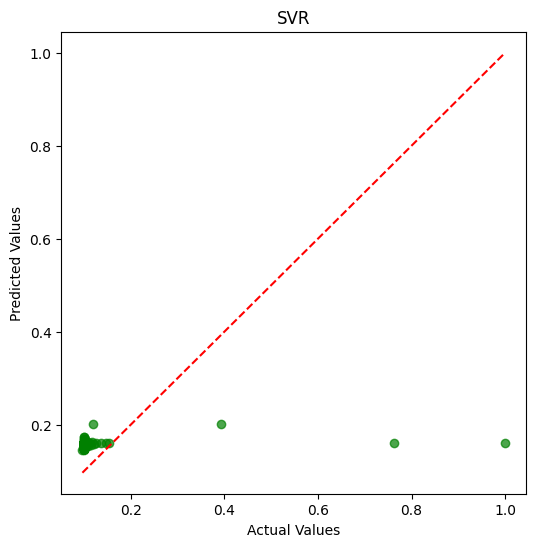

In [ ]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import joblib

# Load preprocessed data
X_train_scaled, X_test_scaled, y_train, y_test = joblib.load("preprocessed_data.joblib")

# Support Vector Regression (SVR)
svr = SVR(C=1.0, kernel='rbf', gamma='scale')
svr.fit(X_train_scaled, y_train)
y_pred_svr = svr.predict(X_test_scaled)

# Evaluate SVR
mse_svr = mean_squared_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)

# Display Results
print("Support Vector Regression (SVR) Results:")
print(f"MSE: {mse_svr:.8f}, R2: {r2_svr:.4f}")

# Plot Actual vs Predicted Values
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred_svr, alpha=0.7, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("SVR")
plt.show()

In [ ]:
!pip install category_encoders

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


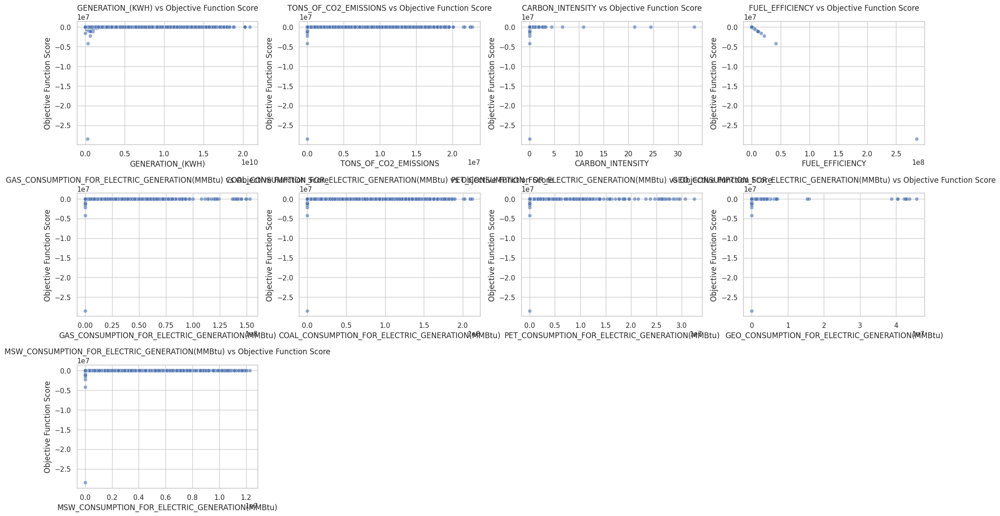

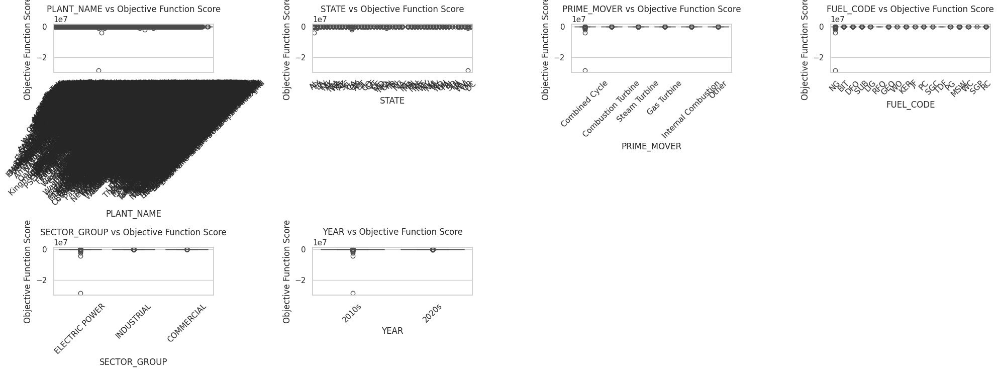

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
# Mount Google Drive if needed
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"  # Update with your file path
df = pd.read_csv(file_path)

# Step 2: Verify Carbon_Intensity and Fuel_Efficiency Exist
if 'CARBON_INTENSITY' not in df.columns or 'FUEL_EFFICIENCY' not in df.columns:
    raise ValueError("The dataset must contain 'Carbon_Intensity' and 'Fuel_Efficiency' columns.")

# Step 3: Compute Objective Function Score
w1 = 0.9
w2 = 0.1
df['Objective_Function_Score'] = (
    w1 * df['CARBON_INTENSITY'] +
    w2 * (1 - df['FUEL_EFFICIENCY'])
)

# Step 4: Separate Numerical and Categorical Features
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_features = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Remove non-relevant columns
non_relevant_columns = ['Objective_Function_Score']
for col in non_relevant_columns:
    if col in numerical_features:
        numerical_features.remove(col)

# Step 5: Visualize Relationships for Numerical Features
plt.figure(figsize=(20, 15))
sns.set(style="whitegrid")

for i, feature in enumerate(numerical_features, 1):
    plt.subplot(4, 4, i)  # Adjust grid size based on the number of features
    sns.scatterplot(x=df[feature], y=df['Objective_Function_Score'], alpha=0.6)
    plt.title(f"{feature} vs Objective Function Score")
    plt.xlabel(feature)
    plt.ylabel("Objective Function Score")

plt.tight_layout()
plt.show()

# Step 6: Visualize Relationships for Categorical Features
plt.figure(figsize=(20, 15))
sns.set(style="whitegrid")

for i, feature in enumerate(categorical_features, 1):
    plt.subplot(4, 4, i)  # Adjust grid size based on the number of features
    sns.boxplot(x=df[feature], y=df['Objective_Function_Score'])
    plt.title(f"{feature} vs Objective Function Score")
    plt.xlabel(feature)
    plt.ylabel("Objective Function Score")
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


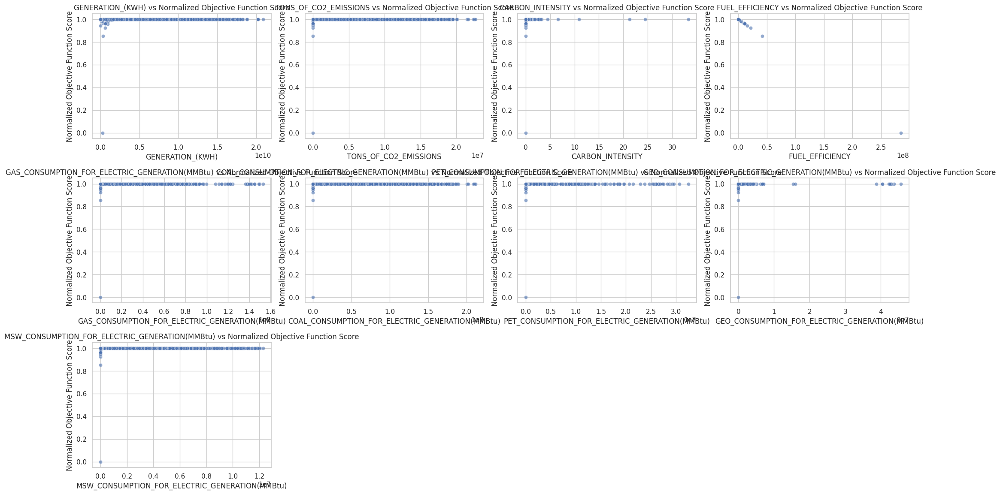

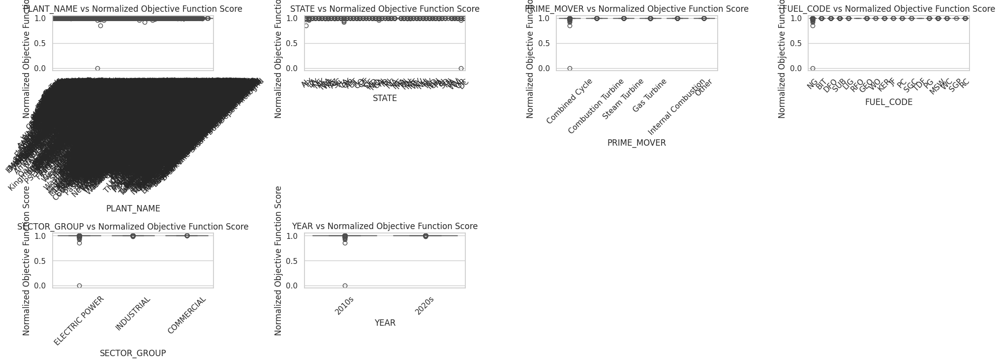

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive if needed
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"  # Update with your file path
df = pd.read_csv(file_path)

# Step 2: Verify Carbon_Intensity and Fuel_Efficiency Exist
if 'CARBON_INTENSITY' not in df.columns or 'FUEL_EFFICIENCY' not in df.columns:
    raise ValueError("The dataset must contain 'Carbon_Intensity' and 'Fuel_Efficiency' columns.")

# Step 3: Compute Objective Function Score
w1 = 0.9
w2 = 0.1
df['Objective_Function_Score'] = (
    w1 * df['CARBON_INTENSITY'] +
    w2 * (1 - df['FUEL_EFFICIENCY'])
)

# Step 4: Normalize Objective Function Score
df['Normalized_Objective_Function_Score'] = (
    df['Objective_Function_Score'] - df['Objective_Function_Score'].min()
) / (df['Objective_Function_Score'].max() - df['Objective_Function_Score'].min())

# Step 5: Separate Numerical and Categorical Features
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_features = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Remove non-relevant columns
non_relevant_columns = ['Objective_Function_Score', 'Normalized_Objective_Function_Score', 'Carbon_Intensity', 'Fuel_Efficiency']
for col in non_relevant_columns:
    if col in numerical_features:
        numerical_features.remove(col)

# Step 6: Visualize Relationships for Numerical Features
plt.figure(figsize=(20, 15))
sns.set(style="whitegrid")

for i, feature in enumerate(numerical_features, 1):
    plt.subplot(4, 4, i)  # Adjust grid size based on the number of features
    sns.scatterplot(x=df[feature], y=df['Normalized_Objective_Function_Score'], alpha=0.6)
    plt.title(f"{feature} vs Normalized Objective Function Score")
    plt.xlabel(feature)
    plt.ylabel("Normalized Objective Function Score")

plt.tight_layout()
plt.show()

# Step 7: Visualize Relationships for Categorical Features
plt.figure(figsize=(20, 15))
sns.set(style="whitegrid")

for i, feature in enumerate(categorical_features, 1):
    plt.subplot(4, 4, i)  # Adjust grid size based on the number of features
    sns.boxplot(x=df[feature], y=df['Normalized_Objective_Function_Score'])
    plt.title(f"{feature} vs Normalized Objective Function Score")
    plt.xlabel(feature)
    plt.ylabel("Normalized Objective Function Score")
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()

Mounted at /content/drive
Random Forest Regression Results:
MSE: 0.1583, R2: 0.0922


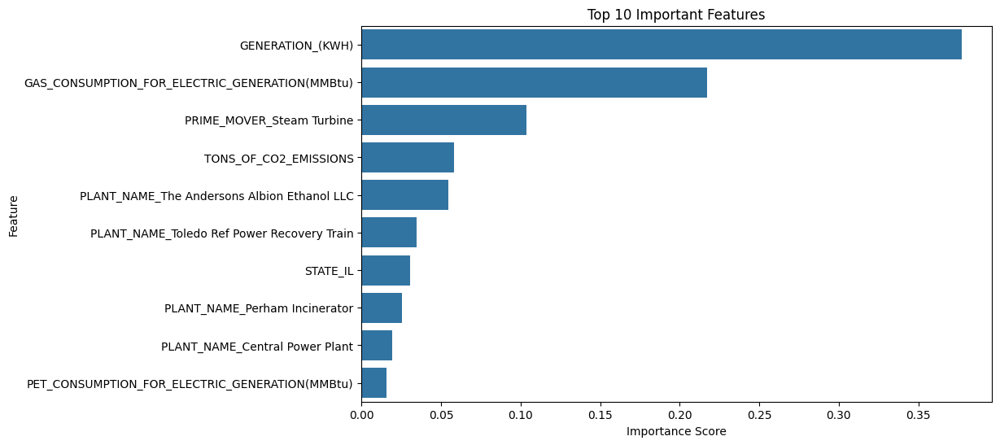

Sample Predictions: [2.89097182e-05 1.62676968e-03 8.39029299e-04 6.66497245e-04
 8.51171935e-04]


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive if needed
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"  # Update with your file path
df = pd.read_csv(file_path)

# Step 2: Verify Carbon Intensity Exists
if 'CARBON_INTENSITY' not in df.columns:
    raise ValueError("The dataset must contain 'CARBON_INTENSITY' column.")

# Step 3: Feature Selection
# Define numerical and categorical features
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_features = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Remove non-relevant columns
non_relevant_columns = ['CARBON_INTENSITY', 'FUEL_EFFICIENCY', 'OBJECTIVE_FUNCTION_SCORE']
for col in non_relevant_columns:
    if col in numerical_features:
        numerical_features.remove(col)

# Combine all relevant features
features = numerical_features + categorical_features

# Separate features (X) and target (y)
X = df[features]
y = df['CARBON_INTENSITY']

# Step 4: Encode Categorical Features
# Use one-hot encoding for categorical features
X = pd.get_dummies(X, drop_first=True)

# Step 5: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Step 6: Train Random Forest Regressor
rf_model = RandomForestRegressor(
    n_estimators=100,  # Number of trees
    max_depth=None,    # Fully grown trees
    random_state=42,
    n_jobs=-1          # Use all CPU cores
)
rf_model.fit(X_train, y_train)

# Step 7: Evaluate the Model
y_pred = rf_model.predict(X_test)

# Metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Random Forest Regression Results:")
print(f"MSE: {mse:.4f}, R2: {r2:.4f}")

# Step 8: Feature Importance
# Extract feature importance scores
feature_importances = rf_model.feature_importances_
feature_names = X.columns

# Create a DataFrame for visualization
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(10))
plt.title("Top 10 Important Features")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.show()

# Step 9: Make Predictions (Optional)
# Example: Predict carbon intensity for the first 5 rows in the test set
sample_predictions = rf_model.predict(X_test[:5])
print("Sample Predictions:", sample_predictions)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regression Results:
MSE: 0.1368, R2: 0.2154


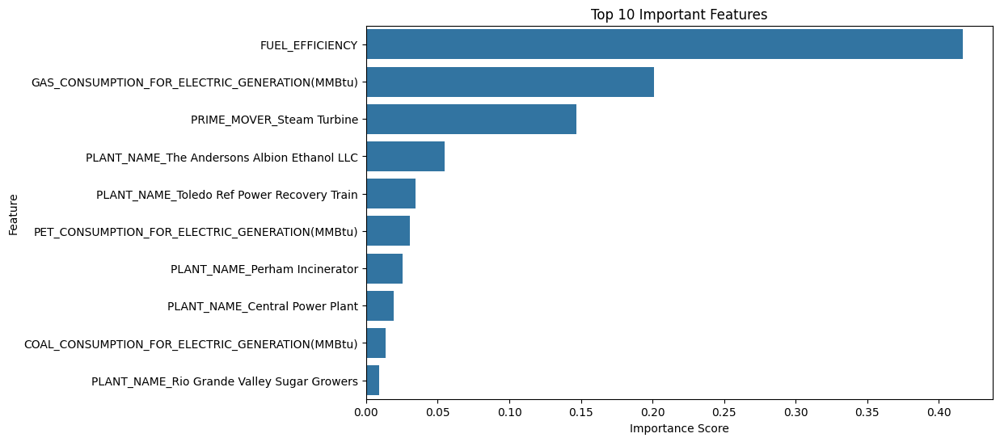

Sample Predictions: [2.89979401e-05 8.40830592e-04 8.18856671e-04 6.68748482e-04
 9.22630271e-04]


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive if needed
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"  # Update with your file path
df = pd.read_csv(file_path)

# Step 2: Verify Carbon Intensity Exists
if 'CARBON_INTENSITY' not in df.columns:
    raise ValueError("The dataset must contain 'CARBON_INTENSITY' column.")

# Step 3: Feature Selection
# Define numerical and categorical features
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_features = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Remove non-relevant columns
non_relevant_columns = ['CARBON_INTENSITY', 'GENERATION_(KWH)', 'OBJECTIVE_FUNCTION_SCORE', 'TONS_OF_CO2_EMISSIONS']
for col in non_relevant_columns:
    if col in numerical_features:
        numerical_features.remove(col)

# Combine all relevant features
features = numerical_features + categorical_features

# Separate features (X) and target (y)
X = df[features]
y = df['CARBON_INTENSITY']

# Step 4: Encode Categorical Features
# Use one-hot encoding for categorical features
X = pd.get_dummies(X, drop_first=True)

# Step 5: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Step 6: Train Random Forest Regressor
rf_model = RandomForestRegressor(
    n_estimators=100,  # Number of trees
    max_depth=None,    # Fully grown trees
    random_state=42,
    n_jobs=-1          # Use all CPU cores
)
rf_model.fit(X_train, y_train)

# Step 7: Evaluate the Model
y_pred = rf_model.predict(X_test)

# Metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Random Forest Regression Results:")
print(f"MSE: {mse:.4f}, R2: {r2:.4f}")

# Step 8: Feature Importance
# Extract feature importance scores
feature_importances = rf_model.feature_importances_
feature_names = X.columns

# Create a DataFrame for visualization
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(10))
plt.title("Top 10 Important Features")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.show()

# Step 9: Make Predictions (Optional)
# Example: Predict carbon intensity for the first 5 rows in the test set
sample_predictions = rf_model.predict(X_test[:5])
print("Sample Predictions:", sample_predictions)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge  # You can also use Lasso if needed
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive if needed
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"  # Update with your file path
df = pd.read_csv(file_path)

# Step 2: Verify Carbon Intensity Exists
if 'CARBON_INTENSITY' not in df.columns:
    raise ValueError("The dataset must contain 'CARBON_INTENSITY' column.")

# Step 3: Feature Selection
# Define numerical and categorical features
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_features = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Remove non-relevant columns
non_relevant_columns = ['CARBON_INTENSITY', 'GENERATION_(KWH)', 'OBJECTIVE_FUNCTION_SCORE', 'TONS_OF_CO2_EMISSIONS']
for col in non_relevant_columns:
    if col in numerical_features:
        numerical_features.remove(col)

# Combine all relevant features
features = numerical_features + categorical_features

# Separate features (X) and target (y)
X = df[features]
y = df['CARBON_INTENSITY']

# Step 4: Encode Categorical Features
# Use one-hot encoding for categorical features
X = pd.get_dummies(X, drop_first=True)

# Step 5: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Step 6: Create Polynomial Features
poly = PolynomialFeatures(degree=2, include_bias=False)  # Degree 2 polynomial
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Step 7: Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_poly)
X_test_scaled = scaler.transform(X_test_poly)

# Step 8: Train Ridge Regression Model (Regularization)
ridge_model = Ridge(alpha=1.0, random_state=42)  # alpha controls regularization strength
ridge_model.fit(X_train_scaled, y_train)

# Step 9: Evaluate the Model
y_pred = ridge_model.predict(X_test_scaled)

# Metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Polynomial Ridge Regression Results:")
print(f"MSE: {mse:.4f}, R2: {r2:.4f}")

# Step 10: Feature Importance (Coefficients)
# Extract coefficients for polynomial features
feature_names = poly.get_feature_names_out(input_features=X.columns)
coefficients = ridge_model.coef_

# Create a DataFrame for visualization
coef_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
}).sort_values(by='Coefficient', ascending=False)

# Plot top 10 coefficients
plt.figure(figsize=(10, 6))
sns.barplot(x='Coefficient', y='Feature', data=coef_df.head(10))
plt.title("Top 10 Coefficients")
plt.xlabel("Coefficient Value")
plt.ylabel("Feature")
plt.show()

# Step 11: Make Predictions (Optional)
# Example: Predict carbon intensity for the first 5 rows in the test set
sample_predictions = ridge_model.predict(X_test_scaled[:5])
print("Sample Predictions:", sample_predictions)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge  # You can also use Lasso if needed
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive if needed
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"  # Update with your file path
df = pd.read_csv(file_path)

# One-hot encoding for low-cardinality features
df = pd.get_dummies(df, columns=['FUEL_CODE', 'PRIME_MOVER', 'SECTOR_GROUP', 'YEAR'], drop_first=True)

# Target encoding for high-cardinality features (if any)
from category_encoders import TargetEncoder

high_cardinality_features = ['STATE', 'PLANT_NAME']
target_encoder = TargetEncoder(cols=high_cardinality_features)
df[high_cardinality_features] = target_encoder.fit_transform(df[high_cardinality_features], df['CARBON_INTENSITY'])

# Apply log transformation
df['LOG_CAR_BON_INTENSITY'] = np.log1p(df['CARBON_INTENSITY'])

# Alternatively, scale the target variable
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df['SCALED_CAR_BON_INTENSITY'] = scaler.fit_transform(df[['CARBON_INTENSITY']])

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

X = df.drop(columns=['CARBON_INTENSITY', 'LOG_CAR_BON_INTENSITY', 'SCALED_CAR_BON_INTENSITY'])
y = df['LOG_CAR_BON_INTENSITY']  # Or 'SCALED_CAR_BON_INTENSITY'

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

# Predictions
y_pred_log = model.predict(X_test)
y_pred_original = np.expm1(y_pred_log)  # Reverse log1p transformation

from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(df.loc[X_test.index, 'CARBON_INTENSITY'], y_pred_original)
r2 = r2_score(df.loc[X_test.index, 'CARBON_INTENSITY'], y_pred_original)

print(f"MSE: {mse:.4f}, R2: {r2:.4f}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
MSE: 0.1392, R2: 0.2016


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"
df = pd.read_csv(file_path)

# Feature Engineering
df['CARBON_INTENSITY'] = df['TONS_OF_CO2_EMISSIONS'] / (df['GENERATION_(KWH)'] / 1000)  # tons per MWh

# Create combined fuel features
consumption_cols = [col for col in df.columns if 'CONSUMPTION' in col]
df['TOTAL_FUEL_CONSUMPTION'] = df[consumption_cols].sum(axis=1)
df['FOSSIL_FUEL_RATIO'] = (df['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'] +
                         df['COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'] +
                         df['PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']) / df['TOTAL_FUEL_CONSUMPTION']

# Create efficiency metrics
df['THERMAL_EFFICIENCY'] = df['GENERATION_(KWH)'] / (df['TOTAL_FUEL_CONSUMPTION'] * 0.293071)  # MMBtu to kWh conversion

# Feature Selection
features = ['FUEL_CODE', 'PRIME_MOVER', 'SECTOR_GROUP', 'STATE',
           'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
           'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
           'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
           'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
           'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
           'TOTAL_FUEL_CONSUMPTION', 'FOSSIL_FUEL_RATIO', 'THERMAL_EFFICIENCY']

# Define X and y
X = df[features]
y = df['CARBON_INTENSITY']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing
numeric_features = ['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                   'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                   'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                   'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                   'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                   'TOTAL_FUEL_CONSUMPTION', 'FOSSIL_FUEL_RATIO', 'THERMAL_EFFICIENCY']

categorical_features = ['FUEL_CODE', 'PRIME_MOVER', 'SECTOR_GROUP', 'STATE']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ])

# Create pipeline
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', GradientBoostingRegressor(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=5,
        random_state=42))
])

# Cross-validation
scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')
print(f"Cross-validated R2 scores: {scores}")
print(f"Mean R2: {scores.mean():.4f}")

# Final training
model.fit(X_train, y_train)

# Evaluation on test set
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"\nTest set performance:")
print(f"MSE: {mse:.4f}")
print(f"R2: {r2:.4f}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Cross-validated R2 scores: [ 0.64575647 -3.47438203  0.41847593 -0.06581956 -0.03373572]
Mean R2: -0.5019

Test set performance:
MSE: 137334.1396
R2: 0.2124


In [ ]:
!pip install scikit-optimize xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 6.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import shap
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"
df = pd.read_csv(file_path)

# Calculate carbon intensity
df['CARBON_INTENSITY'] = df['TONS_OF_CO2_EMISSIONS'] / df['GENERATION_(KWH)']

# Calculate total fuel consumption
fuel_columns = ['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
               'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
               'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
               'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
               'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']

df['TOTAL_FUEL_CONSUMPTION'] = df[fuel_columns].sum(axis=1)
df['FUEL_EFFICIENCY'] = df['TOTAL_FUEL_CONSUMPTION'] / df['GENERATION_(KWH)']

# Prepare features and target
features = ['PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'GENERATION_(KWH)', 'TOTAL_FUEL_CONSUMPTION']
target = 'CARBON_INTENSITY'

# Convert categorical variables to numerical
df = pd.get_dummies(df, columns=['PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP'])

# Split data
X = df.drop(columns=['PLANT_NAME', 'STATE', 'YEAR', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY'] + fuel_columns)
y = df['CARBON_INTENSITY']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Evaluate
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse:.4f}")
print(f"R-squared: {r2:.4f}")

# SHAP analysis for explainability
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Mean Squared Error: 0.1189
R-squared: 0.3181


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Ridge Regression Performance:
MSE: 0.168875
R²: 0.0315
----------------------------------------
Lasso Regression Performance:
MSE: 0.169899
R²: 0.0257
----------------------------------------


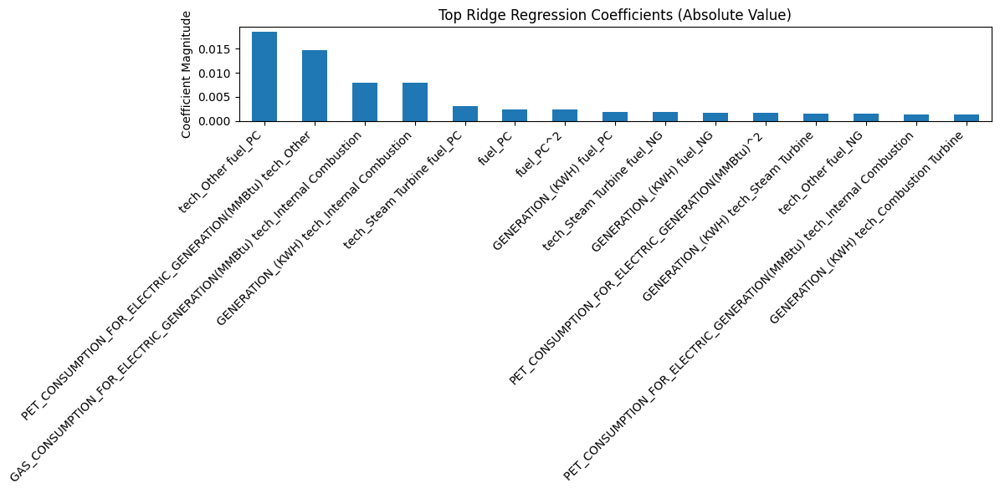

Model saved to carbon_intensity_model.pkl


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/drive')

# Load the dataset
file_path = "/content/drive/My Drive/cleaned_emissions_data.csv"
df = pd.read_csv(file_path)

# Calculate target variable
df['CARBON_INTENSITY'] = df['TONS_OF_CO2_EMISSIONS'] / df['GENERATION_(KWH)']

# Select the most relevant features based on domain knowledge
features = [
    'GENERATION_(KWH)',  # Plant output
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Convert categorical variables (one-hot encoding)
prime_mover_dummies = pd.get_dummies(df['PRIME_MOVER'], prefix='tech')
fuel_dummies = pd.get_dummies(df['FUEL_CODE'], prefix='fuel')

# Combine all features
X = pd.concat([
    df[features],
    prime_mover_dummies,
    fuel_dummies
], axis=1)

y = df['CARBON_INTENSITY']

# Remove rows with infinite or missing values
X.replace([np.inf, -np.inf], np.nan, inplace=True)
X.fillna(0, inplace=True)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Polynomial feature engineering (degree=2)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Standardize features
scaler = StandardScaler()
X_train_poly = scaler.fit_transform(X_train_poly)
X_test_poly = scaler.transform(X_test_poly)

# Ridge Regression with cross-validated alpha selection
ridge = Ridge()
param_grid = {'alpha': [0.001, 0.01, 0.1, 1, 10, 100]}
ridge_grid = GridSearchCV(ridge, param_grid, cv=5, scoring='neg_mean_squared_error')
ridge_grid.fit(X_train_poly, y_train)

# Best Ridge model
best_ridge = ridge_grid.best_estimator_
y_pred_ridge = best_ridge.predict(X_test_poly)

# Lasso Regression for feature selection
lasso = Lasso(max_iter=10000)
lasso_grid = GridSearchCV(lasso, param_grid, cv=5, scoring='neg_mean_squared_error')
lasso_grid.fit(X_train_poly, y_train)

# Best Lasso model
best_lasso = lasso_grid.best_estimator_
y_pred_lasso = best_lasso.predict(X_test_poly)

# Evaluation
def evaluate_model(name, y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"{name} Performance:")
    print(f"MSE: {mse:.6f}")
    print(f"R²: {r2:.4f}")
    print("-"*40)
    return mse, r2

ridge_mse, ridge_r2 = evaluate_model("Ridge Regression", y_test, y_pred_ridge)
lasso_mse, lasso_r2 = evaluate_model("Lasso Regression", y_test, y_pred_lasso)

# Feature importance analysis
poly_feature_names = poly.get_feature_names_out(X.columns)
ridge_coef = pd.Series(best_ridge.coef_, index=poly_feature_names)
lasso_coef = pd.Series(best_lasso.coef_, index=poly_feature_names)

# Plot important features
plt.figure(figsize=(12, 6))
ridge_coef.abs().sort_values(ascending=False).head(15).plot(kind='bar')
plt.title("Top Ridge Regression Coefficients (Absolute Value)")
plt.ylabel("Coefficient Magnitude")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Save the best model
joblib.dump({
    'model': best_ridge,
    'poly': poly,
    'scaler': scaler,
    'features': X.columns.tolist()
}, 'carbon_intensity_model.pkl')

print("Model saved to carbon_intensity_model.pkl")

In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 4.0 MB/s eta 0:00:00


In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
# Load the dataset with proper header handling
data = pd.read_csv(file_path, header=0)

Mounted at /content/drive


In [ ]:
# Inspect the dataset
print("\nDataset Preview:")
print(data.head())

# Check data types
print("\nData Types:")
print(data.dtypes)


Dataset Preview:
  PLANT_NAME STATE         PRIME_MOVER FUEL_CODE    SECTOR_GROUP  \
0      Barry    AL      Combined Cycle        NG  ELECTRIC POWER   
1      Barry    AL  Combustion Turbine        NG  ELECTRIC POWER   
2      Barry    AL       Steam Turbine       BIT  ELECTRIC POWER   
3      Barry    AL       Steam Turbine        NG  ELECTRIC POWER   
4    Gadsden    AL       Steam Turbine       BIT  ELECTRIC POWER   

   GENERATION_(KWH)  TONS_OF_CO2_EMISSIONS   YEAR  CARBON_INTENSITY  \
0      2.813479e+09           3.443374e+04  2010s          0.000012   
1      5.004417e+09           3.180741e+06  2010s          0.000636   
2      4.962412e+09           5.263615e+06  2010s          0.001061   
3      1.168291e+08           7.057253e+04  2010s          0.000604   
4      8.269450e+07           1.297125e+05  2010s          0.001569   

   FUEL_EFFICIENCY  GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)  \
0      4779.861403                                        588611.0   
1     

In [ ]:
# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['CARBON_INTENSITY'], inplace=True)

In [ ]:
# Define features and target
X = data.drop(columns=['CARBON_INTENSITY', 'FUEL_EFFICIENCY', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)'])
y = data['CARBON_INTENSITY']

In [ ]:
# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Identify low-cardinality and high-cardinality categorical features
low_cardinality_cols = [col for col in categorical_cols if X[col].nunique() <= 10]
high_cardinality_cols = [col for col in categorical_cols if X[col].nunique() > 10]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for low-cardinality categorical data (One-Hot Encoding)
low_cardinality_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Preprocessing for high-cardinality categorical data (Target Encoding)
high_cardinality_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('low_cardinality', low_cardinality_transformer, low_cardinality_cols),
        ('high_cardinality', high_cardinality_transformer, high_cardinality_cols)
    ])

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['CARBON_INTENSITY'], inplace=True)

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY'].quantile(0.99)
data = data[data['CARBON_INTENSITY'] <= threshold]

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']].sum(axis=1)

# Define features and target
X = data.drop(columns=['CARBON_INTENSITY', 'FUEL_EFFICIENCY', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)'])
y = data['CARBON_INTENSITY']

# Log transform the target variable
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost for better performance
model = XGBRegressor(n_estimators=100, random_state=42, learning_rate=0.1)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Train the model
pipeline.fit(X_train, y_train)

# Predict and evaluate
y_pred = pipeline.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Model: XGBoost")
print(f"MSE: {mse:.16f}, R2: {r2:.4f}")

Mounted at /content/drive
Model: XGBoost
MSE: 0.0000010223799441, R2: 0.5548


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]
data.columns = column_names

# Convert numeric columns to numeric type
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['CARBON_INTENSITY'], inplace=True)

# Apply log transformation to Carbon Intensity
data['LOG_CARBON_INTENSITY'] = np.log1p(data['CARBON_INTENSITY'])

# Define features and target
X = data.drop(columns=['CARBON_INTENSITY', 'LOG_CARBON_INTENSITY', 'FUEL_EFFICIENCY', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)'])
y = data['LOG_CARBON_INTENSITY']

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost
model = XGBRegressor(n_estimators=100, random_state=42, learning_rate=0.1)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
pipeline.fit(X_train, y_train)

# Predict and evaluate
y_pred = pipeline.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Model: XGBoost")
print(f"MSE: {mse:.4f}, R2: {r2:.4f}")

Model: XGBoost
MSE: 0.0028, R2: 0.1474


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['CARBON_INTENSITY'], inplace=True)

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY'].quantile(0.99)
data = data[data['CARBON_INTENSITY'] <= threshold]

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']].sum(axis=1)

# Define features and target
X = data.drop(columns=['CARBON_INTENSITY', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)', 'PLANT_NAME', 'STATE'])
y = data['CARBON_INTENSITY']

# Log transform the target variable
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost for better performance
model = XGBRegressor(n_estimators=100, random_state=42, learning_rate=0.1)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Train the model
pipeline.fit(X_train, y_train)

# Predict and evaluate
y_pred = pipeline.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Model: XGBoost")
print(f"MSE: {mse:.16f}, R2: {r2:.4f}")

Mounted at /content/drive


<ipython-input-11-75e9c3d2ef1f>:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',


Model: XGBoost
MSE: 0.0000005966340312, R2: 0.7402


In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.6 MB/s eta 0:00:00


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Convert GENERATION_(KWH) to MWh (1 MWh = 1000 kWh)
data['GENERATION_(MWh)'] = data['GENERATION_(KWH)'] / 1000

# Recalculate Carbon Intensity using MWh
data['CARBON_INTENSITY_MWh'] = data['TONS_OF_CO2_EMISSIONS'] / data['GENERATION_(MWh)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_MWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_MWh'] <= threshold]

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
                                       'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)']].sum(axis=1)

# Define features and target
X = data.drop(columns=['CARBON_INTENSITY_MWh', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)', 'PLANT_NAME', 'STATE'])
y = data['CARBON_INTENSITY_MWh']

# Log transform the target variable
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost for better performance
model = XGBRegressor(n_estimators=100, random_state=42, learning_rate=0.1)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Train the model
pipeline.fit(X_train, y_train)

# Predict and evaluate
y_pred = pipeline.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Model: XGBoost")
print(f"MSE: {mse:.16f}, R2: {r2:.4f}")

Mounted at /content/drive


<ipython-input-3-fd43a240df41>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[['GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',


Model: XGBoost
MSE: 0.0000912201877068, R2: 0.9994


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Convert GENERATION_(KWH) to GWh (1 GWh = 1,000,000 kWh)
data['GENERATION_(GWh)'] = data['GENERATION_(KWH)'] / 1_000_000

# Recalculate Carbon Intensity using GWh
data['CARBON_INTENSITY_GWh'] = data['TONS_OF_CO2_EMISSIONS'] / data['GENERATION_(GWh)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_GWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_GWh'] <= threshold]

# Normalize CARBON_INTENSITY_GWh using Min-Max Scaling
scaler = MinMaxScaler()
data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_GWh', 'CARBON_INTENSITY', 'GENERATION_(GWh)'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost for better performance
model = XGBRegressor(n_estimators=100, random_state=42, learning_rate=0.1)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

print('X cols: ', X.head())
print('y col: ', y.head())

# Train the model
pipeline.fit(X_train, y_train)

# Predict and evaluate
y_pred = pipeline.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Model: XGBoost")
print(f"MSE: {mse:.16f}, R2: {r2:.4f}")

Mounted at /content/drive


<ipython-input-4-48c58e2ef45a>:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])
<ipython-input-4-48c58e2ef45a>:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[


X cols:            PRIME_MOVER FUEL_CODE    SECTOR_GROUP   YEAR  FUEL_EFFICIENCY  \
1      Combined Cycle        NG  ELECTRIC POWER  2010s      4779.861403   
2  Combustion Turbine        NG  ELECTRIC POWER  2010s        92.040943   
3       Steam Turbine       BIT  ELECTRIC POWER  2010s        96.917408   
4       Steam Turbine        NG  ELECTRIC POWER  2010s        96.843699   
5       Steam Turbine       BIT  ELECTRIC POWER  2010s        65.537188   

   GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)  \
1                                        588611.0   
2                                      54371640.0   
3                                             0.0   
4                                       1206368.0   
5                                             0.0   

   COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)  \
1                                              0.0   
2                                              0.0   
3                                       51202482.0   
4    

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Convert GENERATION_(KWH) to GWh (1 GWh = 1,000,000 kWh)
data['GENERATION_(GWh)'] = data['GENERATION_(KWH)'] / 1_000_000

# Recalculate Carbon Intensity using GWh
data['CARBON_INTENSITY_GWh'] = data['TONS_OF_CO2_EMISSIONS'] / data['GENERATION_(GWh)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_GWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_GWh'] <= threshold]

# Normalize CARBON_INTENSITY_GWh using Min-Max Scaling
scaler = MinMaxScaler()
data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_GWh', 'CARBON_INTENSITY', 'GENERATION_(GWh)'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost with Regularization
model = XGBRegressor(
    n_estimators=100,
    random_state=42,
    learning_rate=0.1,
    reg_lambda=1.0,  # L2 regularization (default is 1)
    reg_alpha=0.1    # L1 regularization (default is 0)
)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

print('X cols: ', X.head())
print('y col: ', y.head())

# Train the model
pipeline.fit(X_train, y_train)

# Predict and evaluate
y_pred = pipeline.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
from sklearn.metrics import mean_absolute_error

# Calculate MAE
mae = mean_absolute_error(y_test, y_pred)

print(f"MAE: {mae:.16f}")

print(f"Model: XGBoost with Regularization")
print(f"MSE: {mse:.16f}, R2: {r2:.4f}")
rmse = np.sqrt(mse)                    # Take the square root

print(f"RMSE: {rmse:.4f}")

Mounted at /content/drive


<ipython-input-15-27821115d2b8>:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])
<ipython-input-15-27821115d2b8>:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[


X cols:            PRIME_MOVER FUEL_CODE    SECTOR_GROUP   YEAR  FUEL_EFFICIENCY  \
1      Combined Cycle        NG  ELECTRIC POWER  2010s      4779.861403   
2  Combustion Turbine        NG  ELECTRIC POWER  2010s        92.040943   
3       Steam Turbine       BIT  ELECTRIC POWER  2010s        96.917408   
4       Steam Turbine        NG  ELECTRIC POWER  2010s        96.843699   
5       Steam Turbine       BIT  ELECTRIC POWER  2010s        65.537188   

   GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)  \
1                                        588611.0   
2                                      54371640.0   
3                                             0.0   
4                                       1206368.0   
5                                             0.0   

   COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)  \
1                                              0.0   
2                                              0.0   
3                                       51202482.0   
4    

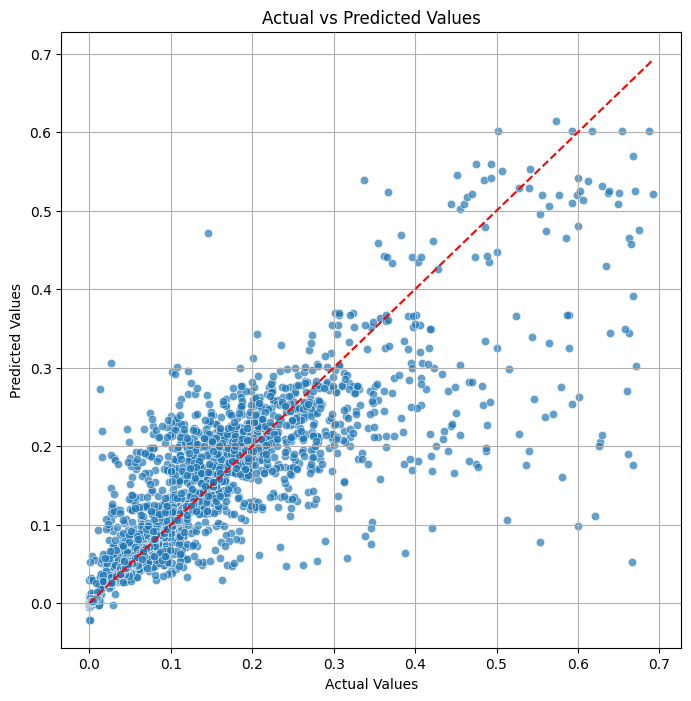

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot of actual vs predicted values
plt.figure(figsize=(8, 8))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')  # Diagonal line
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True)
plt.show()

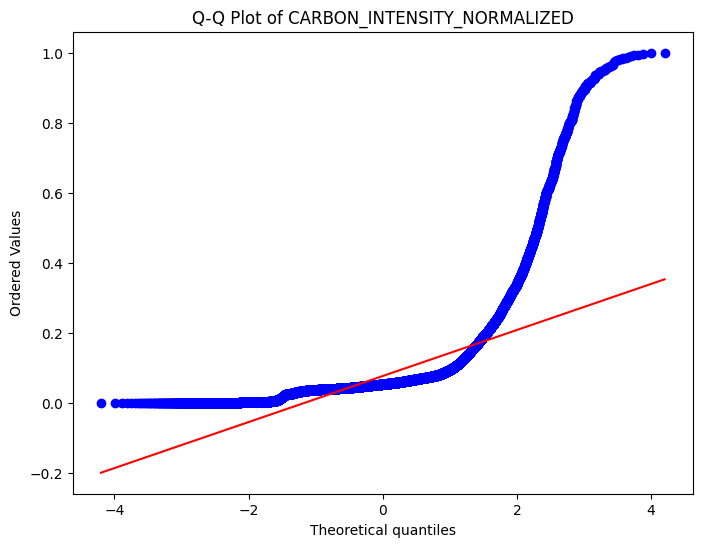

In [ ]:
import scipy.stats as stats
import matplotlib.pyplot as plt


# Plot Q-Q plot
plt.figure(figsize=(8, 6))
stats.probplot(data['CARBON_INTENSITY_NORMALIZED'], dist="norm", plot=plt)
plt.title('Q-Q Plot of CARBON_INTENSITY_NORMALIZED')
plt.show()

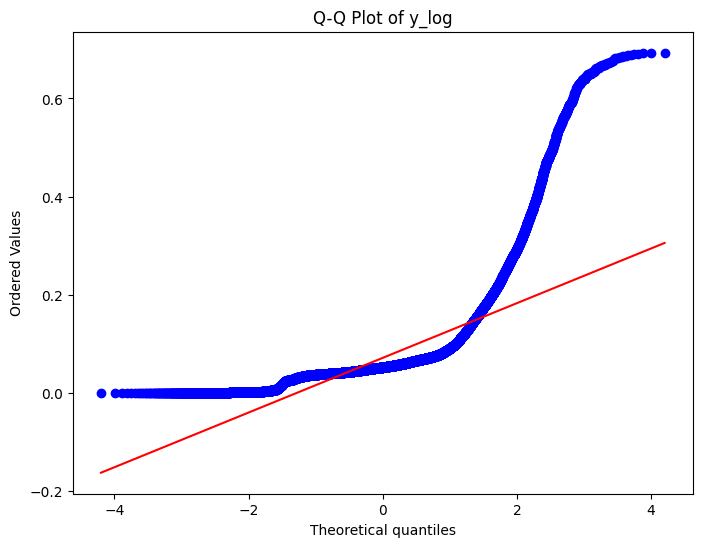

In [ ]:
import scipy.stats as stats
import matplotlib.pyplot as plt


# Plot Q-Q plot
plt.figure(figsize=(8, 6))
stats.probplot(y_log, dist="norm", plot=plt)
plt.title('Q-Q Plot of y_log')
plt.show()

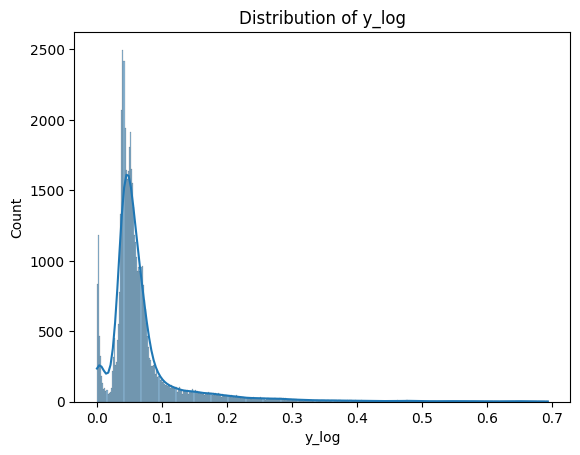

In [ ]:
import seaborn as sns

# Plot histogram of y_log
sns.histplot(y_log, kde=True)
plt.title('Distribution of y_log')
plt.xlabel('y_log')
plt.show()

<ipython-input-1-c70d516d12b5>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])
<ipython-input-1-c70d516d12b5>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[


Training MSE: 0.0049, R²: 0.3901
Testing MSE: 0.0066, R²: 0.2913


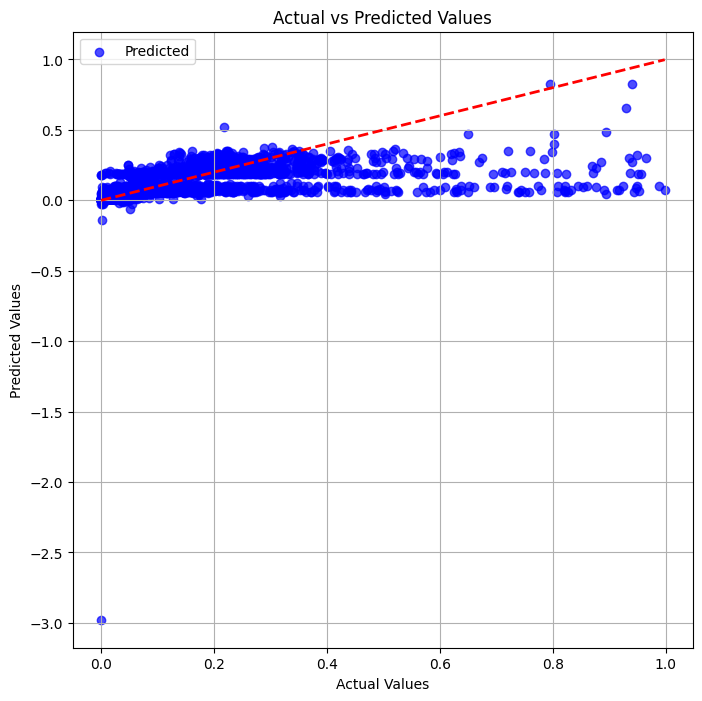

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Convert GENERATION_(KWH) to GWh (1 GWh = 1,000,000 kWh)
data['GENERATION_(GWh)'] = data['GENERATION_(KWH)'] / 1_000_000

# Recalculate Carbon Intensity using GWh
data['CARBON_INTENSITY_GWh'] = data['TONS_OF_CO2_EMISSIONS'] / data['GENERATION_(GWh)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_GWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_GWh'] <= threshold]

# Normalize CARBON_INTENSITY_GWh using Min-Max Scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'CARBON_INTENSITY_GWh', 'GENERATION_(GWh)'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Separate categorical and numerical columns
categorical_cols = ['PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR']
numerical_cols = [col for col in X.columns if col not in categorical_cols]

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numerical_cols),  # Pass through numerical columns
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)  # One-hot encode categorical columns
    ])

# Create a pipeline with preprocessing, polynomial features, and Ridge regression
degree = 2  # Degree of polynomial features
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('poly', PolynomialFeatures(degree=degree, include_bias=False)),
    ('scaler', StandardScaler()),
    ('ridge', Ridge(alpha=0.1, random_state=42))
])

# Train the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluate the model
train_mse = mean_squared_error(y_train, y_pred_train)
test_mse = mean_squared_error(y_test, y_pred_test)
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)

print(f"Training MSE: {train_mse:.4f}, R²: {train_r2:.4f}")
print(f"Testing MSE: {test_mse:.4f}, R²: {test_r2:.4f}")

# Visualize Actual vs Predicted Values
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.7, label='Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.grid(True)
plt.show()

<ipython-input-21-5a174bdf45ac>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])
<ipython-input-21-5a174bdf45ac>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[


Training MSE: 0.0046, R²: 0.4299
Testing MSE: 160.5325, R²: -17346.5882


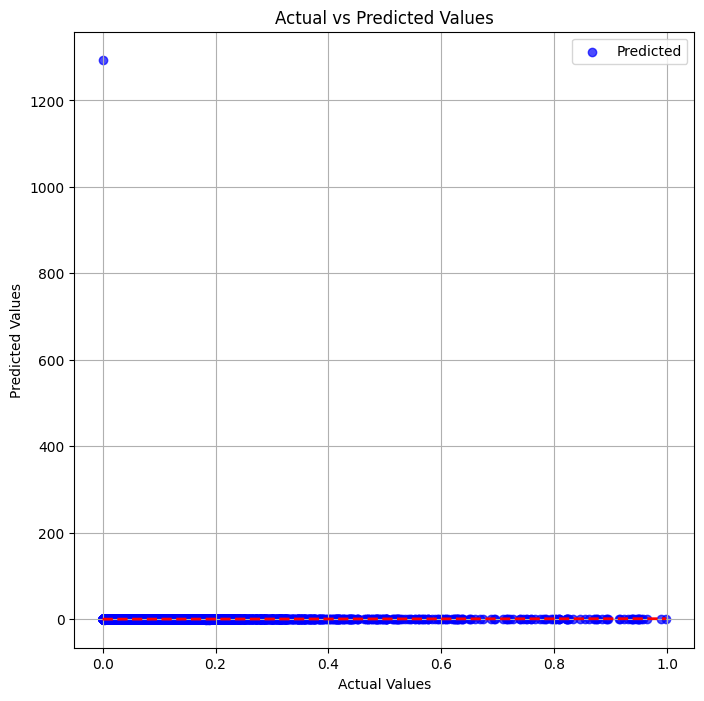

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Convert GENERATION_(KWH) to GWh (1 GWh = 1,000,000 kWh)
data['GENERATION_(GWh)'] = data['GENERATION_(KWH)'] / 1_000_000

# Recalculate Carbon Intensity using GWh
data['CARBON_INTENSITY_GWh'] = data['TONS_OF_CO2_EMISSIONS'] / data['GENERATION_(GWh)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_GWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_GWh'] <= threshold]

# Normalize CARBON_INTENSITY_GWh using Min-Max Scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'CARBON_INTENSITY_GWh', 'GENERATION_(GWh)'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Separate categorical and numerical columns
categorical_cols = ['PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR']
numerical_cols = [col for col in X.columns if col not in categorical_cols]

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numerical_cols),  # Pass through numerical columns
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)  # One-hot encode categorical columns
    ])

# Create a pipeline with preprocessing, polynomial features, and Ridge regression
degree = 3  # Degree of polynomial features
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('poly', PolynomialFeatures(degree=degree, include_bias=False)),
    ('scaler', StandardScaler()),
    ('ridge', Ridge(alpha=0.1, random_state=42))
])

# Train the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluate the model
train_mse = mean_squared_error(y_train, y_pred_train)
test_mse = mean_squared_error(y_test, y_pred_test)
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)

print(f"Training MSE: {train_mse:.4f}, R²: {train_r2:.4f}")
print(f"Testing MSE: {test_mse:.4f}, R²: {test_r2:.4f}")

# Visualize Actual vs Predicted Values
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.7, label='Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Convert GENERATION_(KWH) to GWh (1 GWh = 1,000,000 kWh)
data['GENERATION_(GWh)'] = data['GENERATION_(KWH)'] / 1_000_000

# Recalculate Carbon Intensity using GWh
data['CARBON_INTENSITY_GWh'] = data['TONS_OF_CO2_EMISSIONS'] / data['GENERATION_(GWh)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_GWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_GWh'] <= threshold]

# Normalize CARBON_INTENSITY_GWh using Min-Max Scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'CARBON_INTENSITY_GWh', 'GENERATION_(GWh)'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Separate categorical and numerical columns
categorical_cols = ['PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR']
numerical_cols = [col for col in X.columns if col not in categorical_cols]

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numerical_cols),  # Pass through numerical columns
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)  # One-hot encode categorical columns
    ])

# Create a pipeline with preprocessing, polynomial features, and Ridge regression
degree = 4  # Degree of polynomial features
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('poly', PolynomialFeatures(degree=degree, include_bias=False)),
    ('scaler', StandardScaler()),
    ('ridge', Ridge(alpha=0.1, random_state=42))
])

# Train the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluate the model
train_mse = mean_squared_error(y_train, y_pred_train)
test_mse = mean_squared_error(y_test, y_pred_test)
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)

print(f"Training MSE: {train_mse:.4f}, R²: {train_r2:.4f}")
print(f"Testing MSE: {test_mse:.4f}, R²: {test_r2:.4f}")

# Visualize Actual vs Predicted Values
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.7, label='Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.grid(True)
plt.show()

<ipython-input-23-8ec5097e5edd>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])
<ipython-input-23-8ec5097e5edd>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[


# **THRESHOLD SETTING**

In [ ]:
max(data['CARBON_INTENSITY_NORMALIZED'])

1.0

In [ ]:
min(data['CARBON_INTENSITY_NORMALIZED'])

0.0

Mounted at /content/drive


<ipython-input-2-dcdbb8b60571>:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])
<ipython-input-2-dcdbb8b60571>:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[


Highly Distributed Model Performance:
MSE: 78818559016926144.0000, R²: -13740924979378833408.0000
Remaining Model Performance:
MSE: 807171580225839.3750, R²: -140719194409378784.0000
Combined Model Performance:
MSE: 804469664572892.1250, R²: -140248152807618656.0000


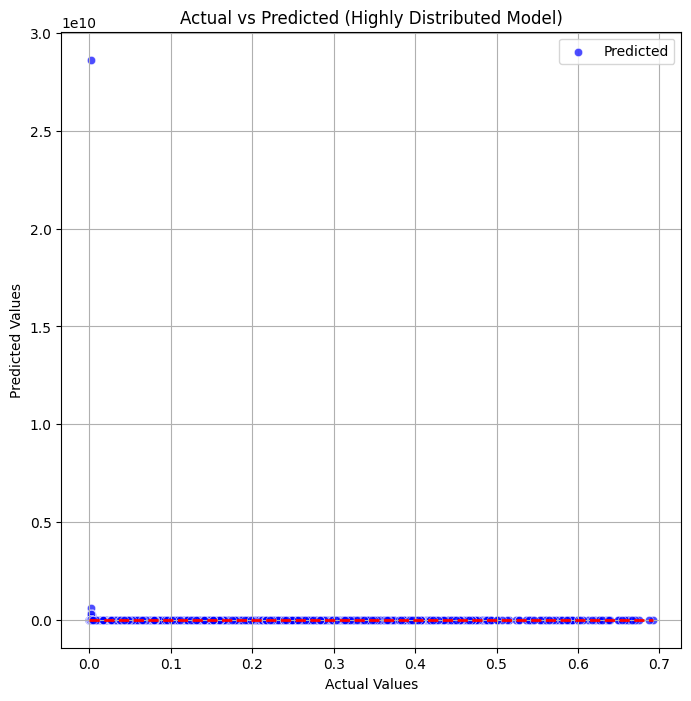

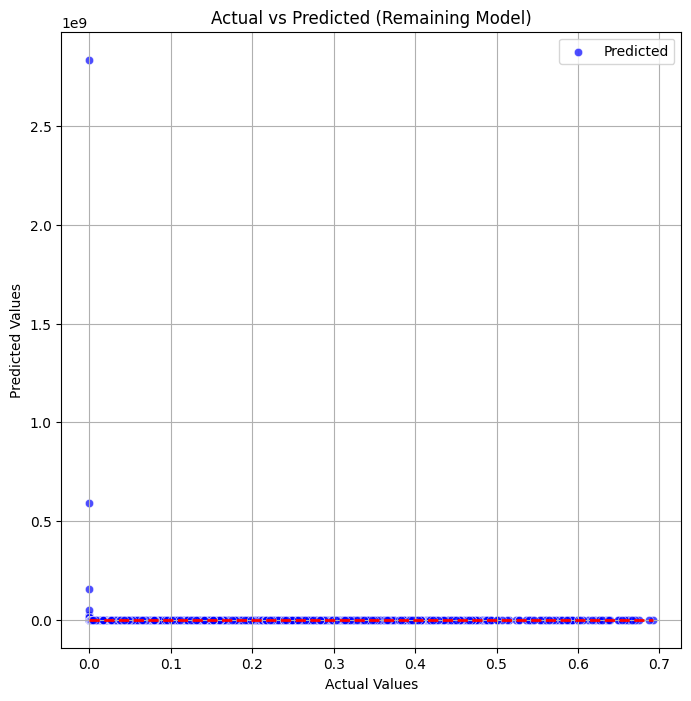

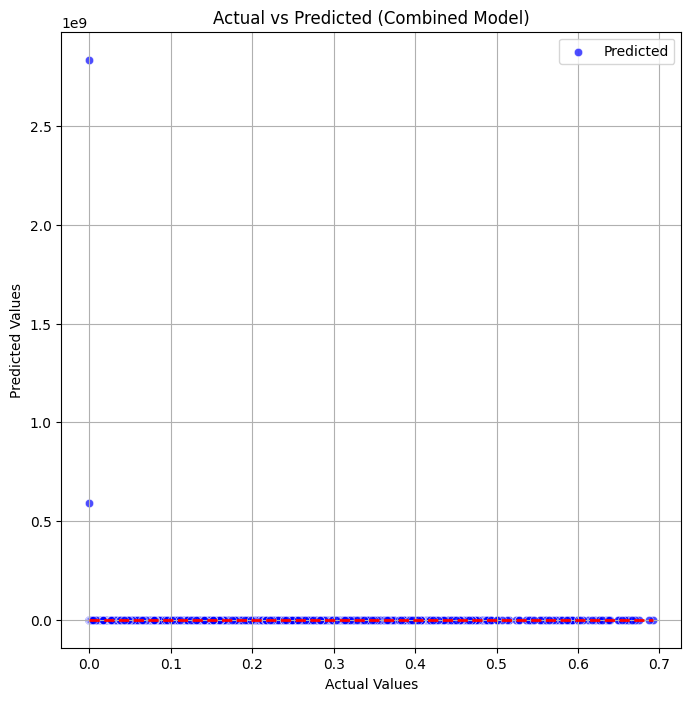

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures, TargetEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Convert GENERATION_(KWH) to GWh (1 GWh = 1,000,000 kWh)
data['GENERATION_(GWh)'] = data['GENERATION_(KWH)'] / 1_000_000

# Recalculate Carbon Intensity using GWh
data['CARBON_INTENSITY_GWh'] = data['TONS_OF_CO2_EMISSIONS'] / data['GENERATION_(GWh)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_GWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_GWh'] <= threshold]

# Normalize CARBON_INTENSITY_GWh using Min-Max Scaling
scaler = MinMaxScaler()
data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_GWh', 'CARBON_INTENSITY', 'GENERATION_(GWh)'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Define the threshold for splitting
threshold_split = 0.2

# Split the data based on the target variable
mask_highly_distributed = (y_train <= threshold_split)
X_train_highly_distributed = X_train[mask_highly_distributed]
y_train_highly_distributed = y_train[mask_highly_distributed]

X_train_remaining = X_train[~mask_highly_distributed]
y_train_remaining = y_train[~mask_highly_distributed]

# Create the pipeline for both models
def create_pipeline(degree=2, alpha=0.1):
    return Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('poly', PolynomialFeatures(degree=degree, include_bias=False)),
        ('scaler', StandardScaler()),
        ('ridge', Ridge(alpha=alpha, random_state=42))
    ])

# Train the first model on the highly distributed part
model_highly_distributed = create_pipeline(degree=2, alpha=0.1)
model_highly_distributed.fit(X_train_highly_distributed, y_train_highly_distributed)

# Train the second model on the remaining part
model_remaining = create_pipeline(degree=2, alpha=0.1)
model_remaining.fit(X_train_remaining, y_train_remaining)

# Function to predict using dual models
def predict_with_dual_models(X_new, model_highly_distributed, model_remaining, threshold=0.2):
    # Predict using both models
    pred_highly_distributed = model_highly_distributed.predict(X_new)
    pred_remaining = model_remaining.predict(X_new)

    # Initialize an array to store final predictions
    final_predictions = []

    for i in range(len(X_new)):
        # Check if the prediction from the first model falls within the threshold
        if pred_highly_distributed[i] <= threshold:
            final_predictions.append(pred_highly_distributed[i])
        else:
            final_predictions.append(pred_remaining[i])

    return np.array(final_predictions)

# Make predictions for both models and the combined model
y_pred_highly_distributed = model_highly_distributed.predict(X_test)
y_pred_remaining = model_remaining.predict(X_test)
y_pred_combined = predict_with_dual_models(X_test, model_highly_distributed, model_remaining, threshold_split)

# Evaluate the models
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"{model_name} Performance:")
    print(f"MSE: {mse:.4f}, R²: {r2:.4f}")

evaluate_model(y_test, y_pred_highly_distributed, "Highly Distributed Model")
evaluate_model(y_test, y_pred_remaining, "Remaining Model")
evaluate_model(y_test, y_pred_combined, "Combined Model")

# Visualize Actual vs Predicted Values for all models
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(8, 8))
    sns.scatterplot(x=y_true, y=y_pred, color='blue', alpha=0.7, label='Predicted')
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
    plt.title(title)
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.legend()
    plt.grid(True)
    plt.show()

plot_actual_vs_predicted(y_test, y_pred_highly_distributed, "Actual vs Predicted (Highly Distributed Model)")
plot_actual_vs_predicted(y_test, y_pred_remaining, "Actual vs Predicted (Remaining Model)")
plot_actual_vs_predicted(y_test, y_pred_combined, "Actual vs Predicted (Combined Model)")

In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 5.0 MB/s eta 0:00:00


# **THRESHOLD SETTING**

Mounted at /content/drive
Highly Distributed Model Performance:
MAE: 0.2503, MSE: 0.0698, RMSE: 0.2643, R²: -11.1749
Remaining Model Performance:
MAE: 0.2503, MSE: 0.0698, RMSE: 0.2643, R²: -11.1749
Combined Model Performance:
MAE: 0.2503, MSE: 0.0698, RMSE: 0.2643, R²: -11.1749


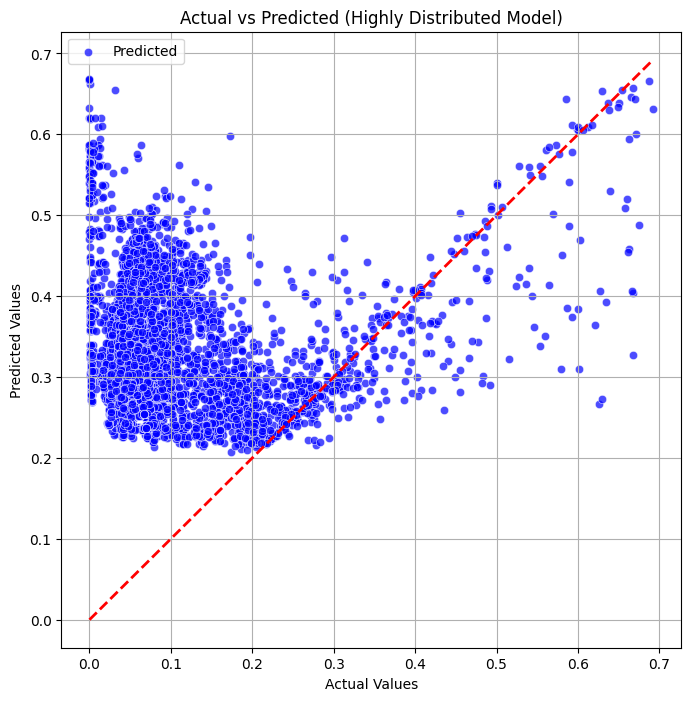

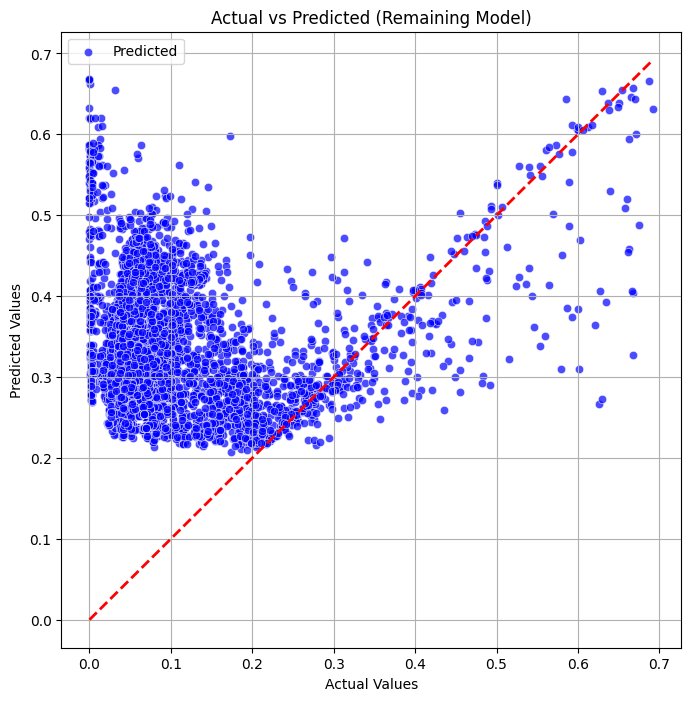

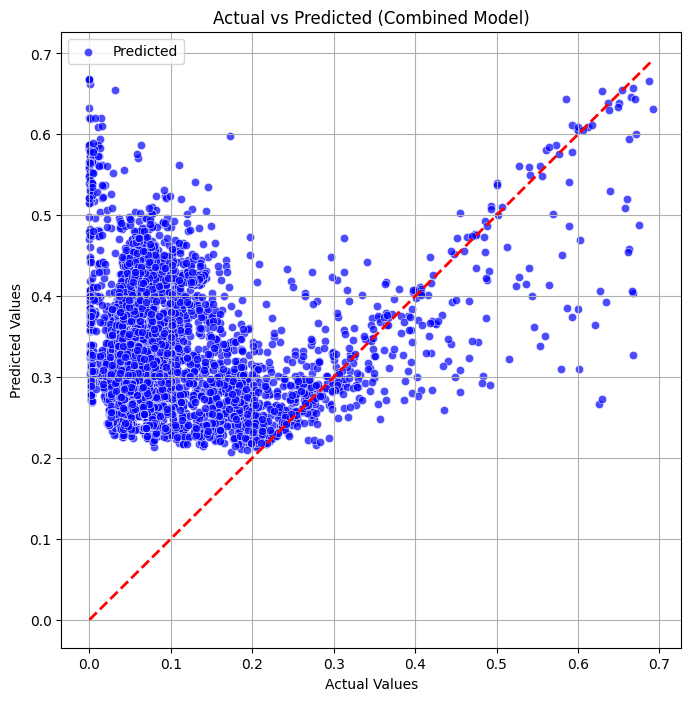

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from xgboost import XGBRegressor
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Convert GENERATION_(KWH) to GWh (1 GWh = 1,000,000 kWh)
data['GENERATION_(GWh)'] = data['GENERATION_(KWH)'] / 1_000_000

# Recalculate Carbon Intensity using GWh
data['CARBON_INTENSITY_GWh'] = data['TONS_OF_CO2_EMISSIONS'] / data['GENERATION_(GWh)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_GWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_GWh'] <= threshold]

# Normalize CARBON_INTENSITY_GWh using Min-Max Scaling
scaler = MinMaxScaler()
data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_GWh', 'CARBON_INTENSITY', 'GENERATION_(GWh)'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost with Regularization
model = XGBRegressor(
    n_estimators=100,
    random_state=42,
    learning_rate=0.1,
    reg_lambda=1.0,  # L2 regularization (default is 1)
    reg_alpha=0.1    # L1 regularization (default is 0)
)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Define the threshold for splitting
threshold_split = 0.2

# Split the data based on the target variable
mask_highly_distributed = (y_train <= threshold_split)
X_train_highly_distributed = X_train[mask_highly_distributed]
y_train_highly_distributed = y_train[mask_highly_distributed]

X_train_remaining = X_train[~mask_highly_distributed]
y_train_remaining = y_train[~mask_highly_distributed]

# Train the first model on the highly distributed part
pipeline_highly_distributed = pipeline
pipeline_highly_distributed.fit(X_train_highly_distributed, y_train_highly_distributed)

# Train the second model on the remaining part
pipeline_remaining = pipeline
pipeline_remaining.fit(X_train_remaining, y_train_remaining)

# Function to predict using dual models
def predict_with_dual_models(X_new, pipeline_highly_distributed, pipeline_remaining, threshold=0.2):
    # Predict using both models
    pred_highly_distributed = pipeline_highly_distributed.predict(X_new)
    pred_remaining = pipeline_remaining.predict(X_new)

    # Initialize an array to store final predictions
    final_predictions = []

    for i in range(len(X_new)):
        # Check if the prediction from the first model falls within the threshold
        if pred_highly_distributed[i] <= threshold:
            final_predictions.append(pred_highly_distributed[i])
        else:
            final_predictions.append(pred_remaining[i])

    return np.array(final_predictions)

# Make predictions for both models and the combined model
y_pred_highly_distributed = pipeline_highly_distributed.predict(X_test)
y_pred_remaining = pipeline_remaining.predict(X_test)
y_pred_combined = predict_with_dual_models(X_test, pipeline_highly_distributed, pipeline_remaining, threshold_split)

# Evaluate the models
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"{model_name} Performance:")
    print(f"MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

evaluate_model(y_test, y_pred_highly_distributed, "Highly Distributed Model")
evaluate_model(y_test, y_pred_remaining, "Remaining Model")
evaluate_model(y_test, y_pred_combined, "Combined Model")

# Visualize Actual vs Predicted Values for all models
import matplotlib.pyplot as plt
import seaborn as sns

def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(8, 8))
    sns.scatterplot(x=y_true, y=y_pred, color='blue', alpha=0.7, label='Predicted')
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
    plt.title(title)
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.legend()
    plt.grid(True)
    plt.show()

plot_actual_vs_predicted(y_test, y_pred_highly_distributed, "Actual vs Predicted (Highly Distributed Model)")
plot_actual_vs_predicted(y_test, y_pred_remaining, "Actual vs Predicted (Remaining Model)")
plot_actual_vs_predicted(y_test, y_pred_combined, "Actual vs Predicted (Combined Model)")

Highly Distributed Subset Size: 39633
Remaining Subset Size: 2106


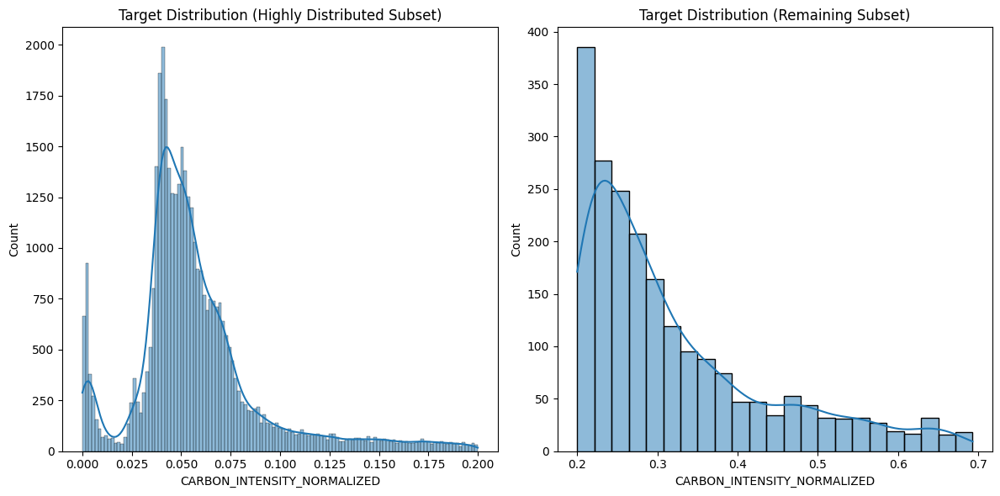

In [ ]:
# Define the threshold for splitting
threshold_split = 0.2

# Split the data based on the target variable
mask_highly_distributed = (y_train <= threshold_split)
X_train_highly_distributed = X_train[mask_highly_distributed]
y_train_highly_distributed = y_train[mask_highly_distributed]

X_train_remaining = X_train[~mask_highly_distributed]
y_train_remaining = y_train[~mask_highly_distributed]

# Check the sizes of the subsets
print(f"Highly Distributed Subset Size: {len(X_train_highly_distributed)}")
print(f"Remaining Subset Size: {len(X_train_remaining)}")

# Visualize the distribution of the target variable in each subset
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(y_train_highly_distributed, kde=True)
plt.title("Target Distribution (Highly Distributed Subset)")

plt.subplot(1, 2, 2)
sns.histplot(y_train_remaining, kde=True)
plt.title("Target Distribution (Remaining Subset)")

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Convert GENERATION_(KWH) to GWh (1 GWh = 1,000,000 kWh)
data['GENERATION_(GWh)'] = data['GENERATION_(KWH)'] / 1_000_000

# Recalculate Carbon Intensity using GWh
data['CARBON_INTENSITY_GWh'] = data['TONS_OF_CO2_EMISSIONS'] / data['GENERATION_(GWh)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_GWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_GWh'] <= threshold]

# Normalize CARBON_INTENSITY_GWh using Min-Max Scaling
scaler = MinMaxScaler()
data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_GWh', 'CARBON_INTENSITY', 'GENERATION_(GWh)'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Reset indices to ensure alignment
data.reset_index(drop=True, inplace=True)
X.reset_index(drop=True, inplace=True)
y.reset_index(drop=True, inplace=True)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost with Regularization
model = XGBRegressor(
    n_estimators=100,
    random_state=42,
    learning_rate=0.1,
    reg_lambda=1.0,  # L2 regularization (default is 1)
    reg_alpha=0.1    # L1 regularization (default is 0)
)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Define bins for stratification
bins = [-np.inf, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]  # Include -np.inf for the lower bound
labels = [f"{bins[i]:.1f}-{bins[i+1]:.1f}" for i in range(len(bins)-1)]

# Create the target_bin column
data['target_bin'] = pd.cut(data['CARBON_INTENSITY_NORMALIZED'], bins=bins, labels=labels)

# Check for NaN values in target_bin
if data['target_bin'].isnull().any():
    print("Rows with NaN in target_bin:")
    print(data[data['target_bin'].isnull()])

    # Option 1: Drop rows with NaN in target_bin
    data.dropna(subset=['target_bin'], inplace=True)

    # Option 2: Assign NaN values to a default bin (e.g., "unknown")
    # data['target_bin'].fillna('unknown', inplace=True)

# Apply StratifiedKFold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform cross-validation
fold_metrics = []
for fold, (train_index, test_index) in enumerate(skf.split(X, data['target_bin'])):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train the model
    pipeline.fit(X_train, y_train)

    # Predict and evaluate
    y_pred = pipeline.predict(X_test)

    # Evaluate overall performance
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    fold_metrics.append((fold + 1, mse, r2))
    print(f"Fold {fold + 1}: MSE = {mse:.4f}, R² = {r2:.4f}")

    # Evaluate performance for each bin
    for label in data['target_bin'].cat.categories:
        # Create a mask for the test set
        mask = data.iloc[test_index]['target_bin'].reset_index(drop=True) == label

        # Extract true and predicted values for the bin
        y_true_bin = y_test.reset_index(drop=True)[mask]
        y_pred_bin = y_pred[mask]

        if len(y_true_bin) > 0:  # Ensure there are samples in the bin
            bin_mse = mean_squared_error(y_true_bin, y_pred_bin)
            bin_r2 = r2_score(y_true_bin, y_pred_bin)
            print(f"  Bin {label}: MSE = {bin_mse:.4f}, R² = {bin_r2:.4f}")

# Convert fold metrics to DataFrame
fold_metrics_df = pd.DataFrame(fold_metrics, columns=['Fold', 'MSE', 'R²'])
print(fold_metrics_df)

# Evaluate performance for each bin
bin_metrics = []
for label in data['target_bin'].cat.categories:
    mask = data['target_bin'] == label
    y_true_bin = y[mask]
    y_pred_bin = pipeline.predict(X[mask])

    if len(y_true_bin) > 0:  # Ensure there are samples in the bin
        mse = mean_squared_error(y_true_bin, y_pred_bin)
        r2 = r2_score(y_true_bin, y_pred_bin)
        bin_metrics.append((label, mse, r2))

# Convert to DataFrame for better visualization
bin_metrics_df = pd.DataFrame(bin_metrics, columns=['Bin', 'MSE', 'R²'])
print(bin_metrics_df)

Mounted at /content/drive


<ipython-input-16-5517252b74aa>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_GWh']])
<ipython-input-16-5517252b74aa>:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[
<ipython-input-16-5517252b74aa>:134: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

Fold 1: MSE = 0.0024, R² = 0.7066
  Bin -inf-0.1: MSE = 0.0003, R² = 0.3093
  Bin 0.1-0.2: MSE = 0.0028, R² = -2.4359
  Bin 0.2-0.3: MSE = 0.0037, R² = -3.6781
  Bin 0.3-0.4: MSE = 0.0085, R² = -11.2078
  Bin 0.4-0.5: MSE = 0.0394, R² = -49.2695
  Bin 0.5-0.6: MSE = 0.0815, R² = -105.5959
  Bin 0.6-0.7: MSE = 0.0861, R² = -144.5521
  Bin 0.7-0.8: MSE = 0.1253, R² = -161.4993
  Bin 0.8-0.9: MSE = 0.2211, R² = -217.4133
  Bin 0.9-1.0: MSE = 0.3365, R² = -332.6924
Fold 2: MSE = 0.0022, R² = 0.7380
  Bin -inf-0.1: MSE = 0.0002, R² = 0.4993
  Bin 0.1-0.2: MSE = 0.0033, R² = -2.8806
  Bin 0.2-0.3: MSE = 0.0034, R² = -2.8030
  Bin 0.3-0.4: MSE = 0.0080, R² = -9.3410
  Bin 0.4-0.5: MSE = 0.0320, R² = -42.9609
  Bin 0.5-0.6: MSE = 0.0688, R² = -127.4338
  Bin 0.6-0.7: MSE = 0.1021, R² = -118.7823
  Bin 0.7-0.8: MSE = 0.1090, R² = -138.2389
  Bin 0.8-0.9: MSE = 0.2107, R² = -269.7194
  Bin 0.9-1.0: MSE = 0.2260, R² = -214.0826
Fold 3: MSE = 0.0022, R² = 0.7398
  Bin -inf-0.1: MSE = 0.0002, R² = 

In [ ]:
# Create the target_bin column
data['target_bin'] = pd.cut(data['CARBON_INTENSITY_NORMALIZED'], bins=bins, labels=labels)

# Check for NaN values in target_bin
if data['target_bin'].isnull().any():
    print("Rows with NaN in target_bin:")
    print(data[data['target_bin'].isnull()])

    # Option 1: Drop rows with NaN in target_bin
    data.dropna(subset=['target_bin'], inplace=True)

    # Option 2: Assign NaN values to a default bin (e.g., "unknown")
    # data['target_bin'].fillna('unknown', inplace=True)

Rows with NaN in target_bin:
          PLANT_NAME STATE     PRIME_MOVER FUEL_CODE    SECTOR_GROUP  \
2203  Coyote Springs    OR  Combined Cycle        NG  ELECTRIC POWER   

      GENERATION_(KWH)  TONS_OF_CO2_EMISSIONS   YEAR  CARBON_INTENSITY  \
2203       284936000.0                 0.0585  2010s      2.053093e-10   

      FUEL_EFFICIENCY  GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)  \
2203      284936000.0                                             1.0   

      COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)  \
2203                                              0.0   

      PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)  \
2203                                             0.0   

      GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)  \
2203                                             0.0   

      MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)  GENERATION_(GWh)  \
2203                                             0.0           284.936   

      CARBON_INTENSITY_GWh  CARBON_INTEN

Mounted at /content/drive


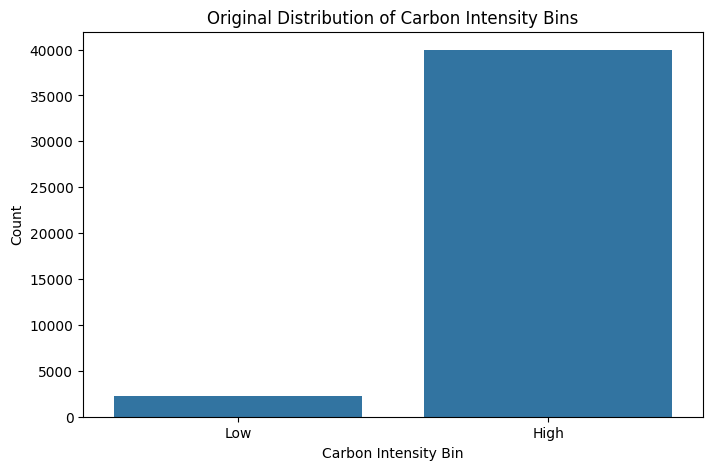

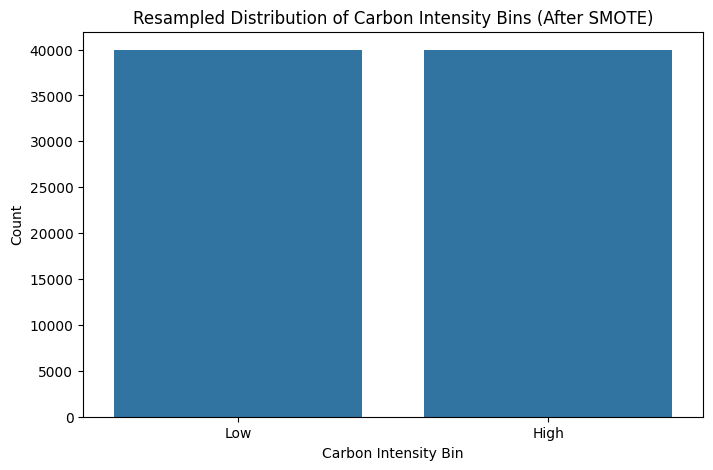

Original class distribution:
BIN
High    39942
Low      2218
Name: count, dtype: int64

Resampled class distribution:
BIN
Low     39942
High    39942
Name: count, dtype: int64


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Step 1: Calculate Carbon Intensity (g CO₂/kWh)
# Convert TONS_OF_CO2_EMISSIONS to grams (1 ton = 1e6 grams) and GENERATION_(KWH) to kWh
data['CARBON_INTENSITY'] = (data['TONS_OF_CO2_EMISSIONS'] * 1e6) / data['GENERATION_(KWH)']

# Step 2: Binning based on the threshold of 100 g CO₂/kWh
# Define bins and labels
bins = [-np.inf, 100, np.inf]  # Two bins: <=100 g CO₂/kWh and >100 g CO₂/kWh
labels = ['Low', 'High']
data['BIN'] = pd.cut(data['CARBON_INTENSITY'], bins=bins, labels=labels)

# Step 3: Feature Engineering
# Separate features and target
X = data.drop(columns=['CARBON_INTENSITY', 'BIN'])  # Features
y = data['BIN']  # Target

# Identify categorical and numerical columns
categorical_cols = ['PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP', 'YEAR']
numerical_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),  # Scale numerical features
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)  # One-hot encode categorical features
    ]
)

# Apply preprocessing
X_preprocessed = preprocessor.fit_transform(X)

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y, test_size=0.2, random_state=42, stratify=y)

# Step 4: Apply SMOTE to balance the bins
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Step 5: Visualize the original and resampled distributions
# Original distribution
plt.figure(figsize=(8, 5))
sns.countplot(x=y_train, order=['Low', 'High'])
plt.title('Original Distribution of Carbon Intensity Bins')
plt.xlabel('Carbon Intensity Bin')
plt.ylabel('Count')
plt.show()

# Resampled distribution
resampled_data = pd.DataFrame({'BIN': y_resampled})
plt.figure(figsize=(8, 5))
sns.countplot(x=resampled_data['BIN'], order=['Low', 'High'])
plt.title('Resampled Distribution of Carbon Intensity Bins (After SMOTE)')
plt.xlabel('Carbon Intensity Bin')
plt.ylabel('Count')
plt.show()

# Optional: Print class distribution before and after SMOTE
print("Original class distribution:")
print(y_train.value_counts())

print("\nResampled class distribution:")
print(pd.Series(y_resampled).value_counts())

Classification Report:
              precision    recall  f1-score   support

        High       1.00      1.00      1.00      9986
         Low       0.95      0.99      0.97       555

    accuracy                           1.00     10541
   macro avg       0.97      1.00      0.98     10541
weighted avg       1.00      1.00      1.00     10541



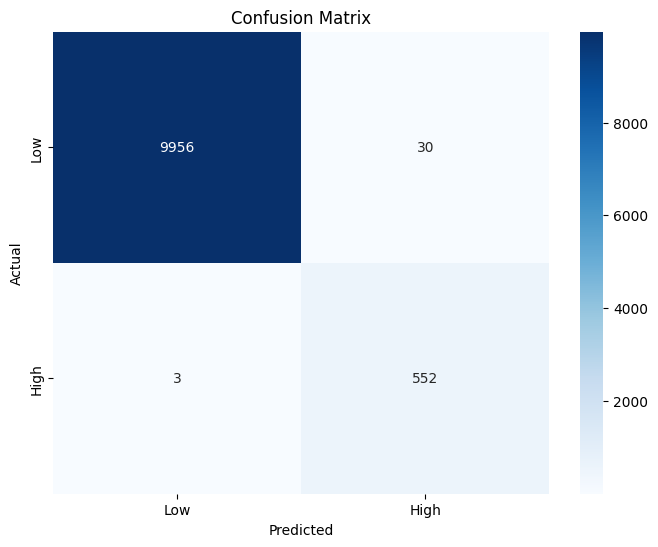

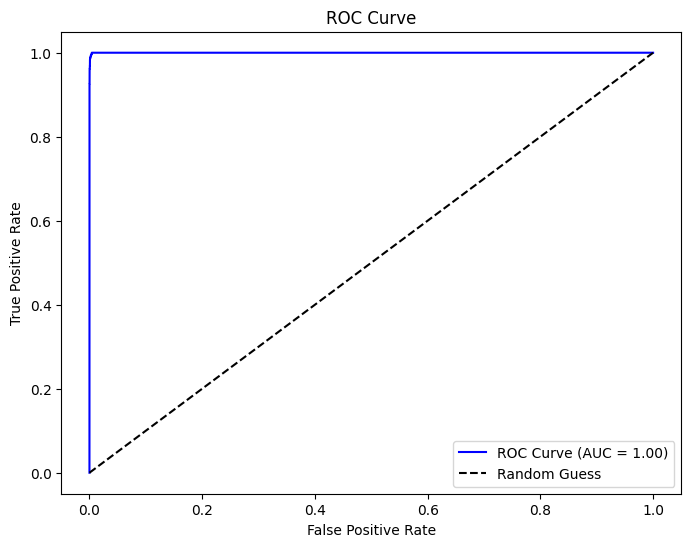

Accuracy: 1.00


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    accuracy_score,
)
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/cleaned_emissions_data.csv')

# Step 1: Calculate Carbon Intensity (g CO₂/kWh)
data['CARBON_INTENSITY'] = (data['TONS_OF_CO2_EMISSIONS'] * 1e6) / data['GENERATION_(KWH)']

# Step 2: Binning based on the threshold of 100 g CO₂/kWh
bins = [-np.inf, 100, np.inf]  # Two bins: <=100 g CO₂/kWh and >100 g CO₂/kWh
labels = ['Low', 'High']
data['BIN'] = pd.cut(data['CARBON_INTENSITY'], bins=bins, labels=labels)

# Step 3: Feature Engineering
# Separate features and target
X = data.drop(columns=['CARBON_INTENSITY', 'BIN'])  # Features
y = data['BIN']  # Target

# Identify categorical and numerical columns
categorical_cols = ['PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP']
numerical_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),  # Scale numerical features
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)  # One-hot encode categorical features
    ]
)

# Apply preprocessing
X_preprocessed = preprocessor.fit_transform(X)

# Encode target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # Converts 'Low' -> 0, 'High' -> 1

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Step 4: Apply SMOTE to balance the bins
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Step 5: Train a Classification Model
# Using XGBoost
model = XGBClassifier(random_state=42, scale_pos_weight=len(y_train[y_train == 0]) / len(y_train[y_train == 1]))

# Train the model
model.fit(X_resampled, y_resampled)

# Make predictions
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]  # Probabilities for the "High" class

# Decode predictions back to original labels
y_test_decoded = label_encoder.inverse_transform(y_test)
y_pred_decoded = label_encoder.inverse_transform(y_pred)

# Step 6: Evaluate the Model
# Classification Report
print("Classification Report:")
print(classification_report(y_test_decoded, y_pred_decoded))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_decoded, y_pred_decoded)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='blue')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Accuracy Score
accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Accuracy: {accuracy:.2f}")

In [ ]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation
cv_scores = cross_val_score(model, X_resampled, y_resampled, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

Cross-Validation Scores: [0.99856043 0.99881079 0.99887338 0.99862302 0.99862293]
Mean CV Score: 0.998698111321705


In [ ]:
importance_df = pd.DataFrame({
    'Feature': preprocessor.get_feature_names_out(),
    'Importance': model.feature_importances_
}).sort_values(by='Importance', ascending=False)

print(importance_df)

                                                Feature  Importance
3     num__COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(...    0.235515
4176                cat__PRIME_MOVER_Combustion Turbine    0.145588
4183                                 cat__FUEL_CODE_GEO    0.134029
4     num__PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(M...    0.068662
3717                   cat__PLANT_NAME_Van Sant Station    0.058372
...                                                 ...         ...
1415                cat__PLANT_NAME_Goddard Steam Plant    0.000000
1414                       cat__PLANT_NAME_Goal Line LP    0.000000
1413                   cat__PLANT_NAME_Glenwood Landing    0.000000
1412                           cat__PLANT_NAME_Glenwood    0.000000
1420                          cat__PLANT_NAME_Goldsmith    0.000000

[4202 rows x 2 columns]


Cross-Validation Scores: [0.9970351  0.99739089 0.99750949 0.99739089 0.99739089]
Mean CV Score: 0.9973434535104365
Classification Report:
              precision    recall  f1-score   support

        High       1.00      1.00      1.00      9986
         Low       0.95      0.99      0.97       555

    accuracy                           1.00     10541
   macro avg       0.98      1.00      0.99     10541
weighted avg       1.00      1.00      1.00     10541



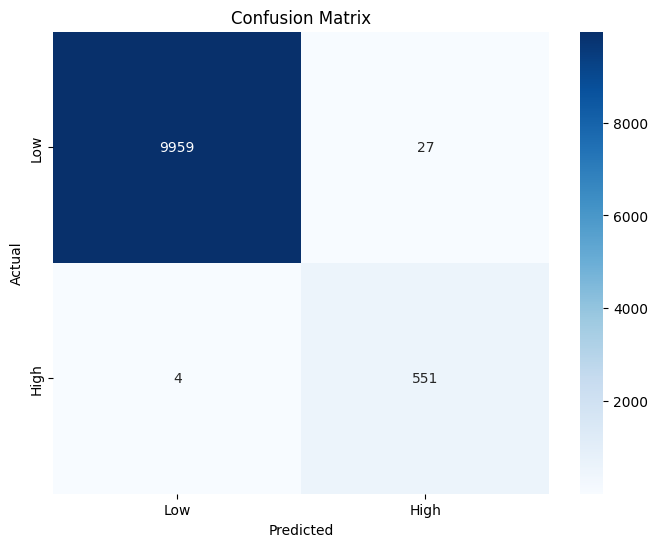

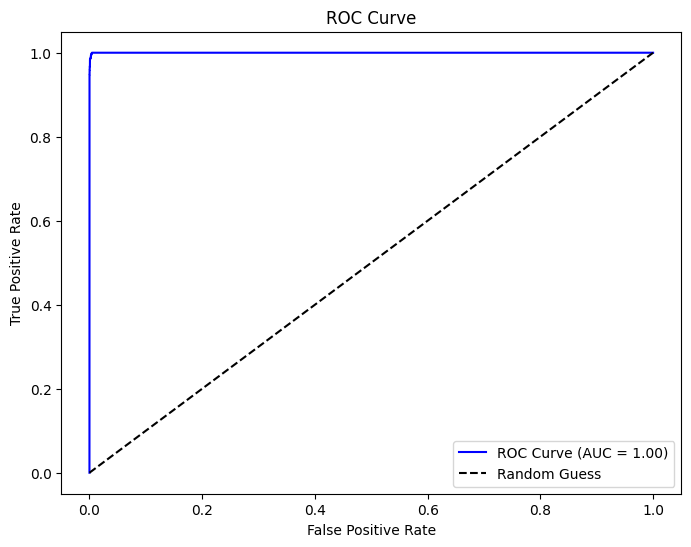

Accuracy: 1.00
Logistic Regression Cross-Validation Scores: [0.98493833 0.98458254 0.98529412 0.98446395 0.98363378]
Mean CV Score: 0.9845825426944972
Decision Tree Cross-Validation Scores: [0.98114326 0.98102467 0.98138046 0.98055028 0.98078748]
Mean CV Score: 0.9809772296015181
                                                Feature  Importance
3     num__COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(...    0.227734
4138                                 cat__FUEL_CODE_GEO    0.164086
4131                cat__PRIME_MOVER_Combustion Turbine    0.140779
4132                       cat__PRIME_MOVER_Gas Turbine    0.064211
4     num__PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(M...    0.056025
3678                   cat__PLANT_NAME_Van Sant Station    0.052862
4130                    cat__PRIME_MOVER_Combined Cycle    0.041884
6     num__MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(M...    0.036909
2409  cat__PLANT_NAME_NY - Presbyt. Hospital - 525 E...    0.035085
4133               cat__PRIME_MOVER_Int

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline  # Use imblearn's Pipeline instead of sklearn's
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    accuracy_score
)
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/cleaned_emissions_data.csv')

# Step 1: Calculate Carbon Intensity (g CO₂/kWh)
data['CARBON_INTENSITY'] = (data['TONS_OF_CO2_EMISSIONS'] * 1e6) / data['GENERATION_(KWH)']

# Step 2: Binning based on the threshold of 100 g CO₂/kWh
bins = [-np.inf, 100, np.inf]  # Two bins: <=100 g CO₂/kWh and >100 g CO₂/kWh
labels = ['Low', 'High']
data['BIN'] = pd.cut(data['CARBON_INTENSITY'], bins=bins, labels=labels)

# Step 3: Feature Engineering
# Separate features and target
X = data.drop(columns=['CARBON_INTENSITY', 'BIN'])  # Features
y = data['BIN']  # Target

# Encode target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # Converts 'Low' -> 0, 'High' -> 1

# Identify categorical and numerical columns
categorical_cols = ['PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP']
numerical_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),  # Scale numerical features
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)  # One-hot encode categorical features
    ]
)

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Step 4: Apply SMOTE to balance the bins
smote = SMOTE(random_state=42)

# Step 5: Train a Classification Model
# Using XGBoost
model = XGBClassifier(random_state=42, scale_pos_weight=len(y_train[y_train == 0]) / len(y_train[y_train == 1]))

# Create a pipeline with preprocessing, SMOTE, and model
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', model)
])

# Perform cross-validation
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# Fit the pipeline on the full training set
pipeline.fit(X_train, y_train)

# Make predictions
y_pred = pipeline.predict(X_test)
y_pred_proba = pipeline.predict_proba(X_test)[:, 1]  # Probabilities for the "High" class

# Decode predictions back to original labels
y_test_decoded = label_encoder.inverse_transform(y_test)
y_pred_decoded = label_encoder.inverse_transform(y_pred)

# Step 6: Evaluate the Model
# Classification Report
print("Classification Report:")
print(classification_report(y_test_decoded, y_pred_decoded))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_decoded, y_pred_decoded)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='blue')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Accuracy Score
accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Accuracy: {accuracy:.2f}")

# Step 7: Test Simpler Models
# Logistic Regression
pipeline_logreg = Pipeline([
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', LogisticRegression(random_state=42, max_iter=1000))
])
cv_scores_logreg = cross_val_score(pipeline_logreg, X_train, y_train, cv=5, scoring='accuracy')
print("Logistic Regression Cross-Validation Scores:", cv_scores_logreg)
print("Mean CV Score:", np.mean(cv_scores_logreg))

# Decision Tree
pipeline_dtree = Pipeline([
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', DecisionTreeClassifier(random_state=42, max_depth=5))
])
cv_scores_dtree = cross_val_score(pipeline_dtree, X_train, y_train, cv=5, scoring='accuracy')
print("Decision Tree Cross-Validation Scores:", cv_scores_dtree)
print("Mean CV Score:", np.mean(cv_scores_dtree))

# Step 8: Analyze Feature Importance
# After fitting the XGBoost model
importance_df = pd.DataFrame({
    'Feature': preprocessor.get_feature_names_out(),
    'Importance': model.feature_importances_
}).sort_values(by='Importance', ascending=False)

print(importance_df.head(10))  # Top 10 most important features

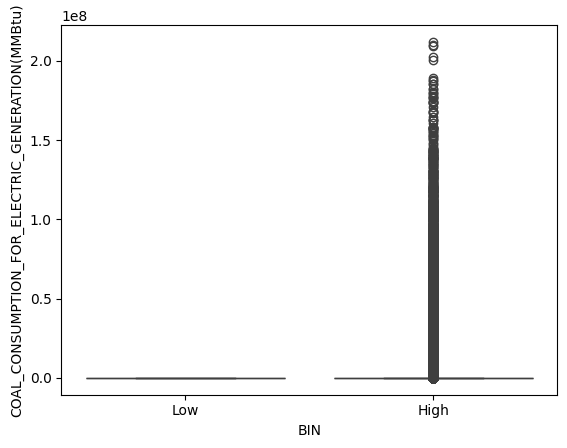

In [ ]:
import seaborn as sns
sns.boxplot(x='BIN', y='COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', data=data)
plt.show()

Cross-Validation Scores: [0.99833966 0.99774668 0.99786528 0.9972723  0.99750949]
Mean CV Score: 0.997746679316888
Classification Report:
              precision    recall  f1-score   support

        High       1.00      1.00      1.00      9986
         Low       0.98      0.99      0.98       555

    accuracy                           1.00     10541
   macro avg       0.99      0.99      0.99     10541
weighted avg       1.00      1.00      1.00     10541



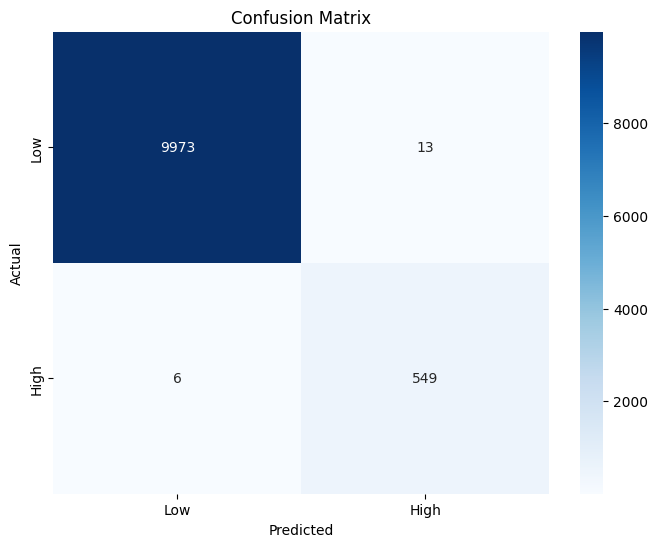

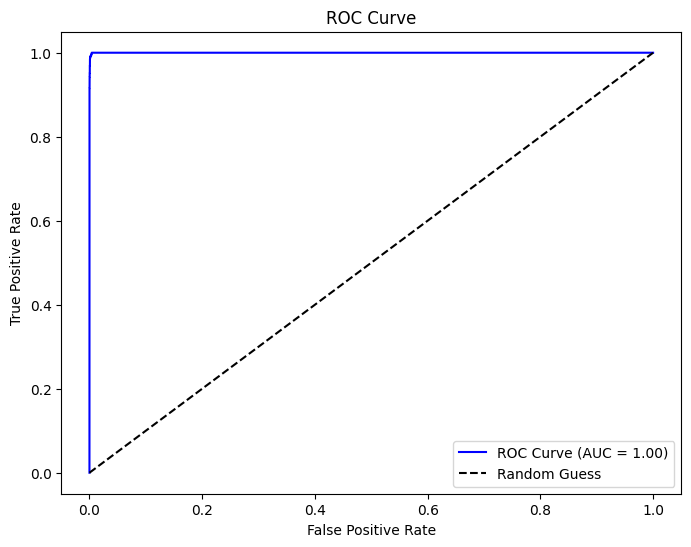

Accuracy: 1.00
Logistic Regression Cross-Validation Scores: [0.99383302 0.9941888  0.99407021 0.99312144 0.9941888 ]
Mean CV Score: 0.9938804554079695
Decision Tree Cross-Validation Scores: [0.99288425 0.9913425  0.99122391 0.99086812 0.99098672]
Mean CV Score: 0.99146110056926
                                     Feature  Importance
4130         cat__PRIME_MOVER_Combined Cycle    0.492348
4138                      cat__FUEL_CODE_GEO    0.323719
1382           cat__PLANT_NAME_Gillette SBMC    0.021301
1142                   cat__PLANT_NAME_Exira    0.020118
70    cat__PLANT_NAME_Agua Mansa Power Plant    0.012885
241      cat__PLANT_NAME_BASF Freeport Works    0.008976
1599        cat__PLANT_NAME_Henrietta Peaker    0.007651
2452                cat__PLANT_NAME_New Bern    0.007402
121                    cat__PLANT_NAME_Alsey    0.006317
1952    cat__PLANT_NAME_LSP-Cottage Grove LP    0.005503


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline  # Use sklearn's Pipeline since SMOTE is removed
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    accuracy_score
)
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/cleaned_emissions_data.csv')

# Step 1: Calculate Carbon Intensity (g CO₂/kWh)
data['CARBON_INTENSITY'] = (data['TONS_OF_CO2_EMISSIONS'] * 1e6) / data['GENERATION_(KWH)']

# Step 2: Binning based on the threshold of 100 g CO₂/kWh
bins = [-np.inf, 100, np.inf]  # Two bins: <=100 g CO₂/kWh and >100 g CO₂/kWh
labels = ['Low', 'High']
data['BIN'] = pd.cut(data['CARBON_INTENSITY'], bins=bins, labels=labels)

# Step 3: Feature Engineering
# Separate features and target
X = data.drop(columns=['CARBON_INTENSITY', 'BIN'])  # Features
y = data['BIN']  # Target

# Encode target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # Converts 'Low' -> 0, 'High' -> 1

# Identify categorical and numerical columns
categorical_cols = ['PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP']
numerical_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),  # Scale numerical features
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)  # One-hot encode categorical features
    ]
)

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Step 4: Train a Classification Model (Without SMOTE)
# Using XGBoost
model = XGBClassifier(random_state=42, scale_pos_weight=len(y_train[y_train == 0]) / len(y_train[y_train == 1]))

# Create a pipeline with preprocessing and model
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', model)
])

# Perform cross-validation
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# Fit the pipeline on the full training set
pipeline.fit(X_train, y_train)

# Make predictions
y_pred = pipeline.predict(X_test)
y_pred_proba = pipeline.predict_proba(X_test)[:, 1]  # Probabilities for the "High" class

# Decode predictions back to original labels
y_test_decoded = label_encoder.inverse_transform(y_test)
y_pred_decoded = label_encoder.inverse_transform(y_pred)

# Step 5: Evaluate the Model
# Classification Report
print("Classification Report:")
print(classification_report(y_test_decoded, y_pred_decoded))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_decoded, y_pred_decoded)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='blue')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Accuracy Score
accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Accuracy: {accuracy:.2f}")

# Step 6: Test Simpler Models
# Logistic Regression
pipeline_logreg = Pipeline([
    ('preprocessor', preprocessor),
    ('model', LogisticRegression(random_state=42, max_iter=1000))
])
cv_scores_logreg = cross_val_score(pipeline_logreg, X_train, y_train, cv=5, scoring='accuracy')
print("Logistic Regression Cross-Validation Scores:", cv_scores_logreg)
print("Mean CV Score:", np.mean(cv_scores_logreg))

# Decision Tree
pipeline_dtree = Pipeline([
    ('preprocessor', preprocessor),
    ('model', DecisionTreeClassifier(random_state=42, max_depth=5))
])
cv_scores_dtree = cross_val_score(pipeline_dtree, X_train, y_train, cv=5, scoring='accuracy')
print("Decision Tree Cross-Validation Scores:", cv_scores_dtree)
print("Mean CV Score:", np.mean(cv_scores_dtree))

# Step 7: Analyze Feature Importance
# After fitting the XGBoost model
importance_df = pd.DataFrame({
    'Feature': preprocessor.get_feature_names_out(),
    'Importance': model.feature_importances_
}).sort_values(by='Importance', ascending=False)

print(importance_df.head(10))  # Top 10 most important features

In [ ]:
# Example: Check distribution of PRIME_MOVER across classes
print(data.groupby(['BIN', 'PRIME_MOVER']).size())

BIN   PRIME_MOVER        
Low   Combined Cycle          2066
      Combustion Turbine         5
      Gas Turbine               56
      Internal Combustion       35
      Other                    225
      Steam Turbine            386
High  Combined Cycle          1254
      Combustion Turbine      6684
      Gas Turbine            13458
      Internal Combustion    10520
      Other                   1139
      Steam Turbine          16873
dtype: int64


<ipython-input-16-b10dfee67ed9>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(data.groupby(['BIN', 'PRIME_MOVER']).size())


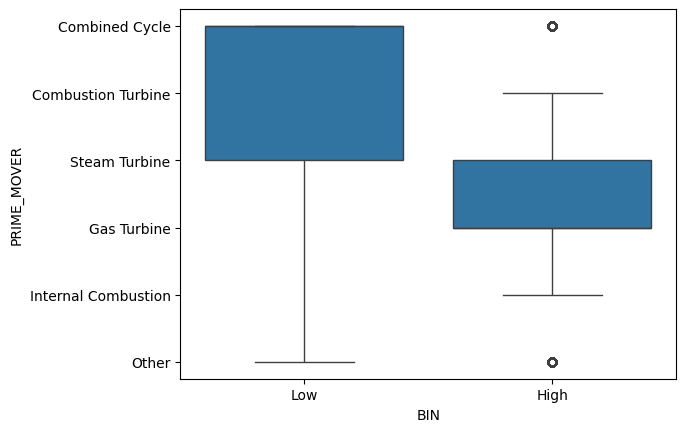

In [ ]:
import seaborn as sns
sns.boxplot(x='BIN', y='PRIME_MOVER', data=data)
plt.show()

In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.8 MB/s eta 0:00:00


model training with 100 threshold

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from xgboost import XGBRegressor
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Recalculate Carbon Intensity in g CO₂/kWh
data['CARBON_INTENSITY_g_per_kWh'] = (data['TONS_OF_CO2_EMISSIONS'] * 1_000_000) / data['GENERATION_(KWH)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_g_per_kWh'] <= threshold]

# Normalize CARBON_INTENSITY_g_per_kWh using Min-Max Scaling
scaler = MinMaxScaler()
data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_g_per_kWh', 'CARBON_INTENSITY'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost with Regularization
model = XGBRegressor(
    n_estimators=100,
    random_state=42,
    learning_rate=0.1,
    reg_lambda=1.0,  # L2 regularization (default is 1)
    reg_alpha=0.1    # L1 regularization (default is 0)
)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Split data into two bins based on carbon intensity
bins = [-np.inf, 100, np.inf]  # Two bins: <=100 g CO₂/kWh and >100 g CO₂/kWh
labels = ['Low', 'High']
data['BIN'] = pd.cut(data['CARBON_INTENSITY_g_per_kWh'], bins=bins, labels=labels)

# Separate data into two subsets
low_bin_data = data[data['BIN'] == 'Low']
high_bin_data = data[data['BIN'] == 'High']

# Prepare datasets for Low bin
X_low = low_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_low = low_bin_data['CARBON_INTENSITY_NORMALIZED']
y_low_log = np.log1p(y_low)

# Prepare datasets for High bin
X_high = high_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_high = high_bin_data['CARBON_INTENSITY_NORMALIZED']
y_high_log = np.log1p(y_high)

# Train and evaluate for Low bin
print("Training model for Low bin...")
X_train_low, X_test_low, y_train_low, y_test_low = train_test_split(X_low, y_low_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_low, y_train_low)
y_pred_low = pipeline.predict(X_test_low)

mse_low = mean_squared_error(y_test_low, y_pred_low)
rmse_low = np.sqrt(mse_low)
mae_low = mean_absolute_error(y_test_low, y_pred_low)
r2_low = r2_score(y_test_low, y_pred_low)

print("\nMetrics for Low bin:")
print(f"MAE: {mae_low:.4f}")
print(f"MSE: {mse_low:.4f}")
print(f"RMSE: {rmse_low:.4f}")
print(f"R²: {r2_low:.4f}")

# Train and evaluate for High bin
print("\nTraining model for High bin...")
X_train_high, X_test_high, y_train_high, y_test_high = train_test_split(X_high, y_high_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_high, y_train_high)
y_pred_high = pipeline.predict(X_test_high)

mse_high = mean_squared_error(y_test_high, y_pred_high)
rmse_high = np.sqrt(mse_high)
mae_high = mean_absolute_error(y_test_high, y_pred_high)
r2_high = r2_score(y_test_high, y_pred_high)

print("\nMetrics for High bin:")
print(f"MAE: {mae_high:.4f}")
print(f"MSE: {mse_high:.4f}")
print(f"RMSE: {rmse_high:.4f}")
print(f"R²: {r2_high:.4f}")

Mounted at /content/drive


<ipython-input-5-07b2c352739f>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])


Training model for Low bin...

Metrics for Low bin:
MAE: 0.0002
MSE: 0.0000
RMSE: 0.0003
R²: 0.9661

Training model for High bin...

Metrics for High bin:
MAE: 0.0110
MSE: 0.0011
RMSE: 0.0334
R²: 0.7716


Plots for Low Bin:


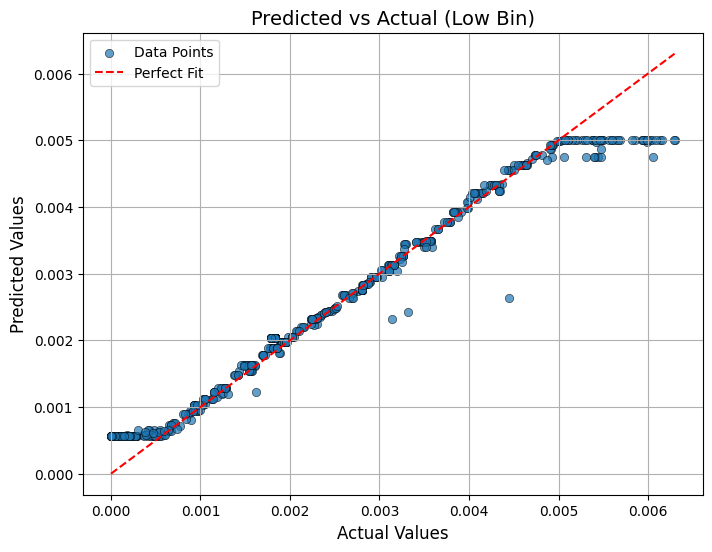

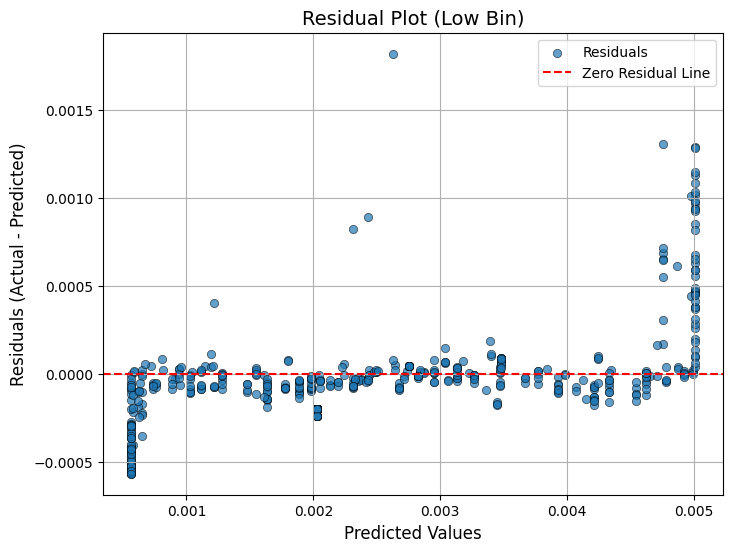

Plots for High Bin:


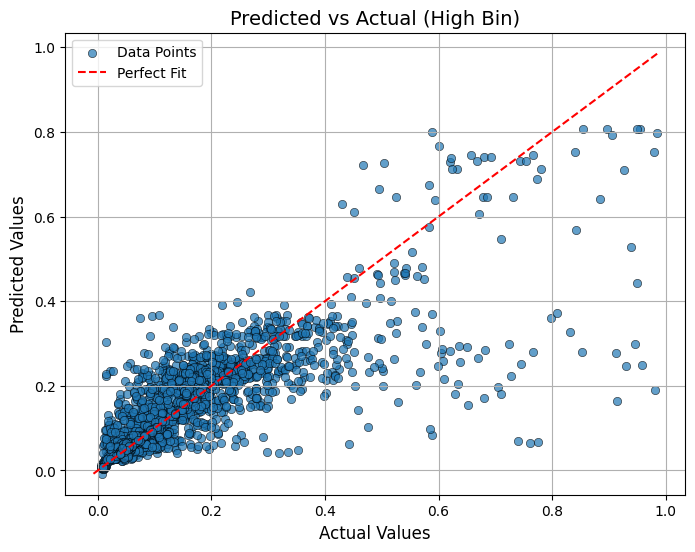

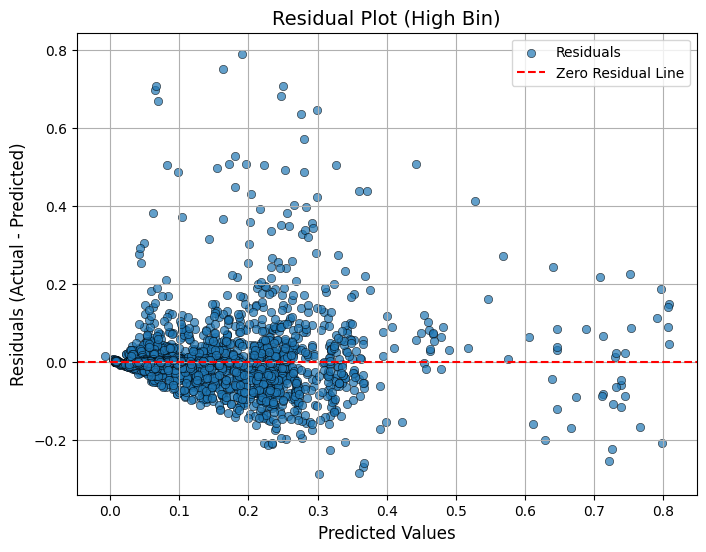

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot predicted vs actual values
def plot_predicted_vs_actual(y_test, y_pred, title="Predicted vs Actual", save_path=None):
    """
    Plots predicted vs actual values with a diagonal line for reference.

    Parameters:
        y_test (array-like): Actual target values.
        y_pred (array-like): Predicted target values.
        title (str): Title of the plot.
        save_path (str, optional): Path to save the plot (if needed).
    """
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.7, edgecolor='k', label="Data Points")

    # Add a diagonal line for perfect predictions
    min_val = min(min(y_test), min(y_pred))
    max_val = max(max(y_test), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label="Perfect Fit")

    plt.title(title, fontsize=14)
    plt.xlabel("Actual Values", fontsize=12)
    plt.ylabel("Predicted Values", fontsize=12)
    plt.legend()
    plt.grid(True)

    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

# Function to plot residuals
def plot_residuals(y_test, y_pred, title="Residual Plot", save_path=None):
    """
    Plots residuals (actual - predicted) against predicted values.

    Parameters:
        y_test (array-like): Actual target values.
        y_pred (array-like): Predicted target values.
        title (str): Title of the plot.
        save_path (str, optional): Path to save the plot (if needed).
    """
    residuals = y_test - y_pred

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.7, edgecolor='k', label="Residuals")

    # Add a horizontal line at zero
    plt.axhline(y=0, color='red', linestyle='--', label="Zero Residual Line")

    plt.title(title, fontsize=14)
    plt.xlabel("Predicted Values", fontsize=12)
    plt.ylabel("Residuals (Actual - Predicted)", fontsize=12)
    plt.legend()
    plt.grid(True)

    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

# Generate plots for Low bin
print("Plots for Low Bin:")
plot_predicted_vs_actual(np.expm1(y_test_low), np.expm1(y_pred_low), title="Predicted vs Actual (Low Bin)")
plot_residuals(np.expm1(y_test_low), np.expm1(y_pred_low), title="Residual Plot (Low Bin)")

# Generate plots for High bin
print("Plots for High Bin:")
plot_predicted_vs_actual(np.expm1(y_test_high), np.expm1(y_pred_high), title="Predicted vs Actual (High Bin)")
plot_residuals(np.expm1(y_test_high), np.expm1(y_pred_high), title="Residual Plot (High Bin)")

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Select numerical columns for clustering
numerical_cols = [
    'GENERATION_(KWH)',
    'TONS_OF_CO2_EMISSIONS',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Extract numerical data
X = data[numerical_cols]

# Handle missing values (if any)
X = X.fillna(0)  # Replace missing values with 0 or use imputation if needed

# Standardize the data (important for K-Means)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

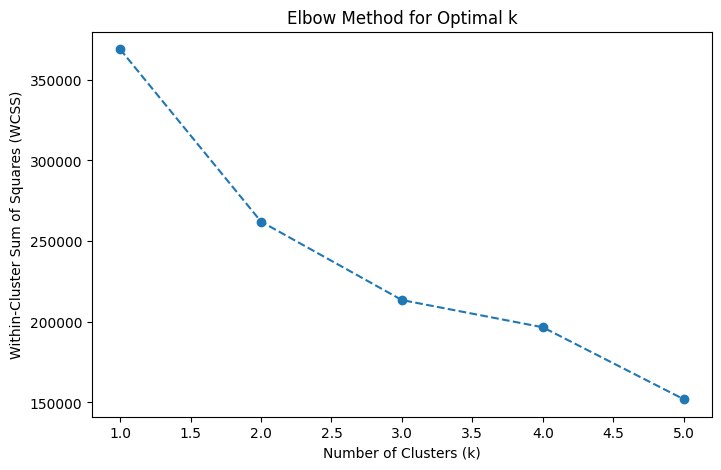

In [ ]:
# Use the Elbow Method to find the optimal number of clusters
wcss = []  # Within-Cluster Sum of Squares
k_range = range(1, 6)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)  # Inertia is the WCSS

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(k_range, wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Optimal k')
plt.show()

model training with kmeans clusters thresholds

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from xgboost import XGBRegressor
from sklearn.cluster import KMeans  # Add KMeans for clustering
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Recalculate Carbon Intensity in g CO₂/kWh
data['CARBON_INTENSITY_g_per_kWh'] = (data['TONS_OF_CO2_EMISSIONS'] * 1_000_000) / data['GENERATION_(KWH)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_g_per_kWh'] <= threshold]

# Normalize CARBON_INTENSITY_g_per_kWh using Min-Max Scaling
scaler = MinMaxScaler()
data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Apply K-Means clustering to split the data into 3 clusters
features_for_clustering = ['CARBON_INTENSITY_g_per_kWh', 'FUEL_CONSUMPTION_TOTAL', 'GENERATION_(KWH)']
X_cluster = data[features_for_clustering].fillna(0)  # Fill missing values if any
kmeans = KMeans(n_clusters=3, random_state=42)
data.loc[:, 'Cluster'] = kmeans.fit_predict(X_cluster)

# Analyze cluster statistics (optional)
cluster_stats = data.groupby('Cluster')[features_for_clustering].mean()
print("Cluster Statistics:")
print(cluster_stats)

# Replace BIN column with Cluster labels
data.loc[:, 'BIN'] = data['Cluster'].map({0: 'Low', 1: 'Medium', 2: 'High'})  # Map clusters to meaningful labels

# Verify the presence of the 'BIN' column
print("\nColumns in the DataFrame after adding BIN:")
print(data.columns)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_g_per_kWh', 'CARBON_INTENSITY', 'Cluster', 'BIN'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost with Regularization
model = XGBRegressor(
    n_estimators=100,
    random_state=42,
    learning_rate=0.1,
    reg_lambda=1.0,  # L2 regularization (default is 1)
    reg_alpha=0.1    # L1 regularization (default is 0)
)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Separate data into three subsets based on clusters
low_bin_data = data[data['BIN'] == 'Low']
medium_bin_data = data[data['BIN'] == 'Medium']
high_bin_data = data[data['BIN'] == 'High']

# Prepare datasets for Low bin
X_low = low_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'Cluster', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_low = low_bin_data['CARBON_INTENSITY_NORMALIZED']
y_low_log = np.log1p(y_low)

# Prepare datasets for Medium bin
X_medium = medium_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'Cluster', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_medium = medium_bin_data['CARBON_INTENSITY_NORMALIZED']
y_medium_log = np.log1p(y_medium)

# Prepare datasets for High bin
X_high = high_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'Cluster', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_high = high_bin_data['CARBON_INTENSITY_NORMALIZED']
y_high_log = np.log1p(y_high)

# Train and evaluate for Low bin
print("Training model for Low bin...")
X_train_low, X_test_low, y_train_low, y_test_low = train_test_split(X_low, y_low_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_low, y_train_low)
y_pred_low = pipeline.predict(X_test_low)

mse_low = mean_squared_error(y_test_low, y_pred_low)
rmse_low = np.sqrt(mse_low)
mae_low = mean_absolute_error(y_test_low, y_pred_low)
r2_low = r2_score(y_test_low, y_pred_low)

print("\nMetrics for Low bin:")
print(f"MAE: {mae_low:.4f}")
print(f"MSE: {mse_low:.4f}")
print(f"RMSE: {rmse_low:.4f}")
print(f"R²: {r2_low:.4f}")

# Train and evaluate for Medium bin
print("\nTraining model for Medium bin...")
X_train_medium, X_test_medium, y_train_medium, y_test_medium = train_test_split(X_medium, y_medium_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_medium, y_train_medium)
y_pred_medium = pipeline.predict(X_test_medium)

mse_medium = mean_squared_error(y_test_medium, y_pred_medium)
rmse_medium = np.sqrt(mse_medium)
mae_medium = mean_absolute_error(y_test_medium, y_pred_medium)
r2_medium = r2_score(y_test_medium, y_pred_medium)

print("\nMetrics for Medium bin:")
print(f"MAE: {mae_medium:.4f}")
print(f"MSE: {mse_medium:.4f}")
print(f"RMSE: {rmse_medium:.4f}")
print(f"R²: {r2_medium:.4f}")

# Train and evaluate for High bin
print("\nTraining model for High bin...")
X_train_high, X_test_high, y_train_high, y_test_high = train_test_split(X_high, y_high_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_high, y_train_high)
y_pred_high = pipeline.predict(X_test_high)

mse_high = mean_squared_error(y_test_high, y_pred_high)
rmse_high = np.sqrt(mse_high)
mae_high = mean_absolute_error(y_test_high, y_pred_high)
r2_high = r2_score(y_test_high, y_pred_high)

print("\nMetrics for High bin:")
print(f"MAE: {mae_high:.4f}")
print(f"MSE: {mse_high:.4f}")
print(f"RMSE: {rmse_high:.4f}")
print(f"R²: {r2_high:.4f}")

Mounted at /content/drive


<ipython-input-32-6e292b5321aa>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])


Cluster Statistics:
         CARBON_INTENSITY_g_per_kWh  FUEL_CONSUMPTION_TOTAL  GENERATION_(KWH)
Cluster                                                                      
0                        694.803048            2.645834e+07      2.860162e+09
1                        989.075443            9.444865e+07      9.361230e+09
2                       1281.230003            1.177688e+06      1.340928e+08

Columns in the DataFrame after adding BIN:
Index(['PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
       'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR', 'CARBON_INTENSITY',
       'FUEL_EFFICIENCY', 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
       'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
       'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
       'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
       'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
       'CARBON_INTENSITY_g_per_kWh', 'CARBON_INTENSITY_NORMALIZED',
       'FUEL_CONSUM

/usr/local/lib/python3.11/dist-packages/sklearn/feature_selection/_univariate_selection.py:381: RuntimeWarning: invalid value encountered in sqrt
  X_norms = np.sqrt(row_norms(X.T, squared=True) - n_samples * X_means**2)



Metrics for Medium bin:
MAE: 0.0010
MSE: 0.0000
RMSE: 0.0032
R²: 0.9574

Training model for High bin...

Metrics for High bin:
MAE: 0.0117
MSE: 0.0011
RMSE: 0.0338
R²: 0.7788


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from xgboost import XGBRegressor
from sklearn.cluster import KMeans  # Add KMeans for clustering
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Recalculate Carbon Intensity in g CO₂/kWh
data['CARBON_INTENSITY_g_per_kWh'] = (data['TONS_OF_CO2_EMISSIONS'] * 1_000_000) / data['GENERATION_(KWH)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_g_per_kWh'] <= threshold]

# Normalize CARBON_INTENSITY_g_per_kWh using Min-Max Scaling
scaler = MinMaxScaler()
data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Apply K-Means clustering to split the data into 3 clusters
features_for_clustering = ['CARBON_INTENSITY_g_per_kWh', 'FUEL_CONSUMPTION_TOTAL', 'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'FUEL_EFFICIENCY']
X_cluster = data[features_for_clustering].fillna(0)  # Fill missing values if any
kmeans = KMeans(n_clusters=3, random_state=42)
data.loc[:, 'Cluster'] = kmeans.fit_predict(X_cluster)

# Analyze cluster statistics (optional)
cluster_stats = data.groupby('Cluster')[features_for_clustering].mean()
print("Cluster Statistics:")
print(cluster_stats)

# Replace BIN column with Cluster labels
data.loc[:, 'BIN'] = data['Cluster'].map({0: 'Low', 1: 'Medium', 2: 'High'})  # Map clusters to meaningful labels

# Verify the presence of the 'BIN' column
print("\nColumns in the DataFrame after adding BIN:")
print(data.columns)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_g_per_kWh', 'CARBON_INTENSITY', 'Cluster', 'BIN'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost with Regularization
model = XGBRegressor(
    n_estimators=100,
    random_state=42,
    learning_rate=0.1,
    reg_lambda=1.0,  # L2 regularization (default is 1)
    reg_alpha=0.1    # L1 regularization (default is 0)
)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Separate data into three subsets based on clusters
low_bin_data = data[data['BIN'] == 'Low']
medium_bin_data = data[data['BIN'] == 'Medium']
high_bin_data = data[data['BIN'] == 'High']

# Prepare datasets for Low bin
X_low = low_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'Cluster', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_low = low_bin_data['CARBON_INTENSITY_NORMALIZED']
y_low_log = np.log1p(y_low)

# Prepare datasets for Medium bin
X_medium = medium_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'Cluster', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_medium = medium_bin_data['CARBON_INTENSITY_NORMALIZED']
y_medium_log = np.log1p(y_medium)

# Prepare datasets for High bin
X_high = high_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'Cluster', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_high = high_bin_data['CARBON_INTENSITY_NORMALIZED']
y_high_log = np.log1p(y_high)

# Train and evaluate for Low bin
print("Training model for Low bin...")
X_train_low, X_test_low, y_train_low, y_test_low = train_test_split(X_low, y_low_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_low, y_train_low)
y_pred_low = pipeline.predict(X_test_low)

mse_low = mean_squared_error(y_test_low, y_pred_low)
rmse_low = np.sqrt(mse_low)
mae_low = mean_absolute_error(y_test_low, y_pred_low)
r2_low = r2_score(y_test_low, y_pred_low)

print("\nMetrics for Low bin:")
print(f"MAE: {mae_low:.4f}")
print(f"MSE: {mse_low:.4f}")
print(f"RMSE: {rmse_low:.4f}")
print(f"R²: {r2_low:.4f}")

# Train and evaluate for Medium bin
print("\nTraining model for Medium bin...")
X_train_medium, X_test_medium, y_train_medium, y_test_medium = train_test_split(X_medium, y_medium_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_medium, y_train_medium)
y_pred_medium = pipeline.predict(X_test_medium)

mse_medium = mean_squared_error(y_test_medium, y_pred_medium)
rmse_medium = np.sqrt(mse_medium)
mae_medium = mean_absolute_error(y_test_medium, y_pred_medium)
r2_medium = r2_score(y_test_medium, y_pred_medium)

print("\nMetrics for Medium bin:")
print(f"MAE: {mae_medium:.4f}")
print(f"MSE: {mse_medium:.4f}")
print(f"RMSE: {rmse_medium:.4f}")
print(f"R²: {r2_medium:.4f}")

# Train and evaluate for High bin
print("\nTraining model for High bin...")
X_train_high, X_test_high, y_train_high, y_test_high = train_test_split(X_high, y_high_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_high, y_train_high)
y_pred_high = pipeline.predict(X_test_high)

mse_high = mean_squared_error(y_test_high, y_pred_high)
rmse_high = np.sqrt(mse_high)
mae_high = mean_absolute_error(y_test_high, y_pred_high)
r2_high = r2_score(y_test_high, y_pred_high)

print("\nMetrics for High bin:")
print(f"MAE: {mae_high:.4f}")
print(f"MSE: {mse_high:.4f}")
print(f"RMSE: {rmse_high:.4f}")
print(f"R²: {r2_high:.4f}")

Mounted at /content/drive


<ipython-input-33-826362df3464>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])
<ipython-input-33-826362df3464>:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[


Cluster Statistics:
         CARBON_INTENSITY_g_per_kWh  FUEL_CONSUMPTION_TOTAL  GENERATION_(KWH)  \
Cluster                                                                         
0                        694.803048            2.645834e+07      2.860162e+09   
1                        989.075443            9.444865e+07      9.361230e+09   
2                       1281.230003            1.177688e+06      1.340928e+08   

         TONS_OF_CO2_EMISSIONS  FUEL_EFFICIENCY  
Cluster                                          
0                 2.084521e+06       600.394292  
1                 9.356163e+06       115.488216  
2                 9.786900e+04     10274.341621  

Columns in the DataFrame after adding BIN:
Index(['PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
       'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR', 'CARBON_INTENSITY',
       'FUEL_EFFICIENCY', 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
       'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(M

/usr/local/lib/python3.11/dist-packages/sklearn/feature_selection/_univariate_selection.py:381: RuntimeWarning: invalid value encountered in sqrt
  X_norms = np.sqrt(row_norms(X.T, squared=True) - n_samples * X_means**2)



Metrics for Medium bin:
MAE: 0.0010
MSE: 0.0000
RMSE: 0.0032
R²: 0.9574

Training model for High bin...

Metrics for High bin:
MAE: 0.0117
MSE: 0.0011
RMSE: 0.0338
R²: 0.7788


model training with median threshold

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from xgboost import XGBRegressor
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Recalculate Carbon Intensity in g CO₂/kWh
data['CARBON_INTENSITY_g_per_kWh'] = (data['TONS_OF_CO2_EMISSIONS'] * 1_000_000) / data['GENERATION_(KWH)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_g_per_kWh'] <= threshold]

# Normalize CARBON_INTENSITY_g_per_kWh using Min-Max Scaling
scaler = MinMaxScaler()
data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Apply Median Split to divide the data into two groups
median_value = data['CARBON_INTENSITY_g_per_kWh'].median()
data.loc[:, 'BIN'] = pd.cut(
    data['CARBON_INTENSITY_g_per_kWh'],
    bins=[-np.inf, median_value, np.inf],
    labels=['Low', 'High']
)

# Analyze bin statistics (optional)
bin_stats = data.groupby('BIN')['CARBON_INTENSITY_g_per_kWh'].agg(['count', 'mean', 'std'])
print("Bin Statistics:")
print(bin_stats)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_g_per_kWh', 'CARBON_INTENSITY'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost with Regularization
model = XGBRegressor(
    n_estimators=100,
    random_state=42,
    learning_rate=0.1,
    reg_lambda=1.0,  # L2 regularization (default is 1)
    reg_alpha=0.1    # L1 regularization (default is 0)
)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Separate data into two subsets based on median split
low_bin_data = data[data['BIN'] == 'Low']
high_bin_data = data[data['BIN'] == 'High']

# Prepare datasets for Low bin
X_low = low_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_low = low_bin_data['CARBON_INTENSITY_NORMALIZED']
y_low_log = np.log1p(y_low)

# Prepare datasets for High bin
X_high = high_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_high = high_bin_data['CARBON_INTENSITY_NORMALIZED']
y_high_log = np.log1p(y_high)

# Train and evaluate for Low bin
print("Training model for Low bin...")
X_train_low, X_test_low, y_train_low, y_test_low = train_test_split(X_low, y_low_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_low, y_train_low)
y_pred_low = pipeline.predict(X_test_low)

mse_low = mean_squared_error(y_test_low, y_pred_low)
rmse_low = np.sqrt(mse_low)
mae_low = mean_absolute_error(y_test_low, y_pred_low)
r2_low = r2_score(y_test_low, y_pred_low)

print("\nMetrics for Low bin:")
print(f"MAE: {mae_low:.4f}")
print(f"MSE: {mse_low:.4f}")
print(f"RMSE: {rmse_low:.4f}")
print(f"R²: {r2_low:.4f}")

# Train and evaluate for High bin
print("\nTraining model for High bin...")
X_train_high, X_test_high, y_train_high, y_test_high = train_test_split(X_high, y_high_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_high, y_train_high)
y_pred_high = pipeline.predict(X_test_high)

mse_high = mean_squared_error(y_test_high, y_pred_high)
rmse_high = np.sqrt(mse_high)
mae_high = mean_absolute_error(y_test_high, y_pred_high)
r2_high = r2_score(y_test_high, y_pred_high)

print("\nMetrics for High bin:")
print(f"MAE: {mae_high:.4f}")
print(f"MSE: {mse_high:.4f}")
print(f"RMSE: {rmse_high:.4f}")
print(f"R²: {r2_high:.4f}")

Mounted at /content/drive


<ipython-input-34-a6b33d29a274>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])
<ipython-input-34-a6b33d29a274>:82: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = data.groupby('BIN')['CARBON_INTENSITY_g_per_kWh'].agg(['count', 'mean', 'std'])


Bin Statistics:
      count         mean          std
BIN                                  
Low   26087   594.113969   234.512989
High  26087  1854.205928  1816.386766
Training model for Low bin...

Metrics for Low bin:
MAE: 0.0012
MSE: 0.0000
RMSE: 0.0028
R²: 0.9646

Training model for High bin...

Metrics for High bin:
MAE: 0.0176
MSE: 0.0019
RMSE: 0.0432
R²: 0.7677


model training with iqr threshold

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from xgboost import XGBRegressor
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Recalculate Carbon Intensity in g CO₂/kWh
data['CARBON_INTENSITY_g_per_kWh'] = (data['TONS_OF_CO2_EMISSIONS'] * 1_000_000) / data['GENERATION_(KWH)']

# Remove outliers in Carbon Intensity using IQR
Q1 = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.25)
Q3 = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
data = data[(data['CARBON_INTENSITY_g_per_kWh'] >= lower_bound) & (data['CARBON_INTENSITY_g_per_kWh'] <= upper_bound)]

# Normalize CARBON_INTENSITY_g_per_kWh using Min-Max Scaling
scaler = MinMaxScaler()
data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Apply IQR-based threshold to divide the data into two groups
median_value = data['CARBON_INTENSITY_g_per_kWh'].median()
data.loc[:, 'BIN'] = pd.cut(
    data['CARBON_INTENSITY_g_per_kWh'],
    bins=[-np.inf, median_value, np.inf],
    labels=['Low', 'High']
)

# Analyze bin statistics (optional)
bin_stats = data.groupby('BIN')['CARBON_INTENSITY_g_per_kWh'].agg(['count', 'mean', 'std'])
print("Bin Statistics:")
print(bin_stats)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_g_per_kWh', 'CARBON_INTENSITY'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost with Regularization
model = XGBRegressor(
    n_estimators=100,
    random_state=42,
    learning_rate=0.1,
    reg_lambda=1.0,  # L2 regularization (default is 1)
    reg_alpha=0.1    # L1 regularization (default is 0)
)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Separate data into two subsets based on IQR-based threshold
low_bin_data = data[data['BIN'] == 'Low']
high_bin_data = data[data['BIN'] == 'High']

# Prepare datasets for Low bin
X_low = low_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_low = low_bin_data['CARBON_INTENSITY_NORMALIZED']
y_low_log = np.log1p(y_low)

# Prepare datasets for High bin
X_high = high_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
])
y_high = high_bin_data['CARBON_INTENSITY_NORMALIZED']
y_high_log = np.log1p(y_high)

# Train and evaluate for Low bin
print("Training model for Low bin...")
X_train_low, X_test_low, y_train_low, y_test_low = train_test_split(X_low, y_low_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_low, y_train_low)
y_pred_low = pipeline.predict(X_test_low)

mse_low = mean_squared_error(y_test_low, y_pred_low)
rmse_low = np.sqrt(mse_low)
mae_low = mean_absolute_error(y_test_low, y_pred_low)
r2_low = r2_score(y_test_low, y_pred_low)

print("\nMetrics for Low bin:")
print(f"MAE: {mae_low:.4f}")
print(f"MSE: {mse_low:.4f}")
print(f"RMSE: {rmse_low:.4f}")
print(f"R²: {r2_low:.4f}")

# Train and evaluate for High bin
print("\nTraining model for High bin...")
X_train_high, X_test_high, y_train_high, y_test_high = train_test_split(X_high, y_high_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_high, y_train_high)
y_pred_high = pipeline.predict(X_test_high)

mse_high = mean_squared_error(y_test_high, y_pred_high)
rmse_high = np.sqrt(mse_high)
mae_high = mean_absolute_error(y_test_high, y_pred_high)
r2_high = r2_score(y_test_high, y_pred_high)

print("\nMetrics for High bin:")
print(f"MAE: {mae_high:.4f}")
print(f"MSE: {mse_high:.4f}")
print(f"RMSE: {rmse_high:.4f}")
print(f"R²: {r2_high:.4f}")

Mounted at /content/drive


<ipython-input-35-881051483756>:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])
<ipython-input-35-881051483756>:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[
<ipython-input-35-881051483756>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in 

Bin Statistics:
      count         mean         std
BIN                                 
Low   23075   563.331862  232.268512
High  23074  1104.195498  262.343453
Training model for Low bin...

Metrics for Low bin:
MAE: 0.0075
MSE: 0.0003
RMSE: 0.0176
R²: 0.9685

Training model for High bin...

Metrics for High bin:
MAE: 0.0123
MSE: 0.0009
RMSE: 0.0297
R²: 0.8683


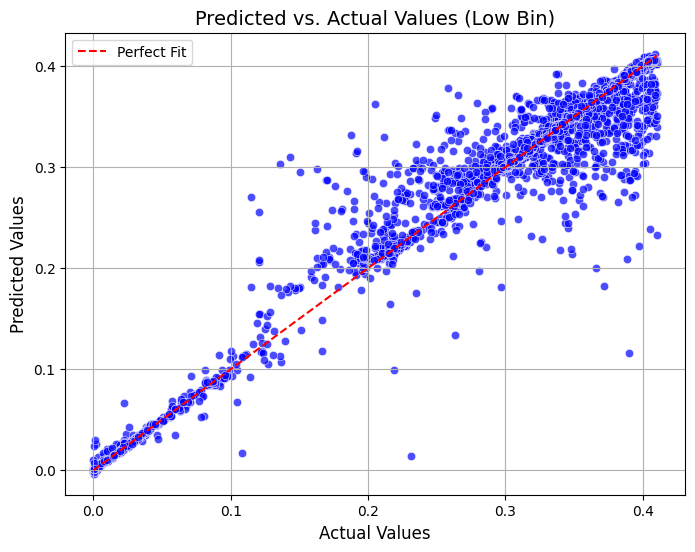

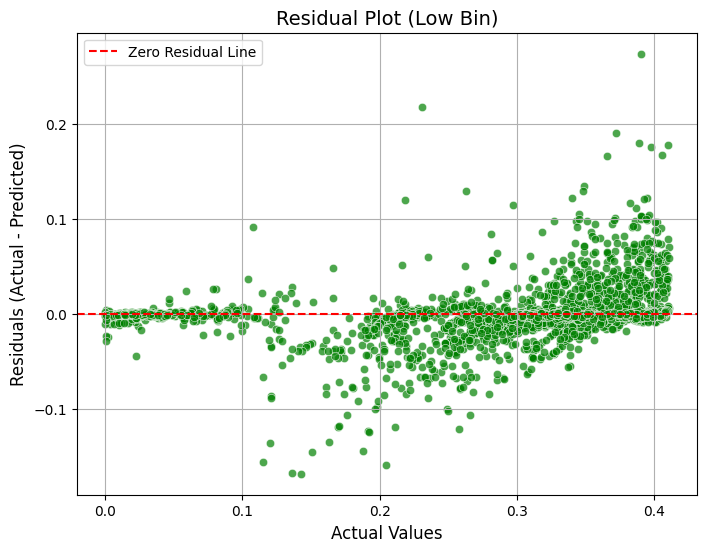

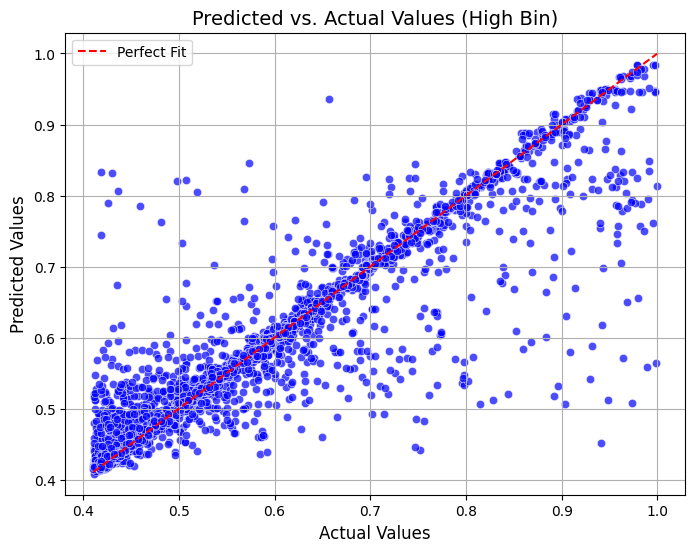

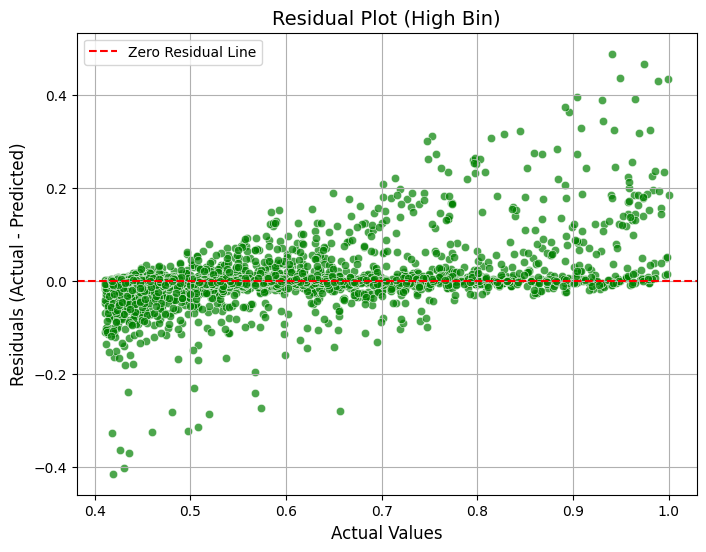

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure you have already trained and tested your model
# Example: For the "Low bin" data
X_train_low, X_test_low, y_train_low, y_test_low = train_test_split(X_low, y_low_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_low, y_train_low)
y_pred_low = pipeline.predict(X_test_low)

# Convert log-transformed predictions back to original scale
y_test_low_original = np.expm1(y_test_low)  # Actual values in original scale
y_pred_low_original = np.expm1(y_pred_low)  # Predicted values in original scale

# Calculate residuals
residuals = y_test_low_original - y_pred_low_original

# Create Predicted vs. Actual Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_low_original, y=y_pred_low_original, color='blue', alpha=0.7)
plt.plot([min(y_test_low_original), max(y_test_low_original)],
         [min(y_test_low_original), max(y_test_low_original)],
         color='red', linestyle='--', label='Perfect Fit')
plt.title('Predicted vs. Actual Values (Low Bin)', fontsize=14)
plt.xlabel('Actual Values', fontsize=12)
plt.ylabel('Predicted Values', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

# Create Residual Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_low_original, y=residuals, color='green', alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', label='Zero Residual Line')
plt.title('Residual Plot (Low Bin)', fontsize=14)
plt.xlabel('Actual Values', fontsize=12)
plt.ylabel('Residuals (Actual - Predicted)', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()


import matplotlib.pyplot as plt
import seaborn as sns

# Ensure you have already trained and tested your model
# Example: For the "Low bin" data
X_train_high, X_test_high, y_train_high, y_test_high = train_test_split(X_high, y_high_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_high, y_train_high)
y_pred_high = pipeline.predict(X_test_high)

# Convert log-transformed predictions back to original scale
y_test_high_original = np.expm1(y_test_high)  # Actual values in original scale
y_pred_high_original = np.expm1(y_pred_high)  # Predicted values in original scale

# Calculate residuals
residuals = y_test_high_original - y_pred_high_original

# Create Predicted vs. Actual Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_high_original, y=y_pred_high_original, color='blue', alpha=0.7)
plt.plot([min(y_test_high_original), max(y_test_high_original)],
         [min(y_test_high_original), max(y_test_high_original)],
         color='red', linestyle='--', label='Perfect Fit')
plt.title('Predicted vs. Actual Values (High Bin)', fontsize=14)
plt.xlabel('Actual Values', fontsize=12)
plt.ylabel('Predicted Values', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

# Create Residual Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_high_original, y=residuals, color='green', alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', label='Zero Residual Line')
plt.title('Residual Plot (High Bin)', fontsize=14)
plt.xlabel('Actual Values', fontsize=12)
plt.ylabel('Residuals (Actual - Predicted)', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/cleaned_emissions_data.csv')

# Calculate Carbon Intensity (g CO₂/kWh)
data['CARBON_INTENSITY'] = (data['TONS_OF_CO2_EMISSIONS'] * 1e6) / data['GENERATION_(KWH)']

# Step 1: Calculate Quartiles and IQR
Q1 = data['CARBON_INTENSITY'].quantile(0.25)  # First quartile (25th percentile)
Q3 = data['CARBON_INTENSITY'].quantile(0.75)  # Third quartile (75th percentile)
IQR = Q3 - Q1  # Interquartile Range

# Step 2: Define the Threshold
# Common options:
# - Median (50th percentile)
# - Lower bound: Q1 - 1.5 * IQR
# - Upper bound: Q3 + 1.5 * IQR
median_threshold = data['CARBON_INTENSITY'].median()  # Median value
lower_bound = Q1 - 1.5 * IQR  # Lower outlier threshold
upper_bound = Q3 + 1.5 * IQR  # Upper outlier threshold

# Print the values
print(f"Q1 (25th Percentile): {Q1}")
print(f"Q3 (75th Percentile): {Q3}")
print(f"IQR (Interquartile Range): {IQR}")
print(f"Median Threshold: {median_threshold}")
print(f"Lower Bound (Outlier Threshold): {lower_bound}")
print(f"Upper Bound (Outlier Threshold): {upper_bound}")

# Check which threshold was used for binning
# Example: If the median was used, print it explicitly
if 'BIN' in data.columns:
    print("Threshold used for binning (based on median):", median_threshold)
else:
    print("No binning column found in the dataset.")

Q1 (25th Percentile): 661.3310637678858
Q3 (75th Percentile): 1184.788628107351
IQR (Interquartile Range): 523.4575643394653
Median Threshold: 856.7499748085054
Lower Bound (Outlier Threshold): -123.85528274131218
Upper Bound (Outlier Threshold): 1969.974974616549
No binning column found in the dataset.


model training with grid search

In [ ]:
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_g_per_kWh', 'CARBON_INTENSITY'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable
y_log = np.log1p(y)

# Define threshold candidates (percentiles)
threshold_candidates = np.percentile(data['CARBON_INTENSITY_g_per_kWh'], np.linspace(10, 90, 10))  # 10 thresholds from 10th to 90th percentile

# Define parameter grid for grid search
param_grid = {
    'threshold': threshold_candidates
}

# Initialize results storage
results = []

# Perform grid search
for params in ParameterGrid(param_grid):
    threshold = params['threshold']

    # Split data based on the threshold
    data['BIN'] = pd.cut(
        data['CARBON_INTENSITY_g_per_kWh'],
        bins=[-np.inf, threshold, np.inf],
        labels=['Low', 'High']
    )

    # Separate data into two subsets
    low_bin_data = data[data['BIN'] == 'Low']
    high_bin_data = data[data['BIN'] == 'High']

    # Prepare datasets for Low bin
    X_low = low_bin_data.drop(columns=[
        'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
        'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
    ])
    y_low = low_bin_data['CARBON_INTENSITY_NORMALIZED']
    y_low_log = np.log1p(y_low)

    # Prepare datasets for High bin
    X_high = high_bin_data.drop(columns=[
        'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
        'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
    ])
    y_high = high_bin_data['CARBON_INTENSITY_NORMALIZED']
    y_high_log = np.log1p(y_high)

    # Train and evaluate for Low bin
    X_train_low, X_test_low, y_train_low, y_test_low = train_test_split(X_low, y_low_log, test_size=0.2, random_state=42)
    pipeline.fit(X_train_low, y_train_low)
    y_pred_low = pipeline.predict(X_test_low)

    mse_low = mean_squared_error(y_test_low, y_pred_low)
    rmse_low = np.sqrt(mse_low)
    mae_low = mean_absolute_error(y_test_low, y_pred_low)
    r2_low = r2_score(y_test_low, y_pred_low)

    # Train and evaluate for High bin
    X_train_high, X_test_high, y_train_high, y_test_high = train_test_split(X_high, y_high_log, test_size=0.2, random_state=42)
    pipeline.fit(X_train_high, y_train_high)
    y_pred_high = pipeline.predict(X_test_high)

    mse_high = mean_squared_error(y_test_high, y_pred_high)
    rmse_high = np.sqrt(mse_high)
    mae_high = mean_absolute_error(y_test_high, y_pred_high)
    r2_high = r2_score(y_test_high, y_pred_high)

    # Combine metrics for both bins
    avg_rmse = (rmse_low + rmse_high) / 2
    avg_mae = (mae_low + mae_high) / 2
    avg_r2 = (r2_low + r2_high) / 2

    # Store results
    results.append({
        'threshold': threshold,
        'RMSE_Low': rmse_low,
        'RMSE_High': rmse_high,
        'Avg_RMSE': avg_rmse,
        'MAE_Low': mae_low,
        'MAE_High': mae_high,
        'Avg_MAE': avg_mae,
        'R2_Low': r2_low,
        'R2_High': r2_high,
        'Avg_R2': avg_r2
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Select the best threshold based on Avg_RMSE
best_threshold = results_df.loc[results_df['Avg_RMSE'].idxmin()]['threshold']

print("Best Threshold:", best_threshold)
print("Performance Metrics at Best Threshold:")
print(results_df.loc[results_df['Avg_RMSE'].idxmin()])

Best Threshold: 436.6509474999297
Performance Metrics at Best Threshold:
threshold    436.650947
RMSE_Low       0.004316
RMSE_High      0.033842
Avg_RMSE       0.019079
MAE_Low        0.001813
MAE_High       0.013551
Avg_MAE        0.007682
R2_Low         0.996010
R2_High        0.882622
Avg_R2         0.939316
Name: 0, dtype: float64


In [ ]:
!pip install category_encoders

classification with iqr threshold vs grid search threshold

In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.1 MB/s eta 0:00:00


Mounted at /content/drive


<ipython-input-56-421d655efd6b>:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])
<ipython-input-56-421d655efd6b>:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[
<ipython-input-56-421d655efd6b>:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in 

Bin Statistics:
      count        mean         std
BIN                                
Low    4615  143.874498  150.548894
High  41534  910.413368  296.965363
Training model for Low bin...


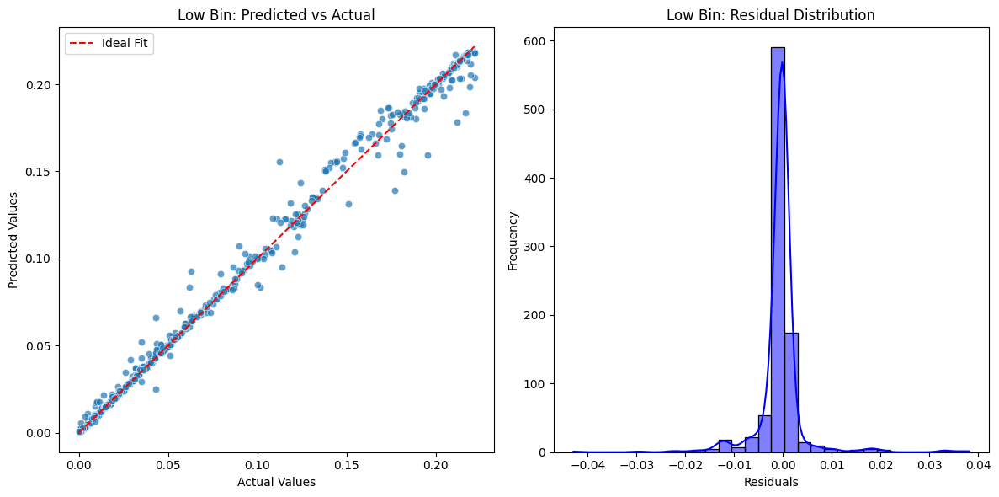


Training model for High bin...


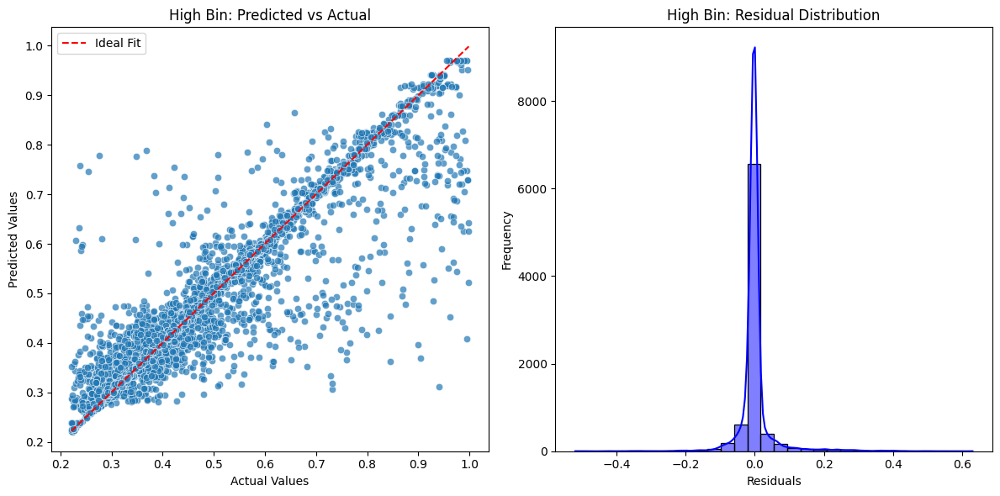


Metrics for Low bin:
MAE: 0.0018
MSE: 0.0000
RMSE: 0.0043
R²: 0.9960

Metrics for High bin:
MAE: 0.0138
MSE: 0.0011
RMSE: 0.0339
R²: 0.8823

Low Bin Model Saved at: /content/drive/MyDrive/models/low_bin_model_threshold_436.65.pkl
High Bin Model Saved at: /content/drive/MyDrive/models/high_bin_model_threshold_436.65.pkl


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from xgboost import XGBRegressor
from google.colab import drive
import joblib  # For saving models
import shap
import lime
from lime import lime_tabular

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Recalculate Carbon Intensity in g CO₂/kWh
data['CARBON_INTENSITY_g_per_kWh'] = (data['TONS_OF_CO2_EMISSIONS'] * 1_000_000) / data['GENERATION_(KWH)']

# Remove outliers in Carbon Intensity using IQR
Q1 = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.25)
Q3 = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
data = data[(data['CARBON_INTENSITY_g_per_kWh'] >= lower_bound) & (data['CARBON_INTENSITY_g_per_kWh'] <= upper_bound)]

# Normalize CARBON_INTENSITY_g_per_kWh using Min-Max Scaling
scaler = MinMaxScaler()
data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Use the best threshold from grid search
chosen_threshold = 436.65

# Split data based on the chosen threshold
data['BIN'] = pd.cut(
    data['CARBON_INTENSITY_g_per_kWh'],
    bins=[-np.inf, chosen_threshold, np.inf],
    labels=['Low', 'High']
)

# Analyze bin statistics (optional)
bin_stats = data.groupby('BIN')['CARBON_INTENSITY_g_per_kWh'].agg(['count', 'mean', 'std'])
print("Bin Statistics:")
print(bin_stats)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_g_per_kWh', 'CARBON_INTENSITY', 'YEAR'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost with Regularization
model = XGBRegressor(
    n_estimators=100,
    random_state=42,
    learning_rate=0.1,
    reg_lambda=1.0,  # L2 regularization
    reg_alpha=0.1    # L1 regularization
)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Separate data into two subsets based on the chosen threshold
low_bin_data = data[data['BIN'] == 'Low']
high_bin_data = data[data['BIN'] == 'High']

# Prepare datasets for Low bin
X_low = low_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh', 'YEAR'
])
y_low = low_bin_data['CARBON_INTENSITY_NORMALIZED']
y_low_log = np.log1p(y_low)

# Prepare datasets for High bin
X_high = high_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh', 'YEAR'
])
y_high = high_bin_data['CARBON_INTENSITY_NORMALIZED']
y_high_log = np.log1p(y_high)

# Train and evaluate for Low bin
print("Training model for Low bin...")
X_train_low, X_test_low, y_train_low, y_test_low = train_test_split(X_low, y_low_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_low, y_train_low)
y_pred_low = pipeline.predict(X_test_low)

mse_low = mean_squared_error(y_test_low, y_pred_low)
rmse_low = np.sqrt(mse_low)
mae_low = mean_absolute_error(y_test_low, y_pred_low)
r2_low = r2_score(y_test_low, y_pred_low)

# Save the Low bin model
low_model_path = f'/content/drive/MyDrive/models/low_bin_model_threshold_{chosen_threshold:.2f}.pkl'
joblib.dump(pipeline, low_model_path)
# Visualize predictions and residuals for Low bin
plot_predictions_and_residuals(y_test_low, y_pred_low, "Low Bin")

# Train and evaluate for High bin
print("\nTraining model for High bin...")
X_train_high, X_test_high, y_train_high, y_test_high = train_test_split(X_high, y_high_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_high, y_train_high)
y_pred_high = pipeline.predict(X_test_high)

mse_high = mean_squared_error(y_test_high, y_pred_high)
rmse_high = np.sqrt(mse_high)
mae_high = mean_absolute_error(y_test_high, y_pred_high)
r2_high = r2_score(y_test_high, y_pred_high)

# Save the High bin model
high_model_path = f'/content/drive/MyDrive/models/high_bin_model_threshold_{chosen_threshold:.2f}.pkl'
joblib.dump(pipeline, high_model_path)
# Visualize predictions and residuals for High bin
plot_predictions_and_residuals(y_test_high, y_pred_high, "High Bin")

# Print performance metrics
print("\nMetrics for Low bin:")
print(f"MAE: {mae_low:.4f}")
print(f"MSE: {mse_low:.4f}")
print(f"RMSE: {rmse_low:.4f}")
print(f"R²: {r2_low:.4f}")

print("\nMetrics for High bin:")
print(f"MAE: {mae_high:.4f}")
print(f"MSE: {mse_high:.4f}")
print(f"RMSE: {rmse_high:.4f}")
print(f"R²: {r2_high:.4f}")

# Print paths to saved models
print(f"\nLow Bin Model Saved at: {low_model_path}")
print(f"High Bin Model Saved at: {high_model_path}")

Metrics for Low bin:
MAE: 0.0018
MSE: 0.0000
RMSE: 0.0043
R²: 0.9960

Metrics for High bin:
MAE: 0.0136
MSE: 0.0011
RMSE: 0.0338
R²: 0.8826

# **REGRESSION**

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=61709d222a76b2433b11c4ac885db38bd09c6f32ec58ca0eef281e7f589a2257
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.3 MB/s eta 0:00:00


Mounted at /content/drive


<ipython-input-32-197a3270333e>:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])
<ipython-input-32-197a3270333e>:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['FUEL_CONSUMPTION_TOTAL'] = data[[
<ipython-input-32-197a3270333e>:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in 

Scaler Min Value: 0.00020530926243086166
Scaler Max Value: 1969.7917973958315
Bin Statistics:
      count        mean         std
BIN                                
Low    4615  143.874498  150.548894
High  41534  910.413368  296.965363
Training model for Low bin...

SHAP Analysis for Low Bin:


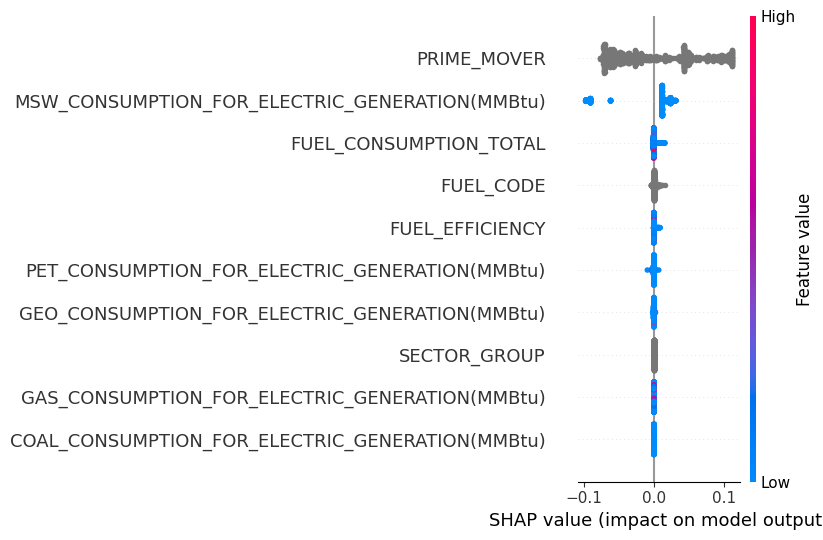


Dependence Plots for Low Bin:


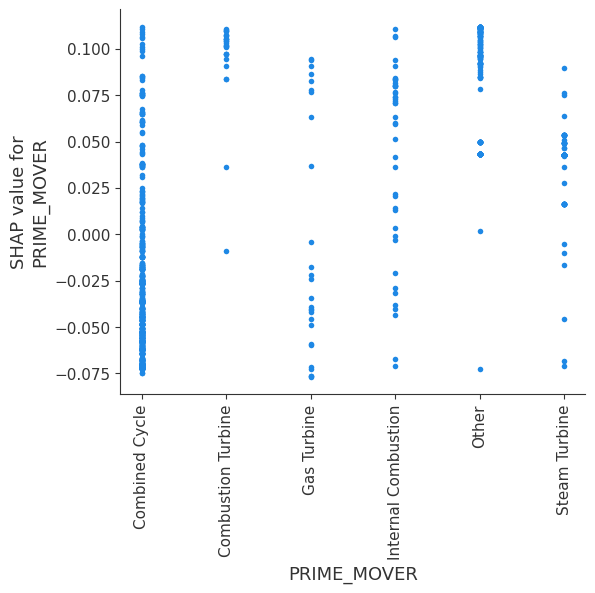

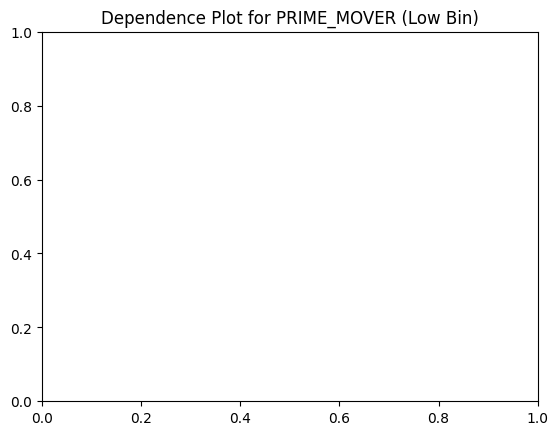

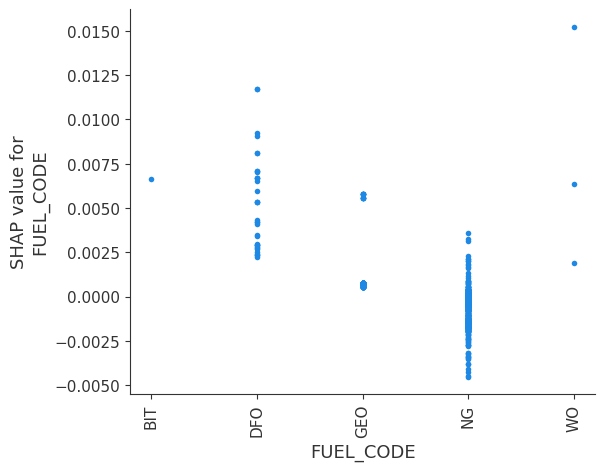

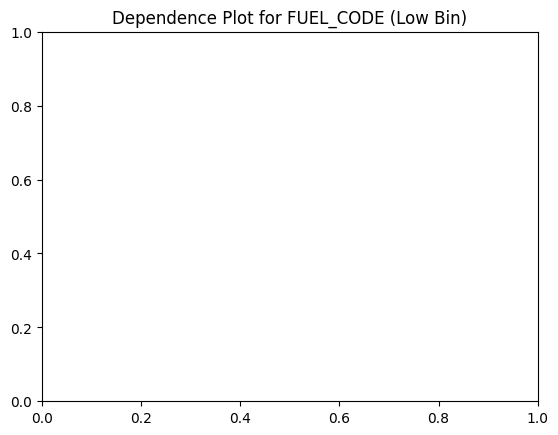

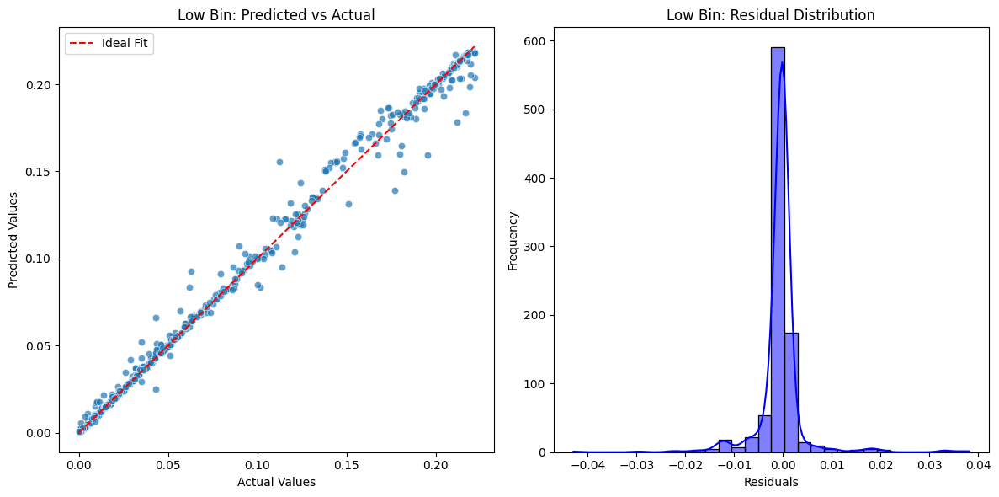


Training model for High bin...

SHAP Analysis for High Bin:


 99%|===================| 8229/8307 [01:01<00:00]       

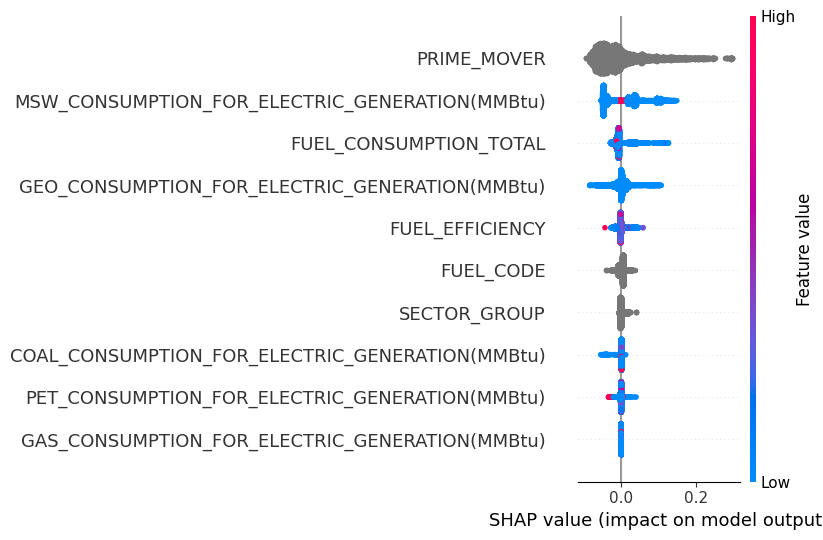


Dependence Plots for High Bin:


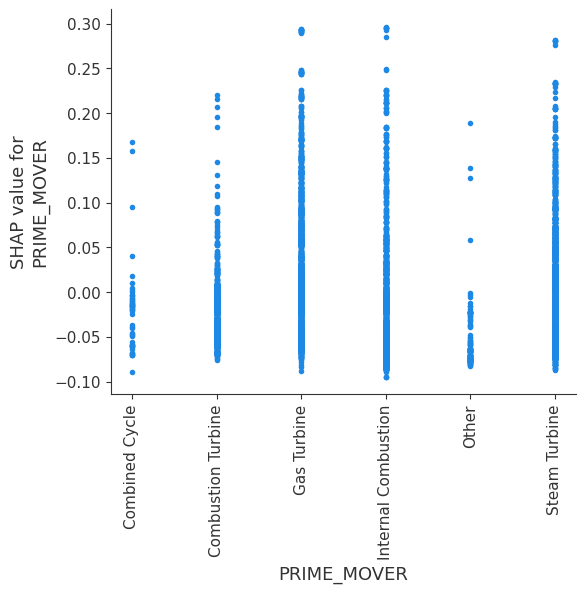

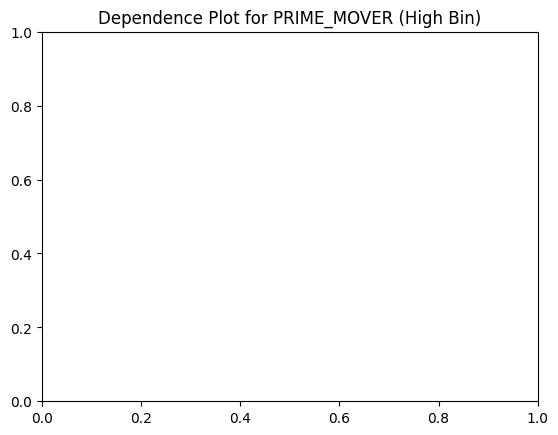

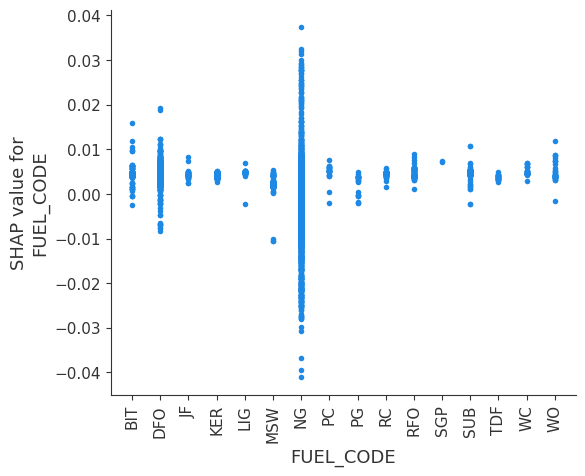

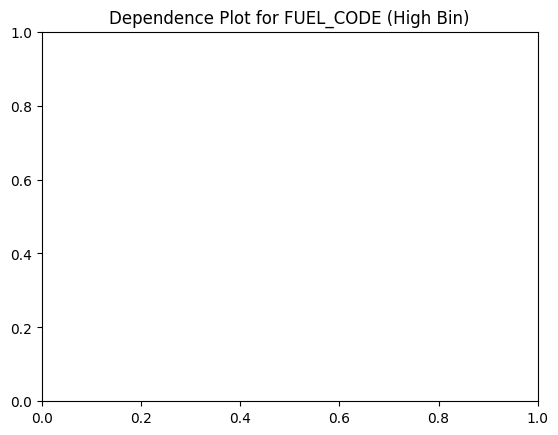

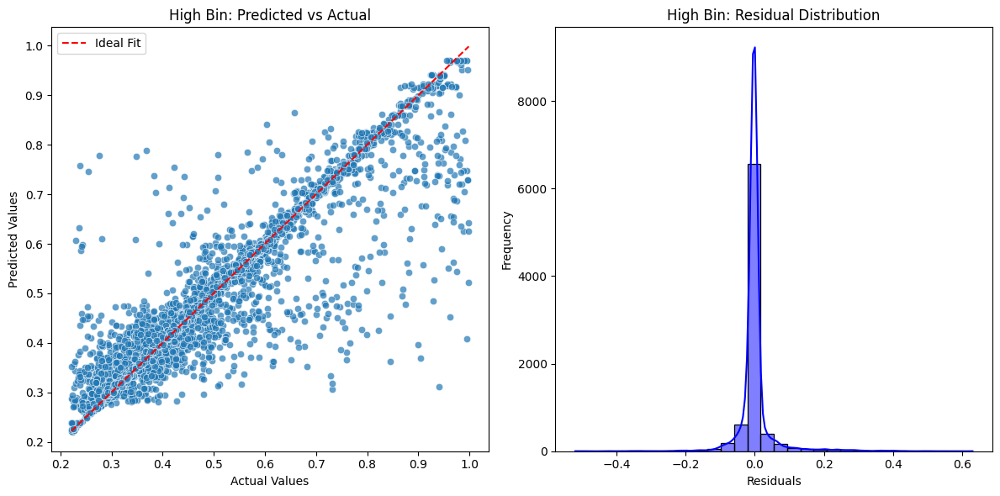


Metrics for Low bin:
MAE: 0.0018
MSE: 0.0000
RMSE: 0.0043
R²: 0.9960

Metrics for High bin:
MAE: 0.0138
MSE: 0.0011
RMSE: 0.0339
R²: 0.8823

Low Bin Model Saved at: /content/drive/MyDrive/models/low_bin_model_threshold_436.65.pkl
High Bin Model Saved at: /content/drive/MyDrive/models/high_bin_model_threshold_436.65.pkl


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from xgboost import XGBRegressor
from google.colab import drive
import joblib  # For saving models
import shap

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path, header=None)

# Define column names based on the dataset structure
column_names = [
    'PLANT_NAME', 'STATE', 'PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP',
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'YEAR',
    'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Assign column names to the dataframe
data.columns = column_names

# Convert numeric columns to numeric type, coercing errors to NaN
numeric_cols = [
    'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'CARBON_INTENSITY', 'FUEL_EFFICIENCY',
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Recalculate Carbon Intensity in g CO₂/kWh
data['CARBON_INTENSITY_g_per_kWh'] = (data['TONS_OF_CO2_EMISSIONS'] * 1_000_000) / data['GENERATION_(KWH)']

# Remove outliers in Carbon Intensity using IQR
Q1 = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.25)
Q3 = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
data = data[(data['CARBON_INTENSITY_g_per_kWh'] >= lower_bound) & (data['CARBON_INTENSITY_g_per_kWh'] <= upper_bound)]

# Normalize CARBON_INTENSITY_g_per_kWh using Min-Max Scaling
scaler = MinMaxScaler()
data.loc[:, 'CARBON_INTENSITY_NORMALIZED'] = scaler.fit_transform(data[['CARBON_INTENSITY_g_per_kWh']])

# Calculate min and max values for CARBON_INTENSITY_g_per_kWh
min_value = data['CARBON_INTENSITY_g_per_kWh'].min()
max_value = data['CARBON_INTENSITY_g_per_kWh'].max()

print(f"Scaler Min Value: {min_value}")
print(f"Scaler Max Value: {max_value}")

# Add derived features
data['FUEL_CONSUMPTION_TOTAL'] = data[[
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]].sum(axis=1)

# Use the best threshold from grid search
chosen_threshold = 436.65

# Split data based on the chosen threshold
data['BIN'] = pd.cut(
    data['CARBON_INTENSITY_g_per_kWh'],
    bins=[-np.inf, chosen_threshold, np.inf],
    labels=['Low', 'High']
)

# Analyze bin statistics (optional)
bin_stats = data.groupby('BIN')['CARBON_INTENSITY_g_per_kWh'].agg(['count', 'mean', 'std'])
print("Bin Statistics:")
print(bin_stats)

# Define features and target
X = data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY_g_per_kWh', 'CARBON_INTENSITY', 'YEAR'
])
y = data['CARBON_INTENSITY_NORMALIZED']

# Log transform the target variable (optional, since it's already normalized)
y_log = np.log1p(y)

# Separate categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data (Target Encoding)
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('target_encoder', TargetEncoder())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Feature selection
feature_selector = SelectKBest(score_func=f_regression, k=10)

# Model: Use XGBoost with Regularization
model = XGBRegressor(
    n_estimators=100,
    random_state=42,
    learning_rate=0.1,
    reg_lambda=1.0,  # L2 regularization
    reg_alpha=0.1    # L1 regularization
)

# Create pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('model', model)
])

# Separate data into two subsets based on the chosen threshold
low_bin_data = data[data['BIN'] == 'Low']
high_bin_data = data[data['BIN'] == 'High']

# Prepare datasets for Low bin
X_low = low_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh', 'YEAR'
])
y_low = low_bin_data['CARBON_INTENSITY_NORMALIZED']
y_low_log = np.log1p(y_low)

# Prepare datasets for High bin
X_high = high_bin_data.drop(columns=[
    'CARBON_INTENSITY_NORMALIZED', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)',
    'PLANT_NAME', 'STATE', 'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh', 'YEAR'
])
y_high = high_bin_data['CARBON_INTENSITY_NORMALIZED']
y_high_log = np.log1p(y_high)

# Train and evaluate for Low bin
print("Training model for Low bin...")
X_train_low, X_test_low, y_train_low, y_test_low = train_test_split(X_low, y_low_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_low, y_train_low)
y_pred_low = pipeline.predict(X_test_low)

mse_low = mean_squared_error(y_test_low, y_pred_low)
rmse_low = np.sqrt(mse_low)
mae_low = mean_absolute_error(y_test_low, y_pred_low)
r2_low = r2_score(y_test_low, y_pred_low)

# Save the Low bin model
low_model_path = f'/content/drive/MyDrive/models/low_bin_model_threshold_{chosen_threshold:.2f}.pkl'
joblib.dump(pipeline, low_model_path)


# SHAP Analysis for Low Bin
print("\nSHAP Analysis for Low Bin:")
model = pipeline.named_steps['model']
preprocessor = pipeline.named_steps['preprocessor']

# Preprocess the data
X_train_preprocessed_low = preprocessor.transform(X_train_low)
X_test_preprocessed_low = preprocessor.transform(X_test_low)

# Create a SHAP explainer
explainer_low = shap.Explainer(model, X_train_preprocessed_low)
shap_values_low = explainer_low(X_test_preprocessed_low)

# Global feature importance plot
shap.summary_plot(shap_values_low, X_test_low)

# Dependence plots for specific features
features_of_interest = ['PRIME_MOVER', 'FUEL_CODE']

print("\nDependence Plots for Low Bin:")
for feature in features_of_interest:
    shap.dependence_plot(
        feature,
        shap_values_low.values,
        X_test_low,
        interaction_index=None  # Optional: Set to another feature to show interactions
    )
    plt.title(f"Dependence Plot for {feature} (Low Bin)")
    plt.show()



# Visualize predictions and residuals for Low bin
plot_predictions_and_residuals(y_test_low, y_pred_low, "Low Bin")

# Train and evaluate for High bin
print("\nTraining model for High bin...")
X_train_high, X_test_high, y_train_high, y_test_high = train_test_split(X_high, y_high_log, test_size=0.2, random_state=42)
pipeline.fit(X_train_high, y_train_high)
y_pred_high = pipeline.predict(X_test_high)

mse_high = mean_squared_error(y_test_high, y_pred_high)
rmse_high = np.sqrt(mse_high)
mae_high = mean_absolute_error(y_test_high, y_pred_high)
r2_high = r2_score(y_test_high, y_pred_high)

# Save the High bin model
high_model_path = f'/content/drive/MyDrive/models/high_bin_model_threshold_{chosen_threshold:.2f}.pkl'
joblib.dump(pipeline, high_model_path)


# SHAP Analysis for High Bin
print("\nSHAP Analysis for High Bin:")
model = pipeline.named_steps['model']
preprocessor = pipeline.named_steps['preprocessor']

# Preprocess the data
X_train_preprocessed_high = preprocessor.transform(X_train_high)
X_test_preprocessed_high = preprocessor.transform(X_test_high)

# Create a SHAP explainer
explainer_high = shap.Explainer(model, X_train_preprocessed_high)
shap_values_high = explainer_high(X_test_preprocessed_high)

# Global feature importance plot
shap.summary_plot(shap_values_high, X_test_high)

# Dependence plots for specific features
print("\nDependence Plots for High Bin:")
for feature in features_of_interest:
    shap.dependence_plot(
        feature,
        shap_values_high.values,
        X_test_high,
        interaction_index=None  # Optional: Set to another feature to show interactions
    )
    plt.title(f"Dependence Plot for {feature} (High Bin)")
    plt.show()



# Visualize predictions and residuals for High bin
plot_predictions_and_residuals(y_test_high, y_pred_high, "High Bin")

# Print performance metrics
print("\nMetrics for Low bin:")
print(f"MAE: {mae_low:.4f}")
print(f"MSE: {mse_low:.4f}")
print(f"RMSE: {rmse_low:.4f}")
print(f"R²: {r2_low:.4f}")

print("\nMetrics for High bin:")
print(f"MAE: {mae_high:.4f}")
print(f"MSE: {mse_high:.4f}")
print(f"RMSE: {rmse_high:.4f}")
print(f"R²: {r2_high:.4f}")

# Print paths to saved models
print(f"\nLow Bin Model Saved at: {low_model_path}")
print(f"High Bin Model Saved at: {high_model_path}")

In [ ]:
# Import visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot predicted vs. actual values and residuals
def plot_predictions_and_residuals(y_true, y_pred, title):
    """
    Plots predicted vs. actual values and residual plots.

    Parameters:
        y_true (array-like): True target values.
        y_pred (array-like): Predicted target values.
        title (str): Title for the plots.
    """
    # Inverse transform the log-transformed values back to the original scale
    y_true = np.expm1(y_true)
    y_pred = np.expm1(y_pred)

    # Create a DataFrame for easier plotting
    results = pd.DataFrame({'Actual': y_true, 'Predicted': y_pred})

    # Plot Predicted vs Actual
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.scatterplot(x='Actual', y='Predicted', data=results, alpha=0.7)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], color='red', linestyle='--', label='Ideal Fit')
    plt.title(f'{title}: Predicted vs Actual')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.legend()

    # Plot Residuals
    residuals = y_true - y_pred
    plt.subplot(1, 2, 2)
    sns.histplot(residuals, kde=True, bins=30, color='blue')
    plt.title(f'{title}: Residual Distribution')
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()


# **CLASSIFICATION**

Training and evaluating model for threshold 436.65 g CO₂/kWh
Cross-Validation Scores: [0.95967742 0.95362903 0.96157495 0.96252372 0.96287951]
Mean CV Score: 0.9600569259962051
Model saved at: /content/drive/MyDrive/models/classification_model_threshold_436.65.pkl
Label Mapping: {'High': np.int64(0), 'Low': np.int64(1)}
Classification Report:
              precision    recall  f1-score   support

        High       0.99      0.97      0.98      9618
         Low       0.74      0.87      0.80       923

    accuracy                           0.96     10541
   macro avg       0.86      0.92      0.89     10541
weighted avg       0.97      0.96      0.96     10541



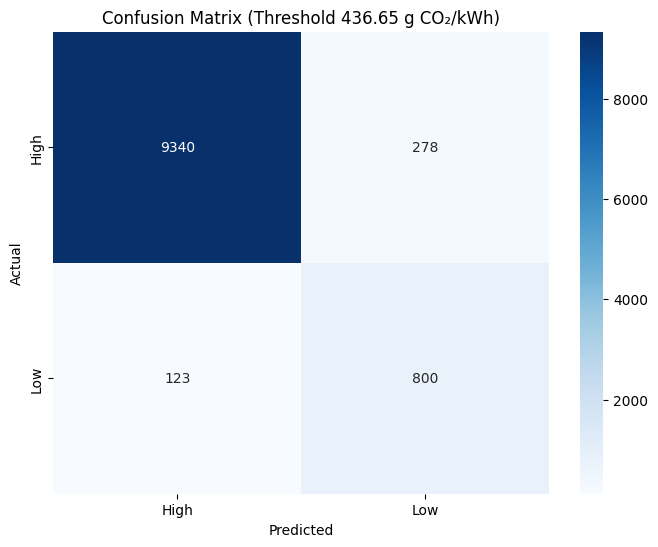

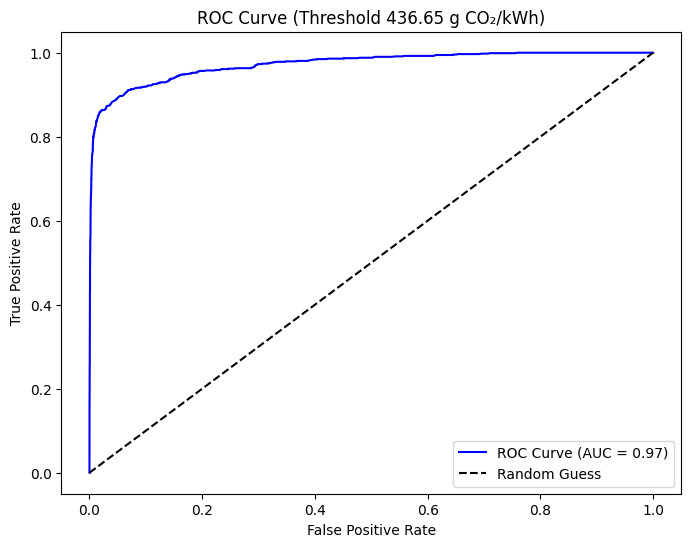

Accuracy: 0.96


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    accuracy_score
)
import matplotlib.pyplot as plt
import seaborn as sns
import joblib  # For saving the model

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/cleaned_emissions_data.csv')

# Step 1: Calculate Carbon Intensity (g CO₂/kWh)
data['CARBON_INTENSITY'] = (data['TONS_OF_CO2_EMISSIONS'] * 1e6) / data['GENERATION_(KWH)']

# Define the threshold (Grid Search-Based)
threshold_grid = 436.65  # Best threshold from Grid Search

# Function to train and evaluate the model
def train_and_evaluate_model(data, threshold):
    print(f"Training and evaluating model for threshold {threshold} g CO₂/kWh")

    # Step 2: Binning based on the threshold
    bins = [-np.inf, threshold, np.inf]  # Two bins: <=threshold and >threshold
    labels = ['Low', 'High']
    data['BIN'] = pd.cut(data['CARBON_INTENSITY'], bins=bins, labels=labels)

    # Step 3: Feature Engineering
    # Drop unnecessary columns
    drop_columns = [
        'CARBON_INTENSITY', 'BIN',  # Target-related columns
        'PLANT_NAME', 'STATE', 'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS'  # Columns to exclude
    ]
    X = data.drop(columns=drop_columns)  # Features
    y = data['BIN']  # Target

    # Encode target variable
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)  # Converts 'Low' -> 1, 'High' -> 0

    # Identify categorical and numerical columns
    categorical_cols = ['PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP']
    numerical_cols = [
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]

    # Preprocessing pipeline
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numerical_cols),  # Scale numerical features
            ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)  # One-hot encode categorical features
        ]
    )

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

    # Step 4: Train a Classification Model (Using XGBoost)
    model = XGBClassifier(random_state=42, scale_pos_weight=len(y_train[y_train == 0]) / len(y_train[y_train == 1]))

    # Create a pipeline with preprocessing and model
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('model', model)
    ])

    # Perform cross-validation
    cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='accuracy')
    print(f"Cross-Validation Scores:", cv_scores)
    print(f"Mean CV Score:", np.mean(cv_scores))

    # Fit the pipeline on the full training set
    pipeline.fit(X_train, y_train)

    # Save the trained model
    model_path = f'/content/drive/MyDrive/models/classification_model_threshold_{threshold:.2f}.pkl'
    joblib.dump(pipeline, model_path)
    print(f"Model saved at: {model_path}")

    # Make predictions
    y_pred = pipeline.predict(X_test)
    y_pred_proba = pipeline.predict_proba(X_test)[:, 1]  # Probabilities for the "High" class

    # Decode predictions back to original labels
    y_test_decoded = label_encoder.inverse_transform(y_test)
    y_pred_decoded = label_encoder.inverse_transform(y_pred)

    # Print the label mapping
    label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
    print("Label Mapping:", label_mapping)

    # Step 5: Evaluate the Model
    # Classification Report
    print("Classification Report:")
    print(classification_report(y_test_decoded, y_pred_decoded))

    # Confusion Matrix
    conf_matrix = confusion_matrix(y_test_decoded, y_pred_decoded, labels=['High', 'Low'])  # Explicitly specify label order
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['High', 'Low'], yticklabels=['High', 'Low'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix (Threshold {threshold} g CO₂/kWh)')
    plt.show()

    # ROC Curve
    fpr, tpr, thresholds_roc = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='blue')
    plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve (Threshold {threshold} g CO₂/kWh)')
    plt.legend(loc='lower right')
    plt.show()

    # Accuracy Score
    accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
    print(f"Accuracy: {accuracy:.2f}")

# Train and evaluate the model for the Grid Search-Based threshold
train_and_evaluate_model(data, threshold_grid)

Number of instances in each bin:
BIN
High    48086
Low      4615
Name: count, dtype: int64


<ipython-input-43-85f5b75eac2e>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data, x='BIN', order=['High', 'Low'], palette='Set2')


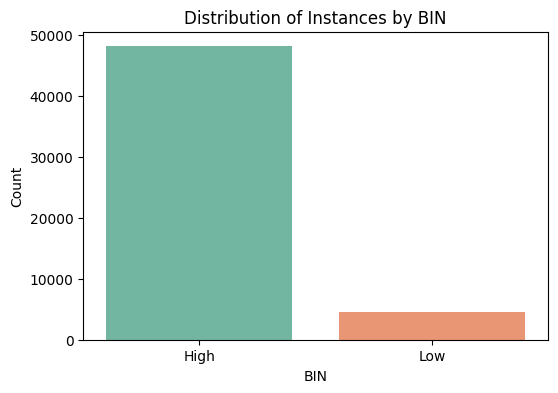

In [ ]:
import pandas as pd

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/cleaned_emissions_data.csv')

# Step 1: Calculate Carbon Intensity (g CO₂/kWh)
data['CARBON_INTENSITY'] = (data['TONS_OF_CO2_EMISSIONS'] * 1e6) / data['GENERATION_(KWH)']

# Define the threshold (Grid Search-Based)
threshold = 436.65  # Best threshold from Grid Search

# Step 2: Binning based on the threshold
bins = [-np.inf, threshold, np.inf]  # Two bins: <=threshold and >threshold
labels = ['Low', 'High']
data['BIN'] = pd.cut(data['CARBON_INTENSITY'], bins=bins, labels=labels)

# Check the distribution of the 'BIN' column
bin_counts = data['BIN'].value_counts()

# Print the counts for each bin
print("Number of instances in each bin:")
print(bin_counts)

# Optionally, visualize the distribution
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.countplot(data=data, x='BIN', order=['High', 'Low'], palette='Set2')
plt.title('Distribution of Instances by BIN')
plt.xlabel('BIN')
plt.ylabel('Count')
plt.show()

# **ANALYSIS**

In [ ]:
def predict_carbon_intensity_bin(instance):
    """
    Predicts whether the given instance belongs to the 'Low' or 'High' carbon intensity bin.

    Parameters:
        instance (dict or pd.DataFrame): A single instance with feature values.
        model_path (str): Path to the saved classification model.

    Returns:
        str: The predicted bin ('Low' or 'High').
    """
    model_path = '/content/drive/MyDrive/models/classification_model_threshold_436.65.pkl'
    # Step 1: Convert the instance to a DataFrame if it's a dictionary
    if isinstance(instance, dict):
        instance = pd.DataFrame([instance])
    elif not isinstance(instance, pd.DataFrame):
        raise ValueError("Instance must be a dictionary or a pandas DataFrame.")

    # Step 2: Drop unnecessary columns
    drop_columns = ['PLANT_NAME', 'STATE', 'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)']
    instance = instance.drop(columns=[col for col in drop_columns if col in instance.columns])

    # Step 3: Define categorical and numerical columns
    categorical_cols = ['PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP']
    numerical_cols = [
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]

    # Step 4: Ensure all required columns are present
    for col in numerical_cols + categorical_cols:
        if col not in instance.columns:
            if col in numerical_cols:
                instance[col] = 0  # Default value for numerical columns
            else:
                instance[col] = "Unknown"  # Default value for categorical columns

    # Step 5: Reorder columns to match the expected order
    instance = instance[numerical_cols + categorical_cols]

    # Step 6: Load the classification model
    pipeline = joblib.load(model_path)

    # Step 7: Predict using the pipeline (preprocessing is handled automatically)
    prediction = pipeline.predict(instance)[0]

    # Step 8: Decode the prediction
    label_encoder = {0: 'High', 1: 'Low'}  # Assuming 'Low' -> 0 and 'High' -> 1
    predicted_bin = label_encoder[prediction]

    return predicted_bin

In [ ]:
import pandas as pd
import numpy as np
import joblib

def predict_carbon_intensity(instance, classification_prediction, threshold=436.65):
    """
    Predicts the normalized carbon intensity for a given instance using the appropriate regression model.

    Parameters:
        instance (dict or pd.DataFrame): Input instance with feature values.
        classification_prediction (str): Predicted bin ('High' or 'Low') from the classification model.
        threshold (float): Threshold used to split the data into bins (default: 436.65).

    Returns:
        float: Predicted normalized carbon intensity.
    """
    # Step 1: Convert the instance to a DataFrame if it's a dictionary
    if isinstance(instance, dict):
        instance = pd.DataFrame([instance])
    elif not isinstance(instance, pd.DataFrame):
        raise ValueError("Instance must be a dictionary or a pandas DataFrame.")

    # Step 2: Define paths to the saved models
    low_model_path = f'/content/drive/MyDrive/models/low_bin_model_threshold_{threshold:.2f}.pkl'
    high_model_path = f'/content/drive/MyDrive/models/high_bin_model_threshold_{threshold:.2f}.pkl'

    # Step 3: Load the appropriate regression model based on the classification prediction
    if classification_prediction == 'Low':
        model_path = low_model_path
    elif classification_prediction == 'High':
        model_path = high_model_path
    else:
        raise ValueError("Invalid classification prediction. Expected 'High' or 'Low'.")

    # Load the regression model
    pipeline = joblib.load(model_path)

    # Step 4: Drop unnecessary columns
    drop_columns = [
        'PLANT_NAME', 'STATE', 'TONS_OF_CO2_EMISSIONS',
        'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
    ]
    instance = instance.drop(columns=[col for col in drop_columns if col in instance.columns])

    # Step 5: Ensure all required columns are present
    categorical_cols = ['PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP']
    numerical_cols = [
        'GENERATION_(KWH)',
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]

    for col in numerical_cols + categorical_cols:
        if col not in instance.columns:
            if col in numerical_cols:
                instance[col] = 0  # Default value for numerical columns
            else:
                instance[col] = "Unknown"  # Default value for categorical columns

    # Step 6: Calculate derived features
    # Total fuel consumption
    fuel_consumption_columns = numerical_cols[1:]  # Exclude 'GENERATION_(KWH)'
    instance['FUEL_CONSUMPTION_TOTAL'] = instance[fuel_consumption_columns].sum(axis=1)

    # Fuel efficiency
    instance['FUEL_EFFICIENCY'] = (
        instance['GENERATION_(KWH)'] / instance['FUEL_CONSUMPTION_TOTAL']
    ).replace([np.inf, -np.inf], 0)  # Handle division by zero

    # Step 7: Reorder columns to match the expected order
    required_columns = numerical_cols + ['FUEL_CONSUMPTION_TOTAL', 'FUEL_EFFICIENCY'] + categorical_cols
    instance = instance[required_columns]

    # Step 8: Predict using the loaded regression model
    prediction = pipeline.predict(instance)[0]

    # Step 9: Inverse transform the log-transformed prediction (if applicable)
    prediction = np.expm1(prediction)  # Reverse the log transformation

    return prediction

In [ ]:
# Example instance
example_instance = {
    'PRIME_MOVER': 'Combined Cycle',
    'FUEL_CODE': 'NG',
    'SECTOR_GROUP': 'ELECTRIC POWER',
    'GENERATION_(KWH)': 0,
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)': 0,
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)': 0,
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)': 0,
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)': 0,
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)': 0
}

# Predict using the model
predicted_bin = predict_carbon_intensity_bin(example_instance)
print(f"The instance belongs to the '{predicted_bin}' carbon intensity bin.")
# Predict carbon intensity
predicted_intensity = predict_carbon_intensity(example_instance, predicted_bin)
print(f"Predicted Normalized Carbon Intensity: {predicted_intensity}")

The instance belongs to the 'Low' carbon intensity bin.
Predicted Normalized Carbon Intensity: 0.0014250664971768856


In [ ]:
 34433.7435 * 1e6 / 2813479000

12.238848592792056

In [ ]:
5263615.15 * 1e6 / 4962411861

1060.6969549156493

In [ ]:
8665.254 * 1e6 / 14466647

598.9815055278532

In [ ]:
# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/cleaned_emissions_data.csv')

# Get distinct PRIME_MOVER values
distinct_prime_movers = data['FUEL_CODE'].unique()
print("Distinct FUEL CODE Values:", distinct_prime_movers)

Distinct FUEL CODE Values: ['NG' 'BIT' 'DFO' 'SUB' 'LIG' 'RFO' 'GEO' 'WO' 'KER' 'JF' 'PC' 'SGC' 'TDF'
 'PG' 'MSW' 'WC' 'SGP' 'RC']


In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Filter for SECTOR_GROUP = ELECTRIC POWER
electric_power_data = data[data['SECTOR_GROUP'] == 'ELECTRIC POWER']

# Define fuel consumption columns and their corresponding fuel groups
fuel_groups = {
    'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
}

# Get distinct PRIME_MOVER values for each fuel group
distinct_prime_movers_by_fuel = {}

for fuel, consumption_col in fuel_groups.items():
    # Filter rows where the fuel consumption is non-zero
    filtered_data = electric_power_data[electric_power_data[consumption_col] > 0]

    # Get distinct PRIME_MOVER values for this fuel group
    distinct_prime_movers = filtered_data['PRIME_MOVER'].unique()

    # Store the result
    distinct_prime_movers_by_fuel[fuel] = distinct_prime_movers

# Print the results
for fuel, prime_movers in distinct_prime_movers_by_fuel.items():
    print(f"Distinct PRIME_MOVER values for {fuel}: {prime_movers}")

Distinct PRIME_MOVER values for GAS: ['Combined Cycle' 'Combustion Turbine' 'Steam Turbine' 'Gas Turbine'
 'Other' 'Internal Combustion']
Distinct PRIME_MOVER values for COAL: ['Steam Turbine' 'Combustion Turbine']
Distinct PRIME_MOVER values for PET: ['Steam Turbine' 'Gas Turbine' 'Internal Combustion' 'Combustion Turbine'
 'Combined Cycle']
Distinct PRIME_MOVER values for GEO: ['Steam Turbine' 'Other']
Distinct PRIME_MOVER values for MSW: ['Steam Turbine']


In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Filter for SECTOR_GROUP = ELECTRIC POWER
electric_power_data = data[data['SECTOR_GROUP'] == 'ELECTRIC POWER']

# Define fuel consumption columns and their corresponding fuel groups
fuel_groups = {
    'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
}

# Get distinct PRIME_MOVER values for each fuel group
distinct_prime_movers_by_fuel = {}

for fuel, consumption_col in fuel_groups.items():
    # Filter rows where the fuel consumption is non-zero
    filtered_data = electric_power_data[electric_power_data[consumption_col] > 0]

    # Get distinct PRIME_MOVER values for this fuel group
    distinct_prime_movers = filtered_data['FUEL_CODE'].unique()

    # Store the result
    distinct_prime_movers_by_fuel[fuel] = distinct_prime_movers

# Print the results
for fuel, prime_movers in distinct_prime_movers_by_fuel.items():
    print(f"Distinct FUEL_CODE values for {fuel}: {prime_movers}")

Distinct FUEL_CODE values for GAS: ['NG']
Distinct FUEL_CODE values for COAL: ['BIT' 'SUB' 'LIG' 'SGC' 'WC' 'RC']
Distinct FUEL_CODE values for PET: ['DFO' 'RFO' 'WO' 'KER' 'JF' 'PC' 'PG' 'SGP']
Distinct FUEL_CODE values for GEO: ['GEO']
Distinct FUEL_CODE values for MSW: ['TDF' 'MSW']


In [ ]:
data['SECTOR_GROUP'].unique()

array(['ELECTRIC POWER', 'INDUSTRIAL', 'COMMERCIAL'], dtype=object)

In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Filter for SECTOR_GROUP = ELECTRIC POWER
electric_power_data = data[data['SECTOR_GROUP'] == 'ELECTRIC POWER']

# Define fuel consumption columns and their corresponding fuel groups
pm_groups = {
    'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
}

# Get distinct PRIME_MOVER values for each fuel group
distinct_prime_movers_by_fuel = {}

for fuel, consumption_col in fuel_groups.items():
    # Filter rows where the fuel consumption is non-zero
    filtered_data = electric_power_data[electric_power_data[consumption_col] > 0]

    # Get distinct PRIME_MOVER values for this fuel group
    distinct_prime_movers = filtered_data['PRIME_MOVER'].unique()

    # Store the result
    distinct_prime_movers_by_fuel[fuel] = distinct_prime_movers

# Print the results
for fuel, prime_movers in distinct_prime_movers_by_fuel.items():
    print(f"Distinct PRIME_MOVER values for {fuel}: {prime_movers}")

In [ ]:
pms = electric_power_data['PRIME_MOVER'].unique()
for pm in pms:
  per_pm = electric_power_data[electric_power_data['PRIME_MOVER'] == pm]
  distinct_fuel_code= per_pm['FUEL_CODE'].unique()
  print(f"Distinct FUEL_CODE values for {pm}: {distinct_fuel_code}")

Distinct FUEL_CODE values for Combined Cycle: ['NG' 'RFO' 'DFO' 'WO']
Distinct FUEL_CODE values for Combustion Turbine: ['NG' 'DFO' 'SGC' 'KER' 'JF' 'WO' 'RFO' 'SGP']
Distinct FUEL_CODE values for Steam Turbine: ['BIT' 'NG' 'DFO' 'SUB' 'LIG' 'RFO' 'GEO' 'WO' 'PC' 'TDF' 'PG' 'MSW' 'WC'
 'RC']
Distinct FUEL_CODE values for Gas Turbine: ['NG' 'DFO' 'KER' 'JF' 'RFO' 'WO' 'PG']
Distinct FUEL_CODE values for Internal Combustion: ['DFO' 'NG' 'RFO' 'JF']
Distinct FUEL_CODE values for Other: ['NG' 'GEO']


In [ ]:
pms = data['PRIME_MOVER'].unique()
for pm in pms:
  per_pm = data[data['PRIME_MOVER'] == pm]
  distinct_fuel_code= per_pm['FUEL_CODE'].unique()
  print(f"Distinct FUEL_CODE values for {pm}: {distinct_fuel_code}")

Distinct FUEL_CODE values for Combined Cycle: ['NG' 'RFO' 'DFO' 'WO']
Distinct FUEL_CODE values for Combustion Turbine: ['NG' 'DFO' 'SGC' 'KER' 'JF' 'WO' 'RFO' 'SGP']
Distinct FUEL_CODE values for Steam Turbine: ['BIT' 'NG' 'DFO' 'SUB' 'LIG' 'RFO' 'GEO' 'WO' 'PC' 'TDF' 'PG' 'MSW' 'WC'
 'RC' 'KER' 'JF']
Distinct FUEL_CODE values for Gas Turbine: ['NG' 'DFO' 'KER' 'JF' 'RFO' 'WO' 'PG']
Distinct FUEL_CODE values for Internal Combustion: ['DFO' 'NG' 'RFO' 'JF' 'PG']
Distinct FUEL_CODE values for Other: ['NG' 'GEO' 'PC']


In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.0 MB/s eta 0:00:00


start with fuel code predictions then prime mover

Overall Results Table:
   Fuel Group          Prime Mover FUEL_CODE Predicted Bin  \
6        COAL        Steam Turbine       BIT          High   
8         PET        Steam Turbine       DFO          High   
9         PET          Gas Turbine       DFO          High   
2         GAS        Steam Turbine        NG          High   
11        PET   Combustion Turbine       DFO          High   
10        PET  Internal Combustion       DFO          High   
15        MSW        Steam Turbine       MSW          High   
7        COAL   Combustion Turbine       SGC          High   
1         GAS   Combustion Turbine        NG          High   
0         GAS       Combined Cycle        NG           Low   
5         GAS  Internal Combustion        NG           Low   
4         GAS                Other        NG           Low   
3         GAS          Gas Turbine        NG           Low   
12        PET       Combined Cycle       DFO           Low   
14        GEO                Other       GEO   

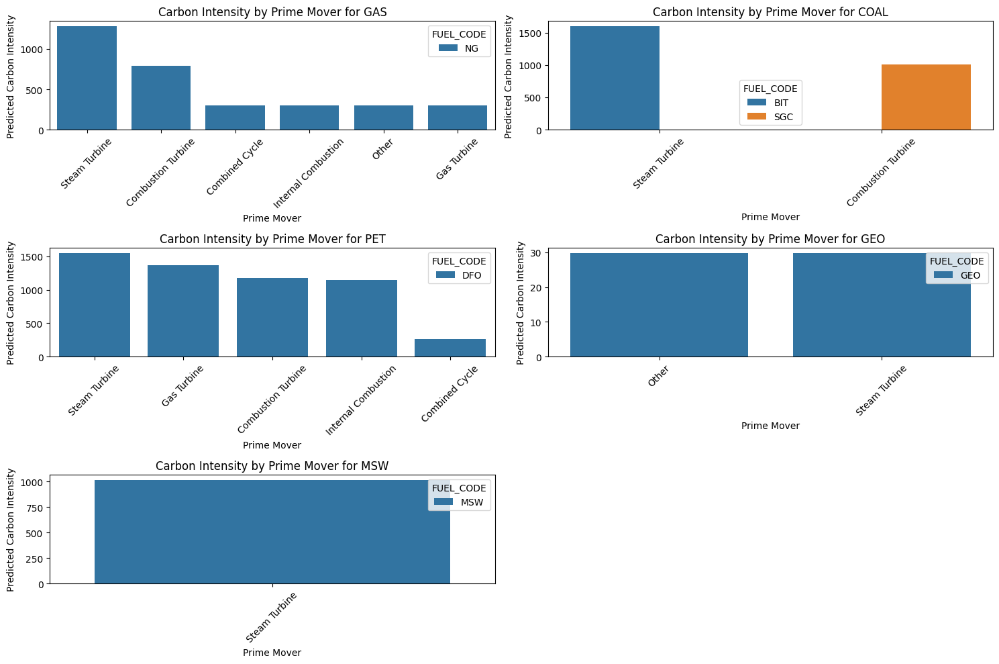

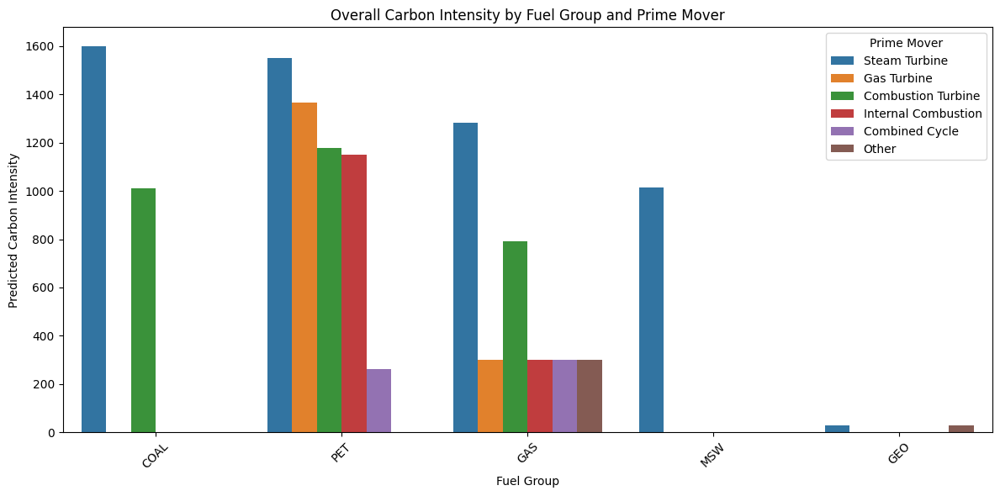

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Filter for SECTOR_GROUP = ELECTRIC POWER
electric_power_data = data[data['SECTOR_GROUP'] == 'ELECTRIC POWER']

# Define fuel consumption columns and their corresponding fuel groups
fuel_groups = {
    'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
}
import pandas as pd
from collections import Counter

# Function to preprocess and simulate instances
def simulate_and_predict(electric_power_data, fuel_groups, min_value, max_value):
    """
    Simulates and predicts carbon intensity for different fuel groups and prime movers.

    Parameters:
        electric_power_data (pd.DataFrame): The dataset containing emissions data.
        fuel_groups (dict): Dictionary mapping fuel groups to their consumption columns.
        min_value (float): Minimum value used for normalization.
        max_value (float): Maximum value used for normalization.

    Returns:
        pd.DataFrame: Results DataFrame with predicted normalized and original carbon intensities.
    """
    results = []

    for fuel, consumption_col in fuel_groups.items():
        # Subset for the current fuel group
        fuel_subset = electric_power_data[electric_power_data[consumption_col] > 0]

        # Find the median consumption instance
        median_consumption_instance = fuel_subset.loc[
            fuel_subset[consumption_col].idxmin()
        ]

        # Extract the corresponding generation
        median_generation = median_consumption_instance['GENERATION_(KWH)']
        median_consumption = median_consumption_instance[consumption_col]

        # Get distinct PRIME_MOVER values for this fuel group
        distinct_prime_movers = fuel_subset['PRIME_MOVER'].unique()

        for prime_mover in distinct_prime_movers:
            # Get the most common FUEL_CODE for this PRIME_MOVER in the fuel group subset
            prime_mover_subset = fuel_subset[fuel_subset['PRIME_MOVER'] == prime_mover]
            most_common_fuel_code = Counter(prime_mover_subset['FUEL_CODE']).most_common(1)[0][0]

            # Create a simulated instance
            instance = {
                'PRIME_MOVER': prime_mover,
                'FUEL_CODE': most_common_fuel_code,
                'SECTOR_GROUP': 'ELECTRIC POWER',
                'GENERATION_(KWH)': median_generation,
            }

            # Add fuel consumptions
            for col in fuel_groups.values():
                instance[col] = median_consumption if col == consumption_col else 0

            # Predict bin using the classification model
            predicted_bin = predict_carbon_intensity_bin(instance)  # Replace with your bin prediction function

            # Predict normalized carbon intensity using the regression model
            predicted_normalized_intensity = predict_carbon_intensity(instance, predicted_bin)

            # Denormalize the predicted carbon intensity
            predicted_original_intensity = (
                predicted_normalized_intensity * (max_value - min_value)
            ) + min_value

            # Store results
            results.append({
                'Fuel Group': fuel,
                'Prime Mover': prime_mover,
                'FUEL_CODE': most_common_fuel_code,
                'Predicted Bin': predicted_bin,
                'Predicted Normalized Carbon Intensity': predicted_normalized_intensity,
                'Predicted Carbon Intensity': predicted_original_intensity
            })

    # Convert results to a DataFrame and sort by predicted carbon intensity
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values(by='Predicted Carbon Intensity', ascending=False)

    return results_df

# Min and Max values used for normalization
min_value = 0.00020530926243086166
max_value = 1969.7917973958315

# Run the simulation
results_df = simulate_and_predict(electric_power_data, fuel_groups, min_value, max_value)

# Display the overall results
print("Overall Results Table:")
print(results_df)

# Create separate tables for each fuel group
fuel_group_tables = {}
for fuel in fuel_groups.keys():
    fuel_group_tables[fuel] = results_df[results_df['Fuel Group'] == fuel]
    print(f"\nResults for Fuel Group: {fuel}")
    print(fuel_group_tables[fuel])

# Visualization: Bar chart for each fuel group
plt.figure(figsize=(15, 10))
for i, fuel in enumerate(fuel_groups.keys(), 1):
    plt.subplot(3, 2, i)
    sns.barplot(
        data=fuel_group_tables[fuel],
        x='Prime Mover',
        y='Predicted Carbon Intensity',
        hue='FUEL_CODE',
        dodge=True
    )
    plt.title(f"Carbon Intensity by Prime Mover for {fuel}")
    plt.xticks(rotation=45)
    plt.tight_layout()

plt.show()

# Visualization: Overall bar chart
plt.figure(figsize=(12, 6))
sns.barplot(
    data=results_df,
    x='Fuel Group',
    y='Predicted Carbon Intensity',
    hue='Prime Mover',
    dodge=True
)
plt.title("Overall Carbon Intensity by Fuel Group and Prime Mover")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
from google.colab import drive
import pandas as pd
# Mount Google Drive
drive.mount('/content/drive', force_remount=True)
# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

Mounted at /content/drive


In [ ]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import joblib
import shap

def simulate_and_predict_with_fuel_code(electric_power_data, fuel_groups, min_value, max_value, threshold=436.65):
    """
    Simulates and predicts carbon intensity for different fuel groups, prime movers, and fuel codes.
    Adds local SHAP analysis to explain predictions for each simulated instance.

    Parameters:
        electric_power_data (pd.DataFrame): The dataset containing emissions data.
        fuel_groups (dict): Dictionary mapping fuel groups to their consumption columns.
        min_value (float): Minimum value used for normalization.
        max_value (float): Maximum value used for normalization.
        threshold (float): Threshold used to split the data into bins (default: 436.65).

    Returns:
        pd.DataFrame: Results DataFrame with predicted normalized and original carbon intensities,
                      along with SHAP values for each simulated instance.
    """
    results = []

    # Iterate over each fuel group
    for fuel, consumption_col in fuel_groups.items():
        # Subset for the current fuel group
        fuel_subset = electric_power_data[electric_power_data[consumption_col] > 0]

        # Find the median consumption instance
        median_consumption_instance = fuel_subset.loc[
            fuel_subset[consumption_col].idxmin()
        ]

        # Extract the corresponding generation
        median_generation = median_consumption_instance['GENERATION_(KWH)']
        median_consumption = median_consumption_instance[consumption_col]

        # Get distinct PRIME_MOVER and FUEL_CODE combinations for this fuel group
        prime_mover_fuel_code_combinations = (
            fuel_subset.groupby(['PRIME_MOVER', 'FUEL_CODE']).size().reset_index()
        )

        for _, row in prime_mover_fuel_code_combinations.iterrows():
            prime_mover = row['PRIME_MOVER']
            fuel_code = row['FUEL_CODE']

            # Create a simulated instance
            instance = {
                'PRIME_MOVER': prime_mover,
                'FUEL_CODE': fuel_code,
                'SECTOR_GROUP': 'ELECTRIC POWER',
                'GENERATION_(KWH)': median_generation,
            }

            # Add fuel consumptions
            for col in fuel_groups.values():
                instance[col] = median_consumption if col == consumption_col else 0

            # Predict bin using the classification model
            predicted_bin = predict_carbon_intensity_bin(instance)  # Replace with your bin prediction function

            # Predict carbon intensity using the regression model
            predicted_normalized_intensity = predict_carbon_intensity(
                instance, classification_prediction=predicted_bin, threshold=threshold
            )

            # Denormalize the predicted carbon intensity
            predicted_original_intensity = (
                predicted_normalized_intensity * (max_value - min_value)
            ) + min_value

            # Compute SHAP values
            # Load the regression model from the pipeline
            if predicted_bin == 'Low':
                model_path = f'/content/drive/MyDrive/models/low_bin_model_threshold_{threshold:.2f}.pkl'
            elif predicted_bin == 'High':
                model_path = f'/content/drive/MyDrive/models/high_bin_model_threshold_{threshold:.2f}.pkl'
            pipeline = joblib.load(model_path)
            model = pipeline.named_steps['model']  # Extract the regression model

            # Preprocess the instance
            instance_df = pd.DataFrame([instance])
            instance_preprocessed = pipeline.named_steps['preprocessor'].transform(instance_df)

            # Create a SHAP explainer
            explainer = shap.Explainer(model)
            shap_values = explainer(instance_preprocessed)

            # Store results
            results.append({
                'Fuel Group': fuel,
                'Prime Mover': prime_mover,
                'FUEL_CODE': fuel_code,
                'Predicted Bin': predicted_bin,
                'Predicted Normalized Carbon Intensity': predicted_normalized_intensity,
                'Predicted Carbon Intensity': predicted_original_intensity,
                'SHAP Values': shap_values.values[0],  # SHAP values for the instance
                'Feature Names': list(instance_df.columns)  # Feature names for reference
            })

    # Convert results to a DataFrame
    results_df = pd.DataFrame(results)

    # Generate graphs for each fuel group
    for fuel in fuel_groups.keys():
        plot_carbon_intensity_by_prime_mover_and_fuel_code(results_df, fuel)

    return results_df


import matplotlib.pyplot as plt

def plot_carbon_intensity_by_prime_mover_and_fuel_code(results_df, fuel_group):
    """
    Plots carbon intensity for a given fuel group, segmented by prime mover and fuel code.

    Parameters:
        results_df (pd.DataFrame): Results DataFrame containing predicted carbon intensities.
        fuel_group (str): Name of the fuel group to plot.
    """
    # Filter results for the specified fuel group
    fuel_group_results = results_df[results_df['Fuel Group'] == fuel_group]

    # Pivot the data for plotting
    pivot_table = fuel_group_results.pivot(index='Prime Mover', columns='FUEL_CODE', values='Predicted Carbon Intensity')

    # Create a grouped bar chart
    fig, ax = plt.subplots(figsize=(10, 6))

    # Define bar width and positions
    bar_width = 0.8 / len(pivot_table.columns)
    index = np.arange(len(pivot_table.index))

    # Plot each fuel code as a separate bar within each group
    for i, fuel_code in enumerate(pivot_table.columns):
        ax.bar(
            index + i * bar_width,
            pivot_table[fuel_code],
            width=bar_width,
            label=fuel_code
        )

    # Add labels, title, and legend
    ax.set_title(f'Overall Carbon Intensity for {fuel_group} by Prime Mover and Fuel Code')
    ax.set_xlabel('Prime Mover')
    ax.set_ylabel('Carbon Intensity (g CO₂/kWh)')
    ax.legend(title='Fuel Code')

    # Set x-axis ticks and labels
    ax.set_xticks(index + bar_width / 2)
    ax.set_xticklabels(pivot_table.index, rotation=45)

    # Show the plot
    plt.tight_layout()
    plt.show()

In [ ]:
import pandas as pd

# Load the cleaned emissions data
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Define the fuel consumption columns
fuel_columns = [
    'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
]

# Identify consecutive groups of the same PLANT_NAME
data['Group_ID'] = (data['PLANT_NAME'] != data['PLANT_NAME'].shift()).cumsum()

# Calculate total fuel consumption for each group
grouped_data = data.groupby('Group_ID')[fuel_columns].sum()

# Calculate the total fuel consumption for each group (row-wise sum)
grouped_data['Total_Fuel_Consumption'] = grouped_data.sum(axis=1)

# Find the median of total fuel consumption
median_total_fuel_consumption = grouped_data['Total_Fuel_Consumption'].median()

# Display the result
print(f"Median of Total Fuel Consumption: {median_total_fuel_consumption}")

Median of Total Fuel Consumption: 325944.5


In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.6 MB/s eta 0:00:00


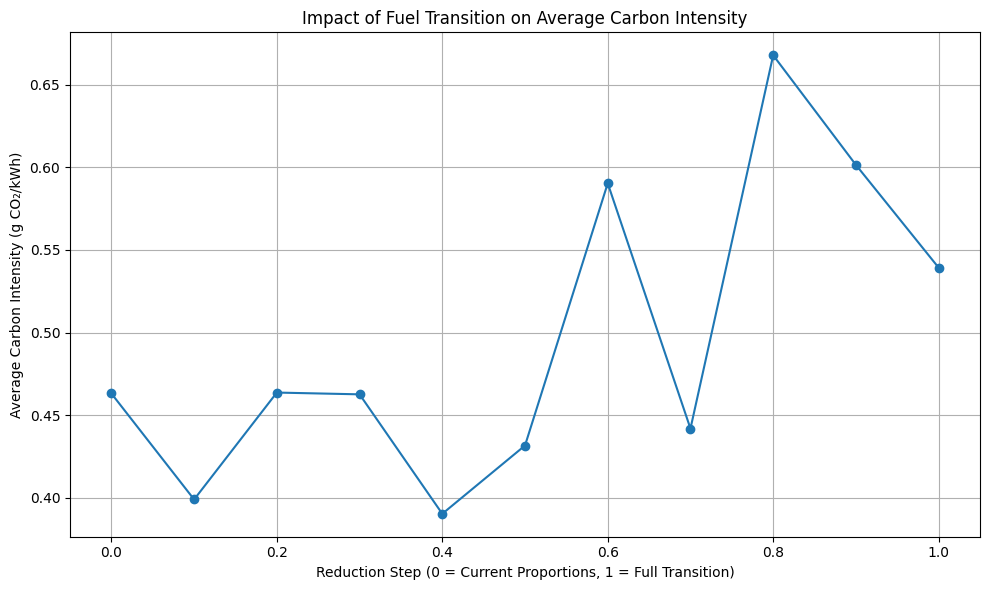

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def simulate_fuel_transition(data, median_total_consumption, predict_carbon_intensity_bin, predict_carbon_intensity):
    """
    Simulate the transition from fossil fuels to cleaner fuels and analyze carbon intensity.

    Parameters:
        data (pd.DataFrame): Cleaned emissions data.
        median_total_consumption (float): Median total fuel consumption.
        predict_carbon_intensity_bin: Function to predict carbon intensity bin.
        predict_carbon_intensity: Function to predict precise carbon intensity.

    Returns:
        pd.DataFrame: Results of the simulation.
    """
    # Define fuel groups
    fuel_groups = {
        'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    }

    # Get the current proportions of fuel consumption
    total_consumption = data[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET', 'GEO', 'MSW']]].sum()
    current_proportions = total_consumption / total_consumption.sum()

    # Define steps for reducing fossil fuels
    reduction_steps = np.linspace(0, 1, 11)  # 10 steps from 0% to 100% reduction

    # Initialize results storage
    results = []

    for step in reduction_steps:
        # Calculate new proportions
        new_proportions = current_proportions.copy()

        # Reduce fossil fuels and redistribute to cleaner fuels
        fossil_reduction = step * current_proportions[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET']]].sum()
        new_proportions[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET']]] *= (1 - step)
        new_proportions[[fuel_groups[fuel] for fuel in ['GEO', 'MSW']]] += fossil_reduction / 2

        # Normalize proportions
        new_proportions /= new_proportions.sum()

        # Calculate absolute consumption values
        consumption_values = new_proportions * median_total_consumption

        # Simulate instances
        simulated_instances = []
        for fuel_group, consumption in zip(['GAS', 'COAL', 'PET', 'GEO', 'MSW'], consumption_values):
            # Find closest matching instance in the dataset
            column = fuel_groups[fuel_group]
            subset = data[data[column] > 0]  # Only consider rows with positive consumption
            closest_row = subset.iloc[(subset[column] - consumption).abs().argsort()[:1]]

            # Extract generation value
            generation = closest_row['GENERATION_(KWH)'].values[0]

            # Create simulated instance
            instance = {
                'PRIME_MOVER': closest_row['PRIME_MOVER'].values[0],
                'FUEL_CODE': closest_row['FUEL_CODE'].values[0],
                'SECTOR_GROUP': closest_row['SECTOR_GROUP'].values[0],
                'GENERATION_(KWH)': generation,
            }

            # Add fuel consumptions
            for col in fuel_groups.values():
                instance[col] = consumption if col == fuel_groups[fuel_group] else 0

            simulated_instances.append(instance)

        # Predict carbon intensity for each instance
        carbon_intensities = []
        for instance in simulated_instances:
            # Use predict_carbon_intensity_bin to get the bin prediction
            bin_prediction = predict_carbon_intensity_bin(pd.DataFrame([instance]))

            # Use predict_carbon_intensity to get the precise prediction
            precise_prediction = predict_carbon_intensity(pd.DataFrame([instance]), bin_prediction)

            # Handle scalar output
            if isinstance(precise_prediction, (list, np.ndarray)):
                carbon_intensities.append(precise_prediction[0])
            else:
                carbon_intensities.append(precise_prediction)

        # Calculate average carbon intensity
        avg_carbon_intensity = np.mean(carbon_intensities)

        # Store results
        results.append({
            'Reduction Step': step,
            'Average Carbon Intensity': avg_carbon_intensity,
            'Proportions': new_proportions.to_dict()
        })

    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(results_df['Reduction Step'], results_df['Average Carbon Intensity'], marker='o')
    plt.title('Impact of Fuel Transition on Average Carbon Intensity')
    plt.xlabel('Reduction Step (0 = Current Proportions, 1 = Full Transition)')
    plt.ylabel('Average Carbon Intensity (g CO₂/kWh)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return results_df

# Example usage
median_total_consumption = 325944.5  # From previous analysis
results = simulate_fuel_transition(
    data,
    median_total_consumption,
    predict_carbon_intensity_bin,
    predict_carbon_intensity
)

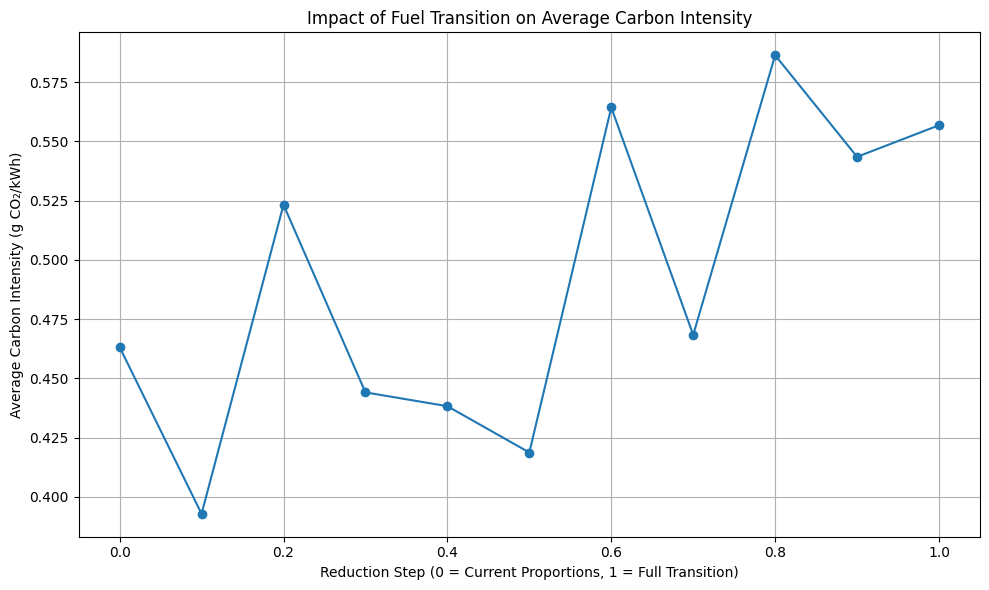

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def simulate_fuel_transition(data, median_total_consumption, predict_carbon_intensity_bin, predict_carbon_intensity):
    """
    Simulate the transition from fossil fuels to cleaner fuels and analyze carbon intensity.

    Parameters:
        data (pd.DataFrame): Cleaned emissions data.
        median_total_consumption (float): Median total fuel consumption.
        predict_carbon_intensity_bin: Function to predict carbon intensity bin.
        predict_carbon_intensity: Function to predict precise carbon intensity.

    Returns:
        pd.DataFrame: Results of the simulation.
    """
    # Define fuel groups
    fuel_groups = {
        'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    }

    # Get the current proportions of fuel consumption
    total_consumption = data[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET', 'GEO', 'MSW']]].sum()
    current_proportions = total_consumption / total_consumption.sum()

    # Define steps for reducing fossil fuels
    reduction_steps = np.linspace(0, 1, 11)  # 10 steps from 0% to 100% reduction

    # Initialize results storage
    results = []

    for step in reduction_steps:
        # Calculate new proportions
        new_proportions = current_proportions.copy()

        # Reduce fossil fuels and redistribute to cleaner fuels
        fossil_reduction = step * current_proportions[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET']]].sum()
        new_proportions[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET']]] *= (1 - step)

        # Redistribute fossil reduction (70% to GEO, 30% to MSW)
        new_proportions[fuel_groups['GEO']] += fossil_reduction * 0.7
        new_proportions[fuel_groups['MSW']] += fossil_reduction * 0.3

        # Normalize proportions
        new_proportions /= new_proportions.sum()

        # Calculate absolute consumption values
        consumption_values = new_proportions * median_total_consumption

        # Simulate instances
        simulated_instances = []
        for fuel_group, consumption in zip(['GAS', 'COAL', 'PET', 'GEO', 'MSW'], consumption_values):
            # Find closest matching instance in the dataset
            column = fuel_groups[fuel_group]
            subset = data[data[column] > 0]  # Only consider rows with positive consumption
            closest_row = subset.iloc[(subset[column] - consumption).abs().argsort()[:1]]

            # Extract generation value
            generation = closest_row['GENERATION_(KWH)'].values[0]

            # Create simulated instance
            instance = {
                'PRIME_MOVER': closest_row['PRIME_MOVER'].values[0],
                'FUEL_CODE': closest_row['FUEL_CODE'].values[0],
                'SECTOR_GROUP': closest_row['SECTOR_GROUP'].values[0],
                'GENERATION_(KWH)': generation,
            }

            # Add fuel consumptions
            for col in fuel_groups.values():
                instance[col] = consumption if col == fuel_groups[fuel_group] else 0

            simulated_instances.append(instance)

        # Predict carbon intensity for each instance
        carbon_intensities = []
        for instance in simulated_instances:
            # Use predict_carbon_intensity_bin to get the bin prediction
            bin_prediction = predict_carbon_intensity_bin(pd.DataFrame([instance]))

            # Use predict_carbon_intensity to get the precise prediction
            precise_prediction = predict_carbon_intensity(pd.DataFrame([instance]), bin_prediction)

            # Handle scalar output
            if isinstance(precise_prediction, (list, np.ndarray)):
                carbon_intensities.append(precise_prediction[0])
            else:
                carbon_intensities.append(precise_prediction)

        # Calculate average carbon intensity
        avg_carbon_intensity = np.mean(carbon_intensities)

        # Store results
        results.append({
            'Reduction Step': step,
            'Average Carbon Intensity': avg_carbon_intensity,
            'Proportions': new_proportions.to_dict()
        })

    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(results_df['Reduction Step'], results_df['Average Carbon Intensity'], marker='o')
    plt.title('Impact of Fuel Transition on Average Carbon Intensity')
    plt.xlabel('Reduction Step (0 = Current Proportions, 1 = Full Transition)')
    plt.ylabel('Average Carbon Intensity (g CO₂/kWh)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return results_df

# Example usage
median_total_consumption = 325944.5  # From previous analysis
results = simulate_fuel_transition(
    data,
    median_total_consumption,
    predict_carbon_intensity_bin,
    predict_carbon_intensity
)

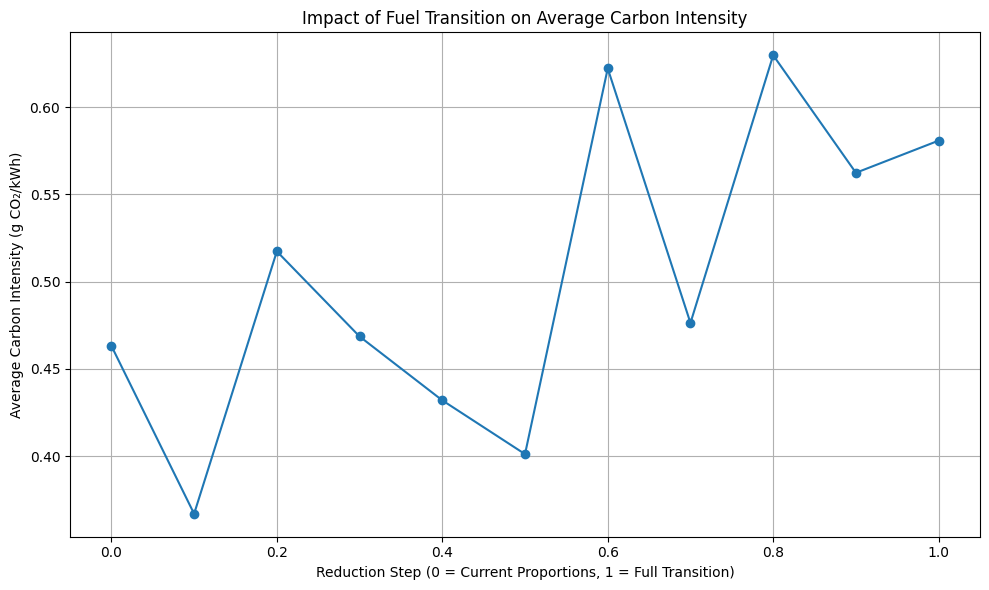

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def simulate_fuel_transition(data, median_total_consumption, predict_carbon_intensity_bin, predict_carbon_intensity):
    """
    Simulate the transition from fossil fuels to cleaner fuels and analyze carbon intensity.

    Parameters:
        data (pd.DataFrame): Cleaned emissions data.
        median_total_consumption (float): Median total fuel consumption.
        predict_carbon_intensity_bin: Function to predict carbon intensity bin.
        predict_carbon_intensity: Function to predict precise carbon intensity.

    Returns:
        pd.DataFrame: Results of the simulation.
    """
    # Define fuel groups
    fuel_groups = {
        'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    }

    # Get the current proportions of fuel consumption
    total_consumption = data[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET', 'GEO', 'MSW']]].sum()
    current_proportions = total_consumption / total_consumption.sum()

    # Define steps for reducing fossil fuels
    reduction_steps = np.linspace(0, 1, 11)  # 10 steps from 0% to 100% reduction

    # Initialize results storage
    results = []

    for step in reduction_steps:
        # Calculate new proportions
        new_proportions = current_proportions.copy()

        # Reduce fossil fuels and redistribute to cleaner fuels
        fossil_reduction = step * current_proportions[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET']]].sum()
        new_proportions[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET']]] *= (1 - step)

        # Redistribute fossil reduction (70% to GEO, 30% to MSW)
        new_proportions[fuel_groups['GEO']] += fossil_reduction * 0.3
        new_proportions[fuel_groups['MSW']] += fossil_reduction * 0.7

        # Normalize proportions
        new_proportions /= new_proportions.sum()

        # Calculate absolute consumption values
        consumption_values = new_proportions * median_total_consumption

        # Simulate instances
        simulated_instances = []
        for fuel_group, consumption in zip(['GAS', 'COAL', 'PET', 'GEO', 'MSW'], consumption_values):
            # Find closest matching instance in the dataset
            column = fuel_groups[fuel_group]
            subset = data[data[column] > 0]  # Only consider rows with positive consumption
            closest_row = subset.iloc[(subset[column] - consumption).abs().argsort()[:1]]

            # Extract generation value
            generation = closest_row['GENERATION_(KWH)'].values[0]

            # Create simulated instance
            instance = {
                'PRIME_MOVER': closest_row['PRIME_MOVER'].values[0],
                'FUEL_CODE': closest_row['FUEL_CODE'].values[0],
                'SECTOR_GROUP': closest_row['SECTOR_GROUP'].values[0],
                'GENERATION_(KWH)': generation,
            }

            # Add fuel consumptions
            for col in fuel_groups.values():
                instance[col] = consumption if col == fuel_groups[fuel_group] else 0

            simulated_instances.append(instance)

        # Predict carbon intensity for each instance
        carbon_intensities = []
        for instance in simulated_instances:
            # Use predict_carbon_intensity_bin to get the bin prediction
            bin_prediction = predict_carbon_intensity_bin(pd.DataFrame([instance]))

            # Use predict_carbon_intensity to get the precise prediction
            precise_prediction = predict_carbon_intensity(pd.DataFrame([instance]), bin_prediction)

            # Handle scalar output
            if isinstance(precise_prediction, (list, np.ndarray)):
                carbon_intensities.append(precise_prediction[0])
            else:
                carbon_intensities.append(precise_prediction)

        # Calculate average carbon intensity
        avg_carbon_intensity = np.mean(carbon_intensities)

        # Store results
        results.append({
            'Reduction Step': step,
            'Average Carbon Intensity': avg_carbon_intensity,
            'Proportions': new_proportions.to_dict()
        })

    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(results_df['Reduction Step'], results_df['Average Carbon Intensity'], marker='o')
    plt.title('Impact of Fuel Transition on Average Carbon Intensity')
    plt.xlabel('Reduction Step (0 = Current Proportions, 1 = Full Transition)')
    plt.ylabel('Average Carbon Intensity (g CO₂/kWh)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return results_df

# Example usage
median_total_consumption = 325944.5  # From previous analysis
results = simulate_fuel_transition(
    data,
    median_total_consumption,
    predict_carbon_intensity_bin,
    predict_carbon_intensity
)

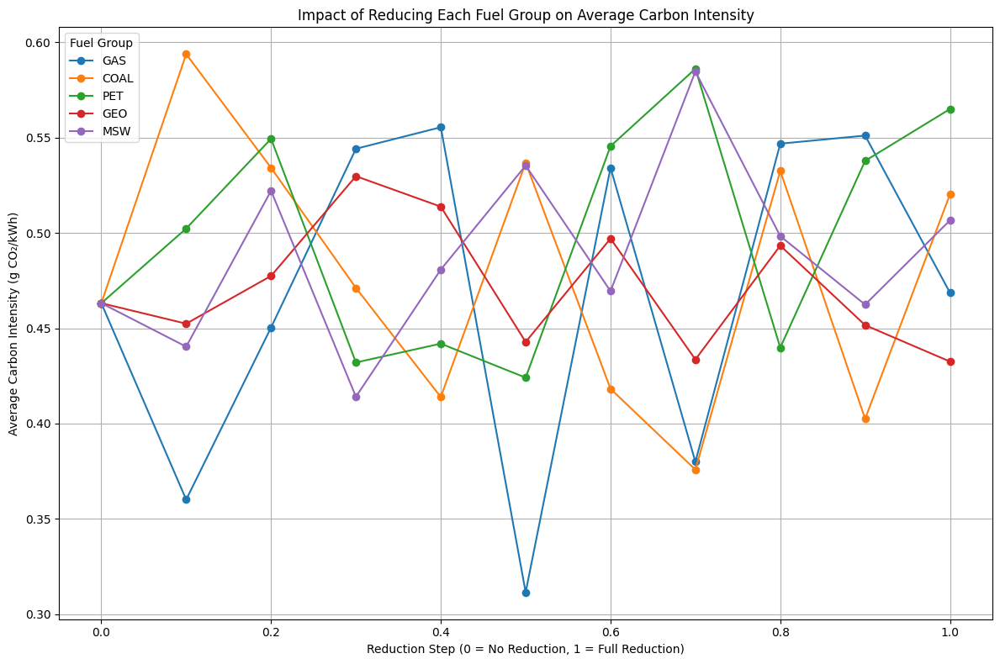

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def simulate_fuel_reduction_impact(data, median_total_consumption, predict_carbon_intensity_bin, predict_carbon_intensity):
    """
    Simulate the impact of reducing each fuel group on average carbon intensity.

    Parameters:
        data (pd.DataFrame): Cleaned emissions data.
        median_total_consumption (float): Median total fuel consumption.
        predict_carbon_intensity_bin: Function to predict carbon intensity bin.
        predict_carbon_intensity: Function to predict precise carbon intensity.

    Returns:
        pd.DataFrame: Results of the simulation.
    """
    # Define fuel groups
    fuel_groups = {
        'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    }

    # Get the current proportions of fuel consumption
    total_consumption = data[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET', 'GEO', 'MSW']]].sum()
    current_proportions = total_consumption / total_consumption.sum()

    # Define steps for reducing a fuel group
    reduction_steps = np.linspace(0, 1, 11)  # 10 steps from 0% to 100% reduction

    # Initialize results storage
    all_results = []

    # Iterate over each fuel group
    for fuel_group in ['GAS', 'COAL', 'PET', 'GEO', 'MSW']:
        results = []

        for step in reduction_steps:
            # Calculate new proportions
            new_proportions = current_proportions.copy()

            # Reduce the selected fuel group
            reduced_fuel_consumption = step * current_proportions[fuel_groups[fuel_group]]
            new_proportions[fuel_groups[fuel_group]] -= reduced_fuel_consumption

            # Redistribute the reduction equally among other fuels
            other_fuels = [f for f in ['GAS', 'COAL', 'PET', 'GEO', 'MSW'] if f != fuel_group]
            redistribution_per_fuel = reduced_fuel_consumption / len(other_fuels)
            for other_fuel in other_fuels:
                new_proportions[fuel_groups[other_fuel]] += redistribution_per_fuel

            # Normalize proportions
            new_proportions /= new_proportions.sum()

            # Calculate absolute consumption values
            consumption_values = new_proportions * median_total_consumption

            # Simulate instances
            simulated_instances = []
            for fuel, consumption in zip(['GAS', 'COAL', 'PET', 'GEO', 'MSW'], consumption_values):
                # Find closest matching instance in the dataset
                column = fuel_groups[fuel]
                subset = data[data[column] > 0]  # Only consider rows with positive consumption
                closest_row = subset.iloc[(subset[column] - consumption).abs().argsort()[:1]]

                # Extract generation value
                generation = closest_row['GENERATION_(KWH)'].values[0]

                # Create simulated instance
                instance = {
                    'PRIME_MOVER': closest_row['PRIME_MOVER'].values[0],
                    'FUEL_CODE': closest_row['FUEL_CODE'].values[0],
                    'SECTOR_GROUP': closest_row['SECTOR_GROUP'].values[0],
                    'GENERATION_(KWH)': generation,
                }

                # Add fuel consumptions
                for col in fuel_groups.values():
                    instance[col] = consumption if col == fuel_groups[fuel] else 0

                simulated_instances.append(instance)

            # Predict carbon intensity for each instance
            carbon_intensities = []
            for instance in simulated_instances:
                # Use predict_carbon_intensity_bin to get the bin prediction
                bin_prediction = predict_carbon_intensity_bin(pd.DataFrame([instance]))

                # Use predict_carbon_intensity to get the precise prediction
                precise_prediction = predict_carbon_intensity(pd.DataFrame([instance]), bin_prediction)

                # Handle scalar output
                if isinstance(precise_prediction, (list, np.ndarray)):
                    carbon_intensities.append(precise_prediction[0])
                else:
                    carbon_intensities.append(precise_prediction)

            # Calculate average carbon intensity
            avg_carbon_intensity = np.mean(carbon_intensities)

            # Store results
            results.append({
                'Fuel Group': fuel_group,
                'Reduction Step': step,
                'Average Carbon Intensity': avg_carbon_intensity
            })

        # Append results for the current fuel group
        all_results.extend(results)

    # Convert results to DataFrame
    results_df = pd.DataFrame(all_results)

    # Plot the results
    plt.figure(figsize=(12, 8))
    for fuel_group in ['GAS', 'COAL', 'PET', 'GEO', 'MSW']:
        subset = results_df[results_df['Fuel Group'] == fuel_group]
        plt.plot(subset['Reduction Step'], subset['Average Carbon Intensity'], label=fuel_group, marker='o')

    plt.title('Impact of Reducing Each Fuel Group on Average Carbon Intensity')
    plt.xlabel('Reduction Step (0 = No Reduction, 1 = Full Reduction)')
    plt.ylabel('Average Carbon Intensity (g CO₂/kWh)')
    plt.legend(title='Fuel Group')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return results_df

# Example usage
median_total_consumption = 325944.5  # From previous analysis
results = simulate_fuel_reduction_impact(
    data,
    median_total_consumption,
    predict_carbon_intensity_bin,
    predict_carbon_intensity
)


--- Transitioning Fuel Group: GAS ---
Reduction Step: 0.0, Average Carbon Intensity: 0.4632
Reduction Step: 0.1, Average Carbon Intensity: 0.3601
Reduction Step: 0.2, Average Carbon Intensity: 0.4504
Reduction Step: 0.3, Average Carbon Intensity: 0.5442
Reduction Step: 0.4, Average Carbon Intensity: 0.5555
Reduction Step: 0.5, Average Carbon Intensity: 0.3115
Reduction Step: 0.6, Average Carbon Intensity: 0.5342
Reduction Step: 0.7, Average Carbon Intensity: 0.3800
Reduction Step: 0.8, Average Carbon Intensity: 0.5469
Reduction Step: 0.9, Average Carbon Intensity: 0.5511
Reduction Step: 1.0, Average Carbon Intensity: 0.4687


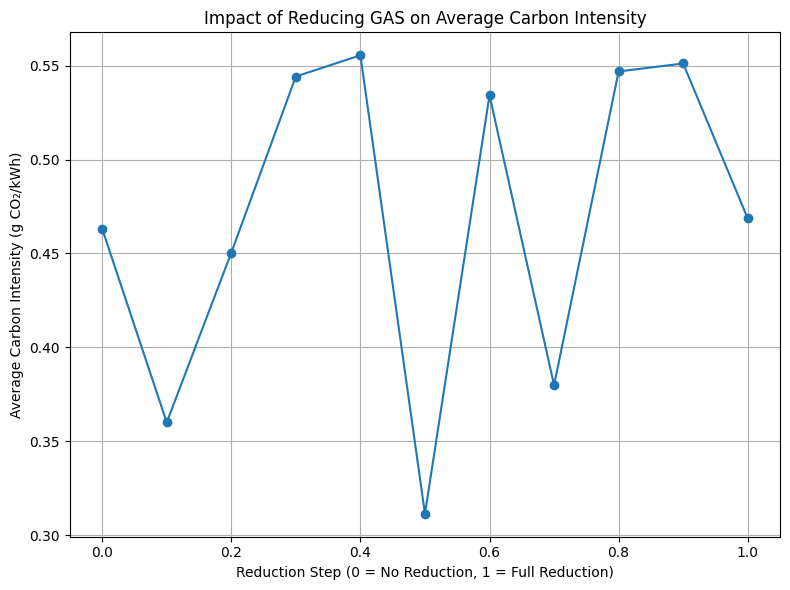


--- Transitioning Fuel Group: COAL ---
Reduction Step: 0.0, Average Carbon Intensity: 0.4632
Reduction Step: 0.1, Average Carbon Intensity: 0.5939
Reduction Step: 0.2, Average Carbon Intensity: 0.5342
Reduction Step: 0.3, Average Carbon Intensity: 0.4712
Reduction Step: 0.4, Average Carbon Intensity: 0.4139
Reduction Step: 0.5, Average Carbon Intensity: 0.5368
Reduction Step: 0.6, Average Carbon Intensity: 0.4182
Reduction Step: 0.7, Average Carbon Intensity: 0.3758
Reduction Step: 0.8, Average Carbon Intensity: 0.5326
Reduction Step: 0.9, Average Carbon Intensity: 0.4025
Reduction Step: 1.0, Average Carbon Intensity: 0.5203


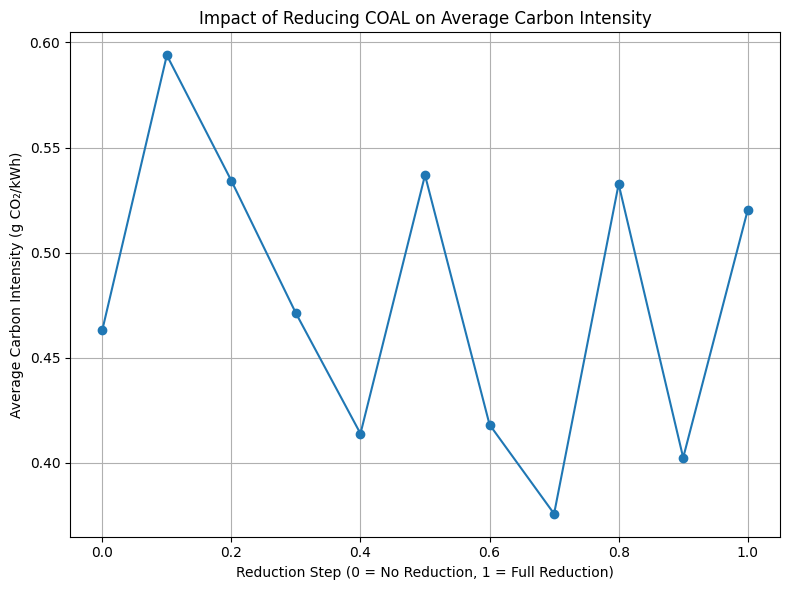


--- Transitioning Fuel Group: PET ---
Reduction Step: 0.0, Average Carbon Intensity: 0.4632
Reduction Step: 0.1, Average Carbon Intensity: 0.5023
Reduction Step: 0.2, Average Carbon Intensity: 0.5494
Reduction Step: 0.3, Average Carbon Intensity: 0.4321
Reduction Step: 0.4, Average Carbon Intensity: 0.4419
Reduction Step: 0.5, Average Carbon Intensity: 0.4241
Reduction Step: 0.6, Average Carbon Intensity: 0.5456
Reduction Step: 0.7, Average Carbon Intensity: 0.5862
Reduction Step: 0.8, Average Carbon Intensity: 0.4399
Reduction Step: 0.9, Average Carbon Intensity: 0.5378
Reduction Step: 1.0, Average Carbon Intensity: 0.5651


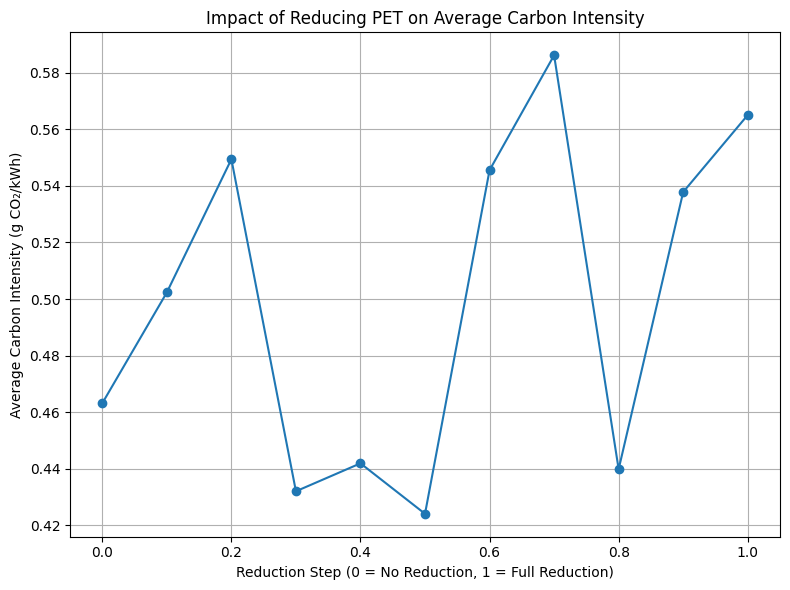


--- Transitioning Fuel Group: GEO ---
Reduction Step: 0.0, Average Carbon Intensity: 0.4632
Reduction Step: 0.1, Average Carbon Intensity: 0.4524
Reduction Step: 0.2, Average Carbon Intensity: 0.4775
Reduction Step: 0.3, Average Carbon Intensity: 0.5298
Reduction Step: 0.4, Average Carbon Intensity: 0.5138
Reduction Step: 0.5, Average Carbon Intensity: 0.4428
Reduction Step: 0.6, Average Carbon Intensity: 0.4971
Reduction Step: 0.7, Average Carbon Intensity: 0.4336
Reduction Step: 0.8, Average Carbon Intensity: 0.4934
Reduction Step: 0.9, Average Carbon Intensity: 0.4517
Reduction Step: 1.0, Average Carbon Intensity: 0.4326


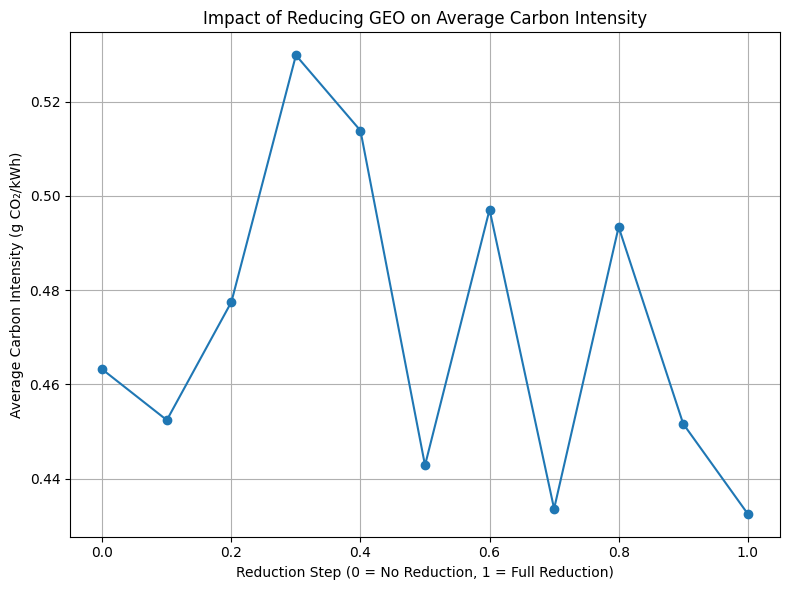


--- Transitioning Fuel Group: MSW ---
Reduction Step: 0.0, Average Carbon Intensity: 0.4632
Reduction Step: 0.1, Average Carbon Intensity: 0.4404
Reduction Step: 0.2, Average Carbon Intensity: 0.5222
Reduction Step: 0.3, Average Carbon Intensity: 0.4141
Reduction Step: 0.4, Average Carbon Intensity: 0.4808
Reduction Step: 0.5, Average Carbon Intensity: 0.5354
Reduction Step: 0.6, Average Carbon Intensity: 0.4695
Reduction Step: 0.7, Average Carbon Intensity: 0.5848
Reduction Step: 0.8, Average Carbon Intensity: 0.4984
Reduction Step: 0.9, Average Carbon Intensity: 0.4624
Reduction Step: 1.0, Average Carbon Intensity: 0.5067


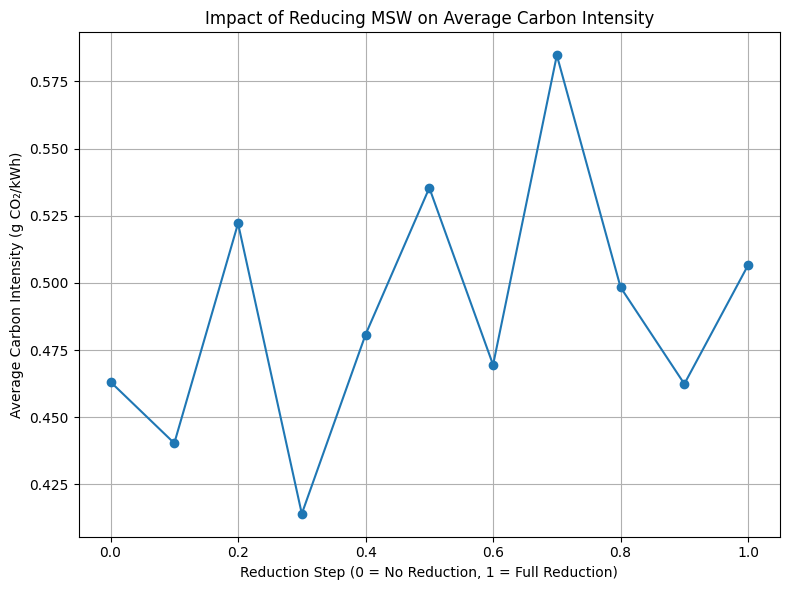

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def simulate_fuel_reduction_impact(data, median_total_consumption, predict_carbon_intensity_bin, predict_carbon_intensity):
    """
    Simulate the impact of reducing each fuel group on average carbon intensity.

    Parameters:
        data (pd.DataFrame): Cleaned emissions data.
        median_total_consumption (float): Median total fuel consumption.
        predict_carbon_intensity_bin: Function to predict carbon intensity bin.
        predict_carbon_intensity: Function to predict precise carbon intensity.

    Returns:
        pd.DataFrame: Results of the simulation.
    """
    # Define fuel groups
    fuel_groups = {
        'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    }

    # Get the current proportions of fuel consumption
    total_consumption = data[[fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET', 'GEO', 'MSW']]].sum()
    current_proportions = total_consumption / total_consumption.sum()

    # Define steps for reducing a fuel group
    reduction_steps = np.linspace(0, 1, 11)  # 10 steps from 0% to 100% reduction

    # Initialize results storage
    all_results = []

    # Iterate over each fuel group
    for fuel_group in ['GAS', 'COAL', 'PET', 'GEO', 'MSW']:
        results = []

        print(f"\n--- Transitioning Fuel Group: {fuel_group} ---")
        for step in reduction_steps:
            # Calculate new proportions
            new_proportions = current_proportions.copy()

            # Reduce the selected fuel group
            reduced_fuel_consumption = step * current_proportions[fuel_groups[fuel_group]]
            new_proportions[fuel_groups[fuel_group]] -= reduced_fuel_consumption

            # Redistribute the reduction equally among other fuels
            other_fuels = [f for f in ['GAS', 'COAL', 'PET', 'GEO', 'MSW'] if f != fuel_group]
            redistribution_per_fuel = reduced_fuel_consumption / len(other_fuels)
            for other_fuel in other_fuels:
                new_proportions[fuel_groups[other_fuel]] += redistribution_per_fuel

            # Normalize proportions
            new_proportions /= new_proportions.sum()

            # Calculate absolute consumption values
            consumption_values = new_proportions * median_total_consumption

            # Simulate instances
            simulated_instances = []
            for fuel, consumption in zip(['GAS', 'COAL', 'PET', 'GEO', 'MSW'], consumption_values):
                # Find closest matching instance in the dataset
                column = fuel_groups[fuel]
                subset = data[data[column] > 0]  # Only consider rows with positive consumption
                closest_row = subset.iloc[(subset[column] - consumption).abs().argsort()[:1]]

                # Extract generation value
                generation = closest_row['GENERATION_(KWH)'].values[0]

                # Create simulated instance
                instance = {
                    'PRIME_MOVER': closest_row['PRIME_MOVER'].values[0],
                    'FUEL_CODE': closest_row['FUEL_CODE'].values[0],
                    'SECTOR_GROUP': closest_row['SECTOR_GROUP'].values[0],
                    'GENERATION_(KWH)': generation,
                }

                # Add fuel consumptions
                for col in fuel_groups.values():
                    instance[col] = consumption if col == fuel_groups[fuel] else 0

                simulated_instances.append(instance)

            # Predict carbon intensity for each instance
            carbon_intensities = []
            for instance in simulated_instances:
                # Use predict_carbon_intensity_bin to get the bin prediction
                bin_prediction = predict_carbon_intensity_bin(pd.DataFrame([instance]))

                # Use predict_carbon_intensity to get the precise prediction
                precise_prediction = predict_carbon_intensity(pd.DataFrame([instance]), bin_prediction)

                # Handle scalar output
                if isinstance(precise_prediction, (list, np.ndarray)):
                    carbon_intensities.append(precise_prediction[0])
                else:
                    carbon_intensities.append(precise_prediction)

            # Calculate average carbon intensity
            avg_carbon_intensity = np.mean(carbon_intensities)

            # Store results
            results.append({
                'Fuel Group': fuel_group,
                'Reduction Step': step,
                'Average Carbon Intensity': avg_carbon_intensity
            })

            # Print values for each reduction step
            print(f"Reduction Step: {step:.1f}, Average Carbon Intensity: {avg_carbon_intensity:.4f}")

        # Append results for the current fuel group
        all_results.extend(results)

        # Plot results for the current fuel group
        plt.figure(figsize=(8, 6))
        subset = pd.DataFrame(results)
        plt.plot(subset['Reduction Step'], subset['Average Carbon Intensity'], marker='o', label=fuel_group)
        plt.title(f'Impact of Reducing {fuel_group} on Average Carbon Intensity')
        plt.xlabel('Reduction Step (0 = No Reduction, 1 = Full Reduction)')
        plt.ylabel('Average Carbon Intensity (g CO₂/kWh)')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # Convert results to DataFrame
    results_df = pd.DataFrame(all_results)

    return results_df

# Example usage
median_total_consumption = 325944.5  # From previous analysis
results = simulate_fuel_reduction_impact(
    data,
    median_total_consumption,
    predict_carbon_intensity_bin,
    predict_carbon_intensity
)

<ipython-input-34-38809b8bf171>:44: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[column].fillna(0, inplace=True)  # Replace NaN with 0



--- Transitioning Fuel Group: GAS ---
Reduction Step: 0.0, Average Carbon Intensity: 0.4879
Reduction Step: 0.1, Average Carbon Intensity: 0.4194
Reduction Step: 0.2, Average Carbon Intensity: 0.4297
Reduction Step: 0.3, Average Carbon Intensity: 0.4884
Reduction Step: 0.4, Average Carbon Intensity: 0.4938
Reduction Step: 0.5, Average Carbon Intensity: 0.4794
Reduction Step: 0.6, Average Carbon Intensity: 0.4590
Reduction Step: 0.7, Average Carbon Intensity: 0.4208
Reduction Step: 0.8, Average Carbon Intensity: 0.5240
Reduction Step: 0.9, Average Carbon Intensity: 0.4313
Reduction Step: 1.0, Average Carbon Intensity: 0.4161


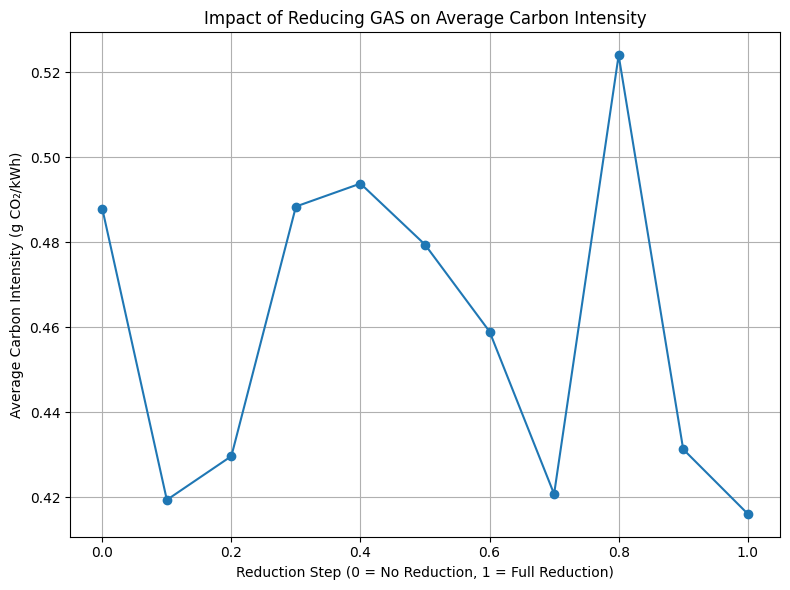


--- Transitioning Fuel Group: COAL ---
Reduction Step: 0.0, Average Carbon Intensity: 0.4879
Reduction Step: 0.1, Average Carbon Intensity: 0.5979
Reduction Step: 0.2, Average Carbon Intensity: 0.5026
Reduction Step: 0.3, Average Carbon Intensity: 0.4689
Reduction Step: 0.4, Average Carbon Intensity: 0.4137
Reduction Step: 0.5, Average Carbon Intensity: 0.5651
Reduction Step: 0.6, Average Carbon Intensity: 0.4420
Reduction Step: 0.7, Average Carbon Intensity: 0.4069
Reduction Step: 0.8, Average Carbon Intensity: 0.5254
Reduction Step: 0.9, Average Carbon Intensity: 0.4075
Reduction Step: 1.0, Average Carbon Intensity: 0.5360


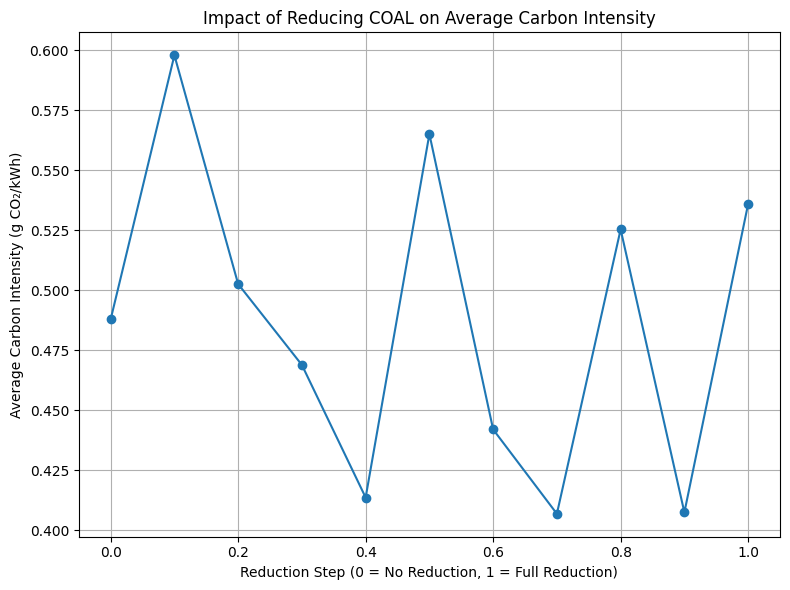


--- Transitioning Fuel Group: PET ---
Reduction Step: 0.0, Average Carbon Intensity: 0.4879
Reduction Step: 0.1, Average Carbon Intensity: 0.5226
Reduction Step: 0.2, Average Carbon Intensity: 0.5736
Reduction Step: 0.3, Average Carbon Intensity: 0.4458
Reduction Step: 0.4, Average Carbon Intensity: 0.4743
Reduction Step: 0.5, Average Carbon Intensity: 0.4326
Reduction Step: 0.6, Average Carbon Intensity: 0.5422
Reduction Step: 0.7, Average Carbon Intensity: 0.5081
Reduction Step: 0.8, Average Carbon Intensity: 0.4394
Reduction Step: 0.9, Average Carbon Intensity: 0.5234
Reduction Step: 1.0, Average Carbon Intensity: 0.3551


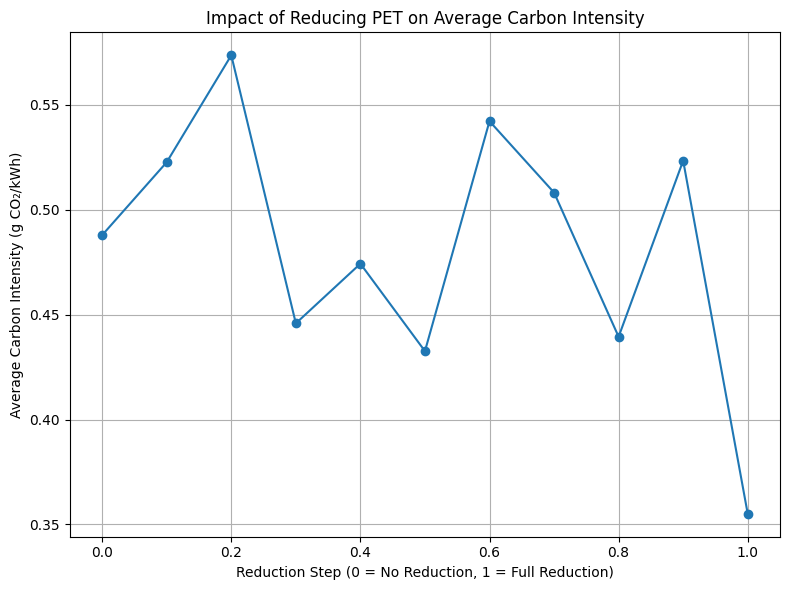


--- Transitioning Fuel Group: GEO ---
Reduction Step: 0.0, Average Carbon Intensity: 0.4879
Reduction Step: 0.1, Average Carbon Intensity: 0.4874
Reduction Step: 0.2, Average Carbon Intensity: 0.5002
Reduction Step: 0.3, Average Carbon Intensity: 0.5466
Reduction Step: 0.4, Average Carbon Intensity: 0.5381
Reduction Step: 0.5, Average Carbon Intensity: 0.4600
Reduction Step: 0.6, Average Carbon Intensity: 0.4673
Reduction Step: 0.7, Average Carbon Intensity: 0.4399
Reduction Step: 0.8, Average Carbon Intensity: 0.4957
Reduction Step: 0.9, Average Carbon Intensity: 0.4619
Reduction Step: 1.0, Average Carbon Intensity: 0.4543


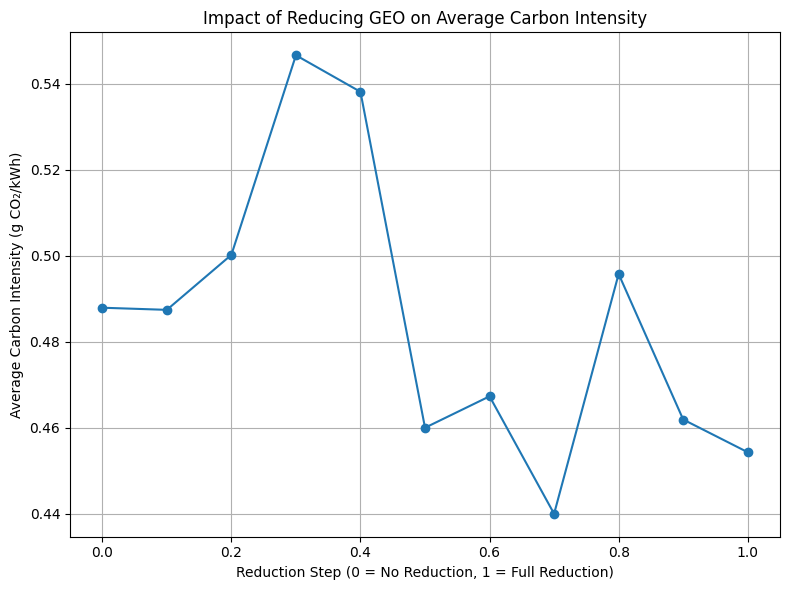


--- Transitioning Fuel Group: MSW ---
Reduction Step: 0.0, Average Carbon Intensity: 0.4879
Reduction Step: 0.1, Average Carbon Intensity: 0.4845
Reduction Step: 0.2, Average Carbon Intensity: 0.5233
Reduction Step: 0.3, Average Carbon Intensity: 0.4144
Reduction Step: 0.4, Average Carbon Intensity: 0.5031
Reduction Step: 0.5, Average Carbon Intensity: 0.4962
Reduction Step: 0.6, Average Carbon Intensity: 0.4726
Reduction Step: 0.7, Average Carbon Intensity: 0.5703
Reduction Step: 0.8, Average Carbon Intensity: 0.4863
Reduction Step: 0.9, Average Carbon Intensity: 0.4086
Reduction Step: 1.0, Average Carbon Intensity: 0.5284


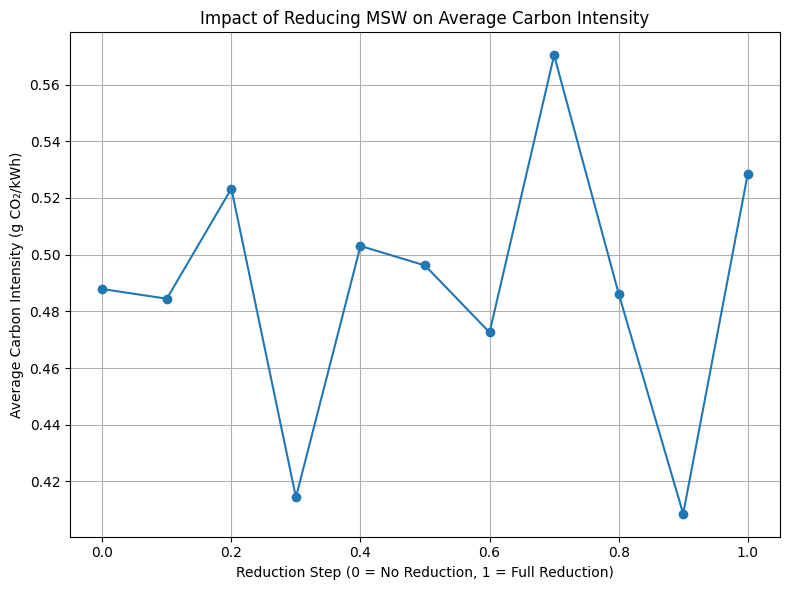

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def simulate_fuel_reduction_impact(data, median_total_consumption, predict_carbon_intensity_bin, predict_carbon_intensity):
    """
    Simulate the impact of reducing each fuel group on average carbon intensity.

    Parameters:
        data (pd.DataFrame): Cleaned emissions data.
        median_total_consumption (float): Median total fuel consumption.
        predict_carbon_intensity_bin: Function to predict carbon intensity bin.
        predict_carbon_intensity: Function to predict precise carbon intensity.

    Returns:
        pd.DataFrame: Results of the simulation.
    """
    # Ensure data is a pandas DataFrame
    if not isinstance(data, pd.DataFrame):
        raise TypeError("The 'data' parameter must be a pandas DataFrame.")

    # Define fuel groups
    fuel_groups = {
        'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    }

    # Define prime mover and fuel code mappings
    prime_mover_fuel_code = {
        'GAS': ('Gas Turbine', 'NG'),
        'COAL': ('Combustion Turbine', 'SGC'),
        'PET': ('Combined Cycle', 'RFO'),
        'GEO': ('Steam Turbine', 'GEO'),
        'MSW': ('Steam Turbine', 'MSW')
    }

    # Ensure numeric data in fuel consumption columns
    for fuel_group, column in fuel_groups.items():
        if column in data.columns:
            data[column] = pd.to_numeric(data[column], errors='coerce')  # Convert to numeric, coercing errors to NaN
            data[column].fillna(0, inplace=True)  # Replace NaN with 0

    # Get the current proportions of fuel consumption
    columns_to_sum = [fuel_groups[fuel] for fuel in ['GAS', 'COAL', 'PET', 'GEO', 'MSW'] if fuel_groups[fuel] in data.columns]

    # Filter out invalid columns
    valid_columns = [col for col in columns_to_sum if col in data.columns]
    if len(valid_columns) != len(columns_to_sum):
        missing_columns = set(columns_to_sum) - set(data.columns)
        print(f"Warning: The following columns are missing from the dataset: {missing_columns}")

    # Calculate total consumption using only valid columns
    total_consumption = data[valid_columns].sum()
    current_proportions = total_consumption / total_consumption.sum()

    # Define steps for reducing a fuel group
    reduction_steps = np.linspace(0, 1, 11)  # 10 steps from 0% to 100% reduction

    # Initialize results storage
    all_results = []

    # Iterate over each fuel group
    for fuel_group in ['GAS', 'COAL', 'PET', 'GEO', 'MSW']:
        results = []

        print(f"\n--- Transitioning Fuel Group: {fuel_group} ---")
        for step in reduction_steps:
            # Calculate new proportions
            new_proportions = current_proportions.copy()

            # Reduce the selected fuel group
            fuel_column = fuel_groups[fuel_group]
            if fuel_column in valid_columns:
                reduced_fuel_consumption = step * current_proportions[fuel_column]
                new_proportions[fuel_column] -= reduced_fuel_consumption

                # Redistribute the reduction equally among other fuels
                other_fuels = [f for f in ['GAS', 'COAL', 'PET', 'GEO', 'MSW'] if f != fuel_group]
                redistribution_per_fuel = reduced_fuel_consumption / len(other_fuels)
                for other_fuel in other_fuels:
                    other_column = fuel_groups[other_fuel]
                    if other_column in valid_columns:
                        new_proportions[other_column] += redistribution_per_fuel

            # Normalize proportions
            new_proportions /= new_proportions.sum()

            # Calculate absolute consumption values
            consumption_values = new_proportions * median_total_consumption

            # Simulate instances
            simulated_instances = []
            for fuel, consumption in zip(['GAS', 'COAL', 'PET', 'GEO', 'MSW'], consumption_values):
                # Set prime mover and fuel code based on the fuel group
                prime_mover, fuel_code = prime_mover_fuel_code[fuel]

                # Find closest matching instance in the dataset
                column = fuel_groups[fuel]
                if column in valid_columns:
                    subset = data[data[column] > 0]  # Only consider rows with positive consumption
                    closest_row = subset.iloc[(subset[column] - consumption).abs().argsort()[:1]]

                    # Extract generation value
                    generation = closest_row['GENERATION_(KWH)'].values[0]

                    # Create simulated instance
                    instance = {
                        'PRIME_MOVER': prime_mover,
                        'FUEL_CODE': fuel_code,
                        'SECTOR_GROUP': closest_row['SECTOR_GROUP'].values[0],
                        'GENERATION_(KWH)': generation,
                    }

                    # Add fuel consumptions
                    for col in valid_columns:
                        instance[col] = consumption if col == fuel_groups[fuel] else 0

                    simulated_instances.append(instance)

            # Predict carbon intensity for each instance
            carbon_intensities = []
            for instance in simulated_instances:
                # Use predict_carbon_intensity_bin to get the bin prediction
                bin_prediction = predict_carbon_intensity_bin(pd.DataFrame([instance]))

                # Use predict_carbon_intensity to get the precise prediction
                precise_prediction = predict_carbon_intensity(pd.DataFrame([instance]), bin_prediction)

                # Handle scalar output
                if isinstance(precise_prediction, (list, np.ndarray)):
                    carbon_intensities.append(precise_prediction[0])
                else:
                    carbon_intensities.append(precise_prediction)

            # Calculate average carbon intensity
            avg_carbon_intensity = np.mean(carbon_intensities)

            # Store results
            results.append({
                'Fuel Group': fuel_group,
                'Reduction Step': step,
                'Average Carbon Intensity': avg_carbon_intensity
            })

            # Print values for each reduction step
            print(f"Reduction Step: {step:.1f}, Average Carbon Intensity: {avg_carbon_intensity:.4f}")

        # Append results for the current fuel group
        all_results.extend(results)

        # Plot results for the current fuel group
        plt.figure(figsize=(8, 6))
        subset = pd.DataFrame(results)
        plt.plot(subset['Reduction Step'], subset['Average Carbon Intensity'], marker='o', label=fuel_group)
        plt.title(f'Impact of Reducing {fuel_group} on Average Carbon Intensity')
        plt.xlabel('Reduction Step (0 = No Reduction, 1 = Full Reduction)')
        plt.ylabel('Average Carbon Intensity (g CO₂/kWh)')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # Convert results to DataFrame
    results_df = pd.DataFrame(all_results)

    return results_df

# Example usage
if __name__ == "__main__":
    # Load your data here
    # Assuming data is in a CSV file
    data = pd.read_csv('/content/drive/MyDrive/cleaned_emissions_data.csv')

    # Define median total consumption
    median_total_consumption = 325944.5  # From previous analysis

    # Call the function
    results = simulate_fuel_reduction_impact(
        data,
        median_total_consumption,
        predict_carbon_intensity_bin,  # Replace with your prediction function
        predict_carbon_intensity       # Replace with your prediction function
    )

In [ ]:
import pandas as pd

from google.colab import drive
import pandas as pd
# Mount Google Drive
drive.mount('/content/drive', force_remount=True)
# Load the dataset
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Drop rows with missing values in the target column
data.dropna(subset=['TONS_OF_CO2_EMISSIONS'], inplace=True)

# Ensure numeric type for CARBON_INTENSITY_g_per_kWh
data['CARBON_INTENSITY_g_per_kWh'] = (data['TONS_OF_CO2_EMISSIONS'] * 1_000_000) / data['GENERATION_(KWH)']

# Remove outliers in Carbon Intensity
threshold = data['CARBON_INTENSITY_g_per_kWh'].quantile(0.99)
data = data[data['CARBON_INTENSITY_g_per_kWh'] <= threshold]

# Calculate mean and median of carbon intensity
mean_carbon_intensity = data['CARBON_INTENSITY_g_per_kWh'].mean()
median_carbon_intensity = data['CARBON_INTENSITY_g_per_kWh'].median()

# Print results
print(f"Mean Carbon Intensity: {mean_carbon_intensity:.2f} g CO₂/kWh")
print(f"Median Carbon Intensity: {median_carbon_intensity:.2f} g CO₂/kWh")

Mounted at /content/drive
Mean Carbon Intensity: 1224.16 g CO₂/kWh
Median Carbon Intensity: 852.23 g CO₂/kWh


In [ ]:
import pandas as pd
import numpy as np
import joblib
import shap

def predict_carbon_intensity(instance, classification_prediction, threshold=436.65):
    """
    Predicts the normalized carbon intensity for a given instance using the appropriate regression model.
    Adds local SHAP analysis to explain predictions.

    Parameters:
        instance (dict or pd.DataFrame): Input instance with feature values.
        classification_prediction (str): Predicted bin ('High' or 'Low') from the classification model.
        threshold (float): Threshold used to split the data into bins (default: 436.65).

    Returns:
        dict: A dictionary containing the predicted normalized carbon intensity,
              denormalized carbon intensity, SHAP values, explainer, and feature names.
    """
    # Step 1: Convert the instance to a DataFrame if it's a dictionary
    if isinstance(instance, dict):
        instance = pd.DataFrame([instance])
    elif not isinstance(instance, pd.DataFrame):
        raise ValueError("Instance must be a dictionary or a pandas DataFrame.")

    # Step 2: Define paths to the saved models
    low_model_path = f'/content/drive/MyDrive/models/low_bin_model_threshold_{threshold:.2f}.pkl'
    high_model_path = f'/content/drive/MyDrive/models/high_bin_model_threshold_{threshold:.2f}.pkl'

    # Step 3: Load the appropriate regression model based on the classification prediction
    if classification_prediction == 'Low':
        model_path = low_model_path
    elif classification_prediction == 'High':
        model_path = high_model_path
    else:
        raise ValueError("Invalid classification prediction. Expected 'High' or 'Low'.")

    # Load the regression pipeline
    pipeline = joblib.load(model_path)
    model = pipeline.named_steps['model']  # Extract the regression model

    # Step 4: Drop unnecessary columns
    drop_columns = [
        'PLANT_NAME', 'STATE', 'TONS_OF_CO2_EMISSIONS',
        'CARBON_INTENSITY', 'BIN', 'CARBON_INTENSITY_g_per_kWh'
    ]
    instance = instance.drop(columns=[col for col in drop_columns if col in instance.columns])

    # Step 5: Ensure all required columns are present
    categorical_cols = ['PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP']
    numerical_cols = [
        'GENERATION_(KWH)',
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]

    for col in numerical_cols + categorical_cols:
        if col not in instance.columns:
            if col in numerical_cols:
                instance[col] = 0  # Default value for numerical columns
            else:
                instance[col] = "Unknown"  # Default value for categorical columns

    # Step 6: Calculate derived features
    # Total fuel consumption
    fuel_consumption_columns = numerical_cols[1:]  # Exclude 'GENERATION_(KWH)'
    instance['FUEL_CONSUMPTION_TOTAL'] = instance[fuel_consumption_columns].sum(axis=1)

    # Fuel efficiency
    instance['FUEL_EFFICIENCY'] = (
        instance['GENERATION_(KWH)'] / instance['FUEL_CONSUMPTION_TOTAL']
    ).replace([np.inf, -np.inf], 0)  # Handle division by zero

    # Step 7: Reorder columns to match the expected order
    required_columns = numerical_cols + ['FUEL_CONSUMPTION_TOTAL', 'FUEL_EFFICIENCY'] + categorical_cols
    instance = instance[required_columns]

    # Step 8: Preprocess the instance
    instance_preprocessed = pipeline.named_steps['preprocessor'].transform(instance)

    # Step 9: Predict using the loaded regression model
    prediction = pipeline.predict(instance)[0]

    # Step 10: Inverse transform the log-transformed prediction (if applicable)
    prediction = np.expm1(prediction)  # Reverse the log transformation

    # Step 11: Compute SHAP values
    explainer = shap.Explainer(model)
    shap_values = explainer(instance_preprocessed)

    # Return results
    return {
        'Predicted Normalized Carbon Intensity': prediction,
        'SHAP Values': shap_values.values[0],
        'Explainer': explainer,  # Include the explainer object
        'Feature Names': list(instance.columns)
    }

In [ ]:
def predict_carbon_intensity_bin(instance):
    """
    Predicts whether the given instance belongs to the 'Low' or 'High' carbon intensity bin.

    Parameters:
        instance (dict or pd.DataFrame): A single instance with feature values.
        model_path (str): Path to the saved classification model.

    Returns:
        str: The predicted bin ('Low' or 'High').
    """
    model_path = '/content/drive/MyDrive/models/classification_model_threshold_436.65.pkl'
    # Step 1: Convert the instance to a DataFrame if it's a dictionary
    if isinstance(instance, dict):
        instance = pd.DataFrame([instance])
    elif not isinstance(instance, pd.DataFrame):
        raise ValueError("Instance must be a dictionary or a pandas DataFrame.")

    # Step 2: Drop unnecessary columns
    drop_columns = ['PLANT_NAME', 'STATE', 'GENERATION_(KWH)', 'TONS_OF_CO2_EMISSIONS', 'GENERATION_(KWH)']
    instance = instance.drop(columns=[col for col in drop_columns if col in instance.columns])

    # Step 3: Define categorical and numerical columns
    categorical_cols = ['PRIME_MOVER', 'FUEL_CODE', 'SECTOR_GROUP']
    numerical_cols = [
        'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
        'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
    ]

    # Step 4: Ensure all required columns are present
    for col in numerical_cols + categorical_cols:
        if col not in instance.columns:
            if col in numerical_cols:
                instance[col] = 0  # Default value for numerical columns
            else:
                instance[col] = "Unknown"  # Default value for categorical columns

    # Step 5: Reorder columns to match the expected order
    instance = instance[numerical_cols + categorical_cols]

    # Step 6: Load the classification model
    pipeline = joblib.load(model_path)

    # Step 7: Predict using the pipeline (preprocessing is handled automatically)
    prediction = pipeline.predict(instance)[0]

    # Step 8: Decode the prediction
    label_encoder = {0: 'High', 1: 'Low'}  # Assuming 'Low' -> 0 and 'High' -> 1
    predicted_bin = label_encoder[prediction]

    return predicted_bin

In [ ]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import joblib
import shap

def simulate_and_predict_with_fuel_code(electric_power_data, fuel_groups, min_value, max_value):
    """
    Simulates and predicts carbon intensity for different fuel groups, prime movers, and fuel codes.
    Uses the updated predict_carbon_intensity function to include SHAP analysis.

    Parameters:
        electric_power_data (pd.DataFrame): The dataset containing emissions data.
        fuel_groups (dict): Dictionary mapping fuel groups to their consumption columns.
        min_value (float): Minimum value used for normalization.
        max_value (float): Maximum value used for normalization.

    Returns:
        pd.DataFrame: Results DataFrame with predicted normalized and original carbon intensities,
                      along with SHAP values and explainer for each simulated instance.
    """
    results = []

    # Iterate over each fuel group
    for fuel, consumption_col in fuel_groups.items():
        # Subset for the current fuel group
        fuel_subset = electric_power_data[electric_power_data[consumption_col] > 0]

        # Sort the fuel subset by consumption
        sorted_fuel_subset = fuel_subset.sort_values(by=consumption_col)

        # Select the median instance
        median_index = len(sorted_fuel_subset) // 2
        median_consumption_instance = sorted_fuel_subset.iloc[median_index]

        # Extract the corresponding generation
        median_generation = median_consumption_instance['GENERATION_(KWH)']
        median_consumption = median_consumption_instance[consumption_col]

        # Get distinct PRIME_MOVER and FUEL_CODE combinations for this fuel group
        prime_mover_fuel_code_combinations = (
            fuel_subset.groupby(['PRIME_MOVER', 'FUEL_CODE']).size().reset_index()
        )

        for _, row in prime_mover_fuel_code_combinations.iterrows():
            prime_mover = row['PRIME_MOVER']
            fuel_code = row['FUEL_CODE']

            # Create a simulated instance
            instance = {
                'PRIME_MOVER': prime_mover,
                'FUEL_CODE': fuel_code,
                'SECTOR_GROUP': 'ELECTRIC POWER',
                'GENERATION_(KWH)': median_generation,
            }

            # Add fuel consumptions
            for col in fuel_groups.values():
                instance[col] = median_consumption if col == consumption_col else 0

            # Predict bin using the classification model
            predicted_bin = predict_carbon_intensity_bin(instance)  # Replace with your bin prediction function

            # Predict carbon intensity using the regression model
            prediction_results = predict_carbon_intensity(
                instance, classification_prediction=predicted_bin
            )

            # Denormalize the predicted carbon intensity
            predicted_normalized_intensity = prediction_results['Predicted Normalized Carbon Intensity']
            predicted_original_intensity = (
                predicted_normalized_intensity * (max_value - min_value)
            ) + min_value

            TOTAL_CONSUMPTION = instance.get('GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', 0) + instance.get('COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', 0) + instance.get('PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', 0) + instance.get('GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', 0) + instance.get('MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', 0)

            fuel_efficiency = median_generation / TOTAL_CONSUMPTION if TOTAL_CONSUMPTION > 0 else 0


            # Store results
            results.append({
                'Fuel Group': fuel,
                'PRIME_MOVER': prime_mover,
                'FUEL_CODE': fuel_code,
                'GENERATION_(KWH)': median_generation,
                'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)': instance.get('GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', 0),
                'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)': instance.get('COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', 0),
                'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)': instance.get('PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', 0),
                'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)': instance.get('GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', 0),
                'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)': instance.get('MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)', 0),
                'FUEL_CONSUMPTION_TOTAL': TOTAL_CONSUMPTION,
                'FUEL_EFFICIENCY': fuel_efficiency,
                'Predicted Bin': predicted_bin,
                'Predicted Normalized Carbon Intensity': predicted_normalized_intensity,
                'Predicted Carbon Intensity': predicted_original_intensity,
                'SHAP Values': prediction_results['SHAP Values'],
                'Explainer': prediction_results['Explainer'],  # Store the explainer
                'Feature Names': prediction_results['Feature Names']
            })

    # Convert results to a DataFrame
    results_df = pd.DataFrame(results)

    # Generate graphs for each fuel group
    for fuel in fuel_groups.keys():
        plot_carbon_intensity_by_prime_mover_and_fuel_code(results_df, fuel)

    # Generate local SHAP explanations
    plot_local_shap_explanations(results_df)

    # Generate heatmap
    plot_heatmap_prime_mover_vs_fuel_code(results_df)



    return results_df


import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_carbon_intensity_by_prime_mover_and_fuel_code(results_df, fuel_group):
    """
    Plots carbon intensity for a given fuel group, segmented by prime mover and fuel code.

    Parameters:
        results_df (pd.DataFrame): Results DataFrame containing predicted carbon intensities.
        fuel_group (str): Name of the fuel group to plot.
    """
    # Filter results for the specified fuel group
    fuel_group_results = results_df[results_df['Fuel Group'] == fuel_group]

    # Get unique PRIME_MOVER and FUEL_CODE values
    prime_movers = fuel_group_results['PRIME_MOVER'].unique()
    fuel_codes = fuel_group_results['FUEL_CODE'].unique()

    # Create a grouped bar chart
    fig, ax = plt.subplots(figsize=(12, 6))

    # Define bar width and positions
    num_fuel_codes = len(fuel_codes)
    bar_width = 0.8 / num_fuel_codes
    index = np.arange(len(prime_movers))

    # Plot each fuel code as a separate bar within each group
    for i, fuel_code in enumerate(fuel_codes):
        subset = fuel_group_results[fuel_group_results['FUEL_CODE'] == fuel_code]
        carbon_intensities = [subset[subset['PRIME_MOVER'] == pm]['Predicted Carbon Intensity'].values[0] if pm in subset['PRIME_MOVER'].values else 0 for pm in prime_movers]

        ax.bar(
            index + i * bar_width,
            carbon_intensities,
            width=bar_width,
            label=fuel_code
        )

    # Add labels, title, and legend
    ax.set_title(f'Overall Carbon Intensity for {fuel_group} by Prime Mover and Fuel Code')
    ax.set_xlabel('Prime Mover')
    ax.set_ylabel('Carbon Intensity (g CO₂/kWh)')
    ax.legend(title='Fuel Code')

    # Set x-axis ticks and labels
    ax.set_xticks(index + bar_width * (num_fuel_codes - 1) / 2)
    ax.set_xticklabels(prime_movers, rotation=45)

    # Show the plot
    plt.tight_layout()
    plt.show()

In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.6 MB/s eta 0:00:00


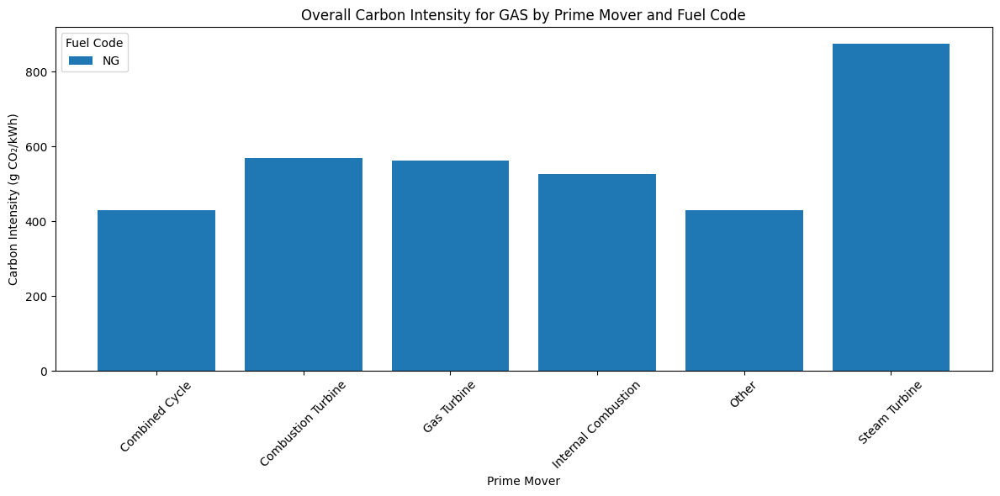

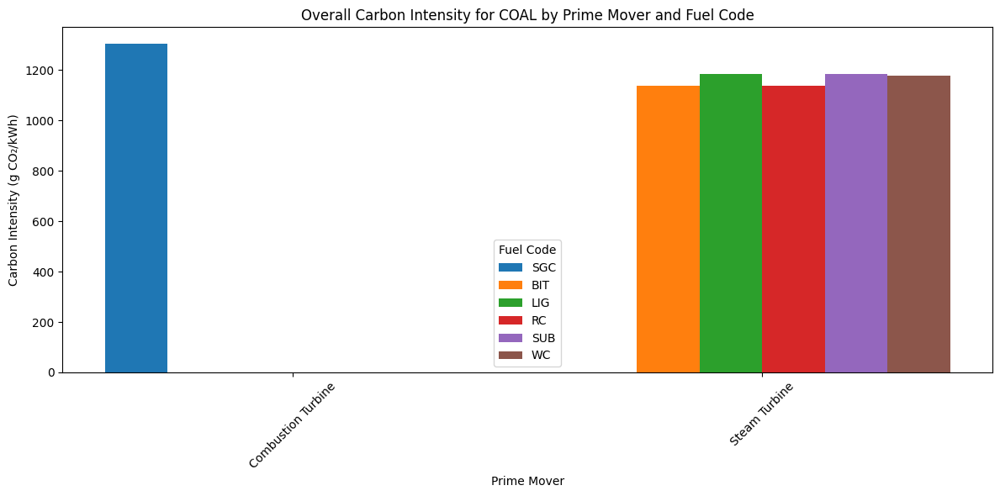

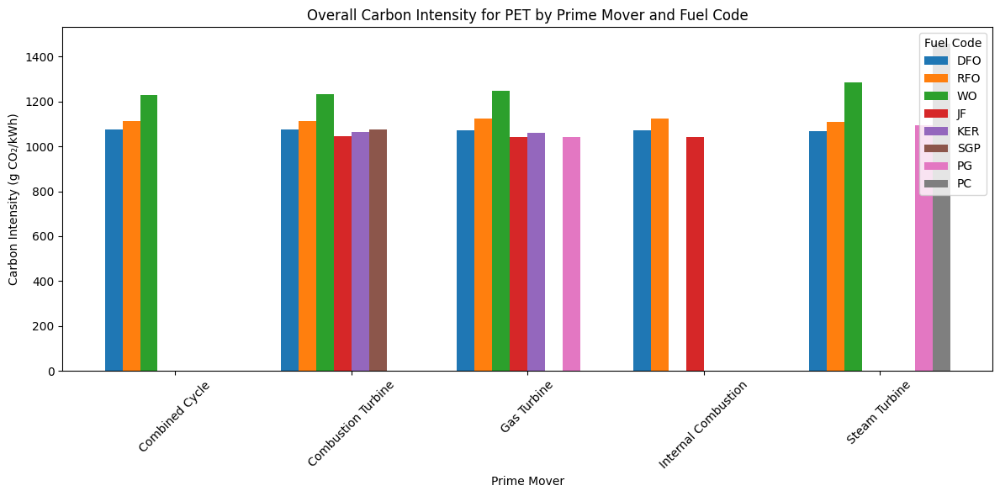

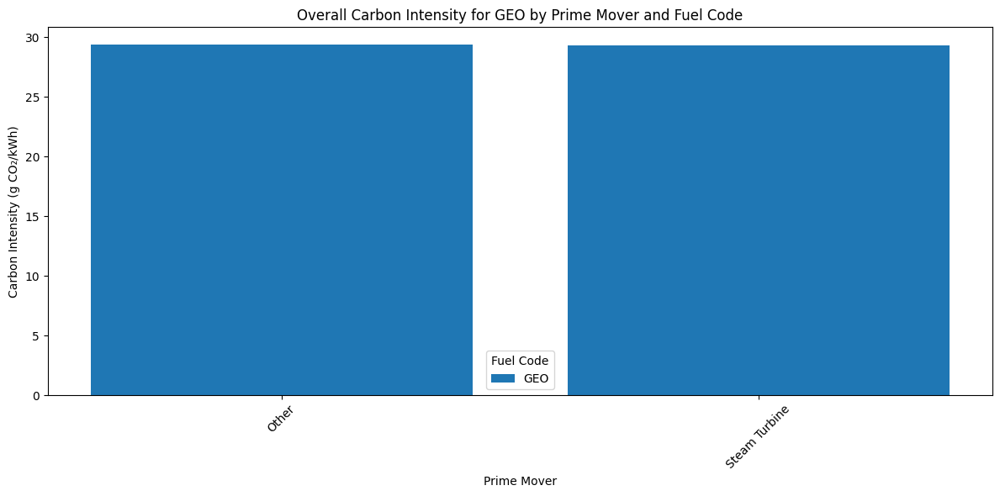

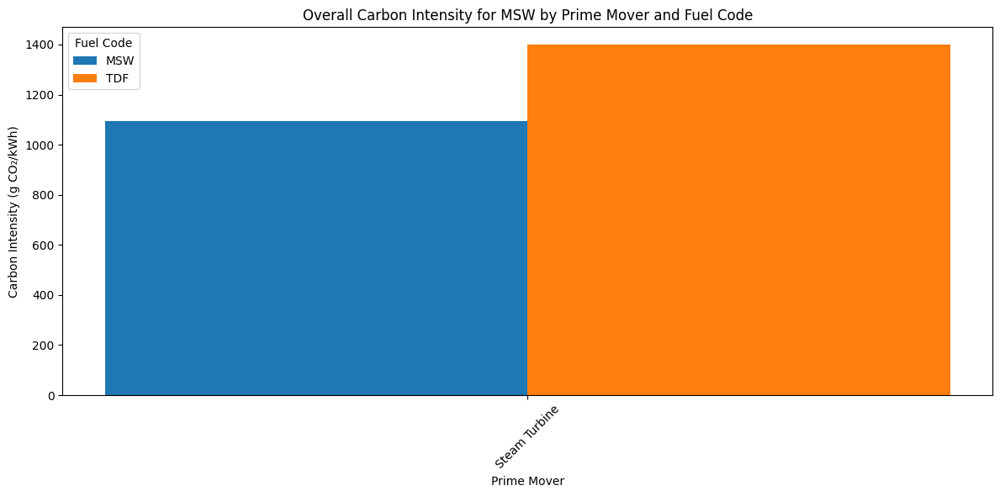

...

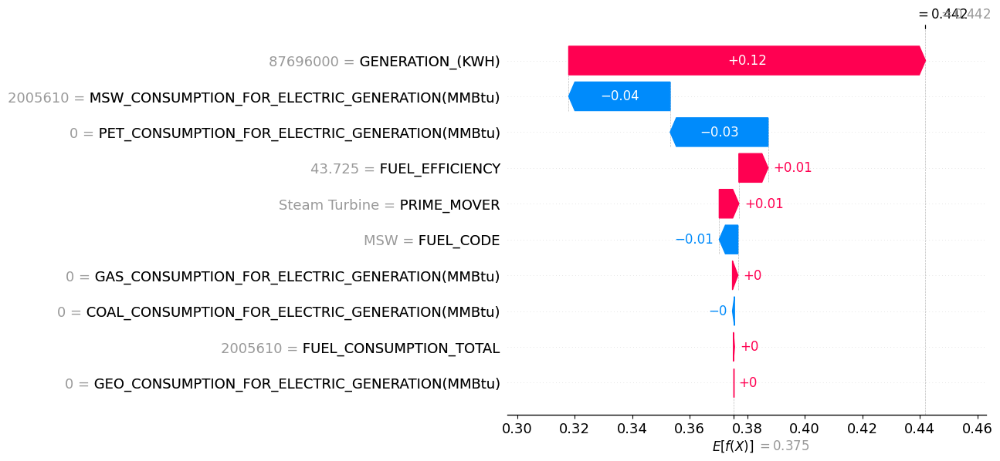

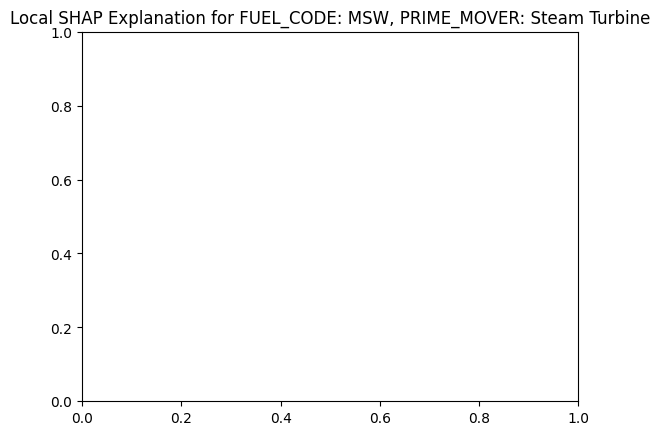

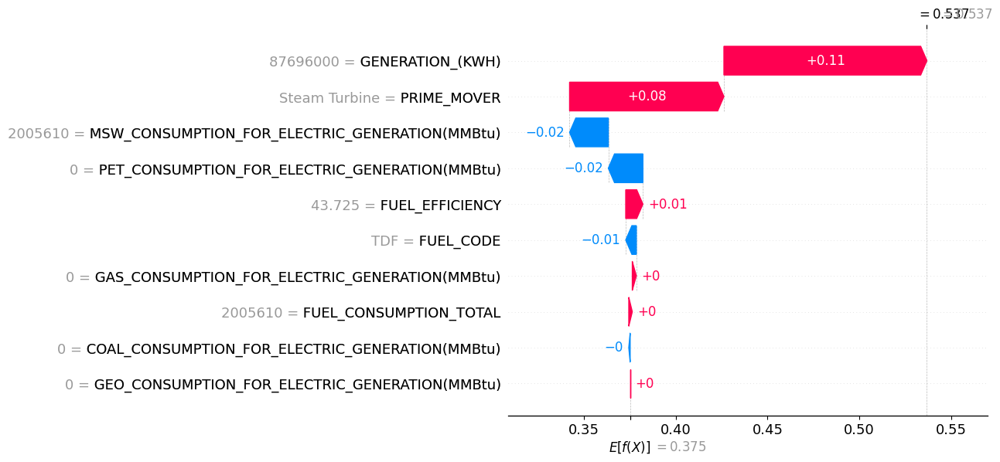

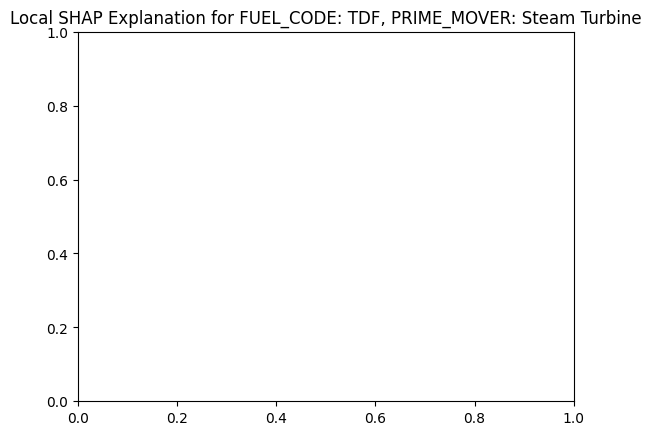

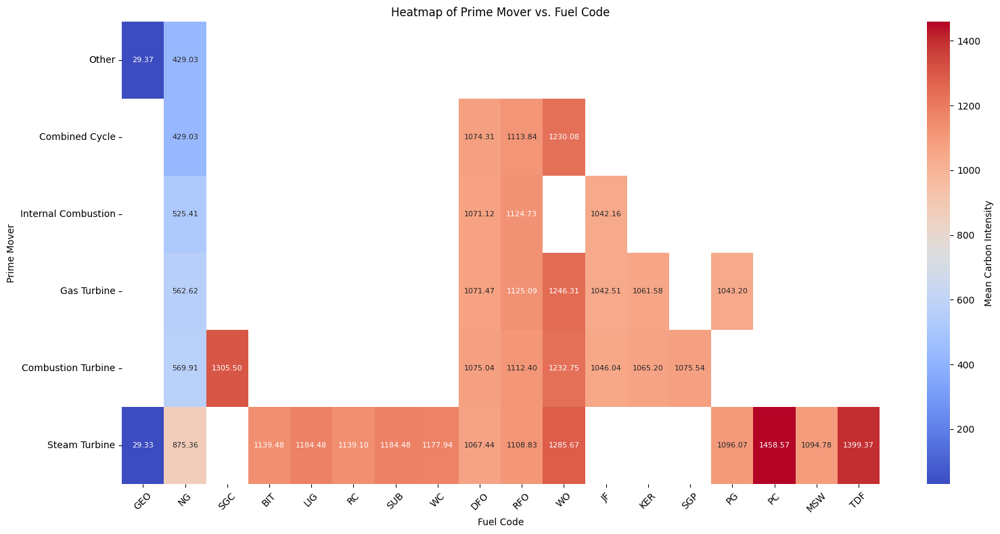

Simulation Results:
   Fuel Group          PRIME_MOVER FUEL_CODE  GENERATION_(KWH)  \
0         GAS       Combined Cycle        NG      6.813600e+07   
1         GAS   Combustion Turbine        NG      6.813600e+07   
2         GAS          Gas Turbine        NG      6.813600e+07   
3         GAS  Internal Combustion        NG      6.813600e+07   
4         GAS                Other        NG      6.813600e+07   
5         GAS        Steam Turbine        NG      6.813600e+07   
6        COAL   Combustion Turbine       SGC      1.652468e+09   
7        COAL        Steam Turbine       BIT      1.652468e+09   
8        COAL        Steam Turbine       LIG      1.652468e+09   
9        COAL        Steam Turbine        RC      1.652468e+09   
10       COAL        Steam Turbine       SUB      1.652468e+09   
11       COAL        Steam Turbine        WC      1.652468e+09   
12        PET       Combined Cycle       DFO      4.556380e+05   
13        PET       Combined Cycle       RFO      4.5563

In [ ]:
# Filter for SECTOR_GROUP = ELECTRIC POWER
electric_power_data = data[data['SECTOR_GROUP'] == 'ELECTRIC POWER']

# Define fuel consumption columns and their corresponding fuel groups
fuel_groups = {
    'GAS': 'GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'COAL': 'COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'PET': 'PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'GEO': 'GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)',
    'MSW': 'MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)'
}

# Min and Max values used for normalization
min_value = 0.00020530926243086166
max_value = 1969.7917973958315

# Run the simulation
results_df = simulate_and_predict_with_fuel_code(electric_power_data, fuel_groups, min_value, max_value)

# Display the results
print("Simulation Results:")
print(results_df)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_heatmap_prime_mover_vs_fuel_code(results_df):
    """
    Creates a heatmap showing the relationship between PRIME_MOVER and FUEL_CODE based on predicted carbon intensity.
    Fuel codes are reordered by their groups: Gas (NG), Coal (SGC, BIT, LIG, RC, SUB, WC),
    Petroleum (DFO, RFO, WO, JF, KER, SGP, PG, PC), Geothermal (GEO), MSW (MSW, TDF).

    Parameters:
        results_df (pd.DataFrame): The results DataFrame containing predictions.
    """
    # Define the desired order of fuel codes
    fuel_code_order = [
        'GEO',  # Geothermal
        'NG',  # Gas
        'SGC', 'BIT', 'LIG', 'RC', 'SUB', 'WC',  # Coal
        'DFO', 'RFO', 'WO', 'JF', 'KER', 'SGP', 'PG', 'PC',  # Petroleum
        'MSW', 'TDF'  # Municipal Solid Waste
    ]
    prime_mover_order = [
        'Other', 'Combined Cycle', 'Internal Combustion', 'Gas Turbine', 'Combustion Turbine', 'Steam Turbine'
    ]

    # Aggregate data by PRIME_MOVER and FUEL_CODE
    heatmap_data = (
        results_df.groupby(['PRIME_MOVER', 'FUEL_CODE'])['Predicted Carbon Intensity']
        .mean()
        .unstack()
    )

    # Reorder the columns of heatmap_data based on the desired fuel code order
    heatmap_data = heatmap_data.reindex(columns=fuel_code_order)

    # Reorder the rows (PRIME_MOVER) if a custom order is provided
    if prime_mover_order is not None:
        heatmap_data = heatmap_data.reindex(index=prime_mover_order)

    # Generate heatmap
    plt.figure(figsize=(16, 8))  # Increase the figure width to prevent value overlap
    sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap='coolwarm',
        cbar_kws={'label': 'Mean Carbon Intensity'},
        annot_kws={"size": 8}  # Reduce font size of annotations
    )
    plt.title("Heatmap of Prime Mover vs. Fuel Code")
    plt.xlabel("Fuel Code")
    plt.ylabel("Prime Mover")
    plt.xticks(rotation=45)  # Rotate x-axis labels to prevent overlap
    plt.tight_layout()  # Adjust layout to prevent clipping
    plt.show()

In [ ]:
def plot_local_shap_explanations(results_df):
    """
    Plots local SHAP explanations for specific instances based on predefined combinations
    of FUEL_CODE and PRIME_MOVER.

    Parameters:
        results_df (pd.DataFrame): The results DataFrame containing predictions, SHAP values, and explainer.
    """
    # Define the specific instances to analyze
    target_instances = [
        ('GEO', 'Steam Turbine'),
        ('GEO', 'Other'),
        ('NG', 'Steam Turbine'),
        ('NG', 'Combined Cycle'),
        ('SGC', 'Combustion Turbine'),
        ('RC', 'Steam Turbine'),
        ('PC', 'Steam Turbine'),
        ('JF', 'Internal Combustion'),
        ('MSW', 'Steam Turbine'),
        ('TDF', 'Steam Turbine')
    ]

    # Iterate over each target instance
    for fuel_code, prime_mover in target_instances:
        # Filter the DataFrame for the specific combination of FUEL_CODE and PRIME_MOVER
        filtered_instance = results_df[
            (results_df['FUEL_CODE'] == fuel_code) &
            (results_df['PRIME_MOVER'] == prime_mover)
        ]

        # Check if the instance exists
        if filtered_instance.empty:
            print(f"No instance found for FUEL_CODE: {fuel_code}, PRIME_MOVER: {prime_mover}")
            continue

        # Extract the first matching instance
        instance = filtered_instance.iloc[0]

        # Generate SHAP explanations for the instance
        shap_values = instance['SHAP Values']
        explainer = instance['Explainer']
        feature_names = instance['Feature Names']

        # Align data with feature names
        data = instance.drop(['SHAP Values', 'Explainer', 'Feature Names'], errors='ignore')
        data = data.reindex(feature_names).fillna(0)

        # Create a SHAP Explanation object
        explanation = shap.Explanation(
            values=shap_values,
            base_values=explainer.expected_value,
            data=data,
            feature_names=feature_names
        )

        # Create a waterfall plot for the instance
        shap.waterfall_plot(explanation)
        plt.title(f"Local SHAP Explanation for FUEL_CODE: {fuel_code}, PRIME_MOVER: {prime_mover}")
        plt.show()

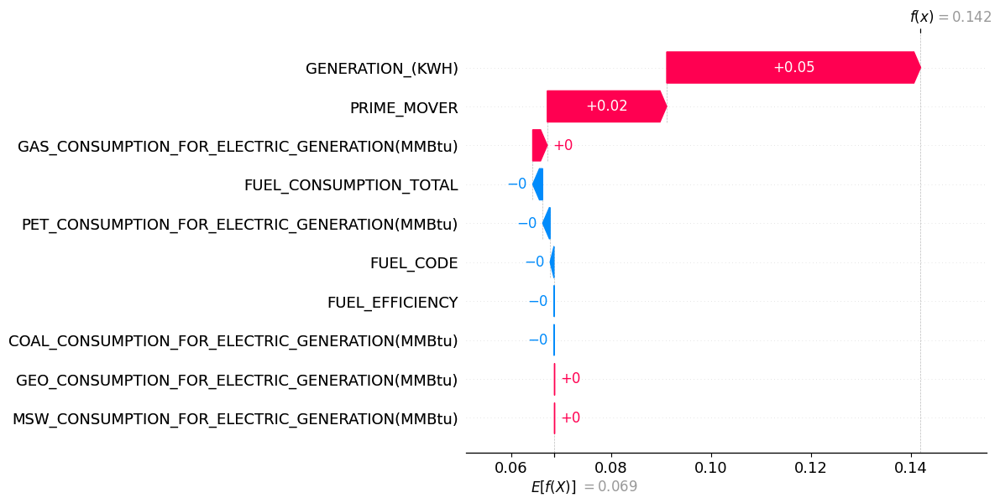

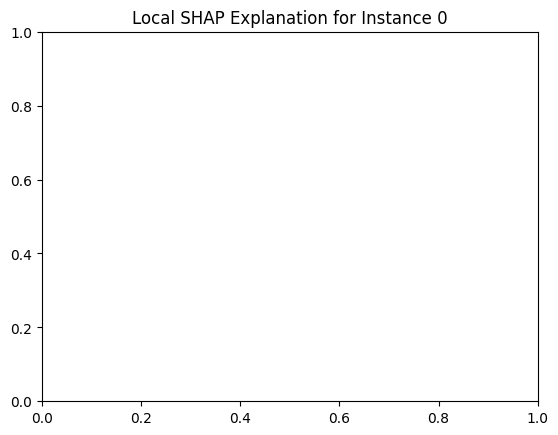

In [ ]:
# Example: Visualize SHAP values for the first instance
instance_index = 0  # Change this index to visualize other instances
shap_values = results_df.iloc[instance_index]['SHAP Values']
feature_names = results_df.iloc[instance_index]['Feature Names']
explainer = results_df.iloc[instance_index]['Explainer']  # Access the explainer object

# Create a SHAP Explanation object
explanation = shap.Explanation(
    values=shap_values,
    base_values=explainer.expected_value,  # Use the explainer's expected value
    feature_names=feature_names
)

# Plot the SHAP values
shap.waterfall_plot(explanation, max_display=10)
plt.title(f"Local SHAP Explanation for Instance {instance_index}")
plt.show()

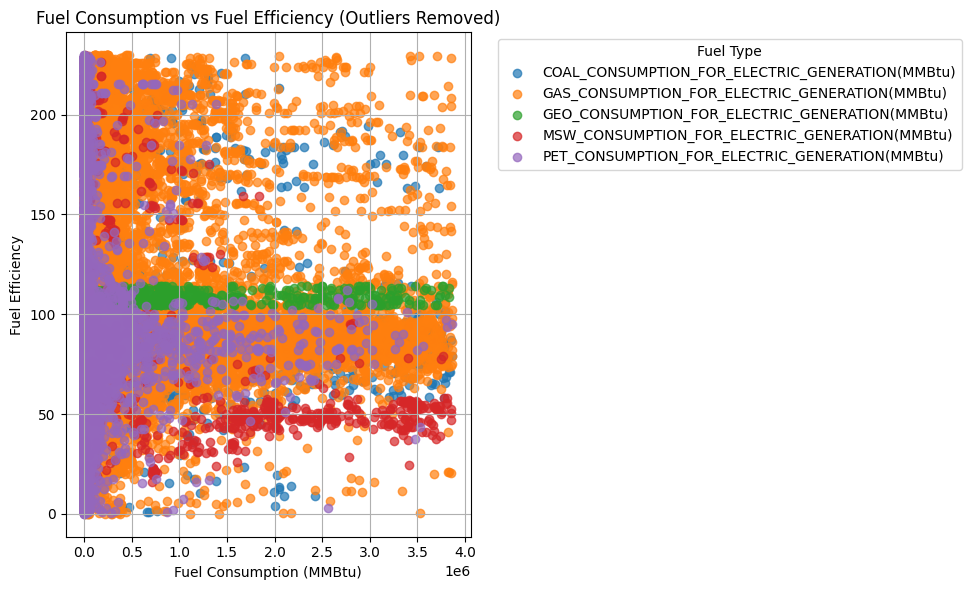

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the cleaned emissions data
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Convert to DataFrame
df = pd.DataFrame(data)

# Melt the DataFrame to long format
fuel_consumption_columns = [
    "GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)"
]

df_melted = df.melt(
    id_vars=["FUEL_EFFICIENCY"],
    value_vars=fuel_consumption_columns,
    var_name="Fuel_Type",
    value_name="Fuel_Consumption"
)

# Drop rows where Fuel_Consumption is 0 (optional, depending on your preference)
df_melted = df_melted[df_melted["Fuel_Consumption"] > 0]

# Remove outliers using IQR
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply IQR filtering to both columns
df_melted_cleaned = df_melted.pipe(remove_outliers_iqr, "Fuel_Consumption").pipe(remove_outliers_iqr, "FUEL_EFFICIENCY")

# Plot the cleaned data
plt.figure(figsize=(10, 6))
for fuel_type, group in df_melted_cleaned.groupby("Fuel_Type"):
    plt.scatter(group["Fuel_Consumption"], group["FUEL_EFFICIENCY"], label=fuel_type, alpha=0.7)

# Add labels and title
plt.xlabel("Fuel Consumption (MMBtu)")
plt.ylabel("Fuel Efficiency")
plt.title("Fuel Consumption vs Fuel Efficiency (Outliers Removed)")
plt.legend(title="Fuel Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-58-5c0e671e58e4>:47: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_melted_cleaned.groupby(["Fuel_Type", "Fuel_Consumption_Bin"])["FUEL_EFFICIENCY"].mean().reset_index()


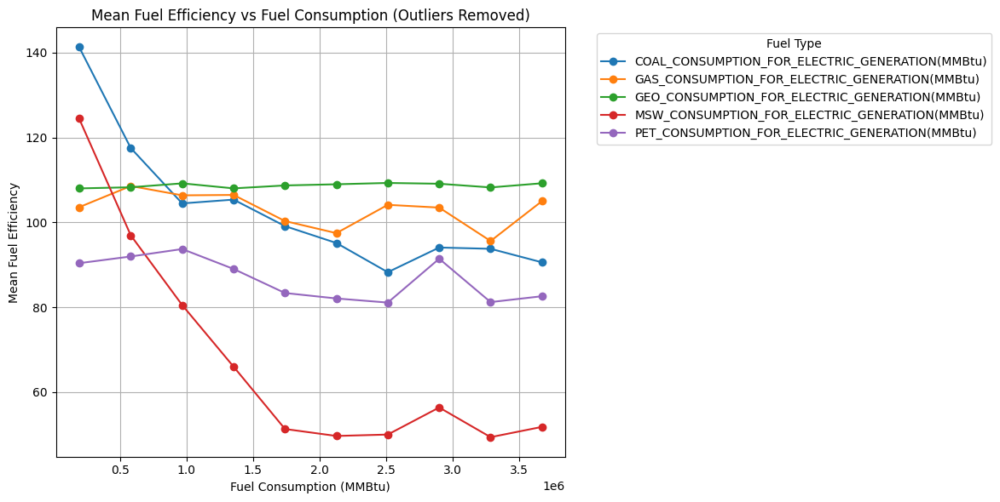

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the cleaned emissions data
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Convert to DataFrame
df = pd.DataFrame(data)

# Melt the DataFrame to long format
fuel_consumption_columns = [
    "GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)"
]

df_melted = df.melt(
    id_vars=["FUEL_EFFICIENCY"],
    value_vars=fuel_consumption_columns,
    var_name="Fuel_Type",
    value_name="Fuel_Consumption"
)

# Drop rows where Fuel_Consumption is 0 (optional, depending on your preference)
df_melted = df_melted[df_melted["Fuel_Consumption"] > 0]

# Remove outliers using IQR
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply IQR filtering to both columns
df_melted_cleaned = df_melted.pipe(remove_outliers_iqr, "Fuel_Consumption").pipe(remove_outliers_iqr, "FUEL_EFFICIENCY")

# Define bins for Fuel_Consumption
num_bins = 10  # Number of intervals
df_melted_cleaned["Fuel_Consumption_Bin"] = pd.cut(df_melted_cleaned["Fuel_Consumption"], bins=num_bins)

# Group by Fuel_Type and Fuel_Consumption_Bin, then calculate mean FUEL_EFFICIENCY
grouped = df_melted_cleaned.groupby(["Fuel_Type", "Fuel_Consumption_Bin"])["FUEL_EFFICIENCY"].mean().reset_index()

# Extract midpoints of bins for plotting
grouped["Fuel_Consumption_Midpoint"] = grouped["Fuel_Consumption_Bin"].apply(lambda x: x.mid)

# Plotting
plt.figure(figsize=(12, 6))
for fuel_type, group in grouped.groupby("Fuel_Type"):
    plt.plot(group["Fuel_Consumption_Midpoint"], group["FUEL_EFFICIENCY"], label=fuel_type, marker='o')

# Add labels and title
plt.xlabel("Fuel Consumption (MMBtu)")
plt.ylabel("Mean Fuel Efficiency")
plt.title("Mean Fuel Efficiency vs Fuel Consumption (Outliers Removed)")
plt.legend(title="Fuel Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-62-dc8b58f70215>:47: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_melted_cleaned.groupby(["Fuel_Type", "Fuel_Consumption_Bin"])["GENERATION_(KWH)"].mean().reset_index()


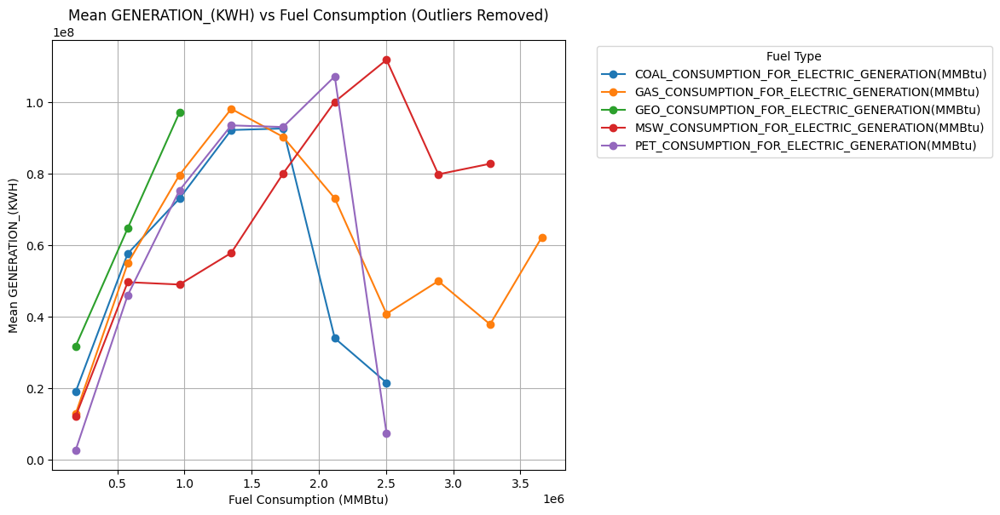

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the cleaned emissions data
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Convert to DataFrame
df = pd.DataFrame(data)

# Melt the DataFrame to long format
fuel_consumption_columns = [
    "GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)"
]

df_melted = df.melt(
    id_vars=["GENERATION_(KWH)"],
    value_vars=fuel_consumption_columns,
    var_name="Fuel_Type",
    value_name="Fuel_Consumption"
)

# Drop rows where Fuel_Consumption is 0 (optional, depending on your preference)
df_melted = df_melted[df_melted["Fuel_Consumption"] > 0]

# Remove outliers using IQR
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply IQR filtering to both columns
df_melted_cleaned = df_melted.pipe(remove_outliers_iqr, "Fuel_Consumption").pipe(remove_outliers_iqr, "GENERATION_(KWH)")

# Define bins for Fuel_Consumption
num_bins = 10  # Number of intervals
df_melted_cleaned["Fuel_Consumption_Bin"] = pd.cut(df_melted_cleaned["Fuel_Consumption"], bins=num_bins)

# Group by Fuel_Type and Fuel_Consumption_Bin, then calculate mean FUEL_EFFICIENCY
grouped = df_melted_cleaned.groupby(["Fuel_Type", "Fuel_Consumption_Bin"])["GENERATION_(KWH)"].mean().reset_index()

# Extract midpoints of bins for plotting
grouped["Fuel_Consumption_Midpoint"] = grouped["Fuel_Consumption_Bin"].apply(lambda x: x.mid)

# Plotting
plt.figure(figsize=(12, 6))
for fuel_type, group in grouped.groupby("Fuel_Type"):
    plt.plot(group["Fuel_Consumption_Midpoint"], group["GENERATION_(KWH)"], label=fuel_type, marker='o')

# Add labels and title
plt.xlabel("Fuel Consumption (MMBtu)")
plt.ylabel("Mean GENERATION_(KWH)")
plt.title("Mean GENERATION_(KWH) vs Fuel Consumption (Outliers Removed)")
plt.legend(title="Fuel Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-60-ffcbab761716>:47: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_melted_cleaned.groupby(["Fuel_Type", "Fuel_Consumption_Bin"])["CARBON_INTENSITY"].mean().reset_index()


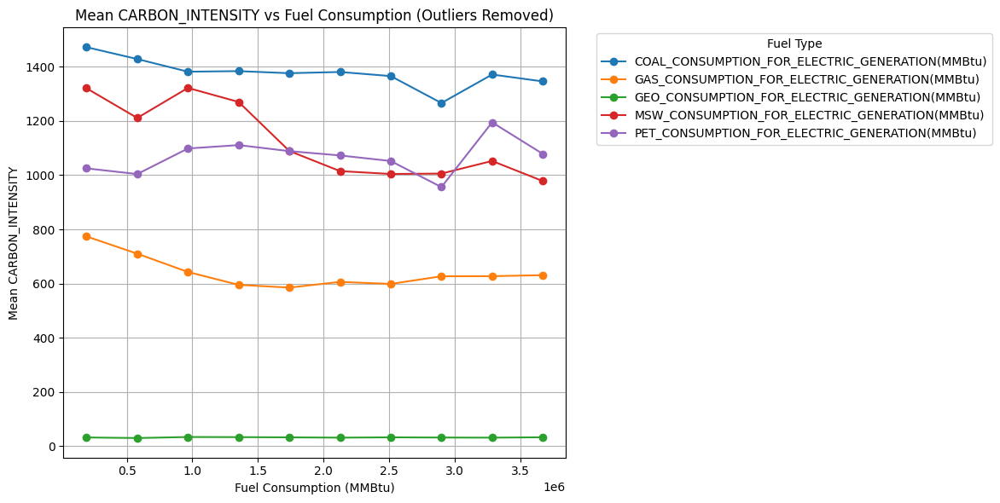

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the cleaned emissions data
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Convert to DataFrame
df = pd.DataFrame(data)

# Melt the DataFrame to long format
fuel_consumption_columns = [
    "GAS_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "COAL_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "PET_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "GEO_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)",
    "MSW_CONSUMPTION_FOR_ELECTRIC_GENERATION(MMBtu)"
]
df["CARBON_INTENSITY"]=df["CARBON_INTENSITY"] * 1e6
df_melted = df.melt(
    id_vars=["CARBON_INTENSITY"],
    value_vars=fuel_consumption_columns,
    var_name="Fuel_Type",
    value_name="Fuel_Consumption"
)

# Drop rows where Fuel_Consumption is 0 (optional, depending on your preference)
df_melted = df_melted[df_melted["Fuel_Consumption"] > 0]

# Remove outliers using IQR
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply IQR filtering to both columns
df_melted_cleaned = df_melted.pipe(remove_outliers_iqr, "Fuel_Consumption").pipe(remove_outliers_iqr, "CARBON_INTENSITY")

# Define bins for Fuel_Consumption
num_bins = 10  # Number of intervals
df_melted_cleaned["Fuel_Consumption_Bin"] = pd.cut(df_melted_cleaned["Fuel_Consumption"], bins=num_bins)

# Group by Fuel_Type and Fuel_Consumption_Bin, then calculate mean FUEL_EFFICIENCY
grouped = df_melted_cleaned.groupby(["Fuel_Type", "Fuel_Consumption_Bin"])["CARBON_INTENSITY"].mean().reset_index()

# Extract midpoints of bins for plotting
grouped["Fuel_Consumption_Midpoint"] = grouped["Fuel_Consumption_Bin"].apply(lambda x: x.mid)

# Plotting
plt.figure(figsize=(12, 6))
for fuel_type, group in grouped.groupby("Fuel_Type"):
    plt.plot(group["Fuel_Consumption_Midpoint"], group["CARBON_INTENSITY"], label=fuel_type, marker='o')

# Add labels and title
plt.xlabel("Fuel Consumption (MMBtu)")
plt.ylabel("Mean CARBON_INTENSITY")
plt.title("Mean CARBON_INTENSITY vs Fuel Consumption (Outliers Removed)")
plt.legend(title="Fuel Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-66-a0878e6a86fd>:32: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_cleaned.groupby("CARBON_INTENSITY_Bin")["FUEL_EFFICIENCY"].mean().reset_index()


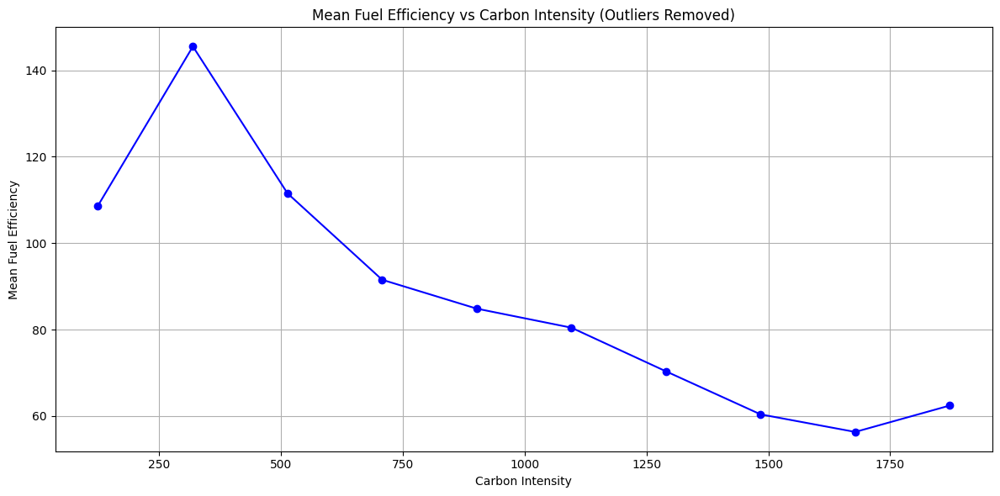

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the cleaned emissions data
file_path = '/content/drive/MyDrive/cleaned_emissions_data.csv'
data = pd.read_csv(file_path)

# Convert to DataFrame
df = pd.DataFrame(data)
df["CARBON_INTENSITY"]=df["CARBON_INTENSITY"] * 1e6
# Select relevant columns for analysis
df_relevant = df[["CARBON_INTENSITY", "FUEL_EFFICIENCY"]]


# Remove outliers using IQR
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply IQR filtering to both columns
df_cleaned = df_relevant.pipe(remove_outliers_iqr, "CARBON_INTENSITY").pipe(remove_outliers_iqr, "FUEL_EFFICIENCY")

# Define bins for CARBON_INTENSITY
num_bins = 10  # Number of intervals
df_cleaned["CARBON_INTENSITY_Bin"] = pd.cut(df_cleaned["CARBON_INTENSITY"], bins=num_bins)

# Group by CARBON_INTENSITY_Bin, then calculate mean FUEL_EFFICIENCY
grouped = df_cleaned.groupby("CARBON_INTENSITY_Bin")["FUEL_EFFICIENCY"].mean().reset_index()

# Extract midpoints of bins for plotting
grouped["CARBON_INTENSITY_Midpoint"] = grouped["CARBON_INTENSITY_Bin"].apply(lambda x: x.mid)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(grouped["CARBON_INTENSITY_Midpoint"], grouped["FUEL_EFFICIENCY"], marker='o', color='b')

# Add labels and title
plt.xlabel("Carbon Intensity")
plt.ylabel("Mean Fuel Efficiency")
plt.title("Mean Fuel Efficiency vs Carbon Intensity (Outliers Removed)")
plt.grid(True)
plt.tight_layout()
plt.show()